### Detecting Near-Duplicates of Scanned Documents with Siamese Network
***
#### _Team Members:_
- Andy Low 
- Jit Sheng Seah 
- Jordan Hua Jun Seow 

## Table of Contents
* [1. Set Up](#chapter1)
    * [1.1 Import Libraries](#section_1_1)
    * [1.2 Data Preparation](#section_1_2)
      * [1.2.1 Siamese Network Dataset](#sub_section_1_2_1)
      * [1.2.2 Contrastive Loss Train-Val Datasets](#sub_section_1_2_2)
      * [1.2.3 Triplet Loss Train-Val Datasets](#sub_section_1_2_3)
      * [1.2.4 Test Dataset](#sub_section_1_2_4)
    * [1.3 Data Visualization](#section_1_3)


* [2. Model](#chapter2)

* [3. Loss Functions](#chapter3)
    * [3.1 Contrastive Loss Function and Triplet Loss Function](#section_3_1)
  
* [4. Model Training](#chapter4)  
    * [4.1 Training Functions](#section_4_1)
    * [4.2 Visualization Functions](#section_4_2)
    * [4.3 Evaluation Functions](#section_4_3)
    * [4.4 Instantiate Dataloaders](#section_4_4)

* [5. Model Results](#chapter5)  
    * [5.1 Siamese Vanilla with Constrastive Loss](#section_5_1)
    * [5.2 Siamese Vanilla with Triplet Loss](#section_5_2)
    * [5.3 Siamese AlexNet with Constrastive Loss](#section_5_3)
    * [5.4 Siamese AlexNet with Triplet Loss](#section_5_4)
    * [5.5 Siamese ResNet with Constrastive Loss](#section_5_5)
    * [5.6 Siamese ResNet with Triplet Loss](#section_5_6)
    * [5.7 Siamese VGGNet with Constrastive Loss](#section_5_7)
    * [5.8 Siamese VGGNet with Triplet Loss](#section_5_8)
    * [5.9 Siamese Barlow Twins with Constrastive Loss](#section_5_9)


* [6. Hyper Parameter Tuning](#chapter6)  
    * [6.1 Contra tune-vanilla](#section_6_1)
    * [6.2 Contra tune-AlexNet](#section_6_2)
    * [6.3 Triplet tune-vanilla](#section_6_3)
    * [6.4 Triplet tune-AlexNet](#section_6_4)

# 1 Set Up <a class="anchor" id="chapter1"></a>

### 1.1 Import Libraries <a class="anchor" id="section_1_1"></a>

In [ ]:
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
import cv2
import os, os.path
import random
import zipfile
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision
import torch.nn.functional as F
from IPython.display import display
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import metrics


from transformation_utils import full_transformations


In [ ]:
random.seed(7643)

In [ ]:
train_dir = "data/train/"
val_dir = "data/validation/"
test_dir = "data/test/"

train_folder_dataset = datasets.ImageFolder(root=train_dir)
val_folder_dataset = datasets.ImageFolder(root=val_dir)
test_folder_dataset = datasets.ImageFolder(root=test_dir)

# Resize the images and transform to tensors
transformation = transforms.Compose([transforms.Resize((100,100)),
                                     transforms.ToTensor()
                                    ])

### 1.2 Data Preparation <a class="anchor" id="section_1_2"></a>
This section is where we handle our different data loaders

#### 1.2.1 Siamese Network Dataset <a class="anchor" id="sub_section_1_2_1"></a>
Creating the train-val-test data set required for siamese networks

In [ ]:
from generated_dataset.siamesenetwork_datasets import SiameseNetworkDataset, SiameseTripletNetworkDataset, SiameseNetworkTestDataset

#### 1.2.2 Contrastive Loss Train-Val Datasets <a class="anchor" id="sub_section_1_2_2"></a>


In [ ]:
# create train dataset
train_siamese_dataset = SiameseNetworkDataset(imageFolderDataset=train_folder_dataset,
                                        transform=transformation)

100%|██████████| 300/300 [00:16<00:00, 18.34it/s]


In [ ]:
# create val dataset
val_siamese_dataset = SiameseNetworkDataset(imageFolderDataset=val_folder_dataset,
                                        transform=transformation)

100%|██████████| 150/150 [00:07<00:00, 20.88it/s]


#### 1.2.3 Triplet Loss Train-Val Datasets <a class="anchor" id="sub_section_1_2_3"></a>

In [ ]:
# create train dataset
train_siamese_triplet_dataset = SiameseTripletNetworkDataset(imageFolderDataset=train_folder_dataset,
                                        transform=transformation)

100%|██████████| 300/300 [00:31<00:00,  9.48it/s]


In [ ]:
# create val dataset
val_siamese_triplet_dataset = SiameseTripletNetworkDataset(imageFolderDataset=val_folder_dataset,
                                        transform=transformation)

100%|██████████| 150/150 [00:16<00:00,  8.87it/s]


#### 1.2.4 Test Dataset <a class="anchor" id="sub_section_1_2_4"></a>

In [ ]:
# create test dataset
test_siamese_dataset = SiameseNetworkTestDataset(imageFolderDataset=test_folder_dataset,
                                        transform=transformation)

100%|██████████| 125/125 [00:18<00:00,  6.94it/s]


### 1.3 Data Visualization <a class="anchor" id="section_1_3"></a>

In [ ]:
def imshow(img, text=None):
    plt.axis("off")

    if text:
        plt.text(0.5, 0.05, text, transform=plt.gca().transAxes, ha='center', style='italic', fontweight='bold',
                 bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 10})

    plt.imshow(img.permute(1, 2, 0).numpy())
    plt.show()

def show_plot(iteration,train_loss, val_loss=None):
    if val_loss == None:
        plt.plot(iteration,train_loss, label ='train')
        plt.show()
    else:
        plt.plot(iteration,train_loss, label ='train')
        plt.plot(iteration,val_loss, label ='val')
        plt.legend()
        plt.show()

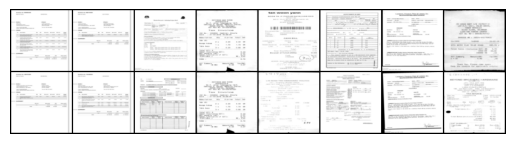

[0. 0. 0. 1. 0. 0. 1. 0.]


In [ ]:
# Create a simple dataloader just for simple visualization
vis_dataloader = DataLoader(train_siamese_dataset,
                        shuffle=True,
                        batch_size=8)

# Extract one batch as example
example_batch = next(iter(vis_dataloader))

concatenated = torch.cat((example_batch[0], example_batch[1]),0)

imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy().reshape(-1))

# 2 Model<a class="anchor" id="chapter2"></a>

In [ ]:
from models.siamese_vanilla import SiameseNetwork
from models.siamese_alexnet import SiameseNetworkAlexNet
from models.siamese_resnet import SiameseResNet
from models.siamese_vgg import SiameseVGG16
from models.siamese_barlowtwin import SiameseNetworkBarlowTwins

# 3 Loss Functions <a class="anchor" id="chapter3"></a>

### 3.1 Contrastive Loss Function and Triplet Loss Function <a class="anchor" id="section_3_1"></a>

In [ ]:
from lossfunctions import ContrastiveLoss, TripletLoss

# 4 Model Training <a class="anchor" id="chapter4"></a>

### 4.1 Training Functions <a class="anchor" id="section_4_1"></a>

In [ ]:
def validate_model(siamese_net, val_dataloader, criterion, loss_function="", train_type=""):
    total_val_loss = 0.0
    if loss_function == "triplet":
        with torch.no_grad():
            for i, (img1_val, img2_val, img3_val) in enumerate(val_dataloader, 0):
                img1_val, img2_val, img3_val = img1_val.cuda(), img2_val.cuda(), img3_val.cuda()

                output1_val, output2_val, output3_val = siamese_net(img1_val, img2_val, img3_val)
                val_loss = criterion(output1_val, output2_val, output3_val)
                total_val_loss += val_loss.item()
    else:
        with torch.no_grad():
            for i, (img1_val, img2_val, label_val) in enumerate(val_dataloader, 0):
                img1_val, img2_val, label_val = img1_val.cuda(), img2_val.cuda(), label_val.cuda()

                if train_type == "barlow":
                    output1_val, output2_val,_,_ = siamese_net(img1_val, img2_val)
                else:
                    output1_val, output2_val = siamese_net(img1_val, img2_val)
                val_loss = criterion(output1_val, output2_val, label_val)
                total_val_loss += val_loss.item()

    return total_val_loss / len(val_dataloader)

In [ ]:
def train_siamese_network(siamese_net, train_dataloader, val_dataloader, num_epochs=10, learning_rate=0.001, weight_decay=0, margin_value=2.0, loss_function=""):
    counter = []
    train_loss_history = []
    val_loss_history = []
    iteration_number = 0

    siamese_net.cuda()

    if loss_function == "triplet":
        criterion = TripletLoss(margin=margin_value).cuda()
    else:
        criterion = ContrastiveLoss(margin=margin_value).cuda()

    optimizer = optim.Adam(siamese_net.parameters(), lr=learning_rate, weight_decay=weight_decay)

    for epoch in range(num_epochs):
        total_loss = 0.0
        if loss_function == "triplet":
            siamese_net.train()
            for i, (img1, img2, img3) in enumerate(train_dataloader, 0):
                img1,img2,img3 = img1.cuda(), img2.cuda(), img3.cuda()
                optimizer.zero_grad()
                #anchor, positive, negative
                output1,output2,output3 = siamese_net(img1,img2,img3)
                loss = criterion(output1,output2,output3)
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

            iteration_number += 1
            avg_loss = total_loss / len(train_dataloader)
            counter.append(iteration_number)
            train_loss_history.append(avg_loss)

            # validation loss
            siamese_net.eval()  # Set the model to evaluation mode
            val_loss = validate_model(siamese_net, val_dataloader, criterion, loss_function)
            val_loss_history.append(val_loss)

        else:
            for i, (img1, img2, label) in enumerate(train_dataloader, 0):
                img1, img2, label = img1.cuda(), img2.cuda(), label.cuda()
                optimizer.zero_grad()

                output1, output2 = siamese_net(img1, img2)
                loss = criterion(output1, output2, label)
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

            iteration_number += 1
            counter.append(iteration_number)

            avg_loss = total_loss / len(train_dataloader)
            train_loss_history.append(avg_loss)

            # validation loss
            siamese_net.eval()  # Set the model to evaluation mode
            val_loss = validate_model(siamese_net, val_dataloader, criterion, loss_function)
            val_loss_history.append(val_loss)

        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_loss}, Val Loss: {val_loss}")

    if loss_function == "triplet":
        show_plot(counter, train_loss_history, val_loss_history)
        return val_loss_history[-1]
    else:
        show_plot(counter, train_loss_history, val_loss_history)
        return val_loss_history[-1]

In [ ]:
def train_siamese_network_barlowtwins(siamese_net, train_dataloader, val_dataloader, num_epochs=10, learning_rate=0.001, alpha=1.0, beta=1e-3):
    counter = []
    loss_history = []
    val_loss_history = []
    iteration_number = 0

    siamese_net.cuda()

    lambd = 3.9e-3

    criterion = ContrastiveLoss().cuda()
    optimizer = optim.Adam(siamese_net.parameters(), lr=learning_rate)

    for epoch in range(num_epochs):
        total_loss = 0.0
        for i, (img1, img2, label) in enumerate(train_dataloader, 0):
            img1, img2, label = img1.cuda(), img2.cuda(), label.cuda()
            optimizer.zero_grad()

            output1, output2, z1, z2 = siamese_net(img1, img2)
            # Calculate the Barlow Twins loss
            c = F.cosine_similarity(z1, z2)
            on_diag = (c.mean() - 1).pow(2)
            off_diag = c.pow(2).mean()
            loss = on_diag + lambd * off_diag

            contrastive_loss_value = criterion(output1, output2, label)
            loss += alpha * contrastive_loss_value

            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        iteration_number += 1
        counter.append(iteration_number)
        loss_history.append(total_loss / len(train_dataloader))

        # validation loss
        siamese_net.eval()  # Set the model to evaluation mode
        val_loss = validate_model(siamese_net, val_dataloader, criterion, train_type="barlow")
        val_loss_history.append(val_loss)

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss / len(train_dataloader)}, Val Loss: {val_loss}")

    show_plot(counter, loss_history, val_loss_history)
    return total_loss / len(train_dataloader)

### 4.2 Visualization Functions <a class="anchor" id="section_4_2"></a>

In [ ]:
from generated_dataset.siamesenetwork_datasets import SiameseNetworkDatasetVisualization

# Observe Dupes transformed
siamese_dataset_validation = SiameseNetworkDatasetVisualization(imageFolderDataset=val_folder_dataset,choice=0,transform=transformation)
val_dataloader = DataLoader(siamese_dataset_validation, batch_size=1, shuffle=True)
dataiter_1 = iter(val_dataloader)

# non-dupes (same class)
siamese_dataset_validation = SiameseNetworkDatasetVisualization(imageFolderDataset=val_folder_dataset,choice=1,transform=transformation)
val_dataloader = DataLoader(siamese_dataset_validation, batch_size=1, shuffle=True)
dataiter_2 = iter(val_dataloader)

# non-dupes (diff class)
siamese_dataset_validation = SiameseNetworkDatasetVisualization(imageFolderDataset=val_folder_dataset,choice=2,transform=transformation)
val_dataloader = DataLoader(siamese_dataset_validation, batch_size=1, shuffle=True)
dataiter_3 = iter(val_dataloader)


In [ ]:
def visualize_val_dissimilarity(siamese_model, dataiter, num_docs=10):
    i = 0
    while i < num_docs:
        x0, x1, label = next(dataiter)
        # Concatenate the two images together
        concatenated = torch.cat((x0, x1), 0)
        output1, output2 = siamese_model(x0.cuda(), x1.cuda())
        euclidean_distance = F.pairwise_distance(output1, output2)
        imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')
        i += 1

### 4.3 Evaluation Functions <a class="anchor" id="section_4_3"></a>

In [ ]:
def find_evaluation_metrics(siamese_net, test_dataloader, threshold, model_type=""):
    all_true_y = []
    all_predicted_y = []

    for choice_data in tqdm(test_dataloader):
        true_y = []
        predicted_y = []
        for x0, x1, label in choice_data:
            if model_type=="barlow":
                output1, output2,_,_ = siamese_net(x0.cuda(), x1.cuda())
            else:
                output1, output2 = siamese_net(x0.cuda(), x1.cuda())
            euclidean_distance = F.pairwise_distance(output1, output2)
            if euclidean_distance.item() < threshold: # predicted duplicate
                true_y.append(label.item())
                predicted_y.append(1.)
            else:
                true_y.append(label.item())
                predicted_y.append(0.)

        all_true_y.extend(true_y)
        all_predicted_y.extend(predicted_y)

    accuracy = accuracy_score(all_true_y, all_predicted_y)
    precision = precision_score(all_true_y, all_predicted_y)
    recall = recall_score(all_true_y, all_predicted_y)
    f1 = f1_score(all_true_y, all_predicted_y)

    return accuracy, precision, recall, f1

def find_optimized_threshold(siamese_net,test_dataloader, max_threshold=2, model_type=""):
    threshold = 0.01
    optimized_threshold = None
    prev_threshold = float('inf ')
    best_metric = float('-inf')
    all_accuracy = []
    all_f1 = []
    while threshold < max_threshold:
        accuracy, precision,recall,f1 = find_evaluation_metrics(siamese_net,test_dataloader, threshold, model_type=model_type)
        print(f"accuracy:{accuracy}, precision:{precision}, recall:{recall}, f1:{f1}")
        all_accuracy.append(accuracy)
        all_f1.append(f1)
        if accuracy >= best_metric:
            best_metric = accuracy
            optimized_threshold = threshold
        threshold += 0.01
        print(f"Current threshold:{threshold}, Best threshold:{optimized_threshold:.4f}")
    return optimized_threshold, all_accuracy, all_f1

In [ ]:
def evaluate_model(siamese_net, test_dataloader, threshold=0.02, model_type=""):
    all_true_y = []
    all_predicted_y = []

    for choice_data in tqdm(test_dataloader):
        true_y = []
        predicted_y = []
        for x0, x1, label in choice_data:
            if model_type=="barlow":
                output1, output2,_,_ = siamese_net(x0.cuda(), x1.cuda())
            else:
                output1, output2 = siamese_net(x0.cuda(), x1.cuda())
            euclidean_distance = F.pairwise_distance(output1, output2)
            if euclidean_distance.item() < threshold: # predicted duplicate
                true_y.append(label.item())
                predicted_y.append(1.)
            else:
                true_y.append(label.item())
                predicted_y.append(0.)

        all_true_y.extend(true_y)
        all_predicted_y.extend(predicted_y)

    accuracy = accuracy_score(all_true_y, all_predicted_y)
    precision = precision_score(all_true_y, all_predicted_y)
    recall = recall_score(all_true_y, all_predicted_y)
    f1 = f1_score(all_true_y, all_predicted_y)

    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")
    confusion_matrix = metrics.confusion_matrix(all_true_y, all_predicted_y)
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ["Non-Duplicate", "Duplicate"])
    cm_display.plot()
    plt.show()

### 4.4 Instantiate Dataloaders <a class="anchor" id="section_4_4"></a>

In [ ]:
# Load the contrastive dataloader
train_dataloader = DataLoader(train_siamese_dataset,
                        shuffle=True,
                        batch_size=8)

val_dataloader = DataLoader(val_siamese_dataset,
                        shuffle=True,
                        batch_size=8)

# Load the triplet dataloader
train_dataloader_triplet = DataLoader(train_siamese_triplet_dataset,
                        shuffle=True,
                        batch_size=8)

val_dataloader_triplet = DataLoader(train_siamese_triplet_dataset,
                        shuffle=True,
                        batch_size=8)

# Load the test dataloader
test_dataloader = DataLoader(test_siamese_dataset,
                        shuffle=False,
                        batch_size=1)

# 5 Model Results

### 5.1 Siamese Vanilla with Contrastive Loss <a class="anchor" id="section_5_1"></a>

Epoch 1/40, Train Loss: 0.7492379701411429, Val Loss: 0.8936005036208957
Epoch 2/40, Train Loss: 0.747951531621326, Val Loss: 0.8746665333818974
Epoch 3/40, Train Loss: 0.7458392502159384, Val Loss: 0.8641017378026605
Epoch 4/40, Train Loss: 0.7427964357056178, Val Loss: 0.869028974934305
Epoch 5/40, Train Loss: 0.7243550279406343, Val Loss: 0.8635037652834159
Epoch 6/40, Train Loss: 0.7160049632280119, Val Loss: 0.8701909011104266
Epoch 7/40, Train Loss: 0.7018755441328578, Val Loss: 0.8429347321216483
Epoch 8/40, Train Loss: 0.6909922683078452, Val Loss: 0.7993211157613827
Epoch 9/40, Train Loss: 0.6645874166922447, Val Loss: 0.7786912955588808
Epoch 10/40, Train Loss: 0.5982266798076269, Val Loss: 0.717565095199174
Epoch 11/40, Train Loss: 0.5415175850380605, Val Loss: 0.6588101133115982
Epoch 12/40, Train Loss: 0.48831011048567136, Val Loss: 0.6190698478174838
Epoch 13/40, Train Loss: 0.44783964015445427, Val Loss: 0.6028665444372516
Epoch 14/40, Train Loss: 0.4176618122054558, Val

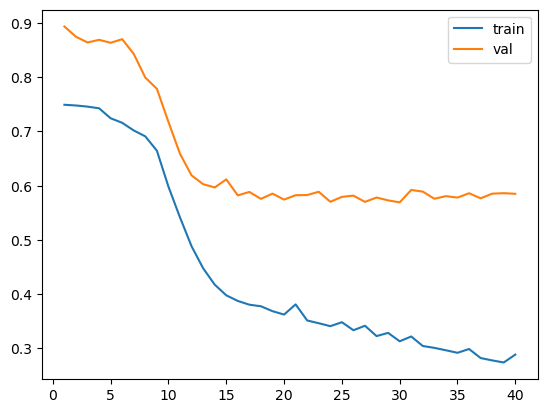

0.585105694046146

In [ ]:
siamese_vanilla = SiameseNetwork()
train_siamese_network(siamese_vanilla, train_dataloader, val_dataloader, num_epochs=40, learning_rate=0.00001)

In [ ]:
torch.save(siamese_vanilla.state_dict(), 'siamese_vanilla.pt')

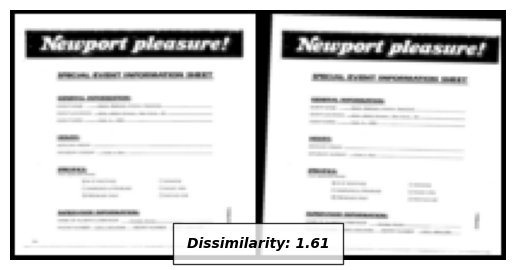

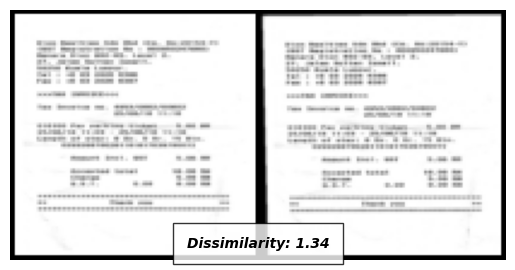

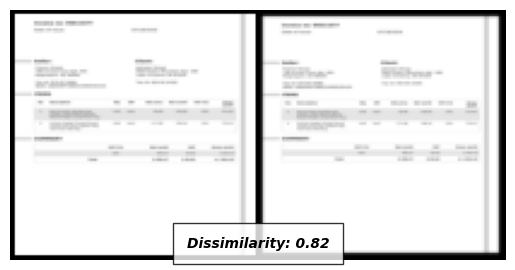

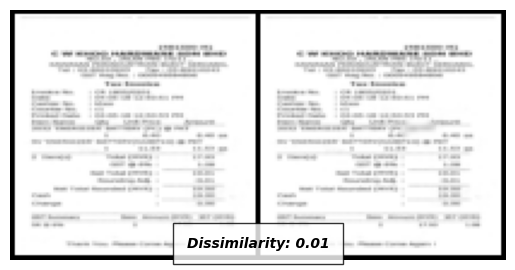

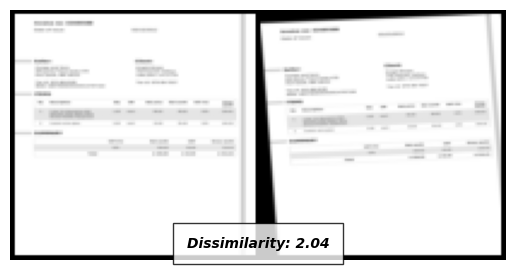

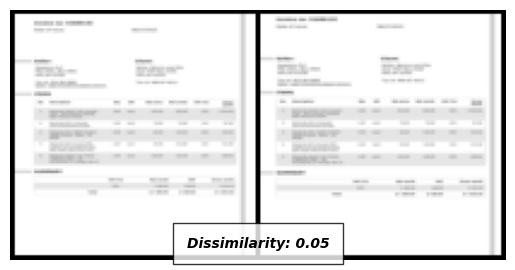

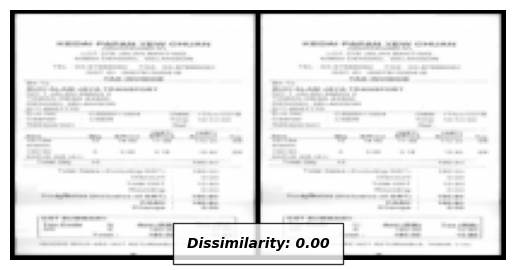

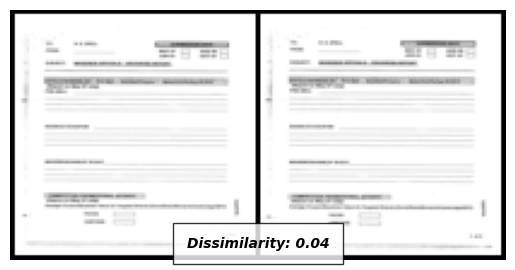

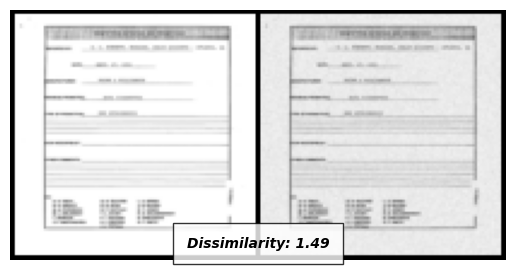

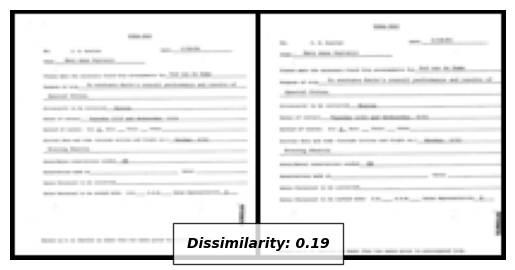

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_vanilla, dataiter_1, 10)

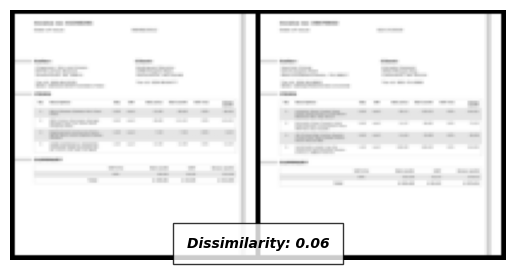

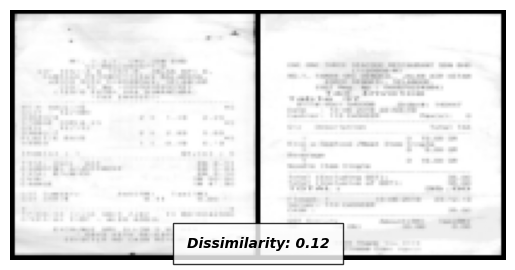

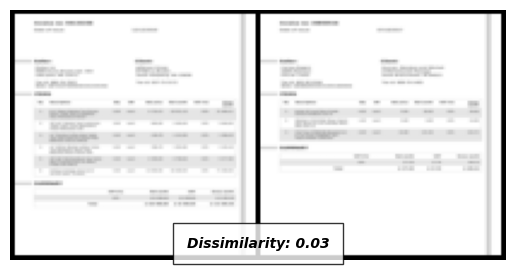

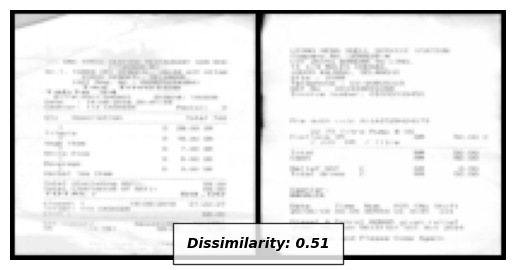

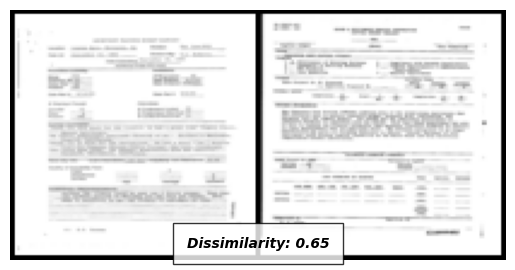

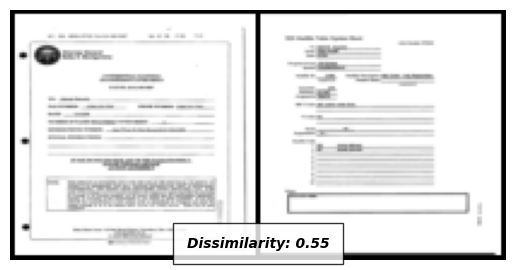

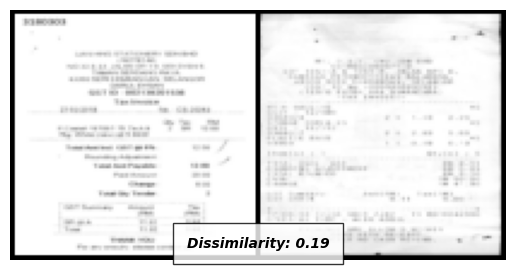

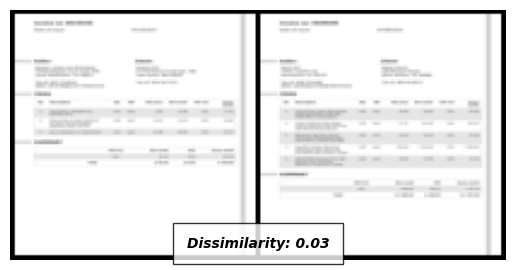

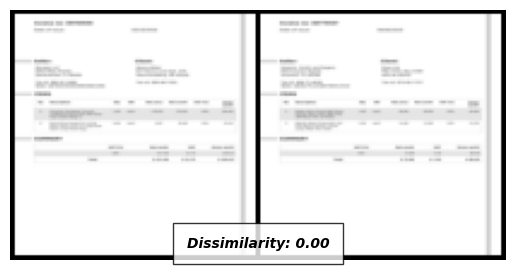

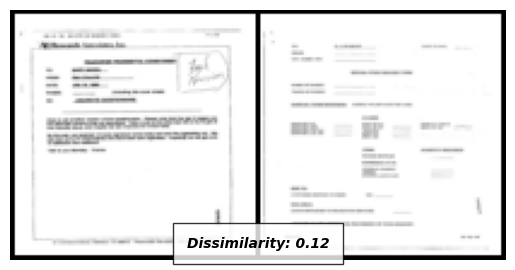

In [ ]:
#non dupes(same class)
visualize_val_dissimilarity(siamese_vanilla , dataiter_2, 10)

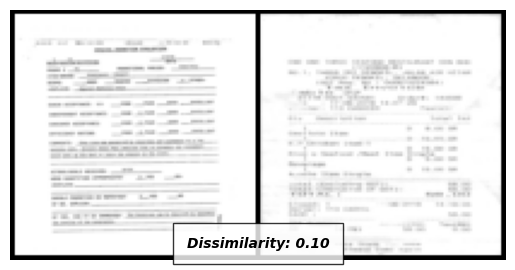

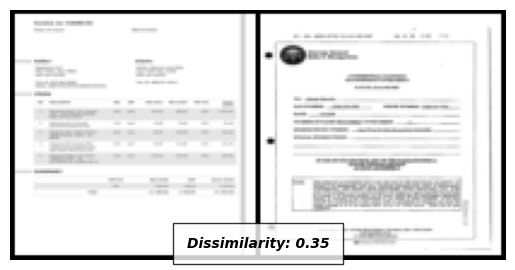

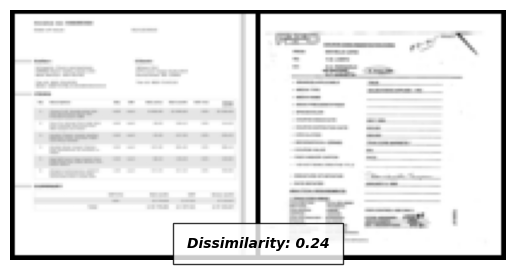

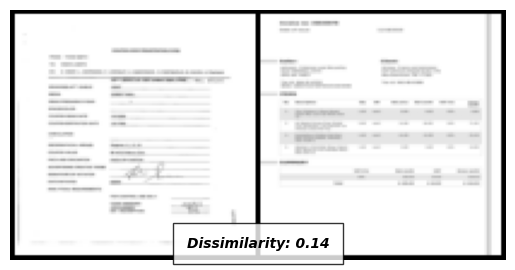

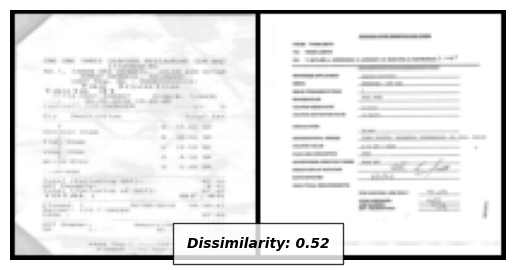

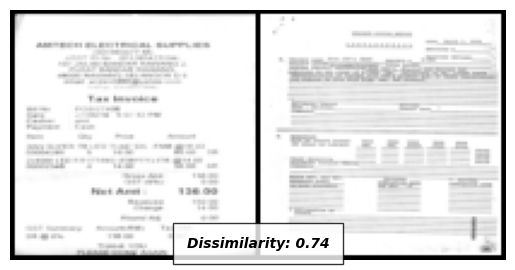

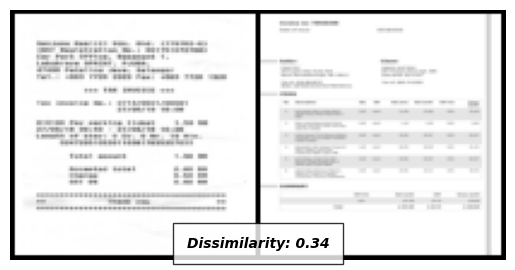

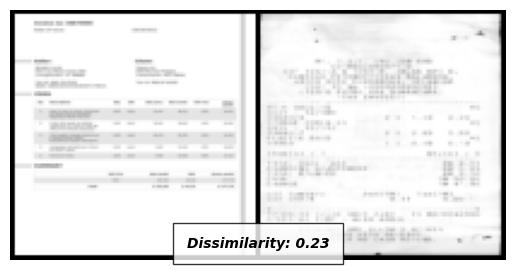

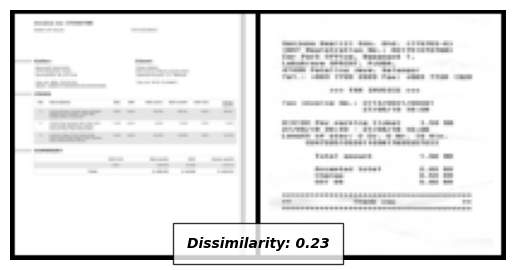

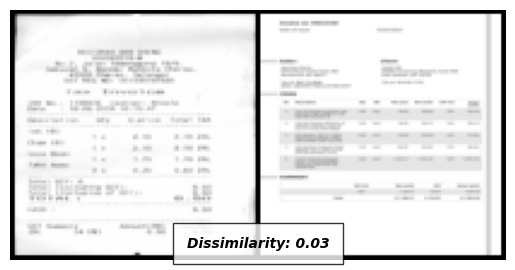

In [ ]:
#non dupes(different class)
visualize_val_dissimilarity(siamese_vanilla, dataiter_3, 10)

In [ ]:
optimized_threshold_vanilla, acc, f1 = find_optimized_threshold(siamese_vanilla, test_dataloader)

100%|██████████| 125/125 [00:00<00:00, 192.44it/s]


accuracy:0.712, precision:0.8695652173913043, recall:0.16, f1:0.2702702702702703
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.72, precision:0.7941176470588235, recall:0.216, f1:0.33962264150943394
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.7146666666666667, precision:0.6956521739130435, recall:0.256, f1:0.37426900584795325
Current threshold:0.04, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.6933333333333334, precision:0.5925925925925926, recall:0.256, f1:0.3575418994413408
Current threshold:0.05, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.656, precision:0.4714285714285714, recall:0.264, f1:0.3384615384615385
Current threshold:0.060000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6293333333333333, precision:0.4146341463414634, recall:0.272, f1:0.3285024154589372
Current threshold:0.07, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.6, precision:0.3684210526315789, recall:0.28, f1:0.3181818181818182
Current threshold:0.08, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.584, precision:0.3523809523809524, recall:0.296, f1:0.3217391304347826
Current threshold:0.09, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.552, precision:0.3162393162393162, recall:0.296, f1:0.3057851239669421
Current threshold:0.09999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.5306666666666666, precision:0.2992125984251969, recall:0.304, f1:0.3015873015873016
Current threshold:0.10999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.52, precision:0.2900763358778626, recall:0.304, f1:0.296875
Current threshold:0.11999999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.5013333333333333, precision:0.2753623188405797, recall:0.304, f1:0.2889733840304183
Current threshold:0.12999999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.48533333333333334, precision:0.2638888888888889, recall:0.304, f1:0.2825278810408922
Current threshold:0.13999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.4693333333333333, precision:0.25333333333333335, recall:0.304, f1:0.27636363636363637
Current threshold:0.15, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.448, precision:0.24050632911392406, recall:0.304, f1:0.26855123674911663
Current threshold:0.16, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.42933333333333334, precision:0.23030303030303031, recall:0.304, f1:0.2620689655172414
Current threshold:0.17, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4266666666666667, precision:0.2289156626506024, recall:0.304, f1:0.26116838487972505
Current threshold:0.18000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.4186666666666667, precision:0.22485207100591717, recall:0.304, f1:0.2585034013605443
Current threshold:0.19000000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.408, precision:0.22598870056497175, recall:0.32, f1:0.26490066225165565
Current threshold:0.20000000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.3893333333333333, precision:0.21739130434782608, recall:0.32, f1:0.2588996763754045
Current threshold:0.21000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.38133333333333336, precision:0.21390374331550802, recall:0.32, f1:0.2564102564102564
Current threshold:0.22000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.37866666666666665, precision:0.2127659574468085, recall:0.32, f1:0.25559105431309903
Current threshold:0.23000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.37333333333333335, precision:0.21052631578947367, recall:0.32, f1:0.25396825396825395
Current threshold:0.24000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.368, precision:0.20833333333333334, recall:0.32, f1:0.25236593059936907
Current threshold:0.25000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.36533333333333334, precision:0.20725388601036268, recall:0.32, f1:0.25157232704402516
Current threshold:0.26000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.35733333333333334, precision:0.20408163265306123, recall:0.32, f1:0.24922118380062305
Current threshold:0.2700000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.3546666666666667, precision:0.20304568527918782, recall:0.32, f1:0.2484472049689441
Current threshold:0.2800000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.3546666666666667, precision:0.20304568527918782, recall:0.32, f1:0.2484472049689441
Current threshold:0.2900000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.352, precision:0.205, recall:0.328, f1:0.2523076923076923
Current threshold:0.3000000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.3413333333333333, precision:0.20098039215686275, recall:0.328, f1:0.2492401215805471
Current threshold:0.3100000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.16it/s]


accuracy:0.336, precision:0.20192307692307693, recall:0.336, f1:0.25225225225225223
Current threshold:0.3200000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.3253333333333333, precision:0.19811320754716982, recall:0.336, f1:0.24925816023738875
Current threshold:0.3300000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.32, precision:0.19626168224299065, recall:0.336, f1:0.24778761061946905
Current threshold:0.34000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.312, precision:0.1935483870967742, recall:0.336, f1:0.2456140350877193
Current threshold:0.35000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.2986666666666667, precision:0.1891891891891892, recall:0.336, f1:0.24207492795389052
Current threshold:0.36000000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.288, precision:0.18584070796460178, recall:0.336, f1:0.23931623931623933
Current threshold:0.37000000000000016, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.2773333333333333, precision:0.1826086956521739, recall:0.336, f1:0.23661971830985917
Current threshold:0.38000000000000017, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.2773333333333333, precision:0.1826086956521739, recall:0.336, f1:0.23661971830985917
Current threshold:0.3900000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.2693333333333333, precision:0.18025751072961374, recall:0.336, f1:0.2346368715083799
Current threshold:0.4000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.26666666666666666, precision:0.1794871794871795, recall:0.336, f1:0.23398328690807801
Current threshold:0.4100000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.264, precision:0.17872340425531916, recall:0.336, f1:0.23333333333333336
Current threshold:0.4200000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.25333333333333335, precision:0.17573221757322174, recall:0.336, f1:0.23076923076923078
Current threshold:0.4300000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.24266666666666667, precision:0.1728395061728395, recall:0.336, f1:0.22826086956521743
Current threshold:0.4400000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.24266666666666667, precision:0.1728395061728395, recall:0.336, f1:0.22826086956521743
Current threshold:0.45000000000000023, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.24, precision:0.1721311475409836, recall:0.336, f1:0.22764227642276422
Current threshold:0.46000000000000024, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.23733333333333334, precision:0.17142857142857143, recall:0.336, f1:0.22702702702702704
Current threshold:0.47000000000000025, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:0.48000000000000026, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:0.49000000000000027, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.22666666666666666, precision:0.1686746987951807, recall:0.336, f1:0.22459893048128343
Current threshold:0.5000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.22133333333333333, precision:0.16733067729083664, recall:0.336, f1:0.22340425531914893
Current threshold:0.5100000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.22133333333333333, precision:0.16733067729083664, recall:0.336, f1:0.22340425531914893
Current threshold:0.5200000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.216, precision:0.16600790513833993, recall:0.336, f1:0.22222222222222227
Current threshold:0.5300000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.21333333333333335, precision:0.16535433070866143, recall:0.336, f1:0.22163588390501324
Current threshold:0.5400000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.21066666666666667, precision:0.16470588235294117, recall:0.336, f1:0.22105263157894736
Current threshold:0.5500000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.21066666666666667, precision:0.16470588235294117, recall:0.336, f1:0.22105263157894736
Current threshold:0.5600000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.208, precision:0.1640625, recall:0.336, f1:0.22047244094488186
Current threshold:0.5700000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.20533333333333334, precision:0.16342412451361868, recall:0.336, f1:0.21989528795811517
Current threshold:0.5800000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.20266666666666666, precision:0.16279069767441862, recall:0.336, f1:0.2193211488250653
Current threshold:0.5900000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.20266666666666666, precision:0.16538461538461538, recall:0.344, f1:0.22337662337662337
Current threshold:0.6000000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.20266666666666666, precision:0.16538461538461538, recall:0.344, f1:0.22337662337662337
Current threshold:0.6100000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.20266666666666666, precision:0.16793893129770993, recall:0.352, f1:0.22739018087855298
Current threshold:0.6200000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.2, precision:0.16730038022813687, recall:0.352, f1:0.22680412371134018
Current threshold:0.6300000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.2, precision:0.16730038022813687, recall:0.352, f1:0.22680412371134018
Current threshold:0.6400000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.19733333333333333, precision:0.16666666666666666, recall:0.352, f1:0.2262210796915167
Current threshold:0.6500000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.6600000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.6700000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.6800000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.6900000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.56it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.7000000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7100000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7200000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7300000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7400000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7500000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7600000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.192, precision:0.16791044776119404, recall:0.36, f1:0.22900763358778628
Current threshold:0.7700000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.18666666666666668, precision:0.16666666666666666, recall:0.36, f1:0.2278481012658228
Current threshold:0.7800000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.184, precision:0.16605166051660517, recall:0.36, f1:0.22727272727272727
Current threshold:0.7900000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.17866666666666667, precision:0.16483516483516483, recall:0.36, f1:0.22613065326633167
Current threshold:0.8000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.17866666666666667, precision:0.16483516483516483, recall:0.36, f1:0.22613065326633167
Current threshold:0.8100000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.176, precision:0.16423357664233576, recall:0.36, f1:0.2255639097744361
Current threshold:0.8200000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.17333333333333334, precision:0.16363636363636364, recall:0.36, f1:0.22499999999999995
Current threshold:0.8300000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.17333333333333334, precision:0.16363636363636364, recall:0.36, f1:0.22499999999999995
Current threshold:0.8400000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.17066666666666666, precision:0.16304347826086957, recall:0.36, f1:0.22443890274314218
Current threshold:0.8500000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.17066666666666666, precision:0.16304347826086957, recall:0.36, f1:0.22443890274314218
Current threshold:0.8600000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.17333333333333334, precision:0.16606498194945848, recall:0.368, f1:0.2288557213930348
Current threshold:0.8700000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.17333333333333334, precision:0.16606498194945848, recall:0.368, f1:0.2288557213930348
Current threshold:0.8800000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.17333333333333334, precision:0.16845878136200718, recall:0.376, f1:0.23267326732673269
Current threshold:0.8900000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.16266666666666665, precision:0.16607773851590105, recall:0.376, f1:0.23039215686274508
Current threshold:0.9000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.16, precision:0.16549295774647887, recall:0.376, f1:0.2298288508557457
Current threshold:0.9100000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.16, precision:0.16549295774647887, recall:0.376, f1:0.2298288508557457
Current threshold:0.9200000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.16, precision:0.16549295774647887, recall:0.376, f1:0.2298288508557457
Current threshold:0.9300000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.15733333333333333, precision:0.1649122807017544, recall:0.376, f1:0.22926829268292687
Current threshold:0.9400000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.15733333333333333, precision:0.1649122807017544, recall:0.376, f1:0.22926829268292687
Current threshold:0.9500000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.56it/s]


accuracy:0.15733333333333333, precision:0.1649122807017544, recall:0.376, f1:0.22926829268292687
Current threshold:0.9600000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.16433566433566432, recall:0.376, f1:0.22871046228710462
Current threshold:0.9700000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.152, precision:0.16376306620209058, recall:0.376, f1:0.22815533980582522
Current threshold:0.9800000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.152, precision:0.16376306620209058, recall:0.376, f1:0.22815533980582522
Current threshold:0.9900000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.152, precision:0.16376306620209058, recall:0.376, f1:0.22815533980582522
Current threshold:1.0000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.152, precision:0.16376306620209058, recall:0.376, f1:0.22815533980582522
Current threshold:1.0100000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.15466666666666667, precision:0.16666666666666666, recall:0.384, f1:0.2324455205811138
Current threshold:1.0200000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.16666666666666666, recall:0.384, f1:0.2324455205811138
Current threshold:1.0300000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.15733333333333333, precision:0.1695501730103806, recall:0.392, f1:0.23671497584541057
Current threshold:1.0400000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.16, precision:0.1724137931034483, recall:0.4, f1:0.24096385542168677
Current threshold:1.0500000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.15733333333333333, precision:0.17406143344709898, recall:0.408, f1:0.24401913875598089
Current threshold:1.0600000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.15733333333333333, precision:0.17406143344709898, recall:0.408, f1:0.24401913875598089
Current threshold:1.0700000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.15733333333333333, precision:0.17406143344709898, recall:0.408, f1:0.24401913875598089
Current threshold:1.0800000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.15733333333333333, precision:0.17406143344709898, recall:0.408, f1:0.24401913875598089
Current threshold:1.0900000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.15466666666666667, precision:0.17346938775510204, recall:0.408, f1:0.24343675417661095
Current threshold:1.1000000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.15466666666666667, precision:0.17567567567567569, recall:0.416, f1:0.24703087885985747
Current threshold:1.1100000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.15466666666666667, precision:0.17567567567567569, recall:0.416, f1:0.24703087885985747
Current threshold:1.1200000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.17567567567567569, recall:0.416, f1:0.24703087885985747
Current threshold:1.1300000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.152, precision:0.1750841750841751, recall:0.416, f1:0.24644549763033174
Current threshold:1.1400000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.15466666666666667, precision:0.17785234899328858, recall:0.424, f1:0.25059101654846333
Current threshold:1.1500000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.15466666666666667, precision:0.17785234899328858, recall:0.424, f1:0.25059101654846333
Current threshold:1.1600000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.15466666666666667, precision:0.17785234899328858, recall:0.424, f1:0.25059101654846333
Current threshold:1.1700000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.152, precision:0.17725752508361203, recall:0.424, f1:0.24999999999999994
Current threshold:1.1800000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.152, precision:0.17725752508361203, recall:0.424, f1:0.24999999999999994
Current threshold:1.1900000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.152, precision:0.17725752508361203, recall:0.424, f1:0.24999999999999994
Current threshold:1.2000000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.14933333333333335, precision:0.17666666666666667, recall:0.424, f1:0.24941176470588233
Current threshold:1.2100000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.14933333333333335, precision:0.17666666666666667, recall:0.424, f1:0.24941176470588233
Current threshold:1.2200000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.18211920529801323, recall:0.44, f1:0.2576112412177986
Current threshold:1.2300000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.18211920529801323, recall:0.44, f1:0.2576112412177986
Current threshold:1.2400000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.15466666666666667, precision:0.18211920529801323, recall:0.44, f1:0.2576112412177986
Current threshold:1.2500000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.260000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.270000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.280000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.290000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.300000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.310000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.15733333333333333, precision:0.1848184818481848, recall:0.448, f1:0.2616822429906542
Current threshold:1.320000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.15466666666666667, precision:0.18421052631578946, recall:0.448, f1:0.26107226107226106
Current threshold:1.330000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.15466666666666667, precision:0.18421052631578946, recall:0.448, f1:0.26107226107226106
Current threshold:1.340000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.18421052631578946, recall:0.448, f1:0.26107226107226106
Current threshold:1.350000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.15466666666666667, precision:0.18421052631578946, recall:0.448, f1:0.26107226107226106
Current threshold:1.360000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.15466666666666667, precision:0.18421052631578946, recall:0.448, f1:0.26107226107226106
Current threshold:1.370000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.15466666666666667, precision:0.18421052631578946, recall:0.448, f1:0.26107226107226106
Current threshold:1.380000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.152, precision:0.18360655737704917, recall:0.448, f1:0.26046511627906976
Current threshold:1.390000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.152, precision:0.18360655737704917, recall:0.448, f1:0.26046511627906976
Current threshold:1.400000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.152, precision:0.18360655737704917, recall:0.448, f1:0.26046511627906976
Current threshold:1.410000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.15733333333333333, precision:0.18892508143322476, recall:0.464, f1:0.2685185185185185
Current threshold:1.420000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.16533333333333333, precision:0.1967741935483871, recall:0.488, f1:0.28045977011494255
Current threshold:1.430000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.16533333333333333, precision:0.1967741935483871, recall:0.488, f1:0.28045977011494255
Current threshold:1.440000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.16533333333333333, precision:0.1967741935483871, recall:0.488, f1:0.28045977011494255
Current threshold:1.450000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.17066666666666666, precision:0.20192307692307693, recall:0.504, f1:0.288329519450801
Current threshold:1.460000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.176, precision:0.2070063694267516, recall:0.52, f1:0.296127562642369
Current threshold:1.470000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.18933333333333333, precision:0.219435736677116, recall:0.56, f1:0.3153153153153153
Current threshold:1.480000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.18933333333333333, precision:0.219435736677116, recall:0.56, f1:0.3153153153153153
Current threshold:1.490000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.47it/s]


accuracy:0.18933333333333333, precision:0.219435736677116, recall:0.56, f1:0.3153153153153153
Current threshold:1.500000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.19733333333333333, precision:0.2267080745341615, recall:0.584, f1:0.32662192393736017
Current threshold:1.5100000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.21066666666666667, precision:0.23853211009174313, recall:0.624, f1:0.3451327433628319
Current threshold:1.5200000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.224, precision:0.25, recall:0.664, f1:0.36323851203501095
Current threshold:1.5300000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.23466666666666666, precision:0.25892857142857145, recall:0.696, f1:0.3774403470715835
Current threshold:1.5400000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.23733333333333334, precision:0.26112759643916916, recall:0.704, f1:0.38095238095238093
Current threshold:1.5500000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.23733333333333334, precision:0.26112759643916916, recall:0.704, f1:0.38095238095238093
Current threshold:1.5600000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.24, precision:0.26331360946745563, recall:0.712, f1:0.3844492440604752
Current threshold:1.5700000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.24, precision:0.26331360946745563, recall:0.712, f1:0.3844492440604752
Current threshold:1.5800000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.24266666666666667, precision:0.26548672566371684, recall:0.72, f1:0.3879310344827586
Current threshold:1.5900000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.24266666666666667, precision:0.26548672566371684, recall:0.72, f1:0.3879310344827586
Current threshold:1.6000000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.24533333333333332, precision:0.2676470588235294, recall:0.728, f1:0.3913978494623656
Current threshold:1.6100000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.24533333333333332, precision:0.26900584795321636, recall:0.736, f1:0.3940042826552463
Current threshold:1.6200000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.24533333333333332, precision:0.26900584795321636, recall:0.736, f1:0.3940042826552463
Current threshold:1.6300000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.248, precision:0.27113702623906705, recall:0.744, f1:0.3974358974358974
Current threshold:1.6400000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.248, precision:0.27113702623906705, recall:0.744, f1:0.3974358974358974
Current threshold:1.6500000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.25333333333333335, precision:0.2753623188405797, recall:0.76, f1:0.40425531914893614
Current threshold:1.6600000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.25333333333333335, precision:0.2753623188405797, recall:0.76, f1:0.40425531914893614
Current threshold:1.6700000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.25333333333333335, precision:0.2753623188405797, recall:0.76, f1:0.40425531914893614
Current threshold:1.6800000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.25333333333333335, precision:0.2753623188405797, recall:0.76, f1:0.40425531914893614
Current threshold:1.6900000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.25333333333333335, precision:0.2753623188405797, recall:0.76, f1:0.40425531914893614
Current threshold:1.7000000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.25333333333333335, precision:0.2753623188405797, recall:0.76, f1:0.40425531914893614
Current threshold:1.7100000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.256, precision:0.2774566473988439, recall:0.768, f1:0.4076433121019108
Current threshold:1.7200000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.256, precision:0.2774566473988439, recall:0.768, f1:0.4076433121019108
Current threshold:1.7300000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.256, precision:0.2774566473988439, recall:0.768, f1:0.4076433121019108
Current threshold:1.7400000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.25866666666666666, precision:0.27953890489913547, recall:0.776, f1:0.4110169491525424
Current threshold:1.7500000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.25866666666666666, precision:0.27953890489913547, recall:0.776, f1:0.4110169491525424
Current threshold:1.7600000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.2613333333333333, precision:0.28160919540229884, recall:0.784, f1:0.41437632135306557
Current threshold:1.7700000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.2613333333333333, precision:0.28160919540229884, recall:0.784, f1:0.41437632135306557
Current threshold:1.7800000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.2613333333333333, precision:0.28160919540229884, recall:0.784, f1:0.41437632135306557
Current threshold:1.7900000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.2613333333333333, precision:0.28160919540229884, recall:0.784, f1:0.41437632135306557
Current threshold:1.8000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.2613333333333333, precision:0.28160919540229884, recall:0.784, f1:0.41437632135306557
Current threshold:1.8100000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.264, precision:0.2836676217765043, recall:0.792, f1:0.41772151898734183
Current threshold:1.8200000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.26666666666666666, precision:0.2857142857142857, recall:0.8, f1:0.4210526315789473
Current threshold:1.8300000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.26666666666666666, precision:0.2857142857142857, recall:0.8, f1:0.4210526315789473
Current threshold:1.8400000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.26666666666666666, precision:0.2857142857142857, recall:0.8, f1:0.4210526315789473
Current threshold:1.8500000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.26666666666666666, precision:0.2857142857142857, recall:0.8, f1:0.4210526315789473
Current threshold:1.8600000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.26666666666666666, precision:0.2857142857142857, recall:0.8, f1:0.4210526315789473
Current threshold:1.8700000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.8800000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.8900000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9000000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9100000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9200000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9300000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9400000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9500000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.2693333333333333, precision:0.28774928774928776, recall:0.808, f1:0.42436974789915966
Current threshold:1.9600000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.272, precision:0.2897727272727273, recall:0.816, f1:0.42767295597484273
Current threshold:1.9700000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.272, precision:0.2897727272727273, recall:0.816, f1:0.42767295597484273
Current threshold:1.9800000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.27466666666666667, precision:0.29178470254957506, recall:0.824, f1:0.43096234309623427
Current threshold:1.9900000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.2773333333333333, precision:0.2937853107344633, recall:0.832, f1:0.4342379958246346
Current threshold:2.0000000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.28, precision:0.29577464788732394, recall:0.84, f1:0.4375
Current threshold:2.010000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.2826666666666667, precision:0.29775280898876405, recall:0.848, f1:0.4407484407484408
Current threshold:2.020000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.288, precision:0.3016759776536313, recall:0.864, f1:0.44720496894409945
Current threshold:2.0300000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.2906666666666667, precision:0.30362116991643456, recall:0.872, f1:0.45041322314049587
Current threshold:2.0400000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.29333333333333333, precision:0.3055555555555556, recall:0.88, f1:0.45360824742268036
Current threshold:2.0500000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.296, precision:0.3074792243767313, recall:0.888, f1:0.4567901234567901
Current threshold:2.06, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.296, precision:0.3074792243767313, recall:0.888, f1:0.4567901234567901
Current threshold:2.07, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.296, precision:0.3074792243767313, recall:0.888, f1:0.4567901234567901
Current threshold:2.0799999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.296, precision:0.3074792243767313, recall:0.888, f1:0.4567901234567901
Current threshold:2.0899999999999994, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.2986666666666667, precision:0.30939226519337015, recall:0.896, f1:0.459958932238193
Current threshold:2.099999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.30133333333333334, precision:0.31129476584022037, recall:0.904, f1:0.46311475409836067
Current threshold:2.109999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.30133333333333334, precision:0.31129476584022037, recall:0.904, f1:0.46311475409836067
Current threshold:2.1199999999999988, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.30133333333333334, precision:0.31129476584022037, recall:0.904, f1:0.46311475409836067
Current threshold:2.1299999999999986, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.47it/s]


accuracy:0.30133333333333334, precision:0.31129476584022037, recall:0.904, f1:0.46311475409836067
Current threshold:2.1399999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.304, precision:0.3131868131868132, recall:0.912, f1:0.46625766871165636
Current threshold:2.149999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.30666666666666664, precision:0.3150684931506849, recall:0.92, f1:0.46938775510204084
Current threshold:2.159999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.30666666666666664, precision:0.3150684931506849, recall:0.92, f1:0.46938775510204084
Current threshold:2.1699999999999977, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.30933333333333335, precision:0.31693989071038253, recall:0.928, f1:0.4725050916496945
Current threshold:2.1799999999999975, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.312, precision:0.3188010899182561, recall:0.936, f1:0.47560975609756095
Current threshold:2.1899999999999973, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.312, precision:0.3188010899182561, recall:0.936, f1:0.47560975609756095
Current threshold:2.199999999999997, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.31733333333333336, precision:0.3224932249322493, recall:0.952, f1:0.4817813765182185
Current threshold:2.209999999999997, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.32, precision:0.32432432432432434, recall:0.96, f1:0.4848484848484848
Current threshold:2.2199999999999966, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.32, precision:0.32432432432432434, recall:0.96, f1:0.4848484848484848
Current threshold:2.2299999999999964, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.32266666666666666, precision:0.3261455525606469, recall:0.968, f1:0.4879032258064517
Current threshold:2.239999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.249999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.259999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.2699999999999956, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.2799999999999954, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.289999999999995, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.299999999999995, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.3253333333333333, precision:0.3279569892473118, recall:0.976, f1:0.49094567404426565
Current threshold:2.3099999999999947, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.3199999999999945, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.3299999999999943, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.339999999999994, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.349999999999994, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.3599999999999937, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.3699999999999934, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.3799999999999932, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.389999999999993, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.399999999999993, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.4099999999999926, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.4199999999999924, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.429999999999992, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.439999999999992, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.328, precision:0.3297587131367292, recall:0.984, f1:0.4939759036144578
Current threshold:2.4499999999999917, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.33066666666666666, precision:0.3315508021390374, recall:0.992, f1:0.4969939879759519
Current threshold:2.4599999999999915, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.4699999999999913, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.479999999999991, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.489999999999991, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.4999999999999907, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.5099999999999905, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.5199999999999902, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.52999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.53999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.5499999999999896, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.5599999999999894, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.569999999999989, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.579999999999989, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.5899999999999888, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.5999999999999885, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.6099999999999883, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.619999999999988, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.629999999999988, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.6399999999999877, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.6499999999999875, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.6599999999999873, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.669999999999987, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.679999999999987, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.6899999999999866, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.6999999999999864, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.709999999999986, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.719999999999986, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.7299999999999858, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.7399999999999856, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.7499999999999853, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.759999999999985, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.769999999999985, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.7799999999999847, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.7899999999999845, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.7999999999999843, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.809999999999984, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.819999999999984, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.8299999999999836, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.8399999999999834, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.849999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.859999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.869999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.8799999999999826, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.47it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.8899999999999824, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.899999999999982, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.909999999999982, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.9199999999999817, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.9299999999999815, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.9399999999999813, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.949999999999981, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.959999999999981, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.9699999999999807, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.9799999999999804, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.9899999999999802, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:2.99999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]

accuracy:0.3333333333333333, precision:0.3333333333333333, recall:1.0, f1:0.5
Current threshold:3.00999999999998, Best threshold:0.0200


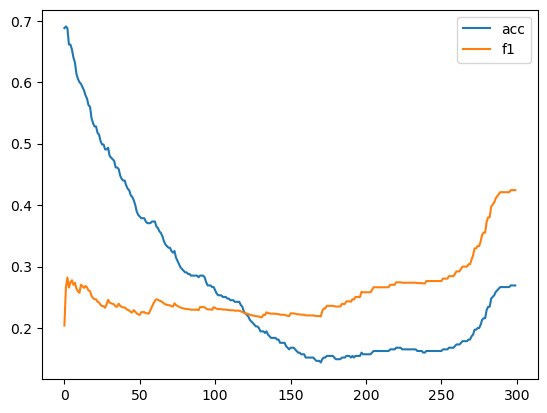

In [ ]:
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:00<00:00, 162.27it/s]


Accuracy: 0.7040, Precision: 0.7188, Recall: 0.1840, F1-score: 0.2930


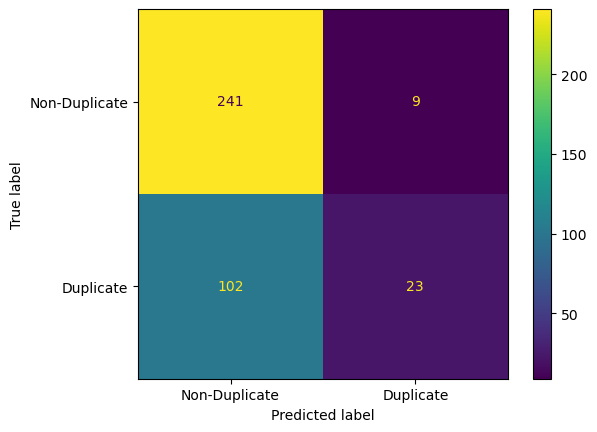

In [ ]:
evaluate_model(siamese_vanilla, test_dataloader, threshold=optimized_threshold_vanilla)

### 5.2 Siamese Vanilla with Triplet Loss <a class="anchor" id="section_5_2"></a>

Epoch 1/30, Train Loss: 0.9991092634828467, Val Loss: 0.9981894351934132
Epoch 2/30, Train Loss: 0.9967633266198007, Val Loss: 0.9943730752719077
Epoch 3/30, Train Loss: 0.9903194747473064, Val Loss: 0.9836632781907132
Epoch 4/30, Train Loss: 0.9707010090351105, Val Loss: 0.9517015940264651
Epoch 5/30, Train Loss: 0.9186599709485707, Val Loss: 0.8773407214566281
Epoch 6/30, Train Loss: 0.8039546483441403, Val Loss: 0.7074520587921143
Epoch 7/30, Train Loss: 0.5888434852424421, Val Loss: 0.46272759649314377
Epoch 8/30, Train Loss: 0.41541071236133575, Val Loss: 0.3676285265307677
Epoch 9/30, Train Loss: 0.3385073901399186, Val Loss: 0.33203325577472387
Epoch 10/30, Train Loss: 0.3032743772001643, Val Loss: 0.2809461155220082
Epoch 11/30, Train Loss: 0.2671366757468173, Val Loss: 0.24817010250530744
Epoch 12/30, Train Loss: 0.24097601089038348, Val Loss: 0.22181889846136696
Epoch 13/30, Train Loss: 0.213350284648569, Val Loss: 0.20177821167989782
Epoch 14/30, Train Loss: 0.19362647360876

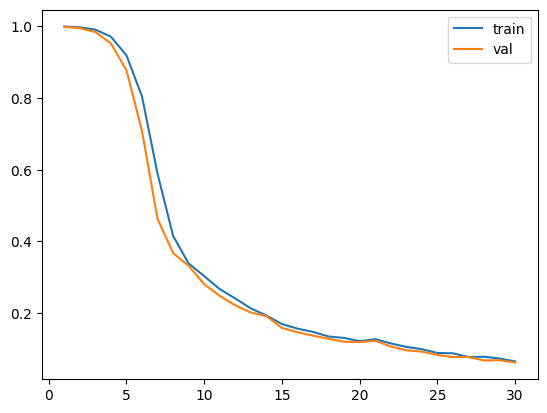

0.06266564738593604

In [ ]:
siamese_net_triplet = SiameseNetwork()
train_siamese_network(siamese_net_triplet, train_dataloader_triplet, val_dataloader_triplet, num_epochs=30, learning_rate=0.00001, loss_function="triplet")

In [ ]:
torch.save(siamese_net_triplet.state_dict(), 'siamese_vanilla_triplet.pt')

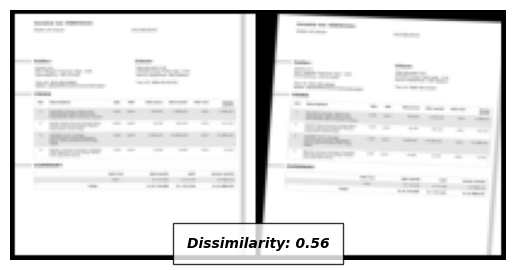

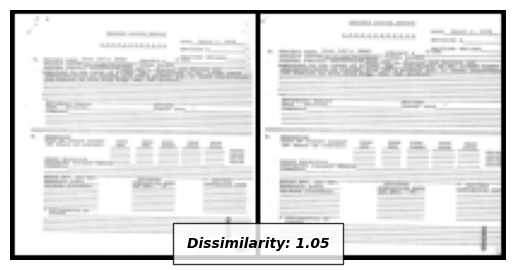

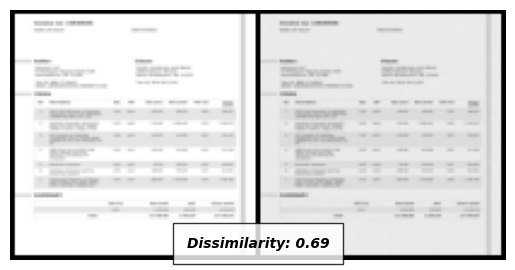

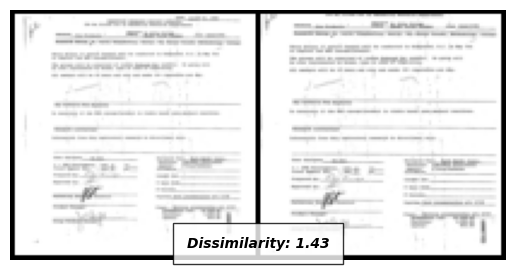

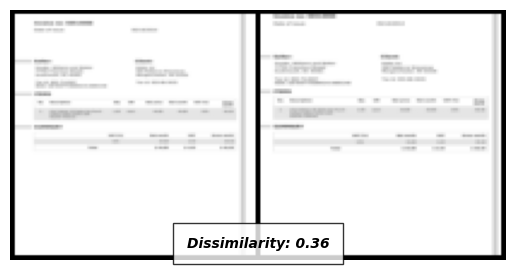

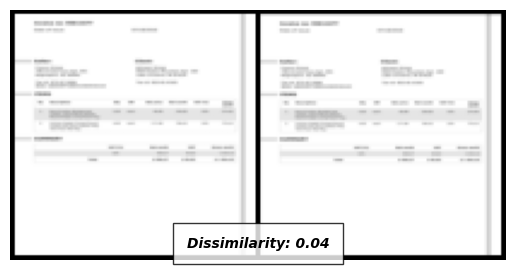

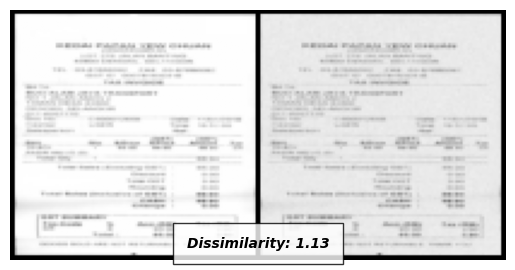

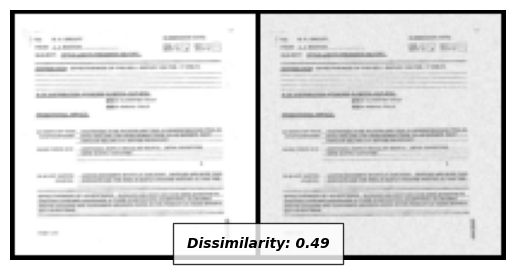

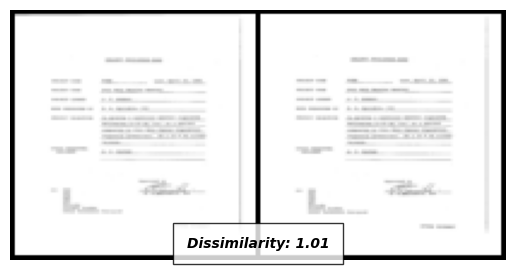

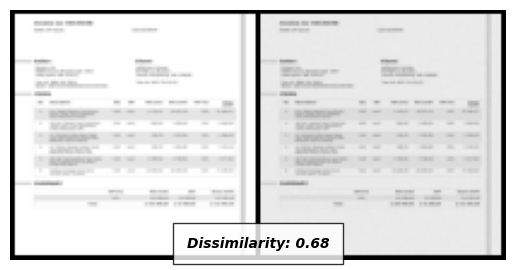

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_triplet, dataiter_1, 10)

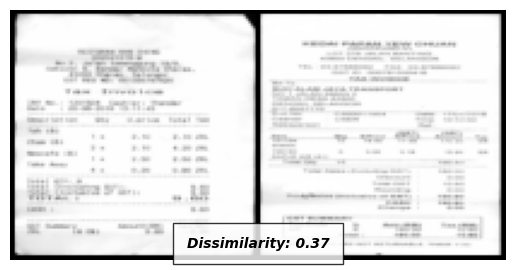

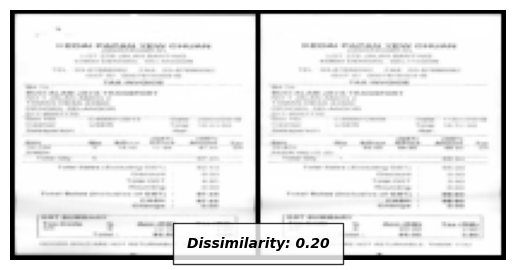

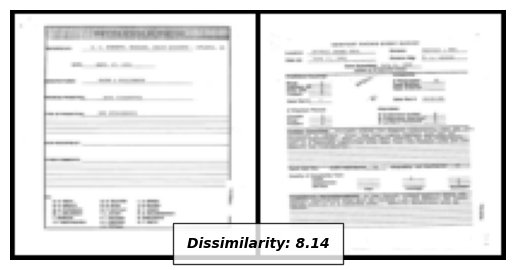

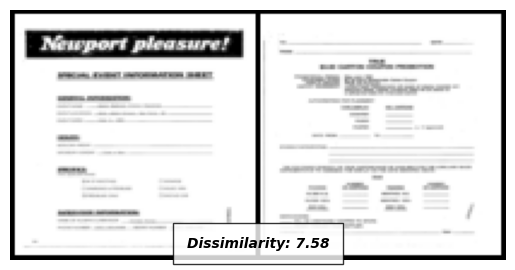

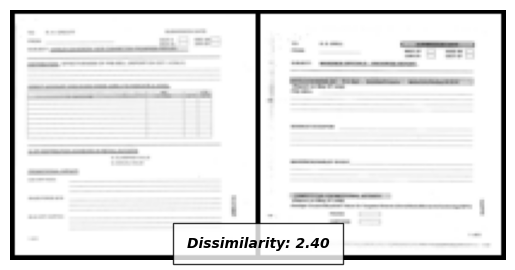

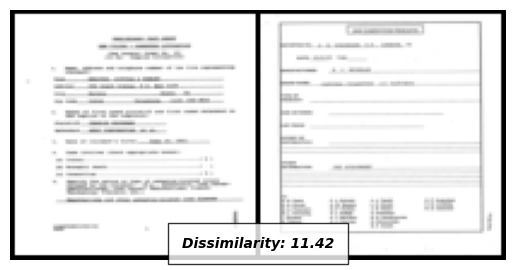

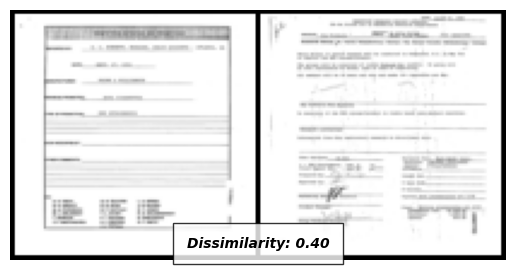

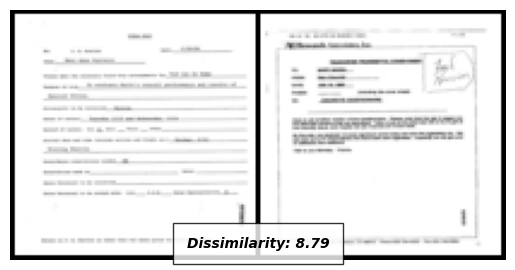

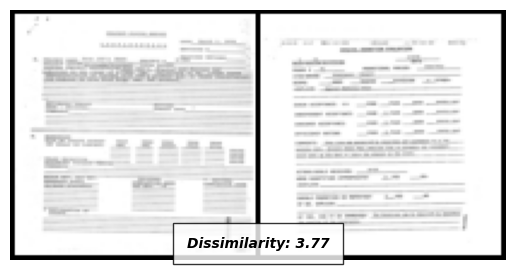

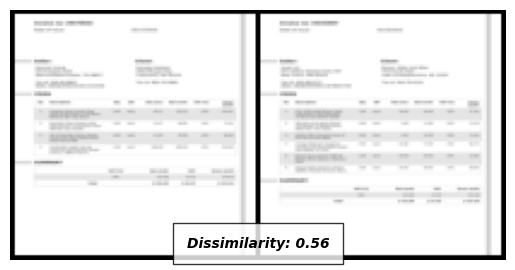

In [ ]:
#non dupes(same class)
visualize_val_dissimilarity(siamese_net_triplet, dataiter_2, 10)

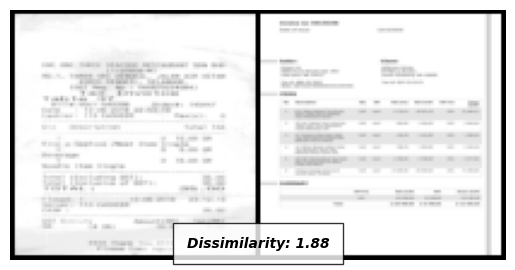

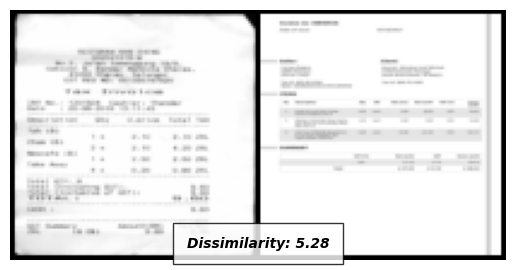

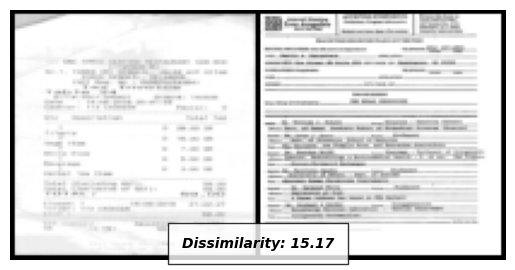

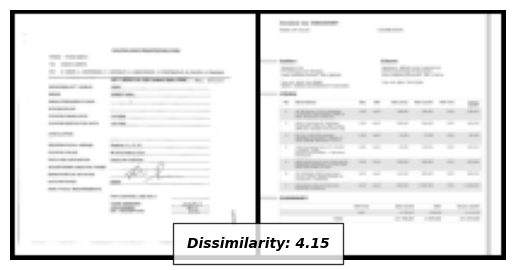

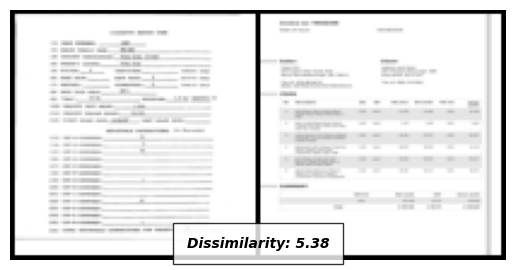

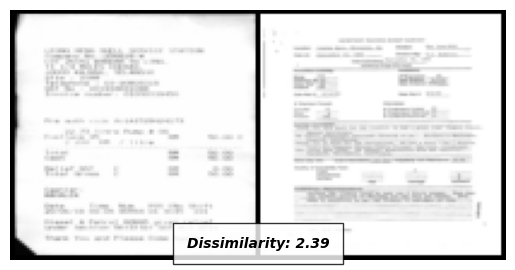

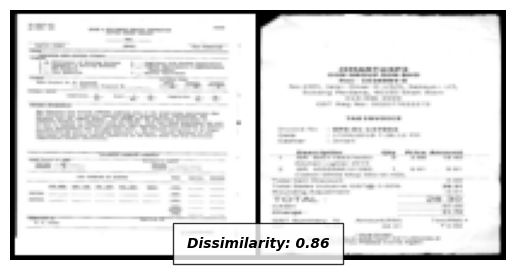

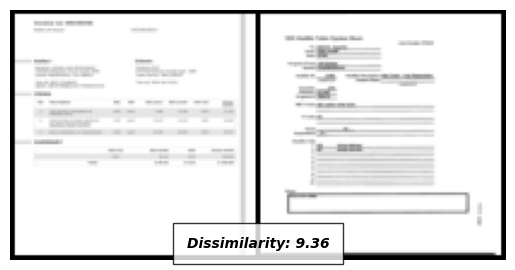

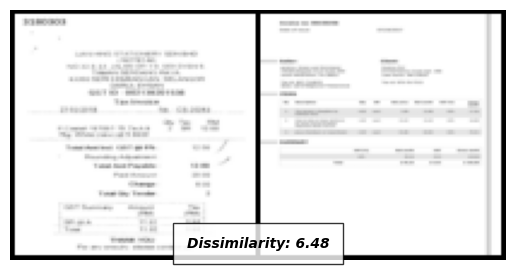

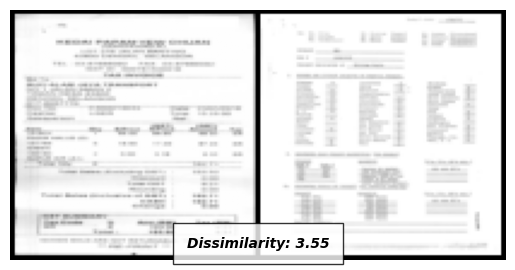

In [ ]:
#non dupes(different class)
visualize_val_dissimilarity(siamese_net_triplet, dataiter_3, 10)

In [ ]:
optimized_threshold_vanilla_triplet, acc, f1 = find_optimized_threshold(siamese_net_triplet, test_dataloader)

100%|██████████| 125/125 [00:00<00:00, 176.16it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 186.51it/s]


accuracy:0.7066666666666667, precision:1.0, recall:0.12, f1:0.21428571428571425
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 169.42it/s]


accuracy:0.7146666666666667, precision:1.0, recall:0.144, f1:0.2517482517482518
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 185.84it/s]


accuracy:0.7253333333333334, precision:1.0, recall:0.176, f1:0.29931972789115646
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 176.21it/s]


accuracy:0.7253333333333334, precision:0.9583333333333334, recall:0.184, f1:0.3087248322147651
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 249.69it/s]


accuracy:0.728, precision:0.9259259259259259, recall:0.2, f1:0.32894736842105265
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 248.37it/s]


accuracy:0.728, precision:0.8709677419354839, recall:0.216, f1:0.34615384615384615
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 256.10it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:00<00:00, 239.00it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:00<00:00, 250.14it/s]


accuracy:0.7493333333333333, precision:0.8780487804878049, recall:0.288, f1:0.43373493975903615
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 247.19it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:0.11999999999999998, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 248.30it/s]


accuracy:0.752, precision:0.8636363636363636, recall:0.304, f1:0.4497041420118343
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:00<00:00, 249.52it/s]


accuracy:0.752, precision:0.8636363636363636, recall:0.304, f1:0.4497041420118343
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 249.11it/s]


accuracy:0.7546666666666667, precision:0.851063829787234, recall:0.32, f1:0.4651162790697675
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 250.24it/s]


accuracy:0.7546666666666667, precision:0.8367346938775511, recall:0.328, f1:0.471264367816092
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 253.75it/s]


accuracy:0.7573333333333333, precision:0.84, recall:0.336, f1:0.48000000000000004
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 246.47it/s]


accuracy:0.76, precision:0.8301886792452831, recall:0.352, f1:0.49438202247191004
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 243.62it/s]


accuracy:0.7573333333333333, precision:0.8148148148148148, recall:0.352, f1:0.49162011173184356
Current threshold:0.19000000000000003, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 245.84it/s]


accuracy:0.7626666666666667, precision:0.8214285714285714, recall:0.368, f1:0.5082872928176795
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 248.30it/s]


accuracy:0.7626666666666667, precision:0.8103448275862069, recall:0.376, f1:0.5136612021857924
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:00<00:00, 248.51it/s]


accuracy:0.768, precision:0.8166666666666667, recall:0.392, f1:0.5297297297297296
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 246.88it/s]


accuracy:0.7733333333333333, precision:0.8225806451612904, recall:0.408, f1:0.5454545454545454
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:00<00:00, 226.22it/s]


accuracy:0.7786666666666666, precision:0.8181818181818182, recall:0.432, f1:0.5654450261780104
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 235.19it/s]


accuracy:0.7866666666666666, precision:0.8260869565217391, recall:0.456, f1:0.5876288659793814
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 177.02it/s]


accuracy:0.7893333333333333, precision:0.8285714285714286, recall:0.464, f1:0.5948717948717949
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 187.25it/s]


accuracy:0.7866666666666666, precision:0.8169014084507042, recall:0.464, f1:0.5918367346938777
Current threshold:0.2700000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 186.44it/s]


accuracy:0.7813333333333333, precision:0.7945205479452054, recall:0.464, f1:0.5858585858585859
Current threshold:0.2800000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 180.66it/s]


accuracy:0.7786666666666666, precision:0.7837837837837838, recall:0.464, f1:0.5829145728643217
Current threshold:0.2900000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 191.65it/s]


accuracy:0.784, precision:0.7894736842105263, recall:0.48, f1:0.5970149253731344
Current threshold:0.3000000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 254.02it/s]


accuracy:0.7866666666666666, precision:0.7922077922077922, recall:0.488, f1:0.603960396039604
Current threshold:0.3100000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 244.51it/s]


accuracy:0.7866666666666666, precision:0.7848101265822784, recall:0.496, f1:0.6078431372549019
Current threshold:0.3200000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 248.18it/s]


accuracy:0.7866666666666666, precision:0.7848101265822784, recall:0.496, f1:0.6078431372549019
Current threshold:0.3300000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 243.84it/s]


accuracy:0.7866666666666666, precision:0.7848101265822784, recall:0.496, f1:0.6078431372549019
Current threshold:0.34000000000000014, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 251.95it/s]


accuracy:0.7893333333333333, precision:0.7875, recall:0.504, f1:0.6146341463414633
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 242.55it/s]


accuracy:0.792, precision:0.7901234567901234, recall:0.512, f1:0.6213592233009708
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:00<00:00, 241.22it/s]


accuracy:0.792, precision:0.7901234567901234, recall:0.512, f1:0.6213592233009708
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:00<00:00, 241.10it/s]


accuracy:0.7946666666666666, precision:0.7926829268292683, recall:0.52, f1:0.6280193236714976
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:00<00:00, 249.88it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 251.79it/s]


accuracy:0.7973333333333333, precision:0.788235294117647, recall:0.536, f1:0.6380952380952382
Current threshold:0.4000000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 236.21it/s]


accuracy:0.8, precision:0.7906976744186046, recall:0.544, f1:0.6445497630331752
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:00<00:00, 225.85it/s]


accuracy:0.7973333333333333, precision:0.7816091954022989, recall:0.544, f1:0.6415094339622642
Current threshold:0.4200000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:00<00:00, 238.74it/s]


accuracy:0.8, precision:0.7840909090909091, recall:0.552, f1:0.6478873239436619
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 238.80it/s]


accuracy:0.8026666666666666, precision:0.7802197802197802, recall:0.568, f1:0.6574074074074073
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:00<00:00, 247.52it/s]


accuracy:0.808, precision:0.7849462365591398, recall:0.584, f1:0.6697247706422018
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:00<00:00, 240.32it/s]


accuracy:0.808, precision:0.7849462365591398, recall:0.584, f1:0.6697247706422018
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:00<00:00, 238.22it/s]


accuracy:0.8106666666666666, precision:0.7872340425531915, recall:0.592, f1:0.6757990867579908
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:00<00:00, 253.21it/s]


accuracy:0.8106666666666666, precision:0.7872340425531915, recall:0.592, f1:0.6757990867579908
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:00<00:00, 191.04it/s]


accuracy:0.8133333333333334, precision:0.7894736842105263, recall:0.6, f1:0.6818181818181819
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 180.32it/s]


accuracy:0.8133333333333334, precision:0.7894736842105263, recall:0.6, f1:0.6818181818181819
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 177.57it/s]


accuracy:0.8133333333333334, precision:0.7835051546391752, recall:0.608, f1:0.6846846846846847
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:00<00:00, 178.91it/s]


accuracy:0.8133333333333334, precision:0.7835051546391752, recall:0.608, f1:0.6846846846846847
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:00<00:00, 176.09it/s]


accuracy:0.8186666666666667, precision:0.7878787878787878, recall:0.624, f1:0.6964285714285714
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 248.88it/s]


accuracy:0.8213333333333334, precision:0.79, recall:0.632, f1:0.7022222222222222
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:00<00:00, 241.28it/s]


accuracy:0.8213333333333334, precision:0.7843137254901961, recall:0.64, f1:0.7048458149779736
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 253.17it/s]


accuracy:0.8213333333333334, precision:0.7843137254901961, recall:0.64, f1:0.7048458149779736
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 233.71it/s]


accuracy:0.8213333333333334, precision:0.7788461538461539, recall:0.648, f1:0.7074235807860262
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:00<00:00, 249.97it/s]


accuracy:0.8213333333333334, precision:0.7788461538461539, recall:0.648, f1:0.7074235807860262
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:00<00:00, 248.93it/s]


accuracy:0.8213333333333334, precision:0.7788461538461539, recall:0.648, f1:0.7074235807860262
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:00<00:00, 258.03it/s]


accuracy:0.8186666666666667, precision:0.7714285714285715, recall:0.648, f1:0.7043478260869566
Current threshold:0.6000000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:00<00:00, 243.07it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:00<00:00, 250.81it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 249.54it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:0.6300000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 255.29it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:0.6400000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 245.28it/s]


accuracy:0.816, precision:0.7592592592592593, recall:0.656, f1:0.7038626609442061
Current threshold:0.6500000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 260.64it/s]


accuracy:0.816, precision:0.7592592592592593, recall:0.656, f1:0.7038626609442061
Current threshold:0.6600000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 248.30it/s]


accuracy:0.8186666666666667, precision:0.7614678899082569, recall:0.664, f1:0.7094017094017094
Current threshold:0.6700000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 252.61it/s]


accuracy:0.8213333333333334, precision:0.7636363636363637, recall:0.672, f1:0.7148936170212765
Current threshold:0.6800000000000004, Best threshold:0.6700


100%|██████████| 125/125 [00:00<00:00, 243.72it/s]


accuracy:0.8213333333333334, precision:0.7636363636363637, recall:0.672, f1:0.7148936170212765
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 248.52it/s]


accuracy:0.824, precision:0.7657657657657657, recall:0.68, f1:0.7203389830508475
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:00<00:00, 253.92it/s]


accuracy:0.824, precision:0.7657657657657657, recall:0.68, f1:0.7203389830508475
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 255.09it/s]


accuracy:0.8213333333333334, precision:0.7589285714285714, recall:0.68, f1:0.7172995780590719
Current threshold:0.7200000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 185.11it/s]


accuracy:0.8186666666666667, precision:0.7522123893805309, recall:0.68, f1:0.7142857142857142
Current threshold:0.7300000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 186.91it/s]


accuracy:0.8186666666666667, precision:0.7522123893805309, recall:0.68, f1:0.7142857142857142
Current threshold:0.7400000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 177.58it/s]


accuracy:0.8213333333333334, precision:0.7543859649122807, recall:0.688, f1:0.7196652719665272
Current threshold:0.7500000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 179.82it/s]


accuracy:0.824, precision:0.7565217391304347, recall:0.696, f1:0.725
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 177.38it/s]


accuracy:0.8213333333333334, precision:0.75, recall:0.696, f1:0.7219917012448134
Current threshold:0.7700000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 251.09it/s]


accuracy:0.8213333333333334, precision:0.7457627118644068, recall:0.704, f1:0.7242798353909465
Current threshold:0.7800000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 251.36it/s]


accuracy:0.8213333333333334, precision:0.7457627118644068, recall:0.704, f1:0.7242798353909465
Current threshold:0.7900000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 245.35it/s]


accuracy:0.8186666666666667, precision:0.7394957983193278, recall:0.704, f1:0.721311475409836
Current threshold:0.8000000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 244.91it/s]


accuracy:0.8186666666666667, precision:0.7394957983193278, recall:0.704, f1:0.721311475409836
Current threshold:0.8100000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 245.63it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8200000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 248.24it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8300000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 246.09it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8400000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 248.27it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8500000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 246.49it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 249.04it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8700000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 247.93it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8800000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 249.00it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.8900000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 245.04it/s]


accuracy:0.8186666666666667, precision:0.7355371900826446, recall:0.712, f1:0.7235772357723577
Current threshold:0.9000000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 254.07it/s]


accuracy:0.8213333333333334, precision:0.7377049180327869, recall:0.72, f1:0.7287449392712552
Current threshold:0.9100000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 247.78it/s]


accuracy:0.8186666666666667, precision:0.7317073170731707, recall:0.72, f1:0.7258064516129032
Current threshold:0.9200000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 242.27it/s]


accuracy:0.816, precision:0.7258064516129032, recall:0.72, f1:0.7228915662650602
Current threshold:0.9300000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 239.05it/s]


accuracy:0.816, precision:0.7222222222222222, recall:0.728, f1:0.7250996015936256
Current threshold:0.9400000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 239.37it/s]


accuracy:0.816, precision:0.7222222222222222, recall:0.728, f1:0.7250996015936256
Current threshold:0.9500000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 209.81it/s]


accuracy:0.8213333333333334, precision:0.7265625, recall:0.744, f1:0.7351778656126482
Current threshold:0.9600000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 187.43it/s]


accuracy:0.8213333333333334, precision:0.7265625, recall:0.744, f1:0.7351778656126482
Current threshold:0.9700000000000006, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 185.68it/s]


accuracy:0.8266666666666667, precision:0.7307692307692307, recall:0.76, f1:0.7450980392156863
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 188.34it/s]


accuracy:0.824, precision:0.7251908396946565, recall:0.76, f1:0.7421875
Current threshold:0.9900000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 180.35it/s]


accuracy:0.8266666666666667, precision:0.7272727272727273, recall:0.768, f1:0.7470817120622568
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 193.20it/s]


accuracy:0.8266666666666667, precision:0.7272727272727273, recall:0.768, f1:0.7470817120622568
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:00<00:00, 247.07it/s]


accuracy:0.824, precision:0.7185185185185186, recall:0.776, f1:0.7461538461538462
Current threshold:1.0200000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:00<00:00, 248.18it/s]


accuracy:0.8266666666666667, precision:0.717391304347826, recall:0.792, f1:0.7528517110266161
Current threshold:1.0300000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:00<00:00, 254.87it/s]


accuracy:0.8293333333333334, precision:0.7194244604316546, recall:0.8, f1:0.7575757575757576
Current threshold:1.0400000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:00<00:00, 242.62it/s]


accuracy:0.832, precision:0.7214285714285714, recall:0.808, f1:0.7622641509433963
Current threshold:1.0500000000000007, Best threshold:1.0400


100%|██████████| 125/125 [00:00<00:00, 256.97it/s]


accuracy:0.832, precision:0.7214285714285714, recall:0.808, f1:0.7622641509433963
Current threshold:1.0600000000000007, Best threshold:1.0500


100%|██████████| 125/125 [00:00<00:00, 244.15it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:1.0700000000000007, Best threshold:1.0600


100%|██████████| 125/125 [00:00<00:00, 254.78it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:1.0800000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:00<00:00, 243.59it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:1.0900000000000007, Best threshold:1.0800


100%|██████████| 125/125 [00:00<00:00, 249.89it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:1.1000000000000008, Best threshold:1.0900


100%|██████████| 125/125 [00:00<00:00, 242.98it/s]


accuracy:0.8426666666666667, precision:0.7291666666666666, recall:0.84, f1:0.7806691449814126
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:00<00:00, 238.01it/s]


accuracy:0.8426666666666667, precision:0.7291666666666666, recall:0.84, f1:0.7806691449814126
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:00<00:00, 247.86it/s]


accuracy:0.8426666666666667, precision:0.7291666666666666, recall:0.84, f1:0.7806691449814126
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:00<00:00, 255.78it/s]


accuracy:0.8426666666666667, precision:0.7291666666666666, recall:0.84, f1:0.7806691449814126
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 250.98it/s]


accuracy:0.84, precision:0.7241379310344828, recall:0.84, f1:0.7777777777777777
Current threshold:1.1500000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 253.46it/s]


accuracy:0.8373333333333334, precision:0.7191780821917808, recall:0.84, f1:0.7749077490774908
Current threshold:1.1600000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 234.86it/s]


accuracy:0.8373333333333334, precision:0.7191780821917808, recall:0.84, f1:0.7749077490774908
Current threshold:1.1700000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 256.21it/s]


accuracy:0.8373333333333334, precision:0.7162162162162162, recall:0.848, f1:0.7765567765567766
Current threshold:1.1800000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 245.78it/s]


accuracy:0.84, precision:0.7181208053691275, recall:0.856, f1:0.7810218978102189
Current threshold:1.1900000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 235.17it/s]


accuracy:0.84, precision:0.7181208053691275, recall:0.856, f1:0.7810218978102189
Current threshold:1.2000000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 181.13it/s]


accuracy:0.8426666666666667, precision:0.72, recall:0.864, f1:0.7854545454545454
Current threshold:1.2100000000000009, Best threshold:1.2000


100%|██████████| 125/125 [00:00<00:00, 172.08it/s]


accuracy:0.8426666666666667, precision:0.72, recall:0.864, f1:0.7854545454545454
Current threshold:1.2200000000000009, Best threshold:1.2100


100%|██████████| 125/125 [00:00<00:00, 192.58it/s]


accuracy:0.8453333333333334, precision:0.7218543046357616, recall:0.872, f1:0.7898550724637681
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 184.85it/s]


accuracy:0.8453333333333334, precision:0.7218543046357616, recall:0.872, f1:0.7898550724637681
Current threshold:1.2400000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:00<00:00, 204.22it/s]


accuracy:0.84, precision:0.7124183006535948, recall:0.872, f1:0.7841726618705036
Current threshold:1.2500000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:00<00:00, 251.92it/s]


accuracy:0.84, precision:0.7124183006535948, recall:0.872, f1:0.7841726618705036
Current threshold:1.260000000000001, Best threshold:1.2300


100%|██████████| 125/125 [00:00<00:00, 241.00it/s]


accuracy:0.8426666666666667, precision:0.7142857142857143, recall:0.88, f1:0.7885304659498208
Current threshold:1.270000000000001, Best threshold:1.2300


100%|██████████| 125/125 [00:00<00:00, 248.39it/s]


accuracy:0.84, precision:0.7096774193548387, recall:0.88, f1:0.7857142857142856
Current threshold:1.280000000000001, Best threshold:1.2300


100%|██████████| 125/125 [00:00<00:00, 246.90it/s]


accuracy:0.84, precision:0.7096774193548387, recall:0.88, f1:0.7857142857142856
Current threshold:1.290000000000001, Best threshold:1.2300


100%|██████████| 125/125 [00:00<00:00, 247.22it/s]


accuracy:0.8453333333333334, precision:0.7133757961783439, recall:0.896, f1:0.7943262411347518
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:00<00:00, 247.71it/s]


accuracy:0.8426666666666667, precision:0.7088607594936709, recall:0.896, f1:0.7915194346289751
Current threshold:1.310000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:00<00:00, 247.91it/s]


accuracy:0.8426666666666667, precision:0.7088607594936709, recall:0.896, f1:0.7915194346289751
Current threshold:1.320000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:00<00:00, 246.92it/s]


accuracy:0.8426666666666667, precision:0.7088607594936709, recall:0.896, f1:0.7915194346289751
Current threshold:1.330000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:00<00:00, 243.56it/s]


accuracy:0.8453333333333334, precision:0.710691823899371, recall:0.904, f1:0.795774647887324
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 248.85it/s]


accuracy:0.8426666666666667, precision:0.70625, recall:0.904, f1:0.7929824561403509
Current threshold:1.350000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 248.15it/s]


accuracy:0.8426666666666667, precision:0.70625, recall:0.904, f1:0.7929824561403509
Current threshold:1.360000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 251.47it/s]


accuracy:0.8426666666666667, precision:0.70625, recall:0.904, f1:0.7929824561403509
Current threshold:1.370000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 238.64it/s]


accuracy:0.84, precision:0.7018633540372671, recall:0.904, f1:0.7902097902097903
Current threshold:1.380000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 247.20it/s]


accuracy:0.8373333333333334, precision:0.6975308641975309, recall:0.904, f1:0.7874564459930314
Current threshold:1.390000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 244.50it/s]


accuracy:0.8373333333333334, precision:0.6975308641975309, recall:0.904, f1:0.7874564459930314
Current threshold:1.400000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 249.88it/s]


accuracy:0.832, precision:0.6890243902439024, recall:0.904, f1:0.782006920415225
Current threshold:1.410000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 246.29it/s]


accuracy:0.832, precision:0.6890243902439024, recall:0.904, f1:0.782006920415225
Current threshold:1.420000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 249.90it/s]


accuracy:0.824, precision:0.6766467065868264, recall:0.904, f1:0.773972602739726
Current threshold:1.430000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 205.11it/s]


accuracy:0.824, precision:0.6766467065868264, recall:0.904, f1:0.773972602739726
Current threshold:1.440000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 190.54it/s]


accuracy:0.824, precision:0.6766467065868264, recall:0.904, f1:0.773972602739726
Current threshold:1.450000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 183.05it/s]


accuracy:0.8213333333333334, precision:0.6726190476190477, recall:0.904, f1:0.7713310580204777
Current threshold:1.460000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 180.45it/s]


accuracy:0.8213333333333334, precision:0.6726190476190477, recall:0.904, f1:0.7713310580204777
Current threshold:1.470000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 172.82it/s]


accuracy:0.8186666666666667, precision:0.6686390532544378, recall:0.904, f1:0.7687074829931972
Current threshold:1.480000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 170.26it/s]


accuracy:0.816, precision:0.6647058823529411, recall:0.904, f1:0.7661016949152543
Current threshold:1.490000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 225.29it/s]


accuracy:0.8133333333333334, precision:0.6608187134502924, recall:0.904, f1:0.7635135135135135
Current threshold:1.500000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 225.46it/s]


accuracy:0.8133333333333334, precision:0.6608187134502924, recall:0.904, f1:0.7635135135135135
Current threshold:1.5100000000000011, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 236.45it/s]


accuracy:0.8106666666666666, precision:0.6569767441860465, recall:0.904, f1:0.7609427609427609
Current threshold:1.5200000000000011, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 243.62it/s]


accuracy:0.8106666666666666, precision:0.6569767441860465, recall:0.904, f1:0.7609427609427609
Current threshold:1.5300000000000011, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 249.72it/s]


accuracy:0.8106666666666666, precision:0.6569767441860465, recall:0.904, f1:0.7609427609427609
Current threshold:1.5400000000000011, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 242.92it/s]


accuracy:0.808, precision:0.653179190751445, recall:0.904, f1:0.7583892617449665
Current threshold:1.5500000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 250.78it/s]


accuracy:0.808, precision:0.653179190751445, recall:0.904, f1:0.7583892617449665
Current threshold:1.5600000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 247.23it/s]


accuracy:0.808, precision:0.653179190751445, recall:0.904, f1:0.7583892617449665
Current threshold:1.5700000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 245.08it/s]


accuracy:0.808, precision:0.653179190751445, recall:0.904, f1:0.7583892617449665
Current threshold:1.5800000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 239.98it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.5900000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 242.58it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6000000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 244.92it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6100000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 244.19it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6200000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 252.00it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6300000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 236.41it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6400000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 242.01it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6500000000000012, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 246.51it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6600000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 252.76it/s]


accuracy:0.8053333333333333, precision:0.6494252873563219, recall:0.904, f1:0.7558528428093646
Current threshold:1.6700000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 170.77it/s]


accuracy:0.808, precision:0.6514285714285715, recall:0.912, f1:0.7599999999999999
Current threshold:1.6800000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 178.09it/s]


accuracy:0.808, precision:0.6514285714285715, recall:0.912, f1:0.7599999999999999
Current threshold:1.6900000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 191.15it/s]


accuracy:0.808, precision:0.6514285714285715, recall:0.912, f1:0.7599999999999999
Current threshold:1.7000000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 184.57it/s]


accuracy:0.8106666666666666, precision:0.6534090909090909, recall:0.92, f1:0.7641196013289037
Current threshold:1.7100000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 177.76it/s]


accuracy:0.8106666666666666, precision:0.6534090909090909, recall:0.92, f1:0.7641196013289037
Current threshold:1.7200000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 250.91it/s]


accuracy:0.8106666666666666, precision:0.6534090909090909, recall:0.92, f1:0.7641196013289037
Current threshold:1.7300000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 244.09it/s]


accuracy:0.8133333333333334, precision:0.655367231638418, recall:0.928, f1:0.7682119205298013
Current threshold:1.7400000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 253.68it/s]


accuracy:0.8106666666666666, precision:0.651685393258427, recall:0.928, f1:0.7656765676567657
Current threshold:1.7500000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 239.66it/s]


accuracy:0.8053333333333333, precision:0.6444444444444445, recall:0.928, f1:0.760655737704918
Current threshold:1.7600000000000013, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 255.85it/s]


accuracy:0.8053333333333333, precision:0.6444444444444445, recall:0.928, f1:0.760655737704918
Current threshold:1.7700000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 236.35it/s]


accuracy:0.8053333333333333, precision:0.6444444444444445, recall:0.928, f1:0.760655737704918
Current threshold:1.7800000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 257.04it/s]


accuracy:0.8053333333333333, precision:0.6444444444444445, recall:0.928, f1:0.760655737704918
Current threshold:1.7900000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 249.09it/s]


accuracy:0.8026666666666666, precision:0.6408839779005525, recall:0.928, f1:0.758169934640523
Current threshold:1.8000000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 252.50it/s]


accuracy:0.8026666666666666, precision:0.6408839779005525, recall:0.928, f1:0.758169934640523
Current threshold:1.8100000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 235.46it/s]


accuracy:0.8026666666666666, precision:0.6408839779005525, recall:0.928, f1:0.758169934640523
Current threshold:1.8200000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 249.59it/s]


accuracy:0.8026666666666666, precision:0.6408839779005525, recall:0.928, f1:0.758169934640523
Current threshold:1.8300000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 235.08it/s]


accuracy:0.8026666666666666, precision:0.6408839779005525, recall:0.928, f1:0.758169934640523
Current threshold:1.8400000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 246.59it/s]


accuracy:0.8, precision:0.6373626373626373, recall:0.928, f1:0.755700325732899
Current threshold:1.8500000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 235.05it/s]


accuracy:0.8, precision:0.6373626373626373, recall:0.928, f1:0.755700325732899
Current threshold:1.8600000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 235.25it/s]


accuracy:0.8, precision:0.6373626373626373, recall:0.928, f1:0.755700325732899
Current threshold:1.8700000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 249.37it/s]


accuracy:0.8, precision:0.6373626373626373, recall:0.928, f1:0.755700325732899
Current threshold:1.8800000000000014, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 242.96it/s]


accuracy:0.8, precision:0.6373626373626373, recall:0.928, f1:0.755700325732899
Current threshold:1.8900000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 252.11it/s]


accuracy:0.8, precision:0.6373626373626373, recall:0.928, f1:0.755700325732899
Current threshold:1.9000000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 218.63it/s]


accuracy:0.8026666666666666, precision:0.639344262295082, recall:0.936, f1:0.7597402597402598
Current threshold:1.9100000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 179.79it/s]


accuracy:0.8026666666666666, precision:0.639344262295082, recall:0.936, f1:0.7597402597402598
Current threshold:1.9200000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 175.52it/s]


accuracy:0.8026666666666666, precision:0.639344262295082, recall:0.936, f1:0.7597402597402598
Current threshold:1.9300000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 173.83it/s]


accuracy:0.8, precision:0.6358695652173914, recall:0.936, f1:0.7572815533980582
Current threshold:1.9400000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 182.23it/s]


accuracy:0.8026666666666666, precision:0.6378378378378379, recall:0.944, f1:0.7612903225806451
Current threshold:1.9500000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 198.22it/s]


accuracy:0.8053333333333333, precision:0.6397849462365591, recall:0.952, f1:0.7652733118971062
Current threshold:1.9600000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 236.49it/s]


accuracy:0.8053333333333333, precision:0.6397849462365591, recall:0.952, f1:0.7652733118971062
Current threshold:1.9700000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 242.48it/s]


accuracy:0.8053333333333333, precision:0.6397849462365591, recall:0.952, f1:0.7652733118971062
Current threshold:1.9800000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 234.86it/s]


accuracy:0.8053333333333333, precision:0.6397849462365591, recall:0.952, f1:0.7652733118971062
Current threshold:1.9900000000000015, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 243.98it/s]

accuracy:0.808, precision:0.6417112299465241, recall:0.96, f1:0.7692307692307694
Current threshold:2.0000000000000013, Best threshold:1.3300


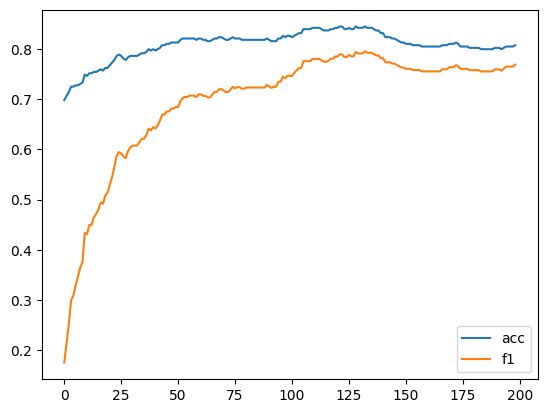

In [ ]:
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:00<00:00, 257.72it/s]


Accuracy: 0.8453, Precision: 0.7107, Recall: 0.9040, F1-score: 0.7958


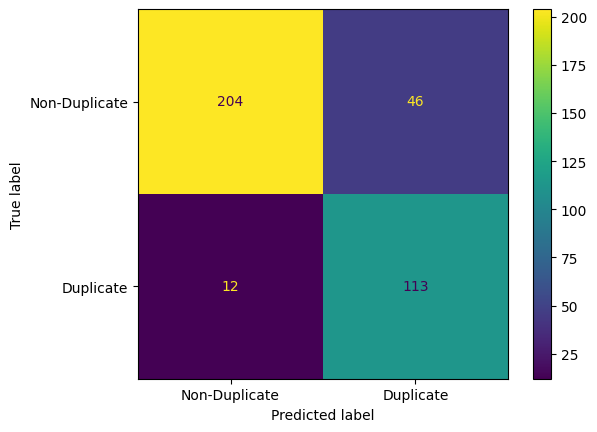

In [ ]:
evaluate_model(siamese_net_triplet,test_dataloader, threshold=optimized_threshold_vanilla_triplet)

### 5.3 Siamese AlexNet with Contrastive Loss <a class="anchor" id="section_5_3"></a>

Epoch 1/30, Train Loss: 0.7482674575506654, Val Loss: 0.8824784301167184
Epoch 2/30, Train Loss: 0.7216907041454664, Val Loss: 0.8586776548825008
Epoch 3/30, Train Loss: 0.5849569034915859, Val Loss: 0.6928958136000132
Epoch 4/30, Train Loss: 0.4360980930689134, Val Loss: 0.5993850540957952
Epoch 5/30, Train Loss: 0.3799766369752194, Val Loss: 0.5813365123773876
Epoch 6/30, Train Loss: 0.36163479854401787, Val Loss: 0.5559064894914627
Epoch 7/30, Train Loss: 0.32140003654517624, Val Loss: 0.5544489124103597
Epoch 8/30, Train Loss: 0.3073641717813811, Val Loss: 0.5381169027991985
Epoch 9/30, Train Loss: 0.2888623094186187, Val Loss: 0.5485060963975755
Epoch 10/30, Train Loss: 0.27461700038494247, Val Loss: 0.5318762079175365
Epoch 11/30, Train Loss: 0.2597195693340741, Val Loss: 0.5360457486424007
Epoch 12/30, Train Loss: 0.248490784366272, Val Loss: 0.5250557939472952
Epoch 13/30, Train Loss: 0.2362738767712328, Val Loss: 0.535092195790065
Epoch 14/30, Train Loss: 0.2333502893666982, V

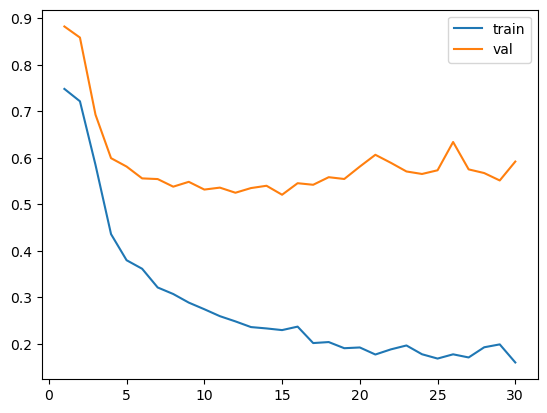

0.5921055051056963

In [ ]:
siamese_net_alexnet = SiameseNetworkAlexNet()
train_siamese_network(siamese_net_alexnet, train_dataloader, val_dataloader, num_epochs=30, learning_rate=0.00001)

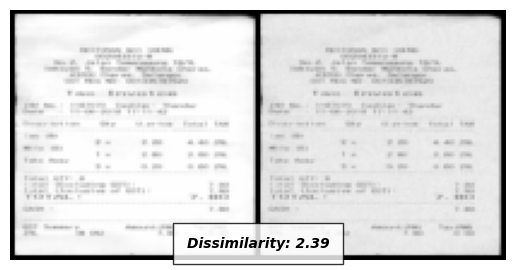

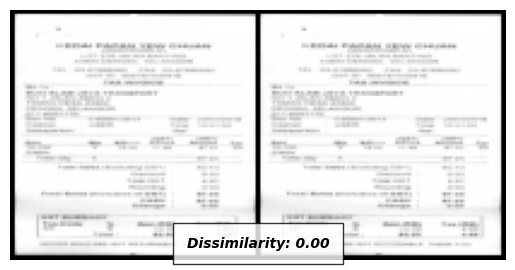

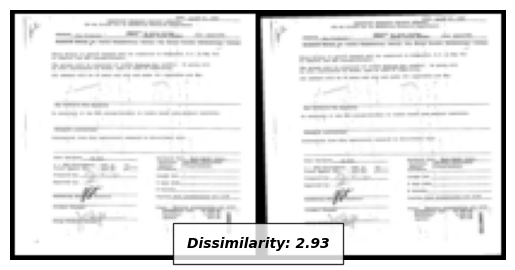

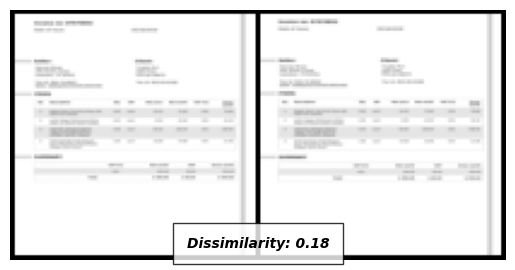

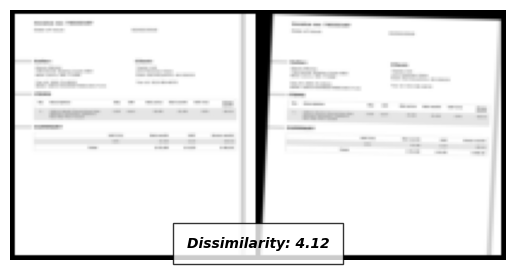

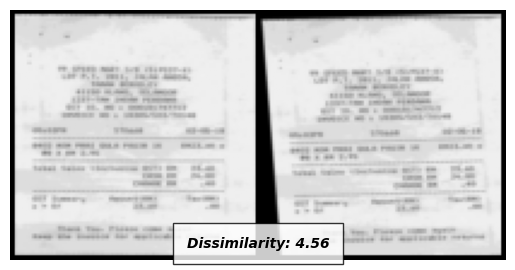

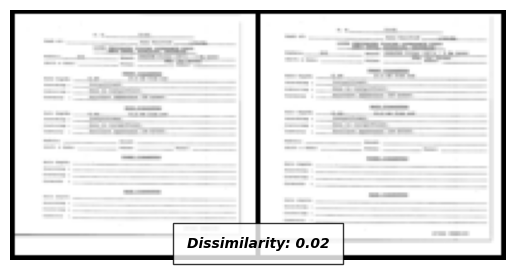

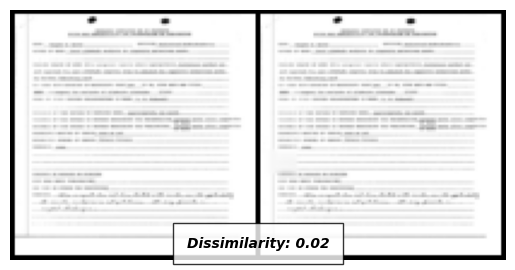

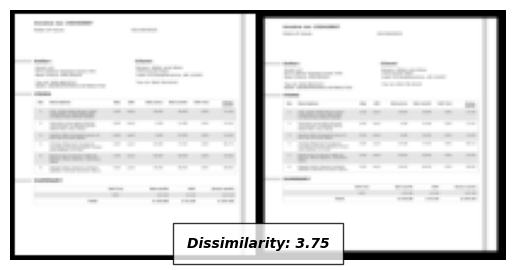

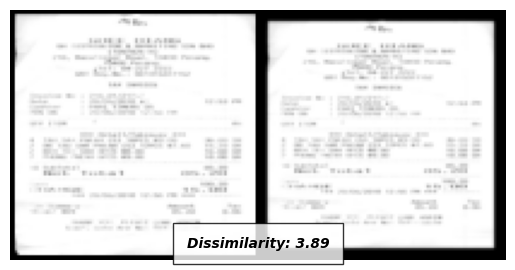

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_alexnet, dataiter_1, 10)

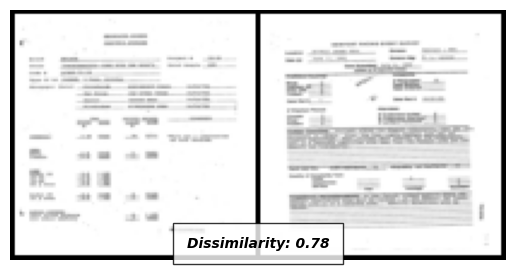

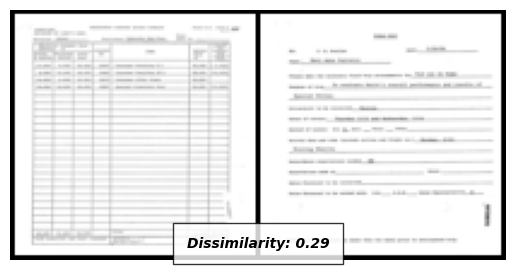

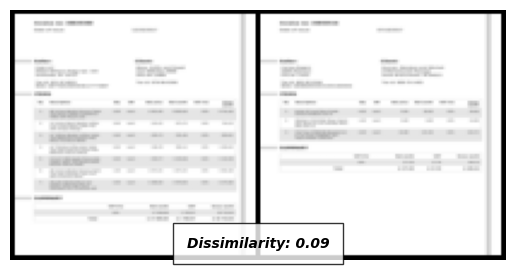

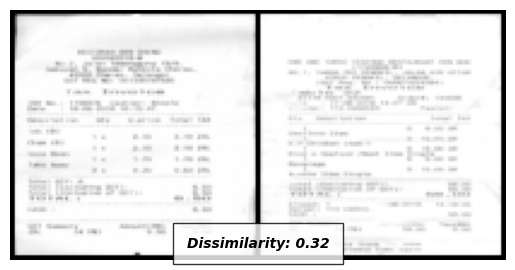

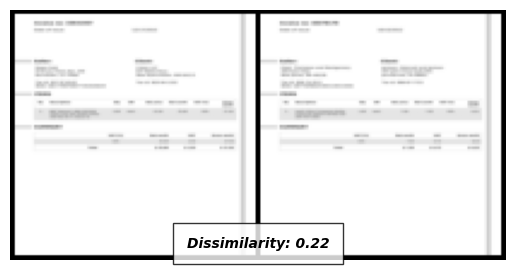

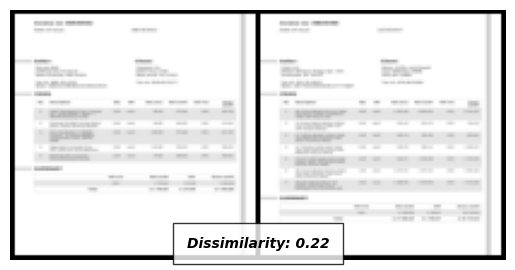

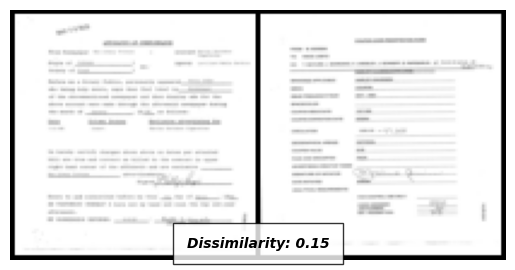

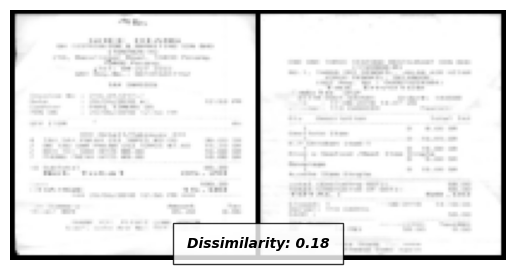

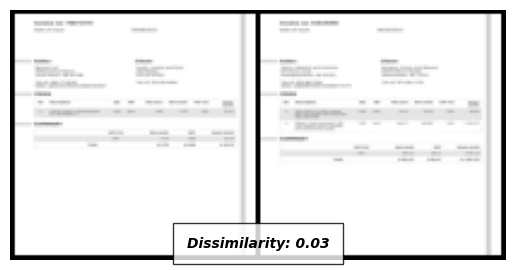

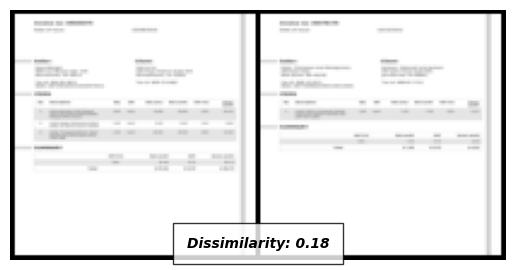

In [ ]:
#non dupes(same class)
visualize_val_dissimilarity(siamese_net_alexnet, dataiter_2, 10)

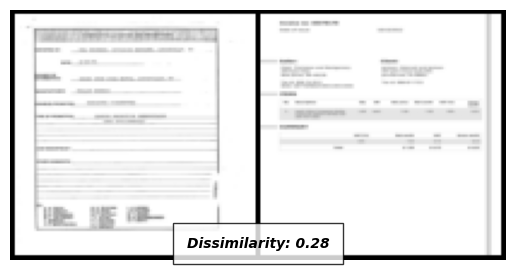

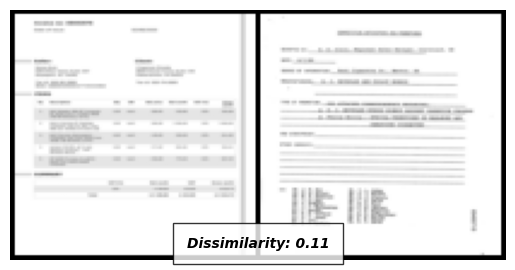

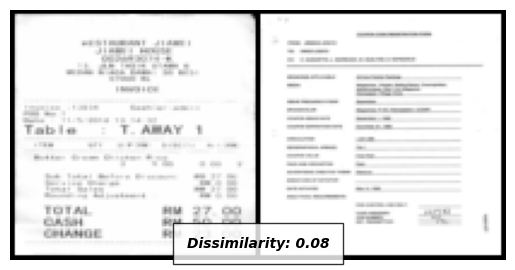

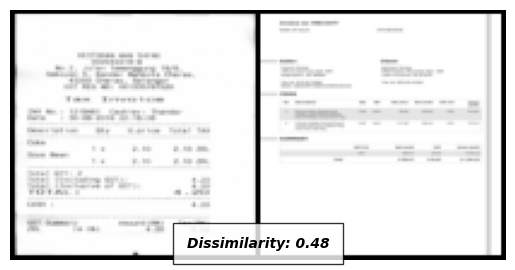

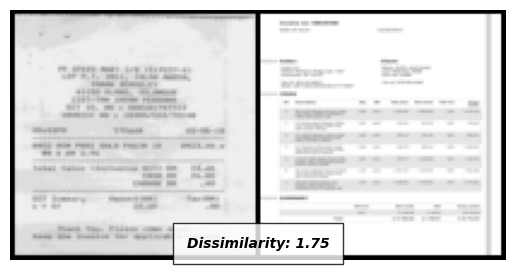

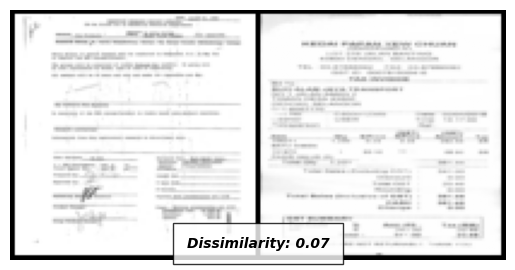

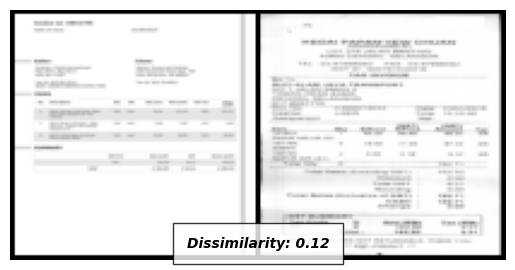

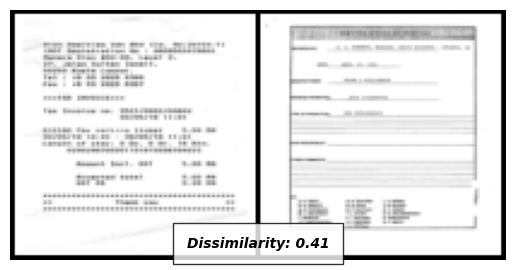

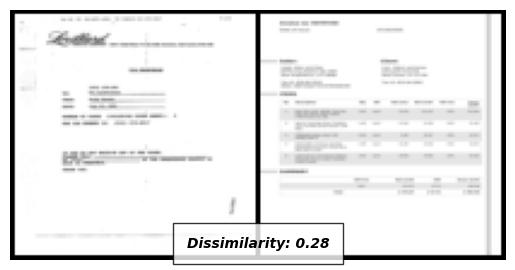

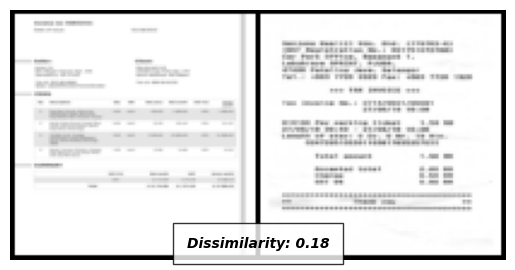

In [ ]:
#non dupes(different class)
visualize_val_dissimilarity(siamese_net_alexnet, dataiter_3, 10)

100%|██████████| 125/125 [00:01<00:00, 105.66it/s]


accuracy:0.688, precision:0.7, recall:0.112, f1:0.19310344827586207
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 142.99it/s]


accuracy:0.688, precision:0.6428571428571429, recall:0.144, f1:0.2352941176470588
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.53it/s]


accuracy:0.6773333333333333, precision:0.5526315789473685, recall:0.168, f1:0.25766871165644173
Current threshold:0.04, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.664, precision:0.4888888888888889, recall:0.176, f1:0.2588235294117647
Current threshold:0.05, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.6506666666666666, precision:0.44, recall:0.176, f1:0.2514285714285714
Current threshold:0.060000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.6426666666666667, precision:0.41509433962264153, recall:0.176, f1:0.24719101123595502
Current threshold:0.07, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.6346666666666667, precision:0.39285714285714285, recall:0.176, f1:0.24309392265193366
Current threshold:0.08, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.632, precision:0.39344262295081966, recall:0.192, f1:0.2580645161290323
Current threshold:0.09, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.624, precision:0.375, recall:0.192, f1:0.253968253968254
Current threshold:0.09999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.624, precision:0.38235294117647056, recall:0.208, f1:0.2694300518134715
Current threshold:0.10999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


accuracy:0.6186666666666667, precision:0.375, recall:0.216, f1:0.2741116751269036
Current threshold:0.11999999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.6106666666666667, precision:0.36363636363636365, recall:0.224, f1:0.27722772277227725
Current threshold:0.12999999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.6026666666666667, precision:0.35714285714285715, recall:0.24, f1:0.28708133971291866
Current threshold:0.13999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.5946666666666667, precision:0.3448275862068966, recall:0.24, f1:0.2830188679245283
Current threshold:0.15, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.5893333333333334, precision:0.33707865168539325, recall:0.24, f1:0.28037383177570097
Current threshold:0.16, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.584, precision:0.32967032967032966, recall:0.24, f1:0.2777777777777778
Current threshold:0.17, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.5813333333333334, precision:0.32608695652173914, recall:0.24, f1:0.27649769585253453
Current threshold:0.18000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


accuracy:0.576, precision:0.3191489361702128, recall:0.24, f1:0.273972602739726
Current threshold:0.19000000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.5653333333333334, precision:0.30612244897959184, recall:0.24, f1:0.26905829596412556
Current threshold:0.20000000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 142.41it/s]


accuracy:0.5573333333333333, precision:0.297029702970297, recall:0.24, f1:0.2654867256637168
Current threshold:0.21000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.5493333333333333, precision:0.28846153846153844, recall:0.24, f1:0.26200873362445415
Current threshold:0.22000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.05it/s]


accuracy:0.528, precision:0.2719298245614035, recall:0.248, f1:0.25941422594142266
Current threshold:0.23000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.72it/s]


accuracy:0.5173333333333333, precision:0.2627118644067797, recall:0.248, f1:0.2551440329218107
Current threshold:0.24000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.25000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.26000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.70it/s]


accuracy:0.496, precision:0.24603174603174602, recall:0.248, f1:0.24701195219123503
Current threshold:0.2700000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.49066666666666664, precision:0.2421875, recall:0.248, f1:0.2450592885375494
Current threshold:0.2800000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.48, precision:0.23484848484848486, recall:0.248, f1:0.24124513618677046
Current threshold:0.2900000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.4746666666666667, precision:0.23529411764705882, recall:0.256, f1:0.24521072796934867
Current threshold:0.3000000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.47733333333333333, precision:0.24087591240875914, recall:0.264, f1:0.2519083969465649
Current threshold:0.3100000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.472, precision:0.23741007194244604, recall:0.264, f1:0.25
Current threshold:0.3200000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.4666666666666667, precision:0.23404255319148937, recall:0.264, f1:0.24812030075187969
Current threshold:0.3300000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.464, precision:0.2323943661971831, recall:0.264, f1:0.24719101123595505
Current threshold:0.34000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.4613333333333333, precision:0.23448275862068965, recall:0.272, f1:0.2518518518518518
Current threshold:0.35000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.17it/s]


accuracy:0.456, precision:0.23129251700680273, recall:0.272, f1:0.25
Current threshold:0.36000000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.4533333333333333, precision:0.22972972972972974, recall:0.272, f1:0.24908424908424912
Current threshold:0.37000000000000016, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.4533333333333333, precision:0.22972972972972974, recall:0.272, f1:0.24908424908424912
Current threshold:0.38000000000000017, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.4533333333333333, precision:0.22972972972972974, recall:0.272, f1:0.24908424908424912
Current threshold:0.3900000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.44266666666666665, precision:0.2236842105263158, recall:0.272, f1:0.24548736462093862
Current threshold:0.4000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.432, precision:0.21794871794871795, recall:0.272, f1:0.24199288256227758
Current threshold:0.4100000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.42933333333333334, precision:0.21656050955414013, recall:0.272, f1:0.24113475177304966
Current threshold:0.4200000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.424, precision:0.2138364779874214, recall:0.272, f1:0.23943661971830987
Current threshold:0.4300000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.42133333333333334, precision:0.2125, recall:0.272, f1:0.23859649122807017
Current threshold:0.4400000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.42133333333333334, precision:0.21604938271604937, recall:0.28, f1:0.24390243902439024
Current threshold:0.45000000000000023, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.416, precision:0.21341463414634146, recall:0.28, f1:0.24221453287197234
Current threshold:0.46000000000000024, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.416, precision:0.21341463414634146, recall:0.28, f1:0.24221453287197234
Current threshold:0.47000000000000025, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.49it/s]


accuracy:0.4053333333333333, precision:0.20833333333333334, recall:0.28, f1:0.23890784982935154
Current threshold:0.48000000000000026, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.4, precision:0.20930232558139536, recall:0.288, f1:0.24242424242424243
Current threshold:0.49000000000000027, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.3973333333333333, precision:0.20809248554913296, recall:0.288, f1:0.24161073825503357
Current threshold:0.5000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.65it/s]


accuracy:0.39466666666666667, precision:0.20689655172413793, recall:0.288, f1:0.24080267558528426
Current threshold:0.5100000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.3893333333333333, precision:0.20786516853932585, recall:0.296, f1:0.2442244224422442
Current threshold:0.5200000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.38666666666666666, precision:0.20670391061452514, recall:0.296, f1:0.24342105263157893
Current threshold:0.5300000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.49it/s]


accuracy:0.38133333333333336, precision:0.20765027322404372, recall:0.304, f1:0.24675324675324675
Current threshold:0.5400000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.37866666666666665, precision:0.20652173913043478, recall:0.304, f1:0.24595469255663432
Current threshold:0.5500000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.376, precision:0.20540540540540542, recall:0.304, f1:0.2451612903225807
Current threshold:0.5600000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.368, precision:0.20212765957446807, recall:0.304, f1:0.2428115015974441
Current threshold:0.5700000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.99it/s]


accuracy:0.36533333333333334, precision:0.20418848167539266, recall:0.312, f1:0.2468354430379747
Current threshold:0.5800000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.36, precision:0.20207253886010362, recall:0.312, f1:0.2452830188679245
Current threshold:0.5900000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.99it/s]


accuracy:0.3546666666666667, precision:0.2, recall:0.312, f1:0.24375000000000002
Current threshold:0.6000000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.344, precision:0.19597989949748743, recall:0.312, f1:0.2407407407407407
Current threshold:0.6100000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.344, precision:0.19597989949748743, recall:0.312, f1:0.2407407407407407
Current threshold:0.6200000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.344, precision:0.19597989949748743, recall:0.312, f1:0.2407407407407407
Current threshold:0.6300000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.15it/s]


accuracy:0.344, precision:0.19597989949748743, recall:0.312, f1:0.2407407407407407
Current threshold:0.6400000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.3466666666666667, precision:0.2, recall:0.32, f1:0.24615384615384614
Current threshold:0.6500000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.344, precision:0.19900497512437812, recall:0.32, f1:0.245398773006135
Current threshold:0.6600000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.33866666666666667, precision:0.19704433497536947, recall:0.32, f1:0.24390243902439027
Current threshold:0.6700000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.3333333333333333, precision:0.1951219512195122, recall:0.32, f1:0.24242424242424243
Current threshold:0.6800000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.33066666666666666, precision:0.1941747572815534, recall:0.32, f1:0.24169184290030213
Current threshold:0.6900000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.3253333333333333, precision:0.19230769230769232, recall:0.32, f1:0.24024024024024024
Current threshold:0.7000000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.91it/s]


accuracy:0.31733333333333336, precision:0.1895734597156398, recall:0.32, f1:0.23809523809523805
Current threshold:0.7100000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.25it/s]


accuracy:0.31466666666666665, precision:0.18867924528301888, recall:0.32, f1:0.23738872403560832
Current threshold:0.7200000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.30933333333333335, precision:0.18691588785046728, recall:0.32, f1:0.2359882005899705
Current threshold:0.7300000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.45it/s]


accuracy:0.30666666666666664, precision:0.18604651162790697, recall:0.32, f1:0.23529411764705885
Current threshold:0.7400000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.91it/s]


accuracy:0.30666666666666664, precision:0.18604651162790697, recall:0.32, f1:0.23529411764705885
Current threshold:0.7500000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.30666666666666664, precision:0.18604651162790697, recall:0.32, f1:0.23529411764705885
Current threshold:0.7600000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.54it/s]


accuracy:0.304, precision:0.18518518518518517, recall:0.32, f1:0.2346041055718475
Current threshold:0.7700000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.304, precision:0.18518518518518517, recall:0.32, f1:0.2346041055718475
Current threshold:0.7800000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.30666666666666664, precision:0.1889400921658986, recall:0.328, f1:0.23976608187134502
Current threshold:0.7900000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.304, precision:0.18807339449541285, recall:0.328, f1:0.239067055393586
Current threshold:0.8000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.304, precision:0.19090909090909092, recall:0.336, f1:0.24347826086956517
Current threshold:0.8100000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.38it/s]


accuracy:0.2986666666666667, precision:0.1891891891891892, recall:0.336, f1:0.24207492795389052
Current threshold:0.8200000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.2986666666666667, precision:0.1891891891891892, recall:0.336, f1:0.24207492795389052
Current threshold:0.8300000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.2986666666666667, precision:0.1891891891891892, recall:0.336, f1:0.24207492795389052
Current threshold:0.8400000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.2986666666666667, precision:0.1891891891891892, recall:0.336, f1:0.24207492795389052
Current threshold:0.8500000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.2906666666666667, precision:0.18666666666666668, recall:0.336, f1:0.24000000000000002
Current threshold:0.8600000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.43it/s]


accuracy:0.2853333333333333, precision:0.18502202643171806, recall:0.336, f1:0.23863636363636367
Current threshold:0.8700000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.64it/s]


accuracy:0.2853333333333333, precision:0.18502202643171806, recall:0.336, f1:0.23863636363636367
Current threshold:0.8800000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.28, precision:0.18340611353711792, recall:0.336, f1:0.23728813559322035
Current threshold:0.8900000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.2773333333333333, precision:0.1826086956521739, recall:0.336, f1:0.23661971830985917
Current threshold:0.9000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.2773333333333333, precision:0.1826086956521739, recall:0.336, f1:0.23661971830985917
Current threshold:0.9100000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.51it/s]


accuracy:0.27466666666666667, precision:0.18181818181818182, recall:0.336, f1:0.2359550561797753
Current threshold:0.9200000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.67it/s]


accuracy:0.27466666666666667, precision:0.18181818181818182, recall:0.336, f1:0.2359550561797753
Current threshold:0.9300000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.26666666666666666, precision:0.1794871794871795, recall:0.336, f1:0.23398328690807801
Current threshold:0.9400000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.26666666666666666, precision:0.1794871794871795, recall:0.336, f1:0.23398328690807801
Current threshold:0.9500000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.25it/s]


accuracy:0.264, precision:0.17872340425531916, recall:0.336, f1:0.23333333333333336
Current threshold:0.9600000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.2613333333333333, precision:0.17796610169491525, recall:0.336, f1:0.23268698060941825
Current threshold:0.9700000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.25866666666666666, precision:0.17721518987341772, recall:0.336, f1:0.23204419889502761
Current threshold:0.9800000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.40it/s]


accuracy:0.25866666666666666, precision:0.17721518987341772, recall:0.336, f1:0.23204419889502761
Current threshold:0.9900000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.256, precision:0.17647058823529413, recall:0.336, f1:0.23140495867768598
Current threshold:1.0000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.68it/s]


accuracy:0.25333333333333335, precision:0.17573221757322174, recall:0.336, f1:0.23076923076923078
Current threshold:1.0100000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.48it/s]


accuracy:0.248, precision:0.17427385892116182, recall:0.336, f1:0.22950819672131148
Current threshold:1.0200000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.67it/s]


accuracy:0.248, precision:0.17427385892116182, recall:0.336, f1:0.22950819672131148
Current threshold:1.0300000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.24533333333333332, precision:0.17355371900826447, recall:0.336, f1:0.22888283378746593
Current threshold:1.0400000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.24266666666666667, precision:0.1728395061728395, recall:0.336, f1:0.22826086956521743
Current threshold:1.0500000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.23733333333333334, precision:0.17142857142857143, recall:0.336, f1:0.22702702702702704
Current threshold:1.0600000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.23733333333333334, precision:0.17142857142857143, recall:0.336, f1:0.22702702702702704
Current threshold:1.0700000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.23733333333333334, precision:0.17142857142857143, recall:0.336, f1:0.22702702702702704
Current threshold:1.0800000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.23466666666666666, precision:0.17073170731707318, recall:0.336, f1:0.22641509433962267
Current threshold:1.0900000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.62it/s]


accuracy:0.23466666666666666, precision:0.17073170731707318, recall:0.336, f1:0.22641509433962267
Current threshold:1.1000000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.23466666666666666, precision:0.17073170731707318, recall:0.336, f1:0.22641509433962267
Current threshold:1.1100000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:1.1200000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:1.1300000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.72it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:1.1400000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 140.89it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:1.1500000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.22933333333333333, precision:0.1693548387096774, recall:0.336, f1:0.22520107238605896
Current threshold:1.1600000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.14it/s]


accuracy:0.22666666666666666, precision:0.1686746987951807, recall:0.336, f1:0.22459893048128343
Current threshold:1.1700000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.32it/s]


accuracy:0.224, precision:0.168, recall:0.336, f1:0.22400000000000003
Current threshold:1.1800000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.18it/s]


accuracy:0.22133333333333333, precision:0.16733067729083664, recall:0.336, f1:0.22340425531914893
Current threshold:1.1900000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.52it/s]


accuracy:0.22133333333333333, precision:0.16733067729083664, recall:0.336, f1:0.22340425531914893
Current threshold:1.2000000000000008, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.35it/s]


accuracy:0.22133333333333333, precision:0.16733067729083664, recall:0.336, f1:0.22340425531914893
Current threshold:1.2100000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.21866666666666668, precision:0.16666666666666666, recall:0.336, f1:0.22281167108753314
Current threshold:1.2200000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.10it/s]


accuracy:0.21866666666666668, precision:0.16666666666666666, recall:0.336, f1:0.22281167108753314
Current threshold:1.2300000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.216, precision:0.16600790513833993, recall:0.336, f1:0.22222222222222227
Current threshold:1.2400000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.21066666666666667, precision:0.16470588235294117, recall:0.336, f1:0.22105263157894736
Current threshold:1.2500000000000009, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.20533333333333334, precision:0.16342412451361868, recall:0.336, f1:0.21989528795811517
Current threshold:1.260000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.11it/s]


accuracy:0.2, precision:0.16216216216216217, recall:0.336, f1:0.21875
Current threshold:1.270000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


accuracy:0.19466666666666665, precision:0.16091954022988506, recall:0.336, f1:0.21761658031088085
Current threshold:1.280000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.192, precision:0.16030534351145037, recall:0.336, f1:0.21705426356589147
Current threshold:1.290000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.18933333333333333, precision:0.1596958174904943, recall:0.336, f1:0.21649484536082478
Current threshold:1.300000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.75it/s]


accuracy:0.18933333333333333, precision:0.1596958174904943, recall:0.336, f1:0.21649484536082478
Current threshold:1.310000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.49it/s]


accuracy:0.18933333333333333, precision:0.1596958174904943, recall:0.336, f1:0.21649484536082478
Current threshold:1.320000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.51it/s]


accuracy:0.18133333333333335, precision:0.15789473684210525, recall:0.336, f1:0.21483375959079284
Current threshold:1.330000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.28it/s]


accuracy:0.18133333333333335, precision:0.15789473684210525, recall:0.336, f1:0.21483375959079284
Current threshold:1.340000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.31it/s]


accuracy:0.18133333333333335, precision:0.15789473684210525, recall:0.336, f1:0.21483375959079284
Current threshold:1.350000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.62it/s]


accuracy:0.17866666666666667, precision:0.15730337078651685, recall:0.336, f1:0.2142857142857143
Current threshold:1.360000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.17866666666666667, precision:0.15730337078651685, recall:0.336, f1:0.2142857142857143
Current threshold:1.370000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.20it/s]


accuracy:0.17866666666666667, precision:0.15730337078651685, recall:0.336, f1:0.2142857142857143
Current threshold:1.380000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.17866666666666667, precision:0.15730337078651685, recall:0.336, f1:0.2142857142857143
Current threshold:1.390000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.17866666666666667, precision:0.15730337078651685, recall:0.336, f1:0.2142857142857143
Current threshold:1.400000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.17866666666666667, precision:0.15730337078651685, recall:0.336, f1:0.2142857142857143
Current threshold:1.410000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.176, precision:0.15671641791044777, recall:0.336, f1:0.2137404580152672
Current threshold:1.420000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.17866666666666667, precision:0.15985130111524162, recall:0.344, f1:0.2182741116751269
Current threshold:1.430000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.17866666666666667, precision:0.15985130111524162, recall:0.344, f1:0.2182741116751269
Current threshold:1.440000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.176, precision:0.15925925925925927, recall:0.344, f1:0.21772151898734177
Current threshold:1.450000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.176, precision:0.15925925925925927, recall:0.344, f1:0.21772151898734177
Current threshold:1.460000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.17333333333333334, precision:0.15867158671586715, recall:0.344, f1:0.21717171717171715
Current threshold:1.470000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.17333333333333334, precision:0.15867158671586715, recall:0.344, f1:0.21717171717171715
Current threshold:1.480000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.17333333333333334, precision:0.15867158671586715, recall:0.344, f1:0.21717171717171715
Current threshold:1.490000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.17333333333333334, precision:0.15867158671586715, recall:0.344, f1:0.21717171717171715
Current threshold:1.500000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.17333333333333334, precision:0.15867158671586715, recall:0.344, f1:0.21717171717171715
Current threshold:1.5100000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.17066666666666666, precision:0.15808823529411764, recall:0.344, f1:0.21662468513853902
Current threshold:1.5200000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.17066666666666666, precision:0.15808823529411764, recall:0.344, f1:0.21662468513853902
Current threshold:1.5300000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.17066666666666666, precision:0.15808823529411764, recall:0.344, f1:0.21662468513853902
Current threshold:1.5400000000000011, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.17066666666666666, precision:0.15808823529411764, recall:0.344, f1:0.21662468513853902
Current threshold:1.5500000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.168, precision:0.1575091575091575, recall:0.344, f1:0.21608040201005024
Current threshold:1.5600000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.168, precision:0.1575091575091575, recall:0.344, f1:0.21608040201005024
Current threshold:1.5700000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.168, precision:0.1575091575091575, recall:0.344, f1:0.21608040201005024
Current threshold:1.5800000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.91it/s]


accuracy:0.16533333333333333, precision:0.15693430656934307, recall:0.344, f1:0.2155388471177945
Current threshold:1.5900000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.16533333333333333, precision:0.15693430656934307, recall:0.344, f1:0.2155388471177945
Current threshold:1.6000000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6100000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6200000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6300000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.15it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6400000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 142.82it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6500000000000012, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 142.66it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6600000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.64it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6700000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:1.6800000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.16266666666666665, precision:0.1588447653429603, recall:0.352, f1:0.21890547263681592
Current threshold:1.6900000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.15733333333333333, precision:0.15770609318996415, recall:0.352, f1:0.21782178217821777
Current threshold:1.7000000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.71it/s]


accuracy:0.15733333333333333, precision:0.15770609318996415, recall:0.352, f1:0.21782178217821777
Current threshold:1.7100000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.88it/s]


accuracy:0.15733333333333333, precision:0.15770609318996415, recall:0.352, f1:0.21782178217821777
Current threshold:1.7200000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.64it/s]


accuracy:0.15466666666666667, precision:0.15714285714285714, recall:0.352, f1:0.21728395061728395
Current threshold:1.7300000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.152, precision:0.15658362989323843, recall:0.352, f1:0.21674876847290636
Current threshold:1.7400000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.152, precision:0.15658362989323843, recall:0.352, f1:0.21674876847290636
Current threshold:1.7500000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.17it/s]


accuracy:0.14933333333333335, precision:0.15602836879432624, recall:0.352, f1:0.21621621621621623
Current threshold:1.7600000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.14933333333333335, precision:0.15602836879432624, recall:0.352, f1:0.21621621621621623
Current threshold:1.7700000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.7800000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.7900000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8100000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8200000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8300000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8400000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.58it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8500000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8600000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.144, precision:0.15492957746478872, recall:0.352, f1:0.21515892420537894
Current threshold:1.8700000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.14it/s]


accuracy:0.13866666666666666, precision:0.15384615384615385, recall:0.352, f1:0.21411192214111924
Current threshold:1.8800000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.14it/s]


accuracy:0.13866666666666666, precision:0.15384615384615385, recall:0.352, f1:0.21411192214111924
Current threshold:1.8900000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.136, precision:0.15331010452961671, recall:0.352, f1:0.21359223300970875
Current threshold:1.9000000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.49it/s]


accuracy:0.136, precision:0.15331010452961671, recall:0.352, f1:0.21359223300970875
Current threshold:1.9100000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9200000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9300000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9400000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9500000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9600000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9700000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9800000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:1.9900000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:2.0000000000000013, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:2.010000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.14133333333333334, precision:0.15916955017301038, recall:0.368, f1:0.2222222222222222
Current threshold:2.020000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.0300000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.0400000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.0500000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.06, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.07, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.43it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.0799999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.88it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.0899999999999994, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.24it/s]


accuracy:0.13866666666666666, precision:0.15862068965517243, recall:0.368, f1:0.22168674698795182
Current threshold:2.099999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.13333333333333333, precision:0.15753424657534246, recall:0.368, f1:0.22062350119904076
Current threshold:2.109999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.08it/s]


accuracy:0.13333333333333333, precision:0.15753424657534246, recall:0.368, f1:0.22062350119904076
Current threshold:2.1199999999999988, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.95it/s]


accuracy:0.13333333333333333, precision:0.15753424657534246, recall:0.368, f1:0.22062350119904076
Current threshold:2.1299999999999986, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.70it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.1399999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.149999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.159999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.1699999999999977, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.1799999999999975, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.1899999999999973, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.199999999999997, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.209999999999997, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.2199999999999966, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.2299999999999964, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.239999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.81it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.249999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.31it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.259999999999996, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.2699999999999956, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.71it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.2799999999999954, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.289999999999995, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.136, precision:0.16040955631399317, recall:0.376, f1:0.2248803827751196
Current threshold:2.299999999999995, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.13866666666666666, precision:0.16326530612244897, recall:0.384, f1:0.22911694510739858
Current threshold:2.3099999999999947, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.13866666666666666, precision:0.16326530612244897, recall:0.384, f1:0.22911694510739858
Current threshold:2.3199999999999945, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.13866666666666666, precision:0.16326530612244897, recall:0.384, f1:0.22911694510739858
Current threshold:2.3299999999999943, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.14133333333333334, precision:0.16610169491525423, recall:0.392, f1:0.23333333333333334
Current threshold:2.339999999999994, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.14133333333333334, precision:0.16610169491525423, recall:0.392, f1:0.23333333333333334
Current threshold:2.349999999999994, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.13866666666666666, precision:0.16554054054054054, recall:0.392, f1:0.23277909738717342
Current threshold:2.3599999999999937, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.12it/s]


accuracy:0.14133333333333334, precision:0.16835016835016836, recall:0.4, f1:0.2369668246445498
Current threshold:2.3699999999999934, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.144, precision:0.17114093959731544, recall:0.408, f1:0.24113475177304966
Current threshold:2.3799999999999932, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.144, precision:0.17114093959731544, recall:0.408, f1:0.24113475177304966
Current threshold:2.389999999999993, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.144, precision:0.17114093959731544, recall:0.408, f1:0.24113475177304966
Current threshold:2.399999999999993, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.14933333333333335, precision:0.17666666666666667, recall:0.424, f1:0.24941176470588233
Current threshold:2.4099999999999926, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.152, precision:0.17940199335548174, recall:0.432, f1:0.2535211267605634
Current threshold:2.4199999999999924, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.74it/s]


accuracy:0.152, precision:0.17940199335548174, recall:0.432, f1:0.2535211267605634
Current threshold:2.429999999999992, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.44it/s]


accuracy:0.15466666666666667, precision:0.18211920529801323, recall:0.44, f1:0.2576112412177986
Current threshold:2.439999999999992, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.16533333333333333, precision:0.19281045751633988, recall:0.472, f1:0.2737819025522042
Current threshold:2.4499999999999917, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.17333333333333334, precision:0.20064724919093851, recall:0.496, f1:0.2857142857142857
Current threshold:2.4599999999999915, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.22it/s]


accuracy:0.176, precision:0.2032258064516129, recall:0.504, f1:0.28965517241379307
Current threshold:2.4699999999999913, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.17866666666666667, precision:0.2057877813504823, recall:0.512, f1:0.29357798165137616
Current threshold:2.479999999999991, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.184, precision:0.2108626198083067, recall:0.528, f1:0.30136986301369867
Current threshold:2.489999999999991, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.48it/s]


accuracy:0.18666666666666668, precision:0.21337579617834396, recall:0.536, f1:0.3052391799544419
Current threshold:2.4999999999999907, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.51it/s]


accuracy:0.18933333333333333, precision:0.21587301587301588, recall:0.544, f1:0.3090909090909091
Current threshold:2.5099999999999905, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 143.65it/s]


accuracy:0.192, precision:0.21835443037974683, recall:0.552, f1:0.31292517006802717
Current threshold:2.5199999999999902, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.192, precision:0.21835443037974683, recall:0.552, f1:0.31292517006802717
Current threshold:2.52999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.19466666666666665, precision:0.22082018927444794, recall:0.56, f1:0.31674208144796384
Current threshold:2.53999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.19733333333333333, precision:0.22327044025157233, recall:0.568, f1:0.32054176072234764
Current threshold:2.5499999999999896, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.2, precision:0.22570532915360503, recall:0.576, f1:0.32432432432432434
Current threshold:2.5599999999999894, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.20266666666666666, precision:0.228125, recall:0.584, f1:0.3280898876404494
Current threshold:2.569999999999989, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.20266666666666666, precision:0.228125, recall:0.584, f1:0.3280898876404494
Current threshold:2.579999999999989, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.20266666666666666, precision:0.22981366459627328, recall:0.592, f1:0.3310961968680089
Current threshold:2.5899999999999888, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.20266666666666666, precision:0.22981366459627328, recall:0.592, f1:0.3310961968680089
Current threshold:2.5999999999999885, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.2, precision:0.22910216718266255, recall:0.592, f1:0.3303571428571429
Current threshold:2.6099999999999883, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.34it/s]


accuracy:0.20266666666666666, precision:0.23148148148148148, recall:0.6, f1:0.33407572383073497
Current threshold:2.619999999999988, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.23it/s]


accuracy:0.20533333333333334, precision:0.23384615384615384, recall:0.608, f1:0.3377777777777778
Current threshold:2.629999999999988, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.54it/s]


accuracy:0.20533333333333334, precision:0.23384615384615384, recall:0.608, f1:0.3377777777777778
Current threshold:2.6399999999999877, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.20533333333333334, precision:0.23384615384615384, recall:0.608, f1:0.3377777777777778
Current threshold:2.6499999999999875, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.31it/s]


accuracy:0.20533333333333334, precision:0.23384615384615384, recall:0.608, f1:0.3377777777777778
Current threshold:2.6599999999999873, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.669999999999987, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.679999999999987, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.6899999999999866, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.6999999999999864, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.709999999999986, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.719999999999986, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.208, precision:0.2361963190184049, recall:0.616, f1:0.3414634146341463
Current threshold:2.7299999999999858, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.21066666666666667, precision:0.23853211009174313, recall:0.624, f1:0.3451327433628319
Current threshold:2.7399999999999856, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.64it/s]


accuracy:0.21066666666666667, precision:0.23853211009174313, recall:0.624, f1:0.3451327433628319
Current threshold:2.7499999999999853, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 142.01it/s]


accuracy:0.21066666666666667, precision:0.23853211009174313, recall:0.624, f1:0.3451327433628319
Current threshold:2.759999999999985, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 144.31it/s]


accuracy:0.21066666666666667, precision:0.23853211009174313, recall:0.624, f1:0.3451327433628319
Current threshold:2.769999999999985, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.7799999999999847, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.7899999999999845, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.81it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.7999999999999843, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.56it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.809999999999984, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.819999999999984, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.8299999999999836, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.8399999999999834, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.849999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.07it/s]


accuracy:0.21333333333333335, precision:0.24085365853658536, recall:0.632, f1:0.3487858719646799
Current threshold:2.859999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.869999999999983, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.8799999999999826, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.8899999999999824, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.899999999999982, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.909999999999982, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.9199999999999817, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.21066666666666667, precision:0.24012158054711247, recall:0.632, f1:0.34801762114537443
Current threshold:2.9299999999999815, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.9399999999999813, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.949999999999981, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.959999999999981, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.9699999999999807, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.9799999999999804, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.9899999999999802, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.21333333333333335, precision:0.24242424242424243, recall:0.64, f1:0.3516483516483516
Current threshold:2.99999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]

accuracy:0.21866666666666668, precision:0.2469879518072289, recall:0.656, f1:0.35886214442013126
Current threshold:3.00999999999998, Best threshold:0.0200


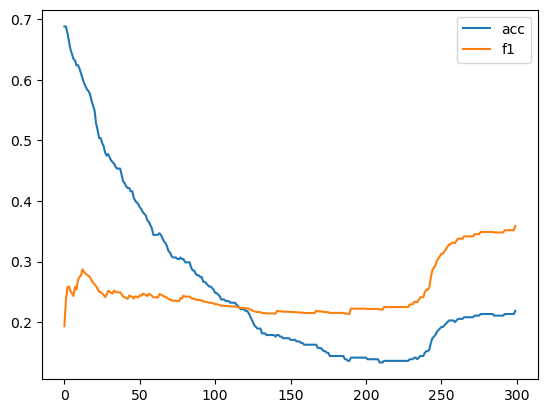

In [ ]:
optimized_threshold_alex, acc, f1 = find_optimized_threshold(siamese_net_alexnet, test_dataloader)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:01<00:00, 105.20it/s]


Accuracy: 0.6880, Precision: 0.6429, Recall: 0.1440, F1-score: 0.2353


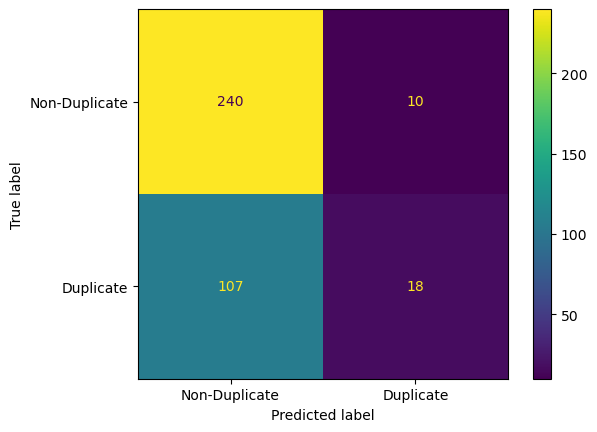

In [ ]:
evaluate_model(siamese_net_alexnet,test_dataloader, threshold=optimized_threshold_alex)

### 5.4 Siamese AlexNet with Triplet Loss <a class="anchor" id="section_5_4"></a>

Epoch 1/20, Train Loss: 0.9970836059043282, Val Loss: 0.9872578304064902
Epoch 2/20, Train Loss: 0.8861207334618819, Val Loss: 0.6732849863014723
Epoch 3/20, Train Loss: 0.4103877387548748, Val Loss: 0.27614147392542737
Epoch 4/20, Train Loss: 0.21055841445922852, Val Loss: 0.16807377201161885
Epoch 5/20, Train Loss: 0.1656970711130845, Val Loss: 0.13662909422265856
Epoch 6/20, Train Loss: 0.1249522807958879, Val Loss: 0.10890024351446252
Epoch 7/20, Train Loss: 0.10180558695604927, Val Loss: 0.09012620072615773
Epoch 8/20, Train Loss: 0.09079121876704066, Val Loss: 0.07022831020386595
Epoch 9/20, Train Loss: 0.07179892945446466, Val Loss: 0.06743039386837106
Epoch 10/20, Train Loss: 0.07278781129341376, Val Loss: 0.0556264833400124
Epoch 11/20, Train Loss: 0.0689206164526312, Val Loss: 0.05575901858116451
Epoch 12/20, Train Loss: 0.04981715153706701, Val Loss: 0.03684333182479206
Epoch 13/20, Train Loss: 0.03675322744407152, Val Loss: 0.03494289086053246
Epoch 14/20, Train Loss: 0.037

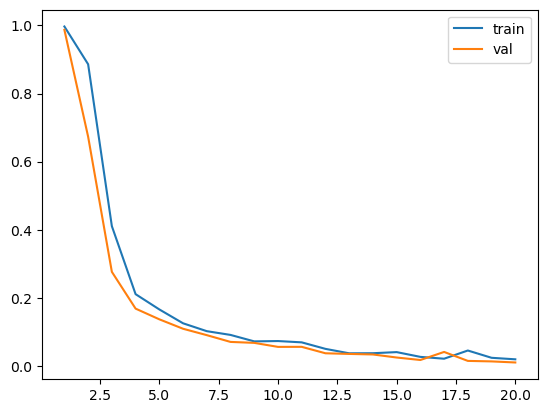

0.009809189917225587

In [ ]:
siamese_net_alexnet_triplet = SiameseNetworkAlexNet()
train_siamese_network(siamese_net_alexnet_triplet, train_dataloader_triplet, val_dataloader_triplet, num_epochs=20, learning_rate=0.00001,loss_function="triplet")

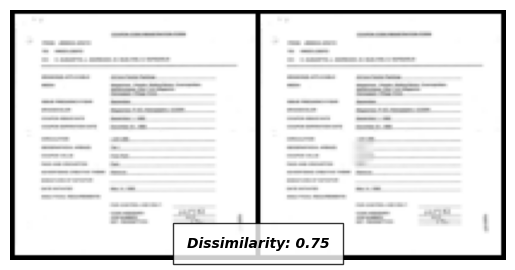

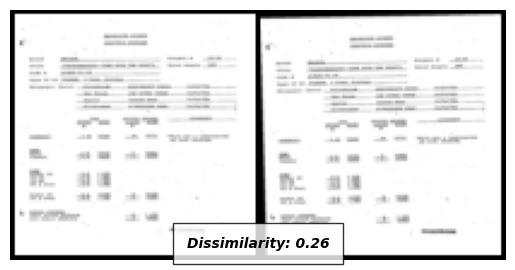

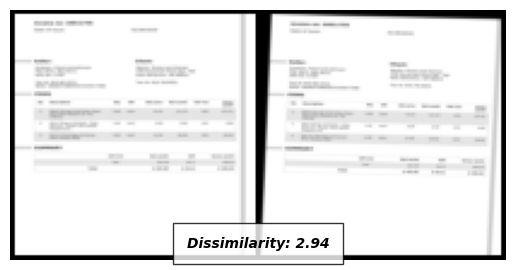

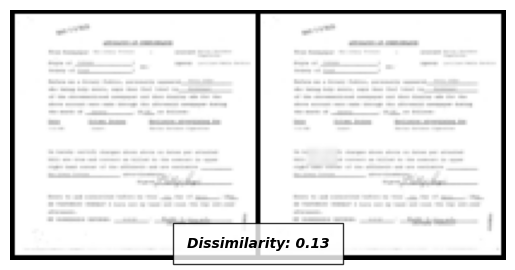

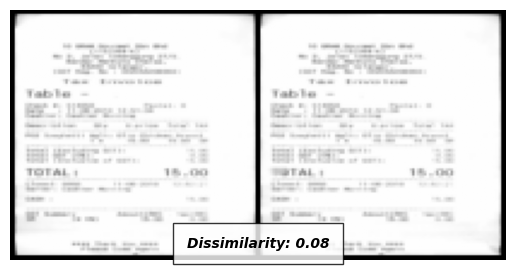

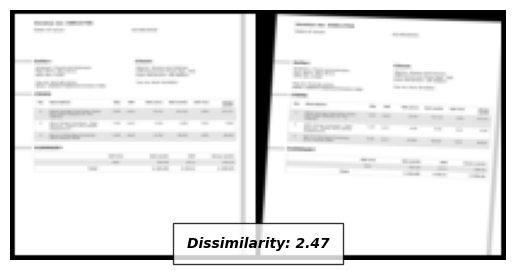

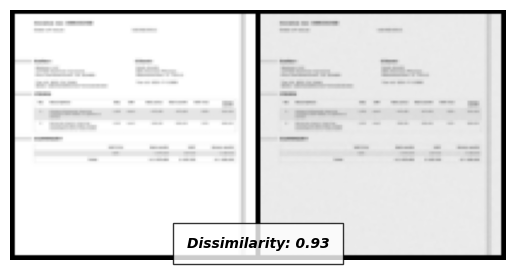

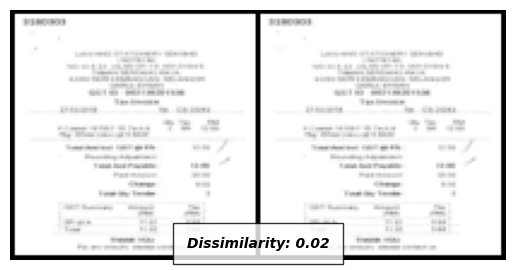

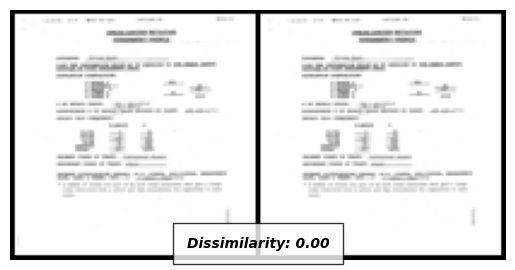

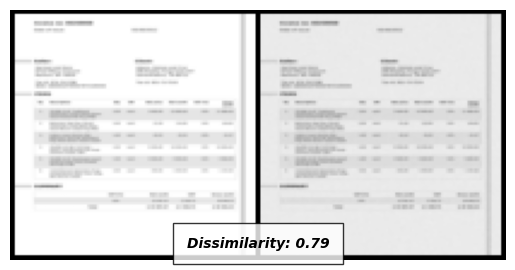

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_alexnet_triplet, dataiter_1, 10)

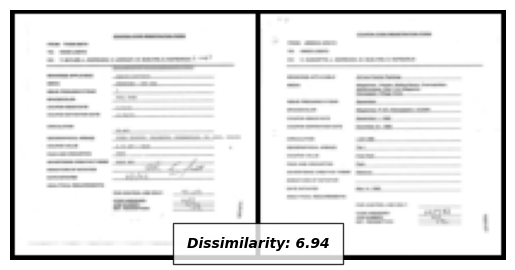

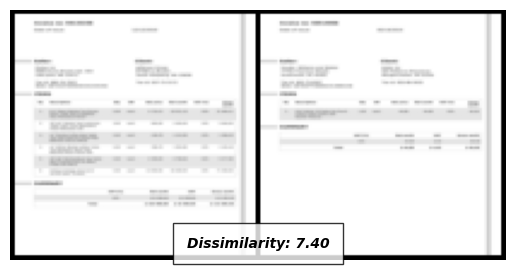

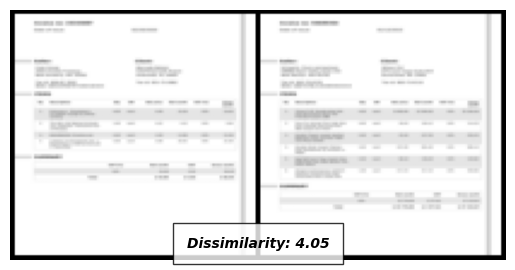

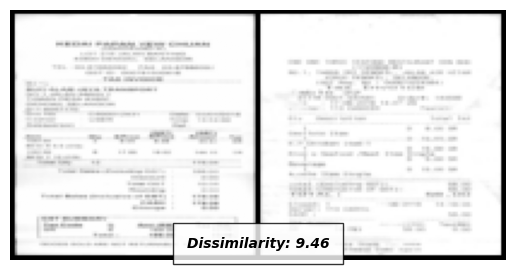

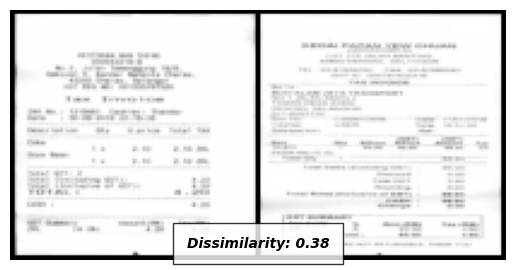

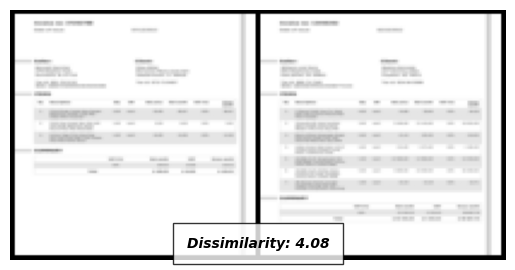

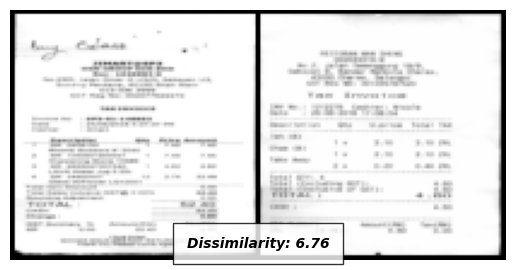

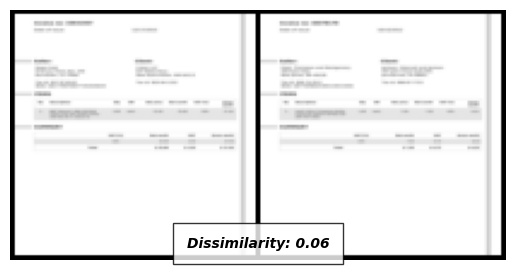

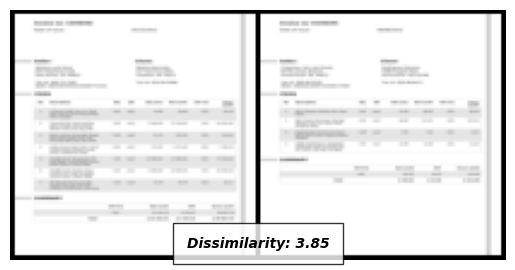

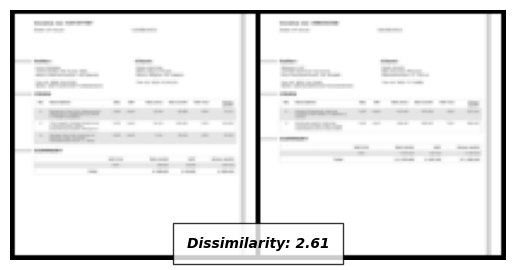

In [ ]:
#non dupes(same class)
visualize_val_dissimilarity(siamese_net_alexnet_triplet, dataiter_2, 10)

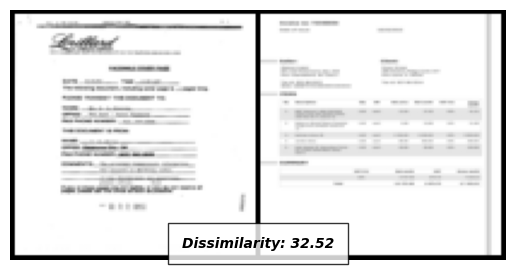

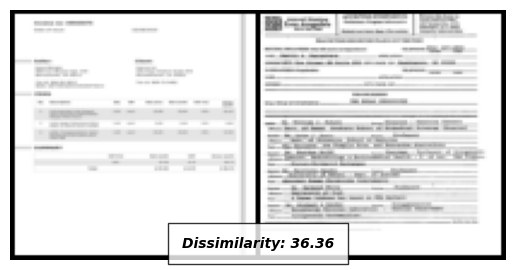

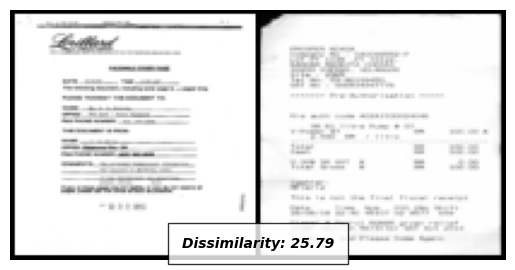

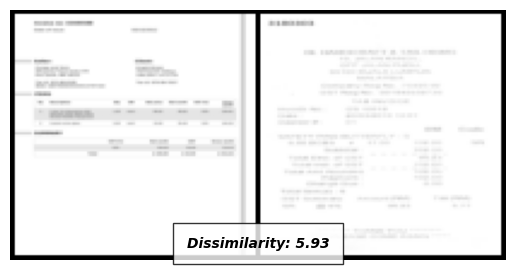

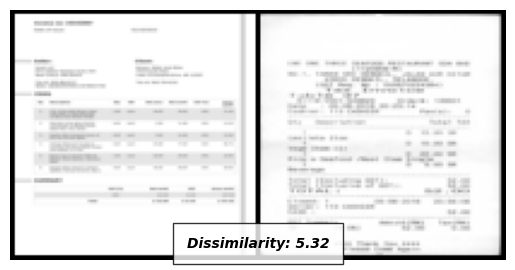

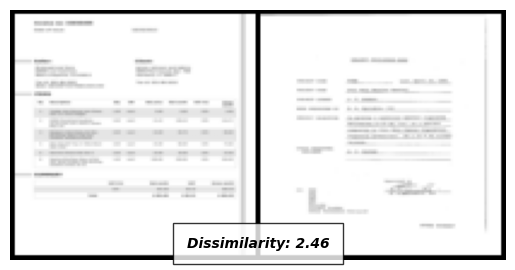

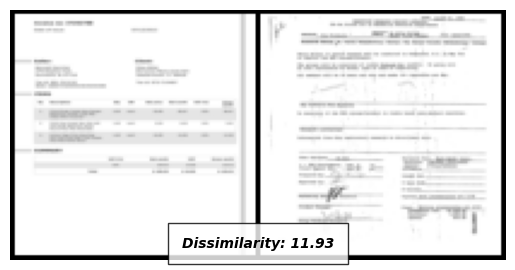

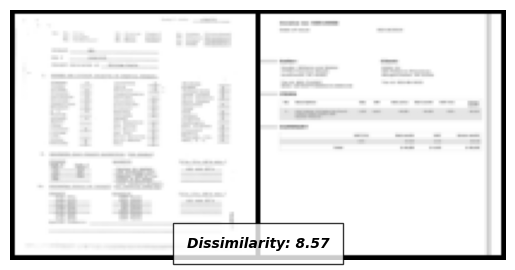

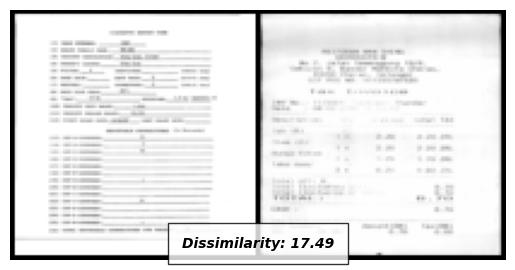

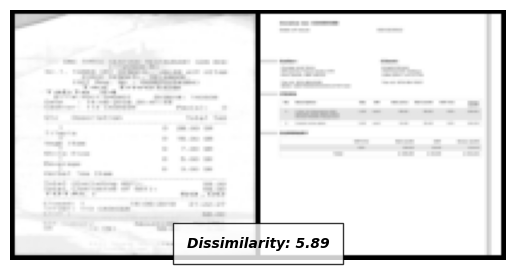

In [ ]:
#non dupes(different class)
visualize_val_dissimilarity(siamese_net_alexnet_triplet, dataiter_3, 10)

100%|██████████| 125/125 [00:00<00:00, 132.38it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.696, precision:1.0, recall:0.088, f1:0.16176470588235292
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 149.34it/s]


accuracy:0.7013333333333334, precision:1.0, recall:0.104, f1:0.18840579710144925
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 149.67it/s]


accuracy:0.7066666666666667, precision:1.0, recall:0.12, f1:0.21428571428571425
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.7093333333333334, precision:1.0, recall:0.128, f1:0.22695035460992907
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 149.88it/s]


accuracy:0.7093333333333334, precision:1.0, recall:0.128, f1:0.22695035460992907
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.712, precision:0.9473684210526315, recall:0.144, f1:0.25
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 149.67it/s]


accuracy:0.712, precision:0.9473684210526315, recall:0.144, f1:0.25
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7146666666666667, precision:0.95, recall:0.152, f1:0.2620689655172414
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.7226666666666667, precision:0.9565217391304348, recall:0.176, f1:0.29729729729729726
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.728, precision:0.96, recall:0.192, f1:0.32
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.728, precision:0.9259259259259259, recall:0.2, f1:0.32894736842105265
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.728, precision:0.9259259259259259, recall:0.2, f1:0.32894736842105265
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.7333333333333333, precision:0.9310344827586207, recall:0.216, f1:0.35064935064935066
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.7333333333333333, precision:0.9310344827586207, recall:0.216, f1:0.35064935064935066
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7386666666666667, precision:0.9354838709677419, recall:0.232, f1:0.37179487179487175
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 147.92it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.19000000000000003, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 149.34it/s]


accuracy:0.7386666666666667, precision:0.9090909090909091, recall:0.24, f1:0.379746835443038
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 149.52it/s]


accuracy:0.736, precision:0.8823529411764706, recall:0.24, f1:0.37735849056603776
Current threshold:0.21000000000000005, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.7386666666666667, precision:0.8857142857142857, recall:0.248, f1:0.3875
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.7386666666666667, precision:0.8857142857142857, recall:0.248, f1:0.3875
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.7386666666666667, precision:0.8857142857142857, recall:0.248, f1:0.3875
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:00<00:00, 149.85it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.7493333333333333, precision:0.8604651162790697, recall:0.296, f1:0.44047619047619047
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7493333333333333, precision:0.8604651162790697, recall:0.296, f1:0.44047619047619047
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7493333333333333, precision:0.8604651162790697, recall:0.296, f1:0.44047619047619047
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.7493333333333333, precision:0.8604651162790697, recall:0.296, f1:0.44047619047619047
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.7546666666666667, precision:0.8666666666666667, recall:0.312, f1:0.45882352941176474
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.76, precision:0.8723404255319149, recall:0.328, f1:0.47674418604651164
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.7626666666666667, precision:0.875, recall:0.336, f1:0.4855491329479769
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.7626666666666667, precision:0.875, recall:0.336, f1:0.4855491329479769
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.7626666666666667, precision:0.875, recall:0.336, f1:0.4855491329479769
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.7653333333333333, precision:0.8627450980392157, recall:0.352, f1:0.5
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.7653333333333333, precision:0.8627450980392157, recall:0.352, f1:0.5
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:00<00:00, 149.69it/s]


accuracy:0.7653333333333333, precision:0.8627450980392157, recall:0.352, f1:0.5
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.768, precision:0.8653846153846154, recall:0.36, f1:0.5084745762711865
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7706666666666667, precision:0.8679245283018868, recall:0.368, f1:0.5168539325842696
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.7706666666666667, precision:0.8679245283018868, recall:0.368, f1:0.5168539325842696
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.7706666666666667, precision:0.8679245283018868, recall:0.368, f1:0.5168539325842696
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:00<00:00, 142.17it/s]


accuracy:0.7733333333333333, precision:0.8703703703703703, recall:0.376, f1:0.5251396648044693
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.7813333333333333, precision:0.8771929824561403, recall:0.4, f1:0.5494505494505494
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 148.45it/s]


accuracy:0.784, precision:0.8793103448275862, recall:0.408, f1:0.5573770491803278
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.5100000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.7786666666666666, precision:0.85, recall:0.408, f1:0.5513513513513513
Current threshold:0.5200000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.7786666666666666, precision:0.85, recall:0.408, f1:0.5513513513513513
Current threshold:0.5300000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.7786666666666666, precision:0.85, recall:0.408, f1:0.5513513513513513
Current threshold:0.5400000000000003, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 146.53it/s]


accuracy:0.7813333333333333, precision:0.8524590163934426, recall:0.416, f1:0.5591397849462365
Current threshold:0.5500000000000003, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.7813333333333333, precision:0.8524590163934426, recall:0.416, f1:0.5591397849462365
Current threshold:0.5600000000000003, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 142.71it/s]


accuracy:0.7813333333333333, precision:0.8524590163934426, recall:0.416, f1:0.5591397849462365
Current threshold:0.5700000000000003, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.7893333333333333, precision:0.8484848484848485, recall:0.448, f1:0.5863874345549738
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:00<00:00, 146.70it/s]


accuracy:0.7893333333333333, precision:0.8484848484848485, recall:0.448, f1:0.5863874345549738
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:00<00:00, 145.49it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 146.37it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.6600000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.6700000000000004, Best threshold:0.6600


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:0.6800000000000004, Best threshold:0.6700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:0.7200000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8026666666666666, precision:0.8591549295774648, recall:0.488, f1:0.6224489795918366
Current threshold:0.7300000000000004, Best threshold:0.7200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.8026666666666666, precision:0.8591549295774648, recall:0.488, f1:0.6224489795918366
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:00<00:00, 145.49it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:00<00:00, 145.15it/s]


accuracy:0.8053333333333333, precision:0.8513513513513513, recall:0.504, f1:0.6331658291457286
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.8053333333333333, precision:0.8513513513513513, recall:0.504, f1:0.6331658291457286
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.808, precision:0.8533333333333334, recall:0.512, f1:0.64
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.8106666666666666, precision:0.8552631578947368, recall:0.52, f1:0.6467661691542289
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.8186666666666667, precision:0.8607594936708861, recall:0.544, f1:0.6666666666666666
Current threshold:0.8300000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.816, precision:0.85, recall:0.544, f1:0.6634146341463415
Current threshold:0.8400000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.816, precision:0.85, recall:0.544, f1:0.6634146341463415
Current threshold:0.8500000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.8600000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 143.81it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.8700000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.8800000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.8900000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.9000000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.816, precision:0.8414634146341463, recall:0.552, f1:0.6666666666666667
Current threshold:0.9100000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 146.81it/s]


accuracy:0.816, precision:0.8414634146341463, recall:0.552, f1:0.6666666666666667
Current threshold:0.9200000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 144.48it/s]


accuracy:0.8133333333333334, precision:0.8313253012048193, recall:0.552, f1:0.6634615384615384
Current threshold:0.9300000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 141.85it/s]


accuracy:0.816, precision:0.8333333333333334, recall:0.56, f1:0.6698564593301435
Current threshold:0.9400000000000006, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 144.81it/s]


accuracy:0.8186666666666667, precision:0.8352941176470589, recall:0.568, f1:0.6761904761904761
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8186666666666667, precision:0.8275862068965517, recall:0.576, f1:0.6792452830188679
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8186666666666667, precision:0.8275862068965517, recall:0.576, f1:0.6792452830188679
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8213333333333334, precision:0.8295454545454546, recall:0.584, f1:0.6854460093896714
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8213333333333334, precision:0.8295454545454546, recall:0.584, f1:0.6854460093896714
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8293333333333334, precision:0.8351648351648352, recall:0.608, f1:0.7037037037037037
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.22it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0100000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0200000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0300000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0400000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0500000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0600000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0700000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0800000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.0900000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:1.1000000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 148.96it/s]


accuracy:0.8266666666666667, precision:0.8191489361702128, recall:0.616, f1:0.7031963470319635
Current threshold:1.1100000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.57it/s]


accuracy:0.8266666666666667, precision:0.8191489361702128, recall:0.616, f1:0.7031963470319635
Current threshold:1.1200000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 142.64it/s]


accuracy:0.824, precision:0.8105263157894737, recall:0.616, f1:0.7
Current threshold:1.1300000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 142.12it/s]


accuracy:0.824, precision:0.8105263157894737, recall:0.616, f1:0.7
Current threshold:1.1400000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.824, precision:0.8105263157894737, recall:0.616, f1:0.7
Current threshold:1.1500000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.824, precision:0.8105263157894737, recall:0.616, f1:0.7
Current threshold:1.1600000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.8213333333333334, precision:0.8020833333333334, recall:0.616, f1:0.6968325791855204
Current threshold:1.1700000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 146.67it/s]


accuracy:0.8213333333333334, precision:0.8020833333333334, recall:0.616, f1:0.6968325791855204
Current threshold:1.1800000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.05it/s]


accuracy:0.8213333333333334, precision:0.8020833333333334, recall:0.616, f1:0.6968325791855204
Current threshold:1.1900000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


accuracy:0.8213333333333334, precision:0.8020833333333334, recall:0.616, f1:0.6968325791855204
Current threshold:1.2000000000000008, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.8186666666666667, precision:0.7938144329896907, recall:0.616, f1:0.6936936936936936
Current threshold:1.2100000000000009, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


accuracy:0.8186666666666667, precision:0.7938144329896907, recall:0.616, f1:0.6936936936936936
Current threshold:1.2200000000000009, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


accuracy:0.8186666666666667, precision:0.7938144329896907, recall:0.616, f1:0.6936936936936936
Current threshold:1.2300000000000009, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


accuracy:0.824, precision:0.797979797979798, recall:0.632, f1:0.7053571428571429
Current threshold:1.2400000000000009, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.2500000000000009, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.8293333333333334, precision:0.801980198019802, recall:0.648, f1:0.7168141592920354
Current threshold:1.260000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8266666666666667, precision:0.7941176470588235, recall:0.648, f1:0.7136563876651983
Current threshold:1.270000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8266666666666667, precision:0.7941176470588235, recall:0.648, f1:0.7136563876651983
Current threshold:1.280000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:1.290000000000001, Best threshold:1.2800


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:1.310000000000001, Best threshold:1.3000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:1.330000000000001, Best threshold:1.3200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8373333333333334, precision:0.8018867924528302, recall:0.68, f1:0.735930735930736
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8373333333333334, precision:0.8018867924528302, recall:0.68, f1:0.735930735930736
Current threshold:1.350000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8373333333333334, precision:0.8018867924528302, recall:0.68, f1:0.735930735930736
Current threshold:1.360000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8346666666666667, precision:0.794392523364486, recall:0.68, f1:0.7327586206896552
Current threshold:1.370000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:00<00:00, 148.10it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.390000000000001, Best threshold:1.3800


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.410000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:00<00:00, 148.97it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.420000000000001, Best threshold:1.4100


100%|██████████| 125/125 [00:00<00:00, 148.99it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:00<00:00, 148.45it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.450000000000001, Best threshold:1.4400


100%|██████████| 125/125 [00:00<00:00, 148.46it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.460000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:00<00:00, 148.28it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:1.470000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8346666666666667, precision:0.7889908256880734, recall:0.688, f1:0.7350427350427351
Current threshold:1.480000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8346666666666667, precision:0.7889908256880734, recall:0.688, f1:0.7350427350427351
Current threshold:1.490000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 147.40it/s]


accuracy:0.8346666666666667, precision:0.7889908256880734, recall:0.688, f1:0.7350427350427351
Current threshold:1.500000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.84, precision:0.7927927927927928, recall:0.704, f1:0.7457627118644067
Current threshold:1.5100000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8373333333333334, precision:0.7857142857142857, recall:0.704, f1:0.7426160337552741
Current threshold:1.5200000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8373333333333334, precision:0.7857142857142857, recall:0.704, f1:0.7426160337552741
Current threshold:1.5300000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 145.65it/s]


accuracy:0.8373333333333334, precision:0.7857142857142857, recall:0.704, f1:0.7426160337552741
Current threshold:1.5400000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8346666666666667, precision:0.7787610619469026, recall:0.704, f1:0.7394957983193277
Current threshold:1.5500000000000012, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8346666666666667, precision:0.7787610619469026, recall:0.704, f1:0.7394957983193277
Current threshold:1.5600000000000012, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8346666666666667, precision:0.7787610619469026, recall:0.704, f1:0.7394957983193277
Current threshold:1.5700000000000012, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8346666666666667, precision:0.7787610619469026, recall:0.704, f1:0.7394957983193277
Current threshold:1.5800000000000012, Best threshold:1.5000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.5900000000000012, Best threshold:1.5800


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6000000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6100000000000012, Best threshold:1.6000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6200000000000012, Best threshold:1.6100


100%|██████████| 125/125 [00:00<00:00, 148.44it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6300000000000012, Best threshold:1.6200


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6400000000000012, Best threshold:1.6300


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6500000000000012, Best threshold:1.6400


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6600000000000013, Best threshold:1.6500


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:1.6700000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.6800000000000013, Best threshold:1.6700


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.6900000000000013, Best threshold:1.6800


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.7000000000000013, Best threshold:1.6900


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.7100000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.7200000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.7300000000000013, Best threshold:1.7200


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.7400000000000013, Best threshold:1.7300


100%|██████████| 125/125 [00:00<00:00, 148.98it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:1.7500000000000013, Best threshold:1.7400


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.7600000000000013, Best threshold:1.7500


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.7700000000000014, Best threshold:1.7600


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.7800000000000014, Best threshold:1.7700


100%|██████████| 125/125 [00:00<00:00, 148.45it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.7900000000000014, Best threshold:1.7800


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.8000000000000014, Best threshold:1.7900


100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.8100000000000014, Best threshold:1.8000


100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


accuracy:0.8453333333333334, precision:0.7863247863247863, recall:0.736, f1:0.7603305785123966
Current threshold:1.8200000000000014, Best threshold:1.8100


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8300000000000014, Best threshold:1.8200


100%|██████████| 125/125 [00:00<00:00, 148.28it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8400000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:00<00:00, 148.63it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8500000000000014, Best threshold:1.8400


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8600000000000014, Best threshold:1.8500


100%|██████████| 125/125 [00:00<00:00, 147.92it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8700000000000014, Best threshold:1.8600


100%|██████████| 125/125 [00:00<00:00, 146.85it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8800000000000014, Best threshold:1.8700


100%|██████████| 125/125 [00:00<00:00, 147.86it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.8900000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:00<00:00, 148.81it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.9000000000000015, Best threshold:1.8900


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.9100000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8426666666666667, precision:0.775, recall:0.744, f1:0.7591836734693876
Current threshold:1.9200000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8426666666666667, precision:0.775, recall:0.744, f1:0.7591836734693876
Current threshold:1.9300000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8426666666666667, precision:0.775, recall:0.744, f1:0.7591836734693876
Current threshold:1.9400000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.84, precision:0.768595041322314, recall:0.744, f1:0.7560975609756098
Current threshold:1.9500000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8373333333333334, precision:0.7622950819672131, recall:0.744, f1:0.7530364372469635
Current threshold:1.9600000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8373333333333334, precision:0.7622950819672131, recall:0.744, f1:0.7530364372469635
Current threshold:1.9700000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8373333333333334, precision:0.7622950819672131, recall:0.744, f1:0.7530364372469635
Current threshold:1.9800000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.8373333333333334, precision:0.7580645161290323, recall:0.752, f1:0.7550200803212852
Current threshold:1.9900000000000015, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8373333333333334, precision:0.7580645161290323, recall:0.752, f1:0.7550200803212852
Current threshold:2.0000000000000013, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8346666666666667, precision:0.752, recall:0.752, f1:0.752
Current threshold:2.010000000000001, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 147.37it/s]


accuracy:0.8346666666666667, precision:0.752, recall:0.752, f1:0.752
Current threshold:2.020000000000001, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8346666666666667, precision:0.752, recall:0.752, f1:0.752
Current threshold:2.0300000000000007, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8346666666666667, precision:0.752, recall:0.752, f1:0.752
Current threshold:2.0400000000000005, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.832, precision:0.746031746031746, recall:0.752, f1:0.7490039840637451
Current threshold:2.0500000000000003, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.832, precision:0.7421875, recall:0.76, f1:0.7509881422924901
Current threshold:2.06, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.832, precision:0.7421875, recall:0.76, f1:0.7509881422924901
Current threshold:2.07, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8346666666666667, precision:0.7441860465116279, recall:0.768, f1:0.7559055118110236
Current threshold:2.0799999999999996, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.63it/s]


accuracy:0.8346666666666667, precision:0.7441860465116279, recall:0.768, f1:0.7559055118110236
Current threshold:2.0899999999999994, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8373333333333334, precision:0.7461538461538462, recall:0.776, f1:0.7607843137254902
Current threshold:2.099999999999999, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.109999999999999, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.98it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.1199999999999988, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.1299999999999986, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.1399999999999983, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.149999999999998, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 149.01it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.159999999999998, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.1699999999999977, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8346666666666667, precision:0.7404580152671756, recall:0.776, f1:0.7578125000000001
Current threshold:2.1799999999999975, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.84, precision:0.7443609022556391, recall:0.792, f1:0.7674418604651163
Current threshold:2.1899999999999973, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.84, precision:0.7443609022556391, recall:0.792, f1:0.7674418604651163
Current threshold:2.199999999999997, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8426666666666667, precision:0.746268656716418, recall:0.8, f1:0.7722007722007722
Current threshold:2.209999999999997, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.84, precision:0.7407407407407407, recall:0.8, f1:0.7692307692307692
Current threshold:2.2199999999999966, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.84, precision:0.7372262773722628, recall:0.808, f1:0.7709923664122138
Current threshold:2.2299999999999964, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.84, precision:0.7338129496402878, recall:0.816, f1:0.7727272727272726
Current threshold:2.239999999999996, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8426666666666667, precision:0.7357142857142858, recall:0.824, f1:0.7773584905660378
Current threshold:2.249999999999996, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8426666666666667, precision:0.7357142857142858, recall:0.824, f1:0.7773584905660378
Current threshold:2.259999999999996, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8426666666666667, precision:0.7357142857142858, recall:0.824, f1:0.7773584905660378
Current threshold:2.2699999999999956, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.8426666666666667, precision:0.7357142857142858, recall:0.824, f1:0.7773584905660378
Current threshold:2.2799999999999954, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.84, precision:0.7304964539007093, recall:0.824, f1:0.7744360902255638
Current threshold:2.289999999999995, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8426666666666667, precision:0.7323943661971831, recall:0.832, f1:0.7790262172284644
Current threshold:2.299999999999995, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8426666666666667, precision:0.7323943661971831, recall:0.832, f1:0.7790262172284644
Current threshold:2.3099999999999947, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.8426666666666667, precision:0.7323943661971831, recall:0.832, f1:0.7790262172284644
Current threshold:2.3199999999999945, Best threshold:1.9000


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.8453333333333334, precision:0.7342657342657343, recall:0.84, f1:0.7835820895522388
Current threshold:2.3299999999999943, Best threshold:2.3200


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.8453333333333334, precision:0.7342657342657343, recall:0.84, f1:0.7835820895522388
Current threshold:2.339999999999994, Best threshold:2.3300


100%|██████████| 125/125 [00:00<00:00, 149.67it/s]


accuracy:0.848, precision:0.7361111111111112, recall:0.848, f1:0.788104089219331
Current threshold:2.349999999999994, Best threshold:2.3400


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.848, precision:0.7361111111111112, recall:0.848, f1:0.788104089219331
Current threshold:2.3599999999999937, Best threshold:2.3500


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.848, precision:0.7361111111111112, recall:0.848, f1:0.788104089219331
Current threshold:2.3699999999999934, Best threshold:2.3600


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.848, precision:0.7361111111111112, recall:0.848, f1:0.788104089219331
Current threshold:2.3799999999999932, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8453333333333334, precision:0.7310344827586207, recall:0.848, f1:0.7851851851851852
Current threshold:2.389999999999993, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.20it/s]


accuracy:0.8453333333333334, precision:0.7310344827586207, recall:0.848, f1:0.7851851851851852
Current threshold:2.399999999999993, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8426666666666667, precision:0.726027397260274, recall:0.848, f1:0.7822878228782287
Current threshold:2.4099999999999926, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8426666666666667, precision:0.726027397260274, recall:0.848, f1:0.7822878228782287
Current threshold:2.4199999999999924, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.43it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.429999999999992, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.439999999999992, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.71it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.4499999999999917, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.51it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.4599999999999915, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.34it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.4699999999999913, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.479999999999991, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.489999999999991, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.4999999999999907, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.5099999999999905, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.5199999999999902, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.52999999999999, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.53999999999999, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.5499999999999896, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.5599999999999894, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.569999999999989, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.579999999999989, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.5899999999999888, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.84, precision:0.7210884353741497, recall:0.848, f1:0.7794117647058824
Current threshold:2.5999999999999885, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.59it/s]


accuracy:0.8373333333333334, precision:0.7162162162162162, recall:0.848, f1:0.7765567765567766
Current threshold:2.6099999999999883, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8346666666666667, precision:0.7114093959731543, recall:0.848, f1:0.7737226277372262
Current threshold:2.619999999999988, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8346666666666667, precision:0.7114093959731543, recall:0.848, f1:0.7737226277372262
Current threshold:2.629999999999988, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 147.40it/s]


accuracy:0.8346666666666667, precision:0.7114093959731543, recall:0.848, f1:0.7737226277372262
Current threshold:2.6399999999999877, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8346666666666667, precision:0.7114093959731543, recall:0.848, f1:0.7737226277372262
Current threshold:2.6499999999999875, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8346666666666667, precision:0.7114093959731543, recall:0.848, f1:0.7737226277372262
Current threshold:2.6599999999999873, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.14it/s]


accuracy:0.8373333333333334, precision:0.7133333333333334, recall:0.856, f1:0.7781818181818182
Current threshold:2.669999999999987, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8373333333333334, precision:0.7133333333333334, recall:0.856, f1:0.7781818181818182
Current threshold:2.679999999999987, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.6899999999999866, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.6999999999999864, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.31it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.709999999999986, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.719999999999986, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.42it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.7299999999999858, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.7399999999999856, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.7499999999999853, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.45it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.759999999999985, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.84, precision:0.7152317880794702, recall:0.864, f1:0.782608695652174
Current threshold:2.769999999999985, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.84, precision:0.7124183006535948, recall:0.872, f1:0.7841726618705036
Current threshold:2.7799999999999847, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.49it/s]


accuracy:0.84, precision:0.7124183006535948, recall:0.872, f1:0.7841726618705036
Current threshold:2.7899999999999845, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.76it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:2.7999999999999843, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.77it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:2.809999999999984, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.8346666666666667, precision:0.7032258064516129, recall:0.872, f1:0.7785714285714286
Current threshold:2.819999999999984, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


accuracy:0.832, precision:0.6987179487179487, recall:0.872, f1:0.7758007117437722
Current threshold:2.8299999999999836, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.8399999999999834, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.849999999999983, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.859999999999983, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.869999999999983, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.45it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.8799999999999826, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.13it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.8899999999999824, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.899999999999982, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.909999999999982, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.9199999999999817, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 149.16it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:2.9299999999999815, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.78it/s]


accuracy:0.832, precision:0.6962025316455697, recall:0.88, f1:0.7773851590106008
Current threshold:2.9399999999999813, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 146.03it/s]


accuracy:0.8293333333333334, precision:0.6918238993710691, recall:0.88, f1:0.7746478873239436
Current threshold:2.949999999999981, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


accuracy:0.8293333333333334, precision:0.6918238993710691, recall:0.88, f1:0.7746478873239436
Current threshold:2.959999999999981, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


accuracy:0.8266666666666667, precision:0.6875, recall:0.88, f1:0.7719298245614036
Current threshold:2.9699999999999807, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 147.58it/s]


accuracy:0.8266666666666667, precision:0.6875, recall:0.88, f1:0.7719298245614036
Current threshold:2.9799999999999804, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


accuracy:0.8266666666666667, precision:0.6875, recall:0.88, f1:0.7719298245614036
Current threshold:2.9899999999999802, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.09it/s]


accuracy:0.8266666666666667, precision:0.6875, recall:0.88, f1:0.7719298245614036
Current threshold:2.99999999999998, Best threshold:2.3700


100%|██████████| 125/125 [00:00<00:00, 148.25it/s]

accuracy:0.8266666666666667, precision:0.6875, recall:0.88, f1:0.7719298245614036
Current threshold:3.00999999999998, Best threshold:2.3700


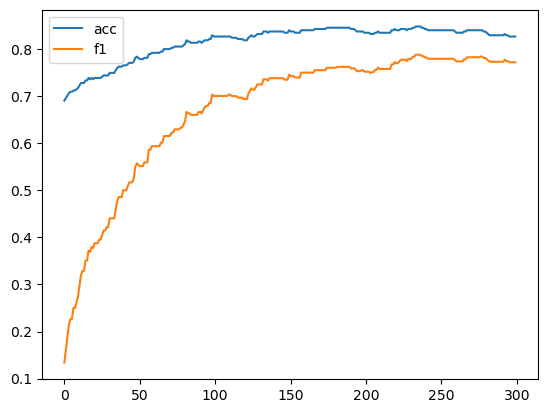

In [ ]:
optimized_threshold_alex_triplet, acc, f1 = find_optimized_threshold(siamese_net_alexnet_triplet, test_dataloader)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


Accuracy: 0.8480, Precision: 0.7361, Recall: 0.8480, F1-score: 0.7881


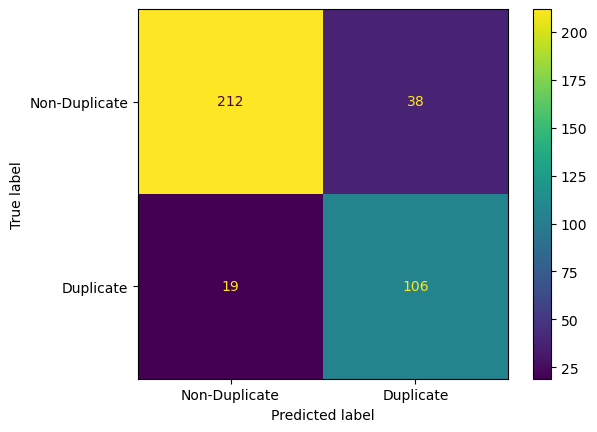

In [ ]:
evaluate_model(siamese_net_alexnet_triplet,test_dataloader, threshold=optimized_threshold_alex_triplet)

### 5.5 Siamese ResNet with Contrastive Loss <a class="anchor" id="section_5_5"></a>

Epoch 1/20, Train Loss: 0.6622455594448471, Val Loss: 0.7162552342112911
Epoch 2/20, Train Loss: 0.578958568610496, Val Loss: 0.6150239414388412
Epoch 3/20, Train Loss: 0.44429405915894005, Val Loss: 0.5514048251176351
Epoch 4/20, Train Loss: 0.3312960465524444, Val Loss: 0.5358094964666587
Epoch 5/20, Train Loss: 0.24994224404278947, Val Loss: 0.5175126375336396
Epoch 6/20, Train Loss: 0.19191488525585124, Val Loss: 0.5208004295433822
Epoch 7/20, Train Loss: 0.1575393145413775, Val Loss: 0.5124733834282348
Epoch 8/20, Train Loss: 0.13420643450349176, Val Loss: 0.5189412173471952
Epoch 9/20, Train Loss: 0.13428262029897028, Val Loss: 0.5165854021906853
Epoch 10/20, Train Loss: 0.15362818709476606, Val Loss: 0.5072948120926556
Epoch 11/20, Train Loss: 0.11437600319837465, Val Loss: 0.524753898284153
Epoch 12/20, Train Loss: 0.09541680269850124, Val Loss: 0.5010118206080637
Epoch 13/20, Train Loss: 0.09064239329707466, Val Loss: 0.5180486566142032
Epoch 14/20, Train Loss: 0.0900834211221

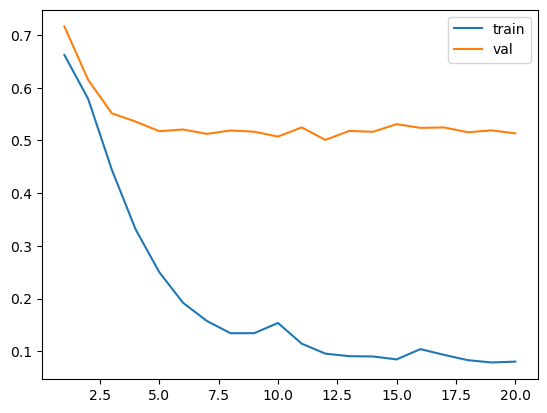

0.5134469358936736

In [ ]:
siamese_net_resnet = SiameseResNet()
train_siamese_network(siamese_net_resnet, train_dataloader, val_dataloader, num_epochs=20, learning_rate=0.00001)

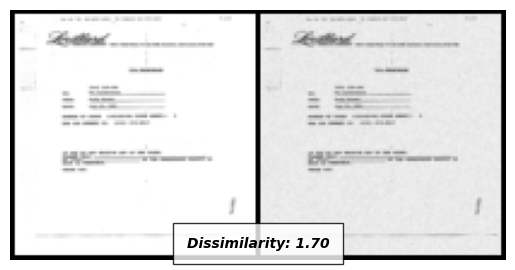

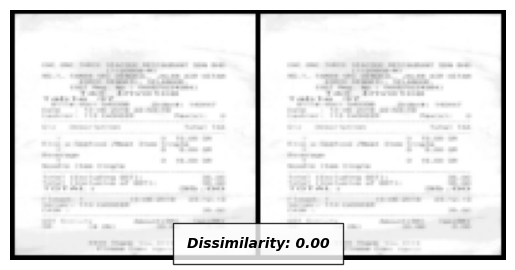

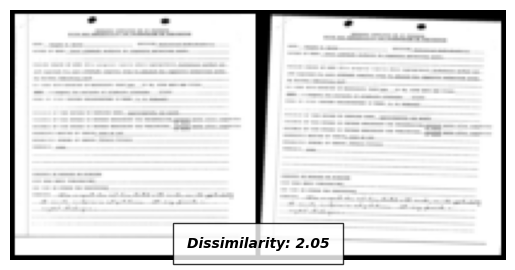

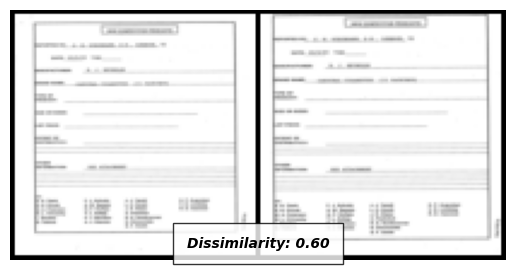

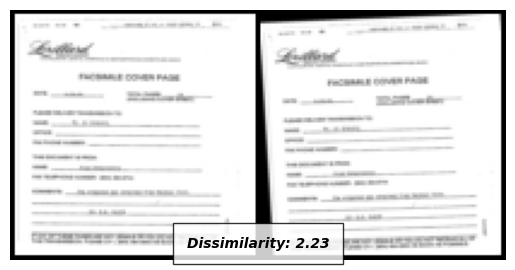

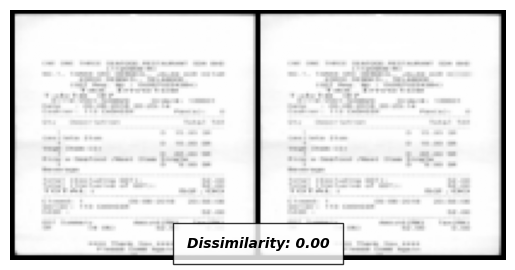

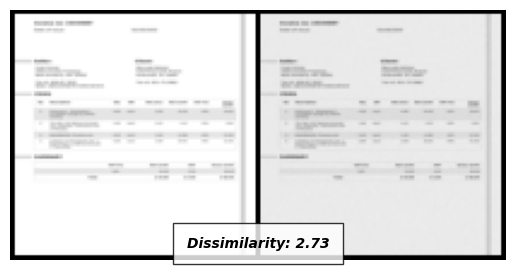

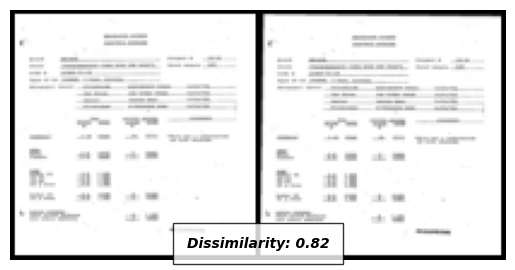

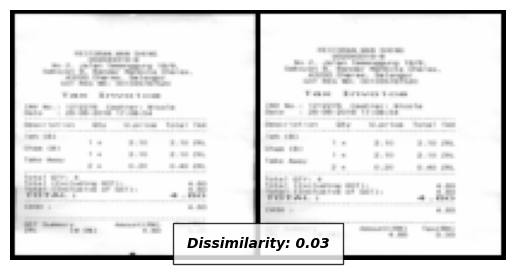

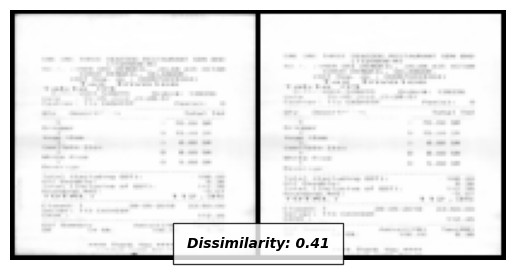

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_resnet, dataiter_1, 10)

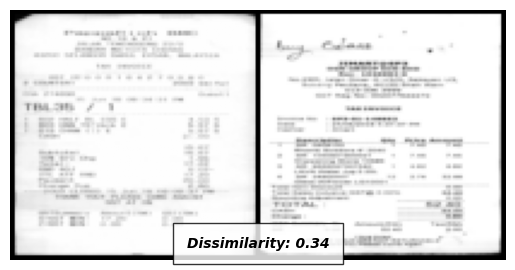

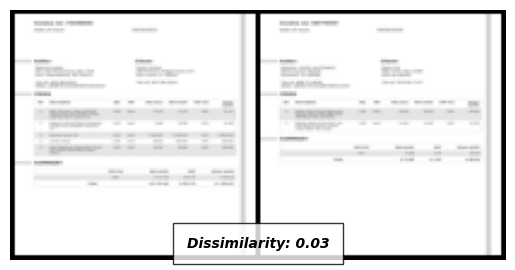

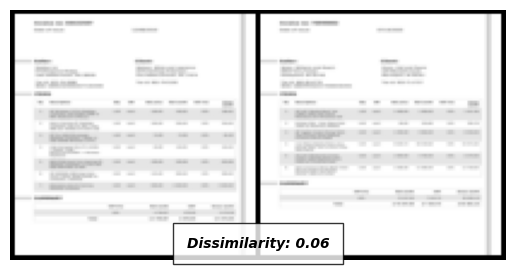

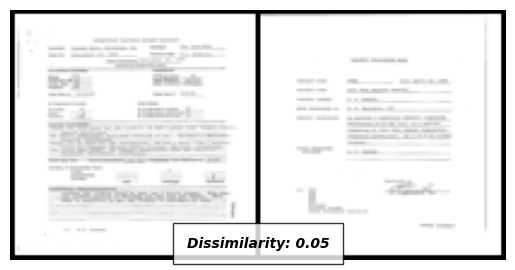

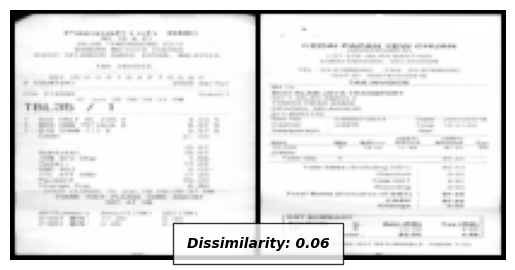

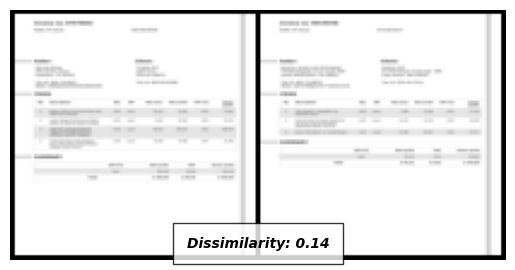

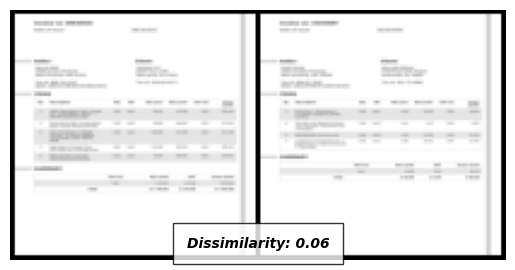

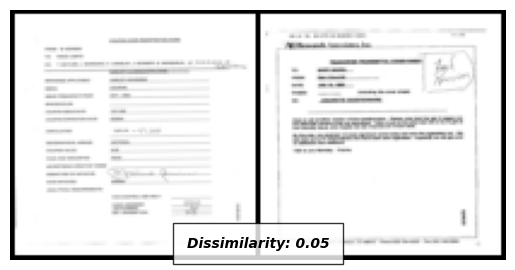

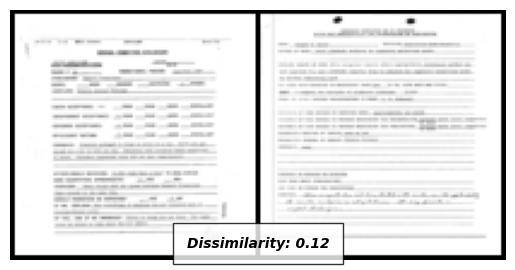

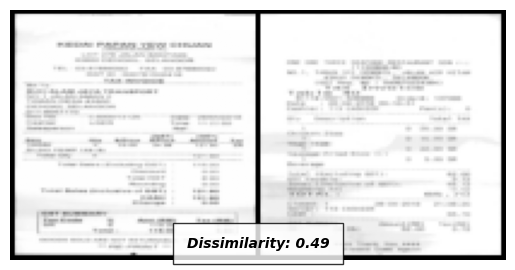

In [ ]:
#non dupes(same class)
visualize_val_dissimilarity(siamese_net_resnet, dataiter_2, 10)

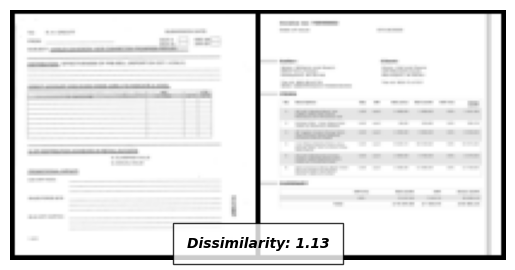

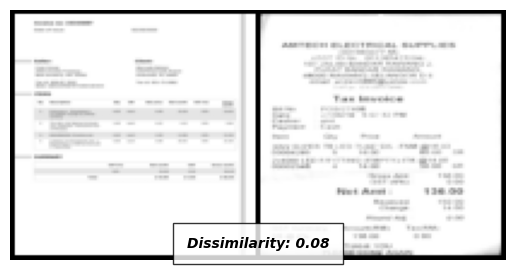

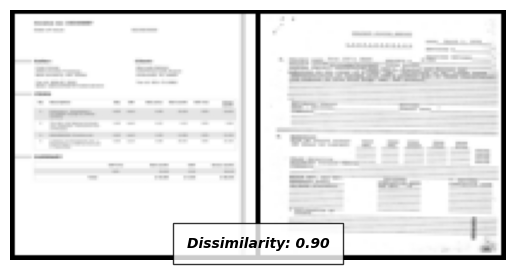

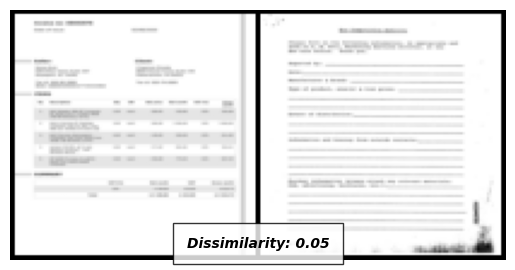

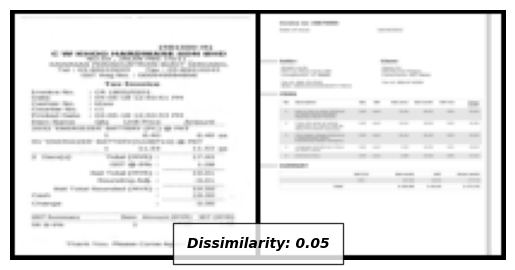

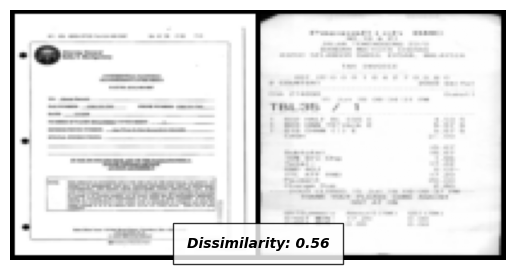

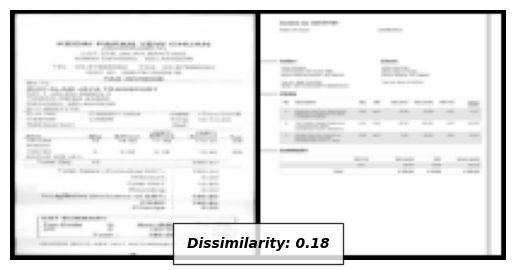

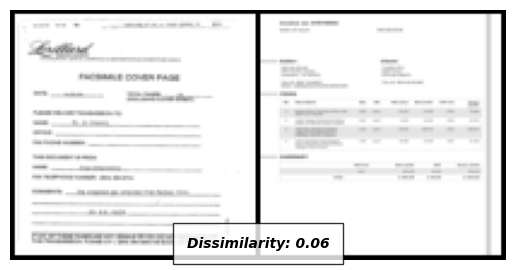

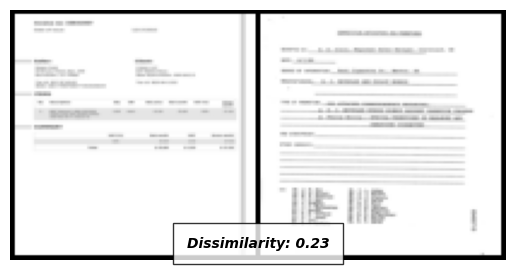

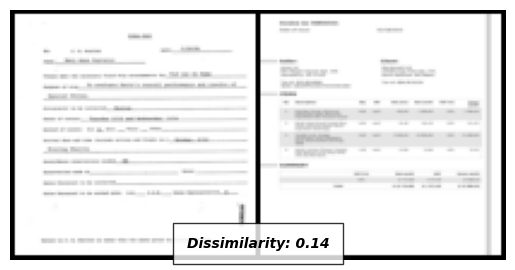

In [ ]:
#non dupes(different class)
visualize_val_dissimilarity(siamese_net_resnet , dataiter_3, 10)

100%|██████████| 125/125 [00:02<00:00, 46.60it/s]


accuracy:0.6933333333333334, precision:0.8571428571428571, recall:0.096, f1:0.17266187050359713
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.07it/s]


accuracy:0.6826666666666666, precision:0.6153846153846154, recall:0.128, f1:0.2119205298013245
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.13it/s]


accuracy:0.6826666666666666, precision:0.5833333333333334, recall:0.168, f1:0.26086956521739135
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.03it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.176, f1:0.2603550295857988
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6453333333333333, precision:0.42857142857142855, recall:0.192, f1:0.26519337016574585
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.05it/s]


accuracy:0.632, precision:0.3968253968253968, recall:0.2, f1:0.26595744680851063
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.16it/s]


accuracy:0.616, precision:0.36231884057971014, recall:0.2, f1:0.2577319587628866
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.97it/s]


accuracy:0.6133333333333333, precision:0.3611111111111111, recall:0.208, f1:0.2639593908629441
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.99it/s]


accuracy:0.5866666666666667, precision:0.3170731707317073, recall:0.208, f1:0.25120772946859904
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.03it/s]


accuracy:0.5706666666666667, precision:0.29545454545454547, recall:0.208, f1:0.24413145539906103
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.07it/s]


accuracy:0.5493333333333333, precision:0.2708333333333333, recall:0.208, f1:0.2352941176470588
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.76it/s]


accuracy:0.5413333333333333, precision:0.26262626262626265, recall:0.208, f1:0.23214285714285715
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.93it/s]


accuracy:0.5146666666666667, precision:0.23853211009174313, recall:0.208, f1:0.22222222222222224
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.99it/s]


accuracy:0.5066666666666667, precision:0.23214285714285715, recall:0.208, f1:0.21940928270042193
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.05it/s]


accuracy:0.49333333333333335, precision:0.2222222222222222, recall:0.208, f1:0.21487603305785125
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.01it/s]


accuracy:0.4826666666666667, precision:0.21951219512195122, recall:0.216, f1:0.21774193548387097
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.16it/s]


accuracy:0.47733333333333333, precision:0.216, recall:0.216, f1:0.216
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.79it/s]


accuracy:0.472, precision:0.22137404580152673, recall:0.232, f1:0.22656250000000003
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.03it/s]


accuracy:0.4666666666666667, precision:0.21804511278195488, recall:0.232, f1:0.22480620155038758
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.54it/s]


accuracy:0.456, precision:0.2116788321167883, recall:0.232, f1:0.22137404580152673
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.11it/s]


accuracy:0.4533333333333333, precision:0.21830985915492956, recall:0.248, f1:0.23220973782771534
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.20it/s]


accuracy:0.43733333333333335, precision:0.20945945945945946, recall:0.248, f1:0.22710622710622713
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.80it/s]


accuracy:0.42133333333333334, precision:0.2012987012987013, recall:0.248, f1:0.2222222222222222
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.97it/s]


accuracy:0.4186666666666667, precision:0.2, recall:0.248, f1:0.22142857142857145
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.78it/s]


accuracy:0.4, precision:0.1951219512195122, recall:0.256, f1:0.22145328719723184
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.30it/s]


accuracy:0.4, precision:0.1951219512195122, recall:0.256, f1:0.22145328719723184
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.26it/s]


accuracy:0.38666666666666666, precision:0.1893491124260355, recall:0.256, f1:0.217687074829932
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.12it/s]


accuracy:0.37333333333333335, precision:0.1875, recall:0.264, f1:0.21926910299003322
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.11it/s]


accuracy:0.35733333333333334, precision:0.1813186813186813, recall:0.264, f1:0.21498371335504884
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.32it/s]


accuracy:0.352, precision:0.1827956989247312, recall:0.272, f1:0.21864951768488747
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.91it/s]


accuracy:0.336, precision:0.17708333333333334, recall:0.272, f1:0.21451104100946372
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.01it/s]


accuracy:0.33066666666666666, precision:0.17525773195876287, recall:0.272, f1:0.21316614420062696
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.03it/s]


accuracy:0.328, precision:0.18090452261306533, recall:0.288, f1:0.2222222222222222
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.28it/s]


accuracy:0.31466666666666665, precision:0.17647058823529413, recall:0.288, f1:0.2188449848024316
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.20it/s]


accuracy:0.31466666666666665, precision:0.17647058823529413, recall:0.288, f1:0.2188449848024316
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.07it/s]


accuracy:0.30666666666666664, precision:0.17703349282296652, recall:0.296, f1:0.22155688622754494
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.01it/s]


accuracy:0.30133333333333334, precision:0.17535545023696683, recall:0.296, f1:0.22023809523809523
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.2906666666666667, precision:0.17209302325581396, recall:0.296, f1:0.21764705882352944
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.26it/s]


accuracy:0.288, precision:0.1712962962962963, recall:0.296, f1:0.21700879765395892
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.11it/s]


accuracy:0.2826666666666667, precision:0.16972477064220184, recall:0.296, f1:0.21574344023323613
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.02it/s]


accuracy:0.27466666666666667, precision:0.167420814479638, recall:0.296, f1:0.21387283236994217
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.11it/s]


accuracy:0.272, precision:0.16964285714285715, recall:0.304, f1:0.2177650429799427
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.16it/s]


accuracy:0.2613333333333333, precision:0.16666666666666666, recall:0.304, f1:0.21529745042492918
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.86it/s]


accuracy:0.2613333333333333, precision:0.16666666666666666, recall:0.304, f1:0.21529745042492918
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.01it/s]


accuracy:0.25066666666666665, precision:0.16379310344827586, recall:0.304, f1:0.21288515406162464
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.26it/s]


accuracy:0.24533333333333332, precision:0.1623931623931624, recall:0.304, f1:0.21169916434540387
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.24it/s]


accuracy:0.24533333333333332, precision:0.1623931623931624, recall:0.304, f1:0.21169916434540387
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.03it/s]


accuracy:0.23733333333333334, precision:0.16033755274261605, recall:0.304, f1:0.2099447513812155
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.09it/s]


accuracy:0.23733333333333334, precision:0.16317991631799164, recall:0.312, f1:0.2142857142857143
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.23733333333333334, precision:0.16317991631799164, recall:0.312, f1:0.2142857142857143
Current threshold:0.5100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.05it/s]


accuracy:0.23466666666666666, precision:0.1625, recall:0.312, f1:0.21369863013698628
Current threshold:0.5200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.99it/s]


accuracy:0.232, precision:0.16182572614107885, recall:0.312, f1:0.21311475409836064
Current threshold:0.5300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.01it/s]


accuracy:0.232, precision:0.1646090534979424, recall:0.32, f1:0.21739130434782608
Current threshold:0.5400000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.22it/s]


accuracy:0.22666666666666666, precision:0.16326530612244897, recall:0.32, f1:0.21621621621621617
Current threshold:0.5500000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.16it/s]


accuracy:0.21866666666666668, precision:0.16129032258064516, recall:0.32, f1:0.21447721179624663
Current threshold:0.5600000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.95it/s]


accuracy:0.216, precision:0.1606425702811245, recall:0.32, f1:0.21390374331550802
Current threshold:0.5700000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.40it/s]


accuracy:0.216, precision:0.1606425702811245, recall:0.32, f1:0.21390374331550802
Current threshold:0.5800000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.18it/s]


accuracy:0.216, precision:0.1606425702811245, recall:0.32, f1:0.21390374331550802
Current threshold:0.5900000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.97it/s]


accuracy:0.21333333333333335, precision:0.16, recall:0.32, f1:0.21333333333333335
Current threshold:0.6000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.05it/s]


accuracy:0.20533333333333334, precision:0.15810276679841898, recall:0.32, f1:0.21164021164021163
Current threshold:0.6100000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.03it/s]


accuracy:0.20266666666666666, precision:0.15748031496062992, recall:0.32, f1:0.21108179419525067
Current threshold:0.6200000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.04it/s]


accuracy:0.20266666666666666, precision:0.15748031496062992, recall:0.32, f1:0.21108179419525067
Current threshold:0.6300000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.20266666666666666, precision:0.15748031496062992, recall:0.32, f1:0.21108179419525067
Current threshold:0.6400000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.07it/s]


accuracy:0.20266666666666666, precision:0.15748031496062992, recall:0.32, f1:0.21108179419525067
Current threshold:0.6500000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.95it/s]


accuracy:0.19466666666666665, precision:0.1556420233463035, recall:0.32, f1:0.2094240837696335
Current threshold:0.6600000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.07it/s]


accuracy:0.19466666666666665, precision:0.1556420233463035, recall:0.32, f1:0.2094240837696335
Current threshold:0.6700000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.10it/s]


accuracy:0.19466666666666665, precision:0.1556420233463035, recall:0.32, f1:0.2094240837696335
Current threshold:0.6800000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.31it/s]


accuracy:0.19466666666666665, precision:0.1556420233463035, recall:0.32, f1:0.2094240837696335
Current threshold:0.6900000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.90it/s]


accuracy:0.19466666666666665, precision:0.1556420233463035, recall:0.32, f1:0.2094240837696335
Current threshold:0.7000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.93it/s]


accuracy:0.19466666666666665, precision:0.1556420233463035, recall:0.32, f1:0.2094240837696335
Current threshold:0.7100000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.95it/s]


accuracy:0.192, precision:0.1576923076923077, recall:0.328, f1:0.21298701298701297
Current threshold:0.7200000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.192, precision:0.1576923076923077, recall:0.328, f1:0.21298701298701297
Current threshold:0.7300000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.99it/s]


accuracy:0.192, precision:0.1576923076923077, recall:0.328, f1:0.21298701298701297
Current threshold:0.7400000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.16it/s]


accuracy:0.18933333333333333, precision:0.15708812260536398, recall:0.328, f1:0.21243523316062177
Current threshold:0.7500000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.95it/s]


accuracy:0.18666666666666668, precision:0.15648854961832062, recall:0.328, f1:0.2118863049095607
Current threshold:0.7600000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.74it/s]


accuracy:0.18933333333333333, precision:0.1596958174904943, recall:0.336, f1:0.21649484536082478
Current threshold:0.7700000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.78it/s]


accuracy:0.18933333333333333, precision:0.1596958174904943, recall:0.336, f1:0.21649484536082478
Current threshold:0.7800000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.80it/s]


accuracy:0.18933333333333333, precision:0.1596958174904943, recall:0.336, f1:0.21649484536082478
Current threshold:0.7900000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.93it/s]


accuracy:0.18666666666666668, precision:0.1590909090909091, recall:0.336, f1:0.2159383033419023
Current threshold:0.8000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.86it/s]


accuracy:0.18666666666666668, precision:0.1590909090909091, recall:0.336, f1:0.2159383033419023
Current threshold:0.8100000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.16it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8200000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.24it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8300000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.47it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8400000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8500000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.41it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8600000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.05it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8700000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.95it/s]


accuracy:0.184, precision:0.15849056603773584, recall:0.336, f1:0.21538461538461537
Current threshold:0.8800000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.78it/s]


accuracy:0.18666666666666668, precision:0.16165413533834586, recall:0.344, f1:0.21994884910485932
Current threshold:0.8900000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.07it/s]


accuracy:0.18666666666666668, precision:0.16165413533834586, recall:0.344, f1:0.21994884910485932
Current threshold:0.9000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.80it/s]


accuracy:0.18666666666666668, precision:0.16165413533834586, recall:0.344, f1:0.21994884910485932
Current threshold:0.9100000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.97it/s]


accuracy:0.18133333333333335, precision:0.16044776119402984, recall:0.344, f1:0.21882951653944022
Current threshold:0.9200000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.84it/s]


accuracy:0.18133333333333335, precision:0.16044776119402984, recall:0.344, f1:0.21882951653944022
Current threshold:0.9300000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.18it/s]


accuracy:0.18133333333333335, precision:0.16044776119402984, recall:0.344, f1:0.21882951653944022
Current threshold:0.9400000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.11it/s]


accuracy:0.17866666666666667, precision:0.15985130111524162, recall:0.344, f1:0.2182741116751269
Current threshold:0.9500000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.90it/s]


accuracy:0.176, precision:0.15925925925925927, recall:0.344, f1:0.21772151898734177
Current threshold:0.9600000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.61it/s]


accuracy:0.17866666666666667, precision:0.16236162361623616, recall:0.352, f1:0.2222222222222222
Current threshold:0.9700000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.90it/s]


accuracy:0.18133333333333335, precision:0.16544117647058823, recall:0.36, f1:0.22670025188916879
Current threshold:0.9800000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 51.09it/s]


accuracy:0.18133333333333335, precision:0.16544117647058823, recall:0.36, f1:0.22670025188916879
Current threshold:0.9900000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.93it/s]

accuracy:0.18133333333333335, precision:0.16544117647058823, recall:0.36, f1:0.22670025188916879
Current threshold:1.0000000000000007, Best threshold:0.0100


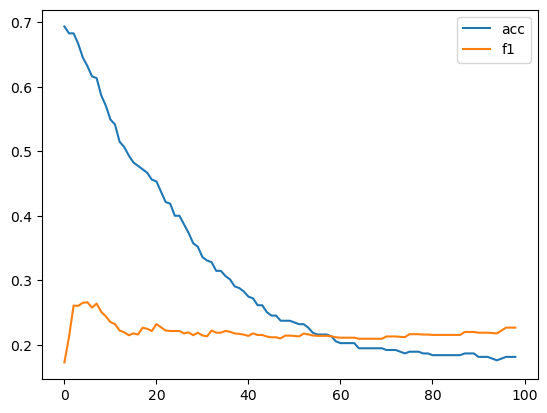

In [ ]:
optimized_threshold_resnet, acc, f1 = find_optimized_threshold(siamese_net_resnet, test_dataloader, max_threshold=1)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:02<00:00, 48.18it/s]


Accuracy: 0.6933, Precision: 0.8571, Recall: 0.0960, F1-score: 0.1727


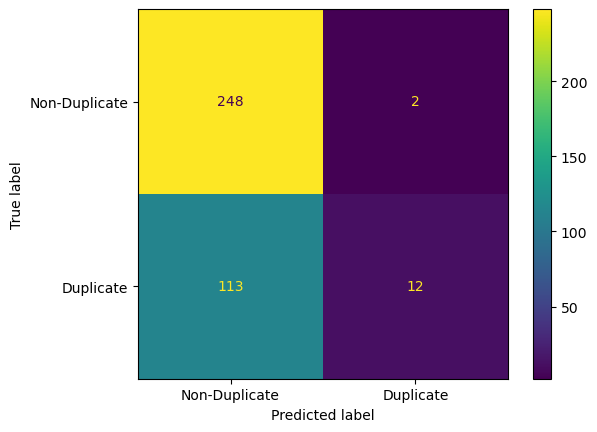

In [ ]:
evaluate_model(siamese_net_resnet,test_dataloader, threshold=optimized_threshold_resnet)

### 5.6 Siamese ResNet with Triplet Loss <a class="anchor" id="section_56"></a>

In [ ]:
siamese_net_resnet_triplet = SiameseResNet()
train_siamese_network(siamese_net_resnet_triplet, train_dataloader_triplet, val_dataloader_triplet, num_epochs=20, learning_rate=0.00001, loss_function="triplet")

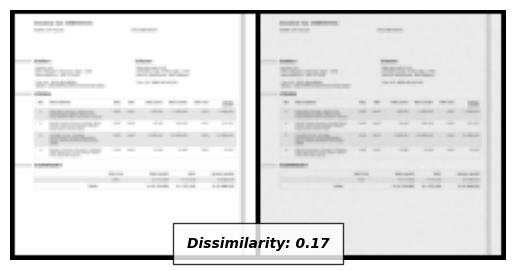

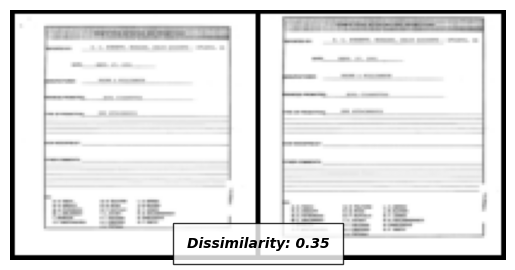

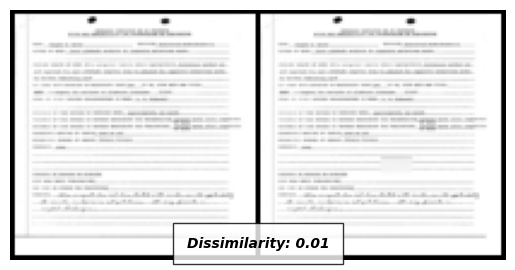

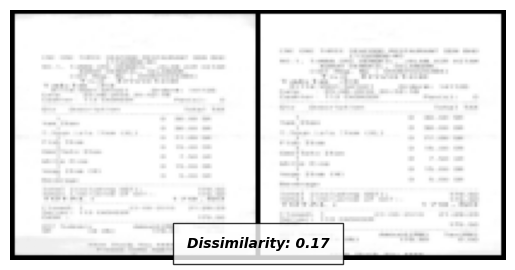

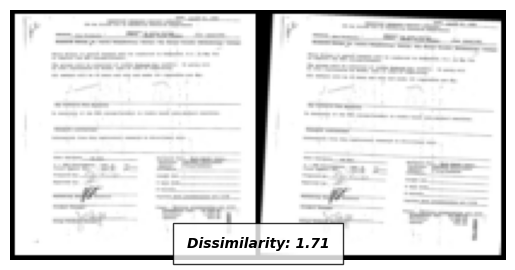

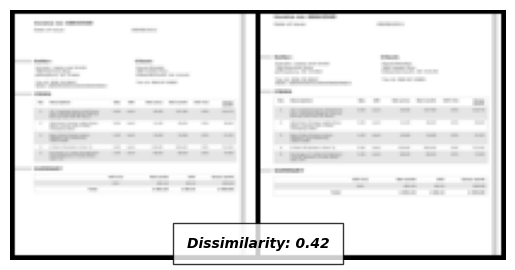

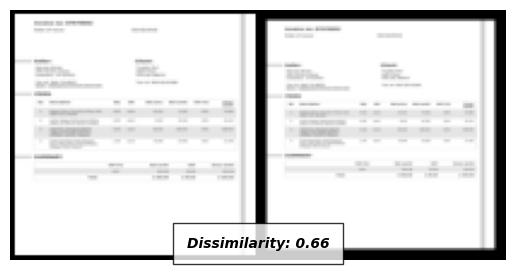

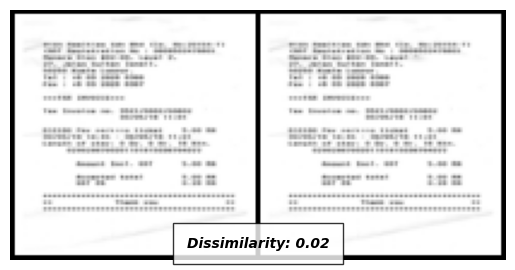

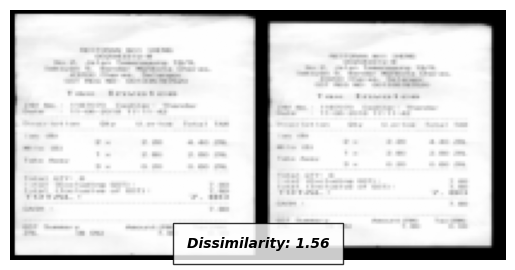

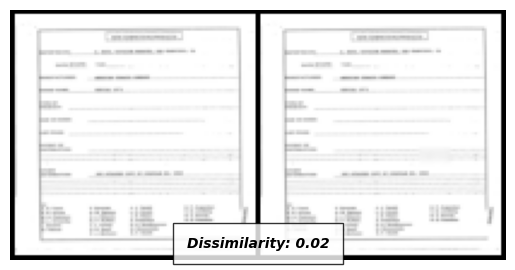

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_resnet_triplet, dataiter_1, 10)

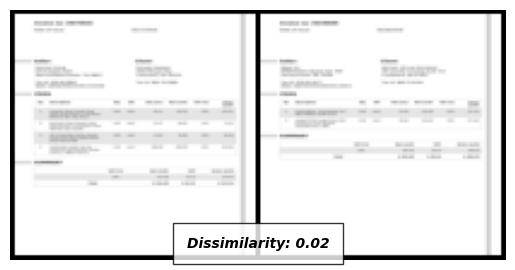

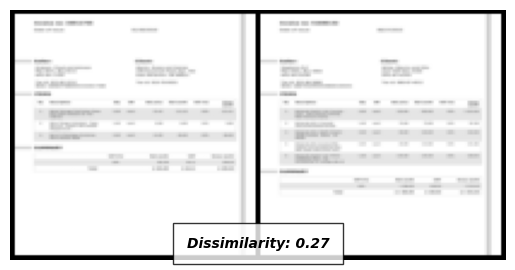

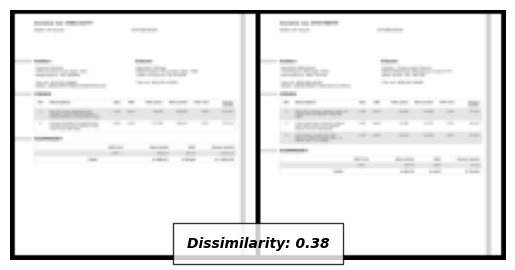

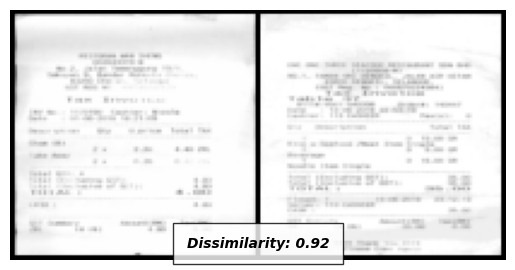

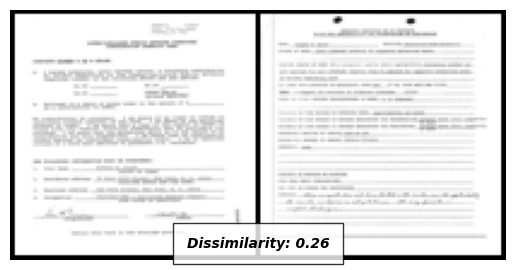

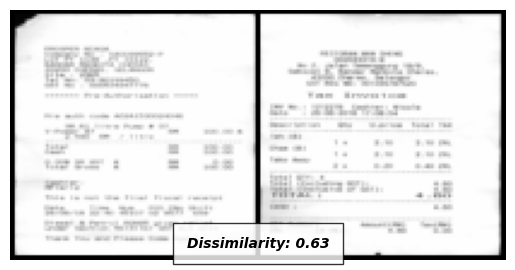

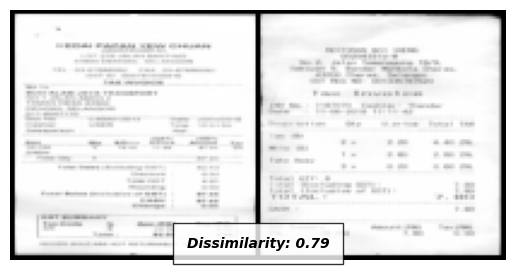

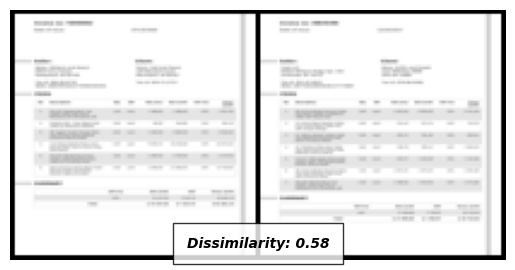

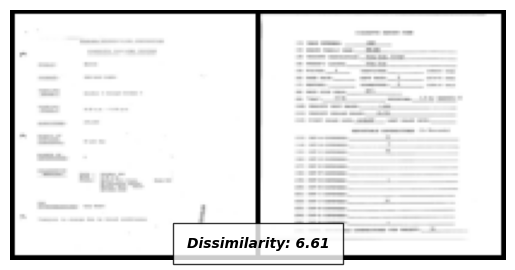

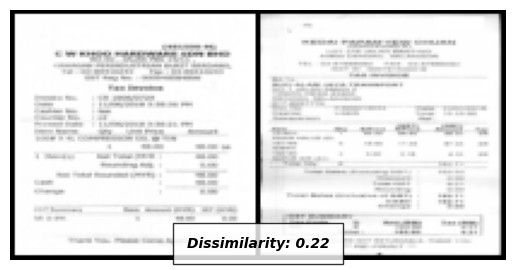

In [ ]:
#non dupes(same class)
visualize_val_dissimilarity(siamese_net_resnet_triplet, dataiter_2, 10)

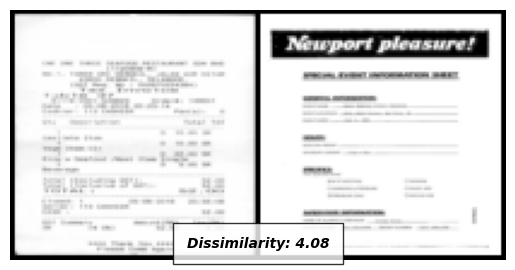

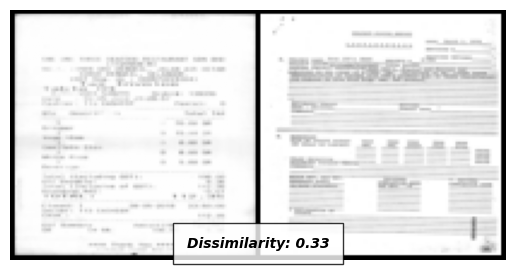

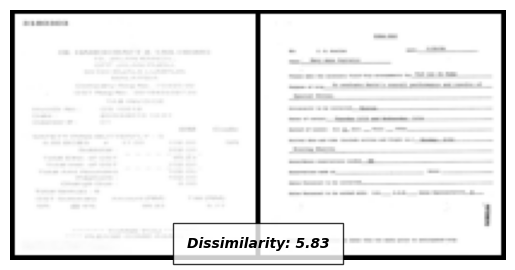

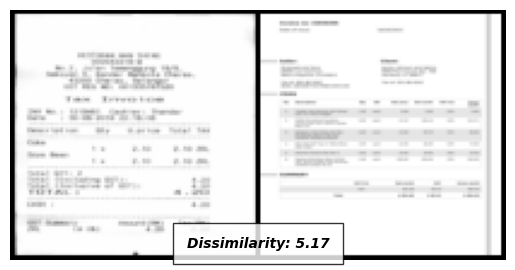

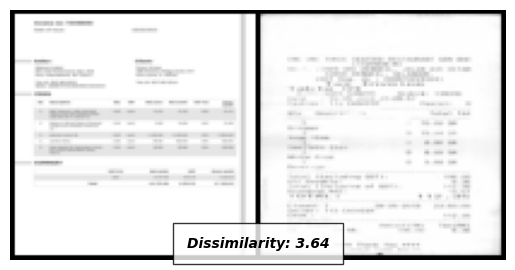

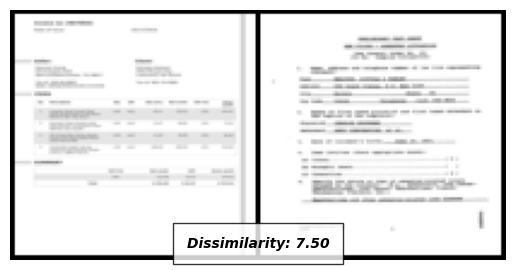

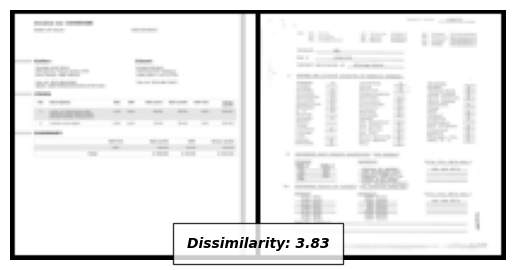

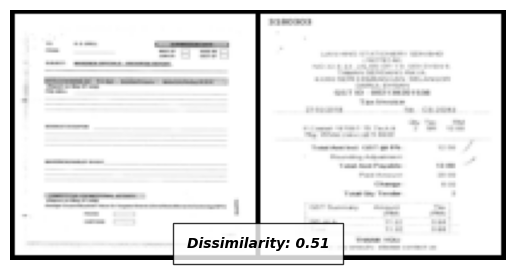

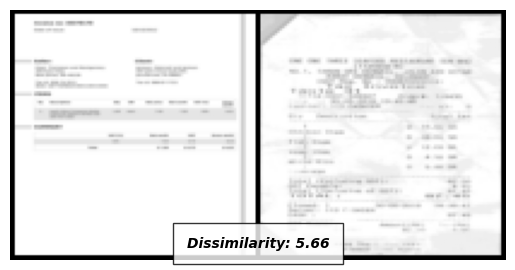

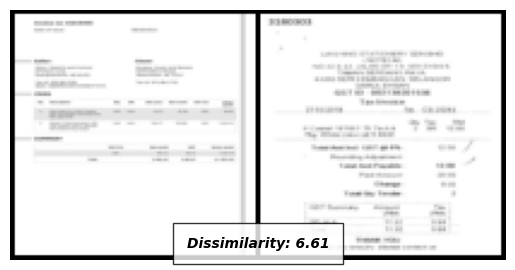

In [ ]:
#non dupes(different class)
visualize_val_dissimilarity(siamese_net_resnet_triplet , dataiter_3, 10)

100%|██████████| 125/125 [00:02<00:00, 46.36it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 50.17it/s]


accuracy:0.6933333333333334, precision:0.9166666666666666, recall:0.088, f1:0.16058394160583941
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:02<00:00, 49.79it/s]


accuracy:0.704, precision:0.8888888888888888, recall:0.128, f1:0.22377622377622375
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:02<00:00, 49.57it/s]


accuracy:0.7093333333333334, precision:0.9, recall:0.144, f1:0.24827586206896549
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 50.05it/s]


accuracy:0.7093333333333334, precision:0.9, recall:0.144, f1:0.24827586206896549
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:02<00:00, 49.71it/s]


accuracy:0.7146666666666667, precision:0.875, recall:0.168, f1:0.2818791946308725
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.7146666666666667, precision:0.8461538461538461, recall:0.176, f1:0.2913907284768211
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.72, precision:0.8571428571428571, recall:0.192, f1:0.3137254901960784
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.7253333333333334, precision:0.8666666666666667, recall:0.208, f1:0.3354838709677419
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:02<00:00, 50.25it/s]


accuracy:0.728, precision:0.8484848484848485, recall:0.224, f1:0.35443037974683544
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:02<00:00, 50.39it/s]


accuracy:0.728, precision:0.8285714285714286, recall:0.232, f1:0.3625
Current threshold:0.12999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.728, precision:0.7948717948717948, recall:0.248, f1:0.3780487804878048
Current threshold:0.13999999999999999, Best threshold:0.1100


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.7226666666666667, precision:0.7333333333333333, recall:0.264, f1:0.38823529411764707
Current threshold:0.15, Best threshold:0.1100


100%|██████████| 125/125 [00:02<00:00, 50.65it/s]


accuracy:0.7253333333333334, precision:0.7391304347826086, recall:0.272, f1:0.3976608187134503
Current threshold:0.16, Best threshold:0.1100


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.7306666666666667, precision:0.75, recall:0.288, f1:0.4161849710982658
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:02<00:00, 50.24it/s]


accuracy:0.7333333333333333, precision:0.7551020408163265, recall:0.296, f1:0.42528735632183906
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:02<00:00, 50.45it/s]


accuracy:0.7333333333333333, precision:0.7450980392156863, recall:0.304, f1:0.4318181818181818
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:02<00:00, 50.61it/s]


accuracy:0.7333333333333333, precision:0.7358490566037735, recall:0.312, f1:0.43820224719101125
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.49it/s]


accuracy:0.728, precision:0.7017543859649122, recall:0.32, f1:0.43956043956043955
Current threshold:0.21000000000000005, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.45it/s]


accuracy:0.7253333333333334, precision:0.6896551724137931, recall:0.32, f1:0.4371584699453552
Current threshold:0.22000000000000006, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.728, precision:0.6949152542372882, recall:0.328, f1:0.4456521739130435
Current threshold:0.23000000000000007, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.27it/s]


accuracy:0.7253333333333334, precision:0.6833333333333333, recall:0.328, f1:0.44324324324324327
Current threshold:0.24000000000000007, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.7226666666666667, precision:0.6666666666666666, recall:0.336, f1:0.4468085106382979
Current threshold:0.25000000000000006, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.45it/s]


accuracy:0.7173333333333334, precision:0.6461538461538462, recall:0.336, f1:0.4421052631578948
Current threshold:0.26000000000000006, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.7173333333333334, precision:0.6461538461538462, recall:0.336, f1:0.4421052631578948
Current threshold:0.2700000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.7173333333333334, precision:0.6461538461538462, recall:0.336, f1:0.4421052631578948
Current threshold:0.2800000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.7226666666666667, precision:0.6567164179104478, recall:0.352, f1:0.4583333333333333
Current threshold:0.2900000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.7226666666666667, precision:0.6567164179104478, recall:0.352, f1:0.4583333333333333
Current threshold:0.3000000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.52it/s]


accuracy:0.7226666666666667, precision:0.6521739130434783, recall:0.36, f1:0.46391752577319584
Current threshold:0.3100000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7253333333333334, precision:0.6571428571428571, recall:0.368, f1:0.4717948717948718
Current threshold:0.3200000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.7306666666666667, precision:0.6666666666666666, recall:0.384, f1:0.4873096446700508
Current threshold:0.3300000000000001, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.49it/s]


accuracy:0.728, precision:0.6575342465753424, recall:0.384, f1:0.4848484848484849
Current threshold:0.34000000000000014, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.21it/s]


accuracy:0.7253333333333334, precision:0.6486486486486487, recall:0.384, f1:0.4824120603015076
Current threshold:0.35000000000000014, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.7226666666666667, precision:0.64, recall:0.384, f1:0.48
Current threshold:0.36000000000000015, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.34it/s]


accuracy:0.728, precision:0.6493506493506493, recall:0.4, f1:0.49504950495049516
Current threshold:0.37000000000000016, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.50it/s]


accuracy:0.7306666666666667, precision:0.6538461538461539, recall:0.408, f1:0.5024630541871921
Current threshold:0.38000000000000017, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.7306666666666667, precision:0.65, recall:0.416, f1:0.5073170731707316
Current threshold:0.3900000000000002, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.728, precision:0.6419753086419753, recall:0.416, f1:0.5048543689320388
Current threshold:0.4000000000000002, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.728, precision:0.6385542168674698, recall:0.424, f1:0.5096153846153846
Current threshold:0.4100000000000002, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.7253333333333334, precision:0.627906976744186, recall:0.432, f1:0.5118483412322274
Current threshold:0.4200000000000002, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.39it/s]


accuracy:0.7253333333333334, precision:0.625, recall:0.44, f1:0.5164319248826291
Current threshold:0.4300000000000002, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.7306666666666667, precision:0.6304347826086957, recall:0.464, f1:0.5345622119815668
Current threshold:0.4400000000000002, Best threshold:0.1900


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7333333333333333, precision:0.631578947368421, recall:0.48, f1:0.5454545454545454
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.728, precision:0.6185567010309279, recall:0.48, f1:0.5405405405405406
Current threshold:0.46000000000000024, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7226666666666667, precision:0.6039603960396039, recall:0.488, f1:0.5398230088495575
Current threshold:0.47000000000000025, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.7253333333333334, precision:0.6057692307692307, recall:0.504, f1:0.5502183406113537
Current threshold:0.48000000000000026, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7253333333333334, precision:0.6037735849056604, recall:0.512, f1:0.5541125541125542
Current threshold:0.49000000000000027, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.7253333333333334, precision:0.6037735849056604, recall:0.512, f1:0.5541125541125542
Current threshold:0.5000000000000002, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.7253333333333334, precision:0.6037735849056604, recall:0.512, f1:0.5541125541125542
Current threshold:0.5100000000000002, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.728, precision:0.6074766355140186, recall:0.52, f1:0.560344827586207
Current threshold:0.5200000000000002, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.49it/s]


accuracy:0.7306666666666667, precision:0.6111111111111112, recall:0.528, f1:0.5665236051502146
Current threshold:0.5300000000000002, Best threshold:0.4400


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.7333333333333333, precision:0.6146788990825688, recall:0.536, f1:0.5726495726495726
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.7413333333333333, precision:0.6228070175438597, recall:0.568, f1:0.5941422594142259
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.7413333333333333, precision:0.6206896551724138, recall:0.576, f1:0.5975103734439834
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.7413333333333333, precision:0.6206896551724138, recall:0.576, f1:0.5975103734439834
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.7413333333333333, precision:0.6206896551724138, recall:0.576, f1:0.5975103734439834
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:02<00:00, 50.66it/s]


accuracy:0.744, precision:0.6239316239316239, recall:0.584, f1:0.6033057851239668
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:02<00:00, 50.66it/s]


accuracy:0.744, precision:0.6218487394957983, recall:0.592, f1:0.6065573770491803
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.744, precision:0.6198347107438017, recall:0.6, f1:0.6097560975609757
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.744, precision:0.6178861788617886, recall:0.608, f1:0.6129032258064517
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:02<00:00, 50.43it/s]


accuracy:0.744, precision:0.6178861788617886, recall:0.608, f1:0.6129032258064517
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7466666666666667, precision:0.6190476190476191, recall:0.624, f1:0.6215139442231075
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.7466666666666667, precision:0.6171875, recall:0.632, f1:0.6245059288537549
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.7466666666666667, precision:0.6171875, recall:0.632, f1:0.6245059288537549
Current threshold:0.6600000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.744, precision:0.6124031007751938, recall:0.632, f1:0.6220472440944882
Current threshold:0.6700000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7386666666666667, precision:0.6030534351145038, recall:0.632, f1:0.6171875000000001
Current threshold:0.6800000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.86it/s]


accuracy:0.736, precision:0.5984848484848485, recall:0.632, f1:0.6147859922178989
Current threshold:0.6900000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.54it/s]


accuracy:0.736, precision:0.5984848484848485, recall:0.632, f1:0.6147859922178989
Current threshold:0.7000000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.69it/s]


accuracy:0.7306666666666667, precision:0.5895522388059702, recall:0.632, f1:0.6100386100386102
Current threshold:0.7100000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.7306666666666667, precision:0.5882352941176471, recall:0.64, f1:0.6130268199233716
Current threshold:0.7200000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.7333333333333333, precision:0.5912408759124088, recall:0.648, f1:0.6183206106870229
Current threshold:0.7300000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.74it/s]


accuracy:0.728, precision:0.5827338129496403, recall:0.648, f1:0.6136363636363636
Current threshold:0.7400000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.728, precision:0.5827338129496403, recall:0.648, f1:0.6136363636363636
Current threshold:0.7500000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.36it/s]


accuracy:0.7253333333333334, precision:0.5774647887323944, recall:0.656, f1:0.6142322097378277
Current threshold:0.7600000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.47it/s]


accuracy:0.72, precision:0.5694444444444444, recall:0.656, f1:0.6096654275092936
Current threshold:0.7700000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.72, precision:0.5684931506849316, recall:0.664, f1:0.6125461254612546
Current threshold:0.7800000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.7226666666666667, precision:0.5714285714285714, recall:0.672, f1:0.6176470588235294
Current threshold:0.7900000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.66it/s]


accuracy:0.72, precision:0.5666666666666667, recall:0.68, f1:0.6181818181818183
Current threshold:0.8000000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.72, precision:0.5657894736842105, recall:0.688, f1:0.6209386281588448
Current threshold:0.8100000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.31it/s]


accuracy:0.712, precision:0.5548387096774193, recall:0.688, f1:0.6142857142857142
Current threshold:0.8200000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.41it/s]


accuracy:0.7093333333333334, precision:0.5512820512820513, recall:0.688, f1:0.6120996441281139
Current threshold:0.8300000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.11it/s]


accuracy:0.7093333333333334, precision:0.5506329113924051, recall:0.696, f1:0.6148409893992933
Current threshold:0.8400000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.7093333333333334, precision:0.55, recall:0.704, f1:0.6175438596491228
Current threshold:0.8500000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.7093333333333334, precision:0.55, recall:0.704, f1:0.6175438596491228
Current threshold:0.8600000000000005, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.704, precision:0.5426829268292683, recall:0.712, f1:0.615916955017301
Current threshold:0.8700000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.41it/s]


accuracy:0.6986666666666667, precision:0.536144578313253, recall:0.712, f1:0.6116838487972508
Current threshold:0.8800000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.29it/s]


accuracy:0.7066666666666667, precision:0.5443786982248521, recall:0.736, f1:0.6258503401360545
Current threshold:0.8900000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.7013333333333334, precision:0.5380116959064327, recall:0.736, f1:0.6216216216216216
Current threshold:0.9000000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.7013333333333334, precision:0.5380116959064327, recall:0.736, f1:0.6216216216216216
Current threshold:0.9100000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.7013333333333334, precision:0.5380116959064327, recall:0.736, f1:0.6216216216216216
Current threshold:0.9200000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6986666666666667, precision:0.5348837209302325, recall:0.736, f1:0.6195286195286196
Current threshold:0.9300000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.78it/s]


accuracy:0.6986666666666667, precision:0.5348837209302325, recall:0.736, f1:0.6195286195286196
Current threshold:0.9400000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.696, precision:0.5317919075144508, recall:0.736, f1:0.6174496644295302
Current threshold:0.9500000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.48it/s]


accuracy:0.6933333333333334, precision:0.5287356321839081, recall:0.736, f1:0.6153846153846154
Current threshold:0.9600000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.6826666666666666, precision:0.5168539325842697, recall:0.736, f1:0.6072607260726073
Current threshold:0.9700000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.6773333333333333, precision:0.5111111111111111, recall:0.736, f1:0.6032786885245901
Current threshold:0.9800000000000006, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.6773333333333333, precision:0.5111111111111111, recall:0.736, f1:0.6032786885245901
Current threshold:0.9900000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.6746666666666666, precision:0.5082872928176796, recall:0.736, f1:0.6013071895424837
Current threshold:1.0000000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.41it/s]


accuracy:0.6746666666666666, precision:0.5081967213114754, recall:0.744, f1:0.6038961038961038
Current threshold:1.0100000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.43it/s]


accuracy:0.6693333333333333, precision:0.5027027027027027, recall:0.744, f1:0.6
Current threshold:1.0200000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.672, precision:0.5053763440860215, recall:0.752, f1:0.6045016077170418
Current threshold:1.0300000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.99it/s]


accuracy:0.672, precision:0.5053763440860215, recall:0.752, f1:0.6045016077170418
Current threshold:1.0400000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 44.27it/s]


accuracy:0.6746666666666666, precision:0.5080213903743316, recall:0.76, f1:0.6089743589743589
Current threshold:1.0500000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 48.89it/s]


accuracy:0.672, precision:0.5053191489361702, recall:0.76, f1:0.6070287539936102
Current threshold:1.0600000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.51it/s]


accuracy:0.6746666666666666, precision:0.5079365079365079, recall:0.768, f1:0.6114649681528662
Current threshold:1.0700000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.49it/s]


accuracy:0.672, precision:0.5052631578947369, recall:0.768, f1:0.6095238095238096
Current threshold:1.0800000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.03it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.768, f1:0.6056782334384858
Current threshold:1.0900000000000007, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.664, precision:0.49743589743589745, recall:0.776, f1:0.6062500000000001
Current threshold:1.1000000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.25it/s]


accuracy:0.6613333333333333, precision:0.494949494949495, recall:0.784, f1:0.6068111455108359
Current threshold:1.1100000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.664, precision:0.49748743718592964, recall:0.792, f1:0.611111111111111
Current threshold:1.1200000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.95it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.8, f1:0.6153846153846154
Current threshold:1.1300000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.09it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.8, f1:0.6153846153846154
Current threshold:1.1400000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.13it/s]


accuracy:0.6693333333333333, precision:0.5024875621890548, recall:0.808, f1:0.6196319018404909
Current threshold:1.1500000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.37it/s]


accuracy:0.6693333333333333, precision:0.5024875621890548, recall:0.808, f1:0.6196319018404909
Current threshold:1.1600000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.808, f1:0.617737003058104
Current threshold:1.1700000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.808, f1:0.617737003058104
Current threshold:1.1800000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.33it/s]


accuracy:0.664, precision:0.4975369458128079, recall:0.808, f1:0.6158536585365854
Current threshold:1.1900000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.41it/s]


accuracy:0.664, precision:0.4975369458128079, recall:0.808, f1:0.6158536585365854
Current threshold:1.2000000000000008, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.24it/s]


accuracy:0.6613333333333333, precision:0.4950980392156863, recall:0.808, f1:0.6139817629179332
Current threshold:1.2100000000000009, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.6586666666666666, precision:0.4927536231884058, recall:0.816, f1:0.6144578313253012
Current threshold:1.2200000000000009, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.23it/s]


accuracy:0.6613333333333333, precision:0.4951923076923077, recall:0.824, f1:0.6186186186186186
Current threshold:1.2300000000000009, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.39it/s]


accuracy:0.664, precision:0.49760765550239233, recall:0.832, f1:0.622754491017964
Current threshold:1.2400000000000009, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.84, f1:0.6268656716417911
Current threshold:1.2500000000000009, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.6693333333333333, precision:0.5023696682464455, recall:0.848, f1:0.6309523809523809
Current threshold:1.260000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.95it/s]


accuracy:0.6693333333333333, precision:0.5023696682464455, recall:0.848, f1:0.6309523809523809
Current threshold:1.270000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.27it/s]


accuracy:0.6693333333333333, precision:0.5023696682464455, recall:0.848, f1:0.6309523809523809
Current threshold:1.280000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.43it/s]


accuracy:0.664, precision:0.49765258215962443, recall:0.848, f1:0.6272189349112427
Current threshold:1.290000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.6586666666666666, precision:0.4930232558139535, recall:0.848, f1:0.6235294117647059
Current threshold:1.300000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.656, precision:0.49074074074074076, recall:0.848, f1:0.6217008797653959
Current threshold:1.310000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.15it/s]


accuracy:0.656, precision:0.49074074074074076, recall:0.848, f1:0.6217008797653959
Current threshold:1.320000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.656, precision:0.49074074074074076, recall:0.848, f1:0.6217008797653959
Current threshold:1.330000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.43it/s]


accuracy:0.6586666666666666, precision:0.4930875576036866, recall:0.856, f1:0.6257309941520467
Current threshold:1.340000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.49it/s]


accuracy:0.6586666666666666, precision:0.4930875576036866, recall:0.856, f1:0.6257309941520467
Current threshold:1.350000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6613333333333333, precision:0.4954128440366973, recall:0.864, f1:0.6297376093294461
Current threshold:1.360000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.6613333333333333, precision:0.4954128440366973, recall:0.864, f1:0.6297376093294461
Current threshold:1.370000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.6613333333333333, precision:0.4954128440366973, recall:0.864, f1:0.6297376093294461
Current threshold:1.380000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.6586666666666666, precision:0.4931506849315068, recall:0.864, f1:0.6279069767441859
Current threshold:1.390000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.26it/s]


accuracy:0.6586666666666666, precision:0.49321266968325794, recall:0.872, f1:0.6300578034682082
Current threshold:1.400000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.76it/s]


accuracy:0.6533333333333333, precision:0.48878923766816146, recall:0.872, f1:0.6264367816091955
Current threshold:1.410000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.648, precision:0.48444444444444446, recall:0.872, f1:0.6228571428571428
Current threshold:1.420000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.648, precision:0.48444444444444446, recall:0.872, f1:0.6228571428571428
Current threshold:1.430000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.648, precision:0.48444444444444446, recall:0.872, f1:0.6228571428571428
Current threshold:1.440000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.6453333333333333, precision:0.4823008849557522, recall:0.872, f1:0.6210826210826211
Current threshold:1.450000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.45it/s]


accuracy:0.6453333333333333, precision:0.4823008849557522, recall:0.872, f1:0.6210826210826211
Current threshold:1.460000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.35it/s]


accuracy:0.6453333333333333, precision:0.4823008849557522, recall:0.872, f1:0.6210826210826211
Current threshold:1.470000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6453333333333333, precision:0.4823008849557522, recall:0.872, f1:0.6210826210826211
Current threshold:1.480000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.648, precision:0.4845814977973568, recall:0.88, f1:0.625
Current threshold:1.490000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.63it/s]


accuracy:0.6426666666666667, precision:0.48034934497816595, recall:0.88, f1:0.6214689265536724
Current threshold:1.500000000000001, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6426666666666667, precision:0.48034934497816595, recall:0.88, f1:0.6214689265536724
Current threshold:1.5100000000000011, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.6426666666666667, precision:0.48034934497816595, recall:0.88, f1:0.6214689265536724
Current threshold:1.5200000000000011, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6453333333333333, precision:0.4826086956521739, recall:0.888, f1:0.6253521126760564
Current threshold:1.5300000000000011, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6426666666666667, precision:0.4805194805194805, recall:0.888, f1:0.6235955056179775
Current threshold:1.5400000000000011, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.66it/s]


accuracy:0.6426666666666667, precision:0.4805194805194805, recall:0.888, f1:0.6235955056179775
Current threshold:1.5500000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.74it/s]


accuracy:0.6426666666666667, precision:0.4805194805194805, recall:0.888, f1:0.6235955056179775
Current threshold:1.5600000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.76it/s]


accuracy:0.6426666666666667, precision:0.48068669527896996, recall:0.896, f1:0.6256983240223464
Current threshold:1.5700000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6426666666666667, precision:0.48068669527896996, recall:0.896, f1:0.6256983240223464
Current threshold:1.5800000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.33it/s]


accuracy:0.6453333333333333, precision:0.4829059829059829, recall:0.904, f1:0.6295264623955432
Current threshold:1.5900000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.63it/s]


accuracy:0.6453333333333333, precision:0.4829059829059829, recall:0.904, f1:0.6295264623955432
Current threshold:1.6000000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.6426666666666667, precision:0.4808510638297872, recall:0.904, f1:0.6277777777777777
Current threshold:1.6100000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.47it/s]


accuracy:0.6453333333333333, precision:0.4830508474576271, recall:0.912, f1:0.6315789473684211
Current threshold:1.6200000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.60it/s]


accuracy:0.6426666666666667, precision:0.4810126582278481, recall:0.912, f1:0.6298342541436464
Current threshold:1.6300000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.70it/s]


accuracy:0.648, precision:0.48535564853556484, recall:0.928, f1:0.6373626373626373
Current threshold:1.6400000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.6500000000000012, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.38it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.6600000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.6700000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.76it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.6800000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.72it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.6900000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.7000000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.6426666666666667, precision:0.48132780082987553, recall:0.928, f1:0.6338797814207651
Current threshold:1.7100000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.31it/s]


accuracy:0.64, precision:0.4793388429752066, recall:0.928, f1:0.6321525885558583
Current threshold:1.7200000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.6373333333333333, precision:0.4773662551440329, recall:0.928, f1:0.6304347826086957
Current threshold:1.7300000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.7400000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.7500000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.58it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.7600000000000013, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.7700000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.7800000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.30it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.7900000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 49.44it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.8000000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.8100000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.8200000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.55it/s]


accuracy:0.6346666666666667, precision:0.47540983606557374, recall:0.928, f1:0.6287262872628726
Current threshold:1.8300000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]


accuracy:0.632, precision:0.47346938775510206, recall:0.928, f1:0.6270270270270271
Current threshold:1.8400000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.21it/s]


accuracy:0.6293333333333333, precision:0.4715447154471545, recall:0.928, f1:0.6253369272237197
Current threshold:1.8500000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.6293333333333333, precision:0.4715447154471545, recall:0.928, f1:0.6253369272237197
Current threshold:1.8600000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6266666666666667, precision:0.46963562753036436, recall:0.928, f1:0.6236559139784947
Current threshold:1.8700000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.624, precision:0.46774193548387094, recall:0.928, f1:0.6219839142091153
Current threshold:1.8800000000000014, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.37it/s]


accuracy:0.6213333333333333, precision:0.46586345381526106, recall:0.928, f1:0.6203208556149733
Current threshold:1.8900000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.53it/s]


accuracy:0.6213333333333333, precision:0.46586345381526106, recall:0.928, f1:0.6203208556149733
Current threshold:1.9000000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6213333333333333, precision:0.46586345381526106, recall:0.928, f1:0.6203208556149733
Current threshold:1.9100000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.39it/s]


accuracy:0.624, precision:0.468, recall:0.936, f1:0.624
Current threshold:1.9200000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.624, precision:0.468, recall:0.936, f1:0.624
Current threshold:1.9300000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.68it/s]


accuracy:0.624, precision:0.468, recall:0.936, f1:0.624
Current threshold:1.9400000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.78it/s]


accuracy:0.624, precision:0.468, recall:0.936, f1:0.624
Current threshold:1.9500000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.62it/s]


accuracy:0.6213333333333333, precision:0.46613545816733065, recall:0.936, f1:0.6223404255319149
Current threshold:1.9600000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.6186666666666667, precision:0.4642857142857143, recall:0.936, f1:0.6206896551724138
Current threshold:1.9700000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.41it/s]


accuracy:0.616, precision:0.4624505928853755, recall:0.936, f1:0.6190476190476191
Current threshold:1.9800000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.64it/s]


accuracy:0.6186666666666667, precision:0.4645669291338583, recall:0.944, f1:0.6226912928759895
Current threshold:1.9900000000000015, Best threshold:0.6500


100%|██████████| 125/125 [00:02<00:00, 50.51it/s]

accuracy:0.616, precision:0.4627450980392157, recall:0.944, f1:0.6210526315789473
Current threshold:2.0000000000000013, Best threshold:0.6500


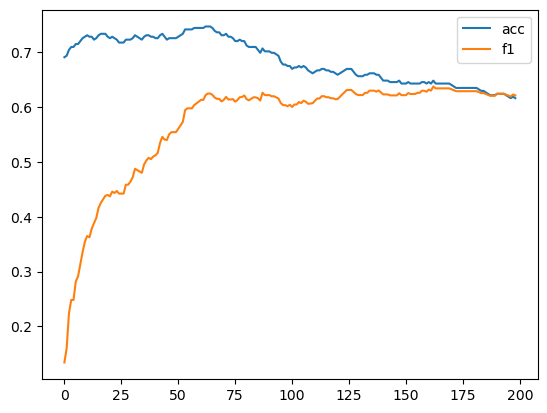

In [ ]:
optimized_threshold_resnet_triplet, acc, f1 = find_optimized_threshold(siamese_net_resnet_triplet, test_dataloader)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:02<00:00, 47.62it/s]

Accuracy: 0.7467, Precision: 0.6172, Recall: 0.6320, F1-score: 0.6245


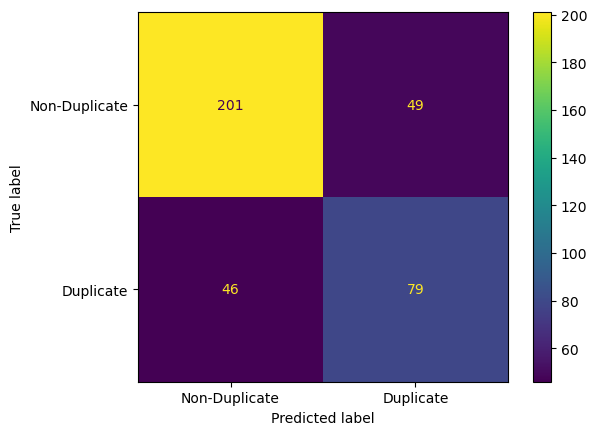

In [ ]:
evaluate_model(siamese_net_resnet_triplet,test_dataloader, threshold=optimized_threshold_resnet_triplet)

### 5.7 Siamese VGGNet with Contrastive Loss <a class="anchor" id="section_5_7"></a>

In [ ]:
import torch
torch.cuda.empty_cache()
import gc
gc.collect()

0

In [ ]:
siamese_net_vgg16 = SiameseVGG16()
train_siamese_network(siamese_net_vgg16, train_dataloader, val_dataloader, num_epochs=20, learning_rate=0.00001)

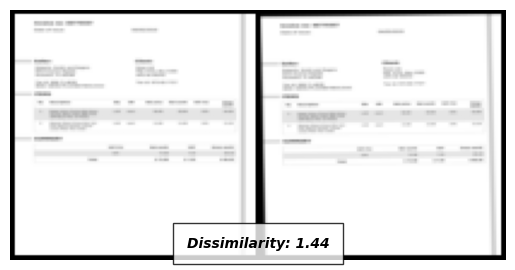

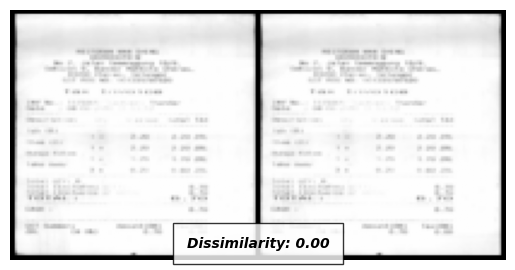

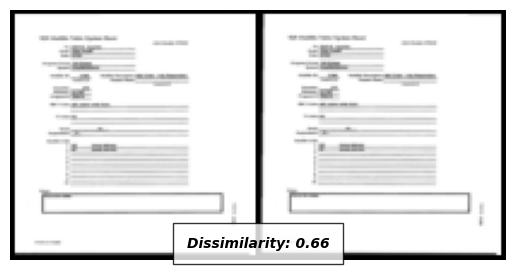

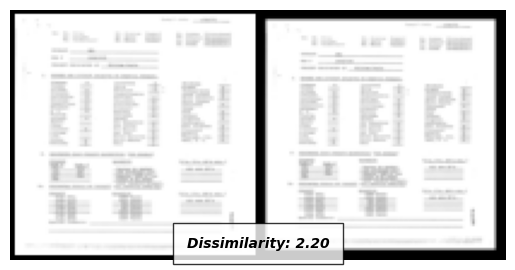

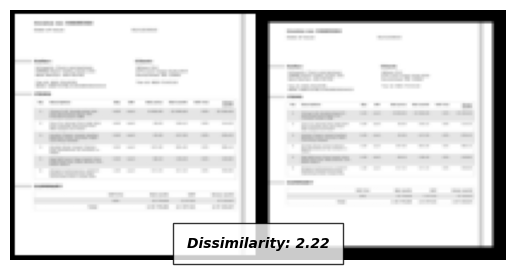

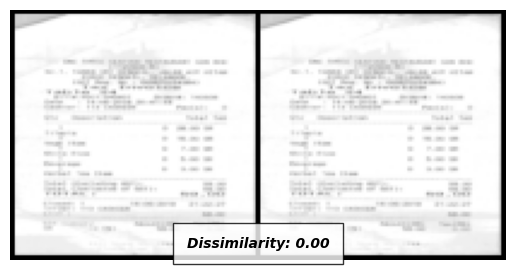

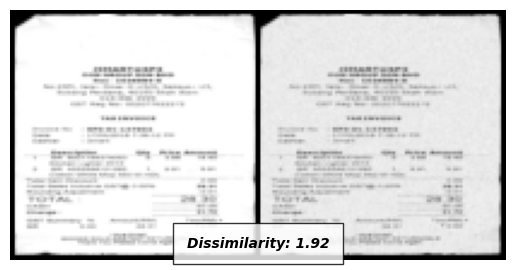

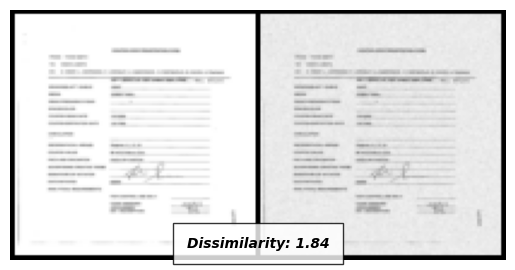

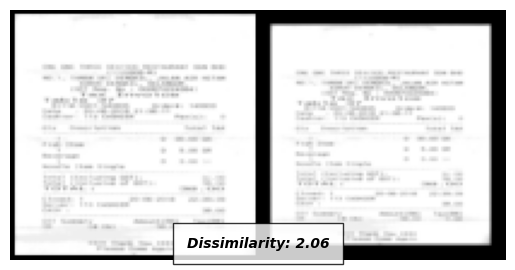

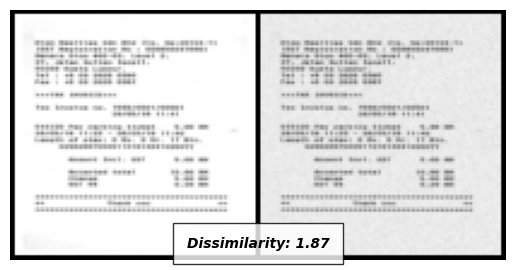

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_vgg16, dataiter_1, 10)

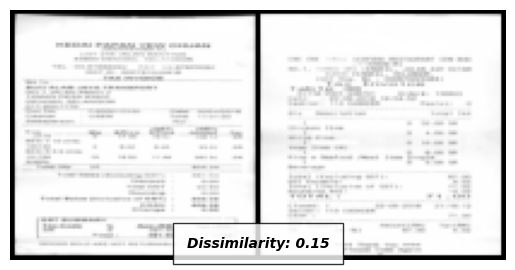

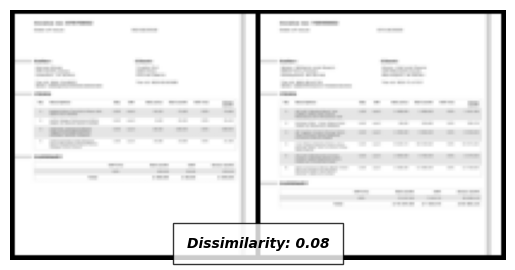

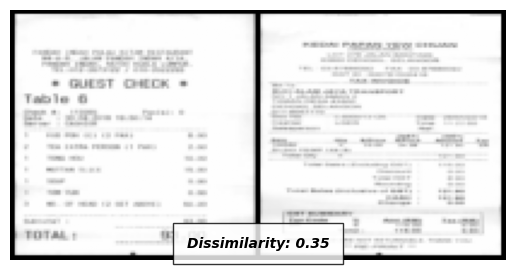

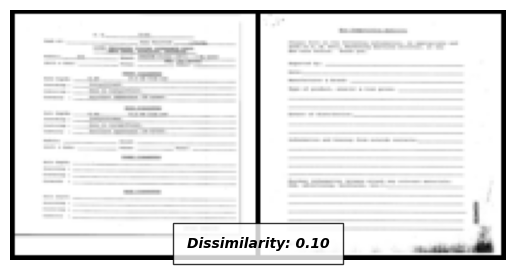

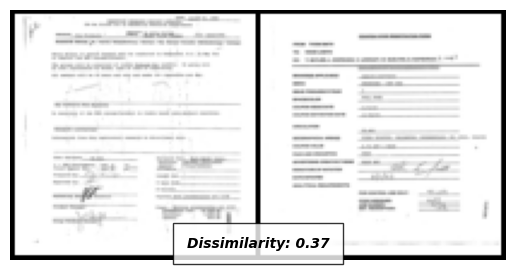

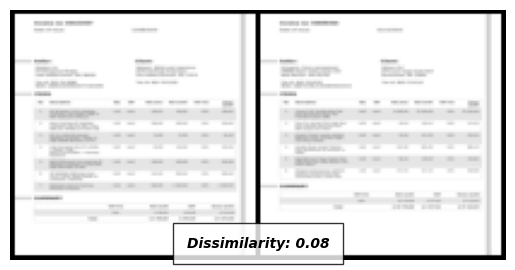

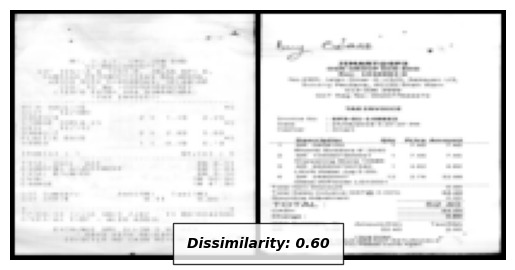

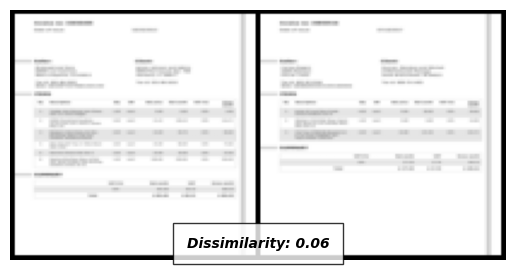

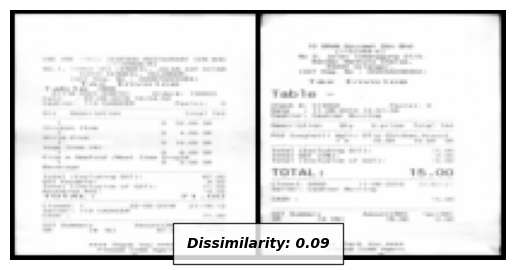

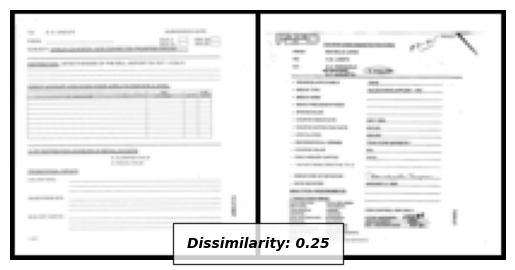

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_vgg16, dataiter_2, 10)

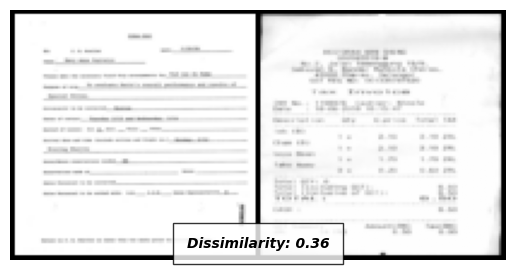

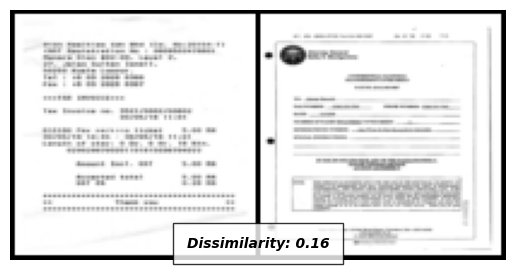

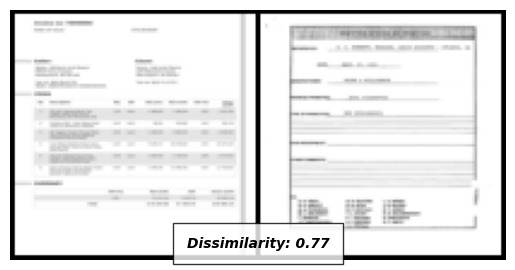

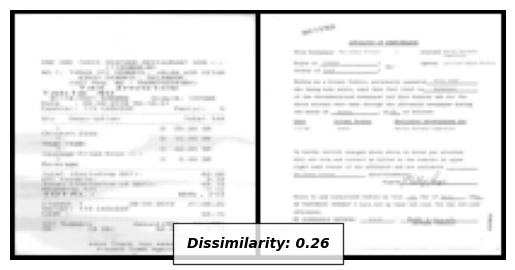

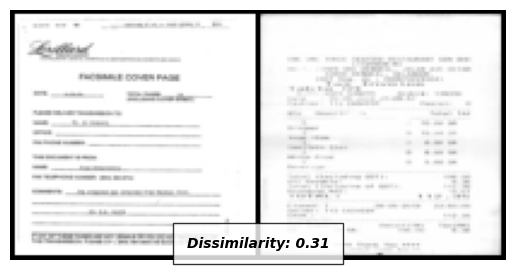

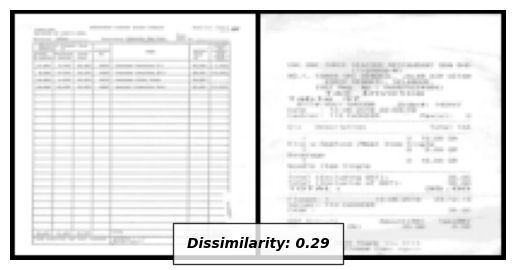

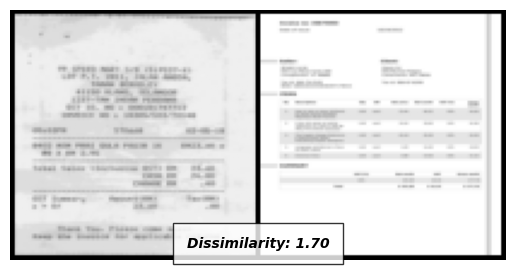

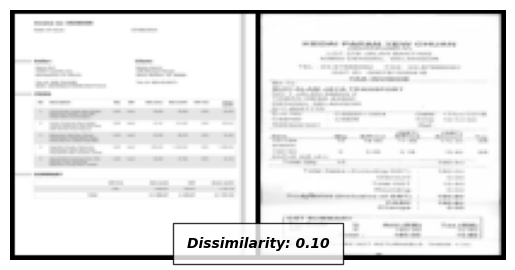

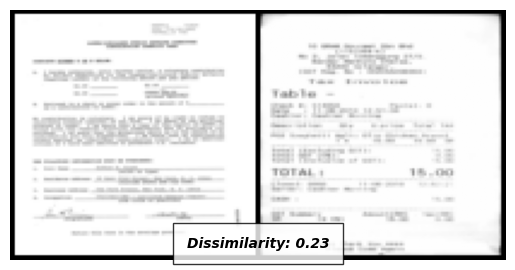

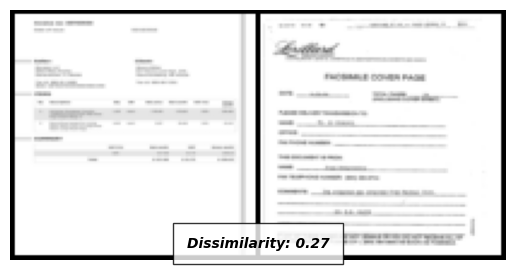

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_vgg16, dataiter_3, 10)

100%|██████████| 125/125 [00:02<00:00, 55.47it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.7146666666666667, precision:1.0, recall:0.144, f1:0.2517482517482518
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 63.70it/s]


accuracy:0.72, precision:0.9545454545454546, recall:0.168, f1:0.28571428571428575
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.7173333333333334, precision:0.88, recall:0.176, f1:0.2933333333333333
Current threshold:0.060000000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.55it/s]


accuracy:0.7093333333333334, precision:0.7857142857142857, recall:0.176, f1:0.28758169934640515
Current threshold:0.07, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.55it/s]


accuracy:0.6853333333333333, precision:0.5945945945945946, recall:0.176, f1:0.2716049382716049
Current threshold:0.08, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.63it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.184, f1:0.2690058479532164
Current threshold:0.09, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.6533333333333333, precision:0.4528301886792453, recall:0.192, f1:0.2696629213483146
Current threshold:0.09999999999999999, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.64, precision:0.41935483870967744, recall:0.208, f1:0.27807486631016043
Current threshold:0.10999999999999999, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.6053333333333333, precision:0.3466666666666667, recall:0.208, f1:0.26
Current threshold:0.11999999999999998, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.63it/s]


accuracy:0.5893333333333334, precision:0.3253012048192771, recall:0.216, f1:0.2596153846153846
Current threshold:0.12999999999999998, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.5653333333333334, precision:0.29347826086956524, recall:0.216, f1:0.2488479262672811
Current threshold:0.13999999999999999, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.34it/s]


accuracy:0.5493333333333333, precision:0.28846153846153844, recall:0.24, f1:0.26200873362445415
Current threshold:0.15, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.5386666666666666, precision:0.2818181818181818, recall:0.248, f1:0.2638297872340426
Current threshold:0.16, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.52, precision:0.26495726495726496, recall:0.248, f1:0.25619834710743805
Current threshold:0.17, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.48it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.18000000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.63it/s]


accuracy:0.496, precision:0.25384615384615383, recall:0.264, f1:0.25882352941176473
Current threshold:0.19000000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.47733333333333333, precision:0.24087591240875914, recall:0.264, f1:0.2519083969465649
Current threshold:0.20000000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.4693333333333333, precision:0.2357142857142857, recall:0.264, f1:0.2490566037735849
Current threshold:0.21000000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.62it/s]


accuracy:0.456, precision:0.2348993288590604, recall:0.28, f1:0.25547445255474455
Current threshold:0.22000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.33it/s]


accuracy:0.4533333333333333, precision:0.23333333333333334, recall:0.28, f1:0.2545454545454545
Current threshold:0.23000000000000007, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.62it/s]


accuracy:0.44, precision:0.22929936305732485, recall:0.288, f1:0.2553191489361702
Current threshold:0.24000000000000007, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.02it/s]


accuracy:0.4266666666666667, precision:0.2222222222222222, recall:0.288, f1:0.2508710801393728
Current threshold:0.25000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.44it/s]


accuracy:0.42133333333333334, precision:0.21951219512195122, recall:0.288, f1:0.2491349480968858
Current threshold:0.26000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.53it/s]


accuracy:0.408, precision:0.21301775147928995, recall:0.288, f1:0.24489795918367346
Current threshold:0.2700000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.58it/s]


accuracy:0.3973333333333333, precision:0.20809248554913296, recall:0.288, f1:0.24161073825503357
Current threshold:0.2800000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.50it/s]


accuracy:0.384, precision:0.20224719101123595, recall:0.288, f1:0.2376237623762376
Current threshold:0.2900000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.63it/s]


accuracy:0.37866666666666665, precision:0.2, recall:0.288, f1:0.2360655737704918
Current threshold:0.3000000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.31it/s]


accuracy:0.376, precision:0.19889502762430938, recall:0.288, f1:0.2352941176470588
Current threshold:0.3100000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.37333333333333335, precision:0.20108695652173914, recall:0.296, f1:0.23948220064724918
Current threshold:0.3200000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.57it/s]


accuracy:0.36533333333333334, precision:0.20105820105820105, recall:0.304, f1:0.24203821656050958
Current threshold:0.3300000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.63it/s]


accuracy:0.35733333333333334, precision:0.19791666666666666, recall:0.304, f1:0.2397476340694006
Current threshold:0.34000000000000014, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.3466666666666667, precision:0.19387755102040816, recall:0.304, f1:0.2367601246105919
Current threshold:0.35000000000000014, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.66it/s]


accuracy:0.3333333333333333, precision:0.1890547263681592, recall:0.304, f1:0.23312883435582823
Current threshold:0.36000000000000015, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.63it/s]


accuracy:0.33066666666666666, precision:0.18811881188118812, recall:0.304, f1:0.23241590214067276
Current threshold:0.37000000000000016, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.3253333333333333, precision:0.18932038834951456, recall:0.312, f1:0.2356495468277946
Current threshold:0.38000000000000017, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.41it/s]


accuracy:0.32266666666666666, precision:0.18840579710144928, recall:0.312, f1:0.23493975903614459
Current threshold:0.3900000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.32266666666666666, precision:0.19138755980861244, recall:0.32, f1:0.23952095808383236
Current threshold:0.4000000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.68it/s]


accuracy:0.32, precision:0.19047619047619047, recall:0.32, f1:0.2388059701492537
Current threshold:0.4100000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.51it/s]


accuracy:0.32, precision:0.19047619047619047, recall:0.32, f1:0.2388059701492537
Current threshold:0.4200000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.67it/s]


accuracy:0.32, precision:0.19047619047619047, recall:0.32, f1:0.2388059701492537
Current threshold:0.4300000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.60it/s]


accuracy:0.30666666666666664, precision:0.18604651162790697, recall:0.32, f1:0.23529411764705885
Current threshold:0.4400000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.70it/s]


accuracy:0.30133333333333334, precision:0.1872146118721461, recall:0.328, f1:0.23837209302325582
Current threshold:0.45000000000000023, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.53it/s]


accuracy:0.2986666666666667, precision:0.18636363636363637, recall:0.328, f1:0.23768115942028986
Current threshold:0.46000000000000024, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.29it/s]


accuracy:0.2853333333333333, precision:0.18222222222222223, recall:0.328, f1:0.2342857142857143
Current threshold:0.47000000000000025, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.12it/s]


accuracy:0.28, precision:0.18061674008810572, recall:0.328, f1:0.23295454545454544
Current threshold:0.48000000000000026, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.01it/s]


accuracy:0.2773333333333333, precision:0.17982456140350878, recall:0.328, f1:0.23229461756373934
Current threshold:0.49000000000000027, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.92it/s]


accuracy:0.27466666666666667, precision:0.17903930131004367, recall:0.328, f1:0.23163841807909605
Current threshold:0.5000000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 60.55it/s]


accuracy:0.272, precision:0.1782608695652174, recall:0.328, f1:0.23098591549295774
Current threshold:0.5100000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.32it/s]


accuracy:0.26666666666666666, precision:0.17672413793103448, recall:0.328, f1:0.22969187675070027
Current threshold:0.5200000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.78it/s]


accuracy:0.26666666666666666, precision:0.17672413793103448, recall:0.328, f1:0.22969187675070027
Current threshold:0.5300000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.12it/s]


accuracy:0.264, precision:0.1759656652360515, recall:0.328, f1:0.22905027932960892
Current threshold:0.5400000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 60.87it/s]


accuracy:0.25866666666666666, precision:0.17446808510638298, recall:0.328, f1:0.2277777777777778
Current threshold:0.5500000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 60.78it/s]


accuracy:0.25866666666666666, precision:0.17446808510638298, recall:0.328, f1:0.2277777777777778
Current threshold:0.5600000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.95it/s]


accuracy:0.248, precision:0.17154811715481172, recall:0.328, f1:0.22527472527472528
Current threshold:0.5700000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.55it/s]


accuracy:0.24533333333333332, precision:0.17083333333333334, recall:0.328, f1:0.22465753424657536
Current threshold:0.5800000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.80it/s]


accuracy:0.24266666666666667, precision:0.17012448132780084, recall:0.328, f1:0.22404371584699453
Current threshold:0.5900000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.96it/s]


accuracy:0.24, precision:0.16942148760330578, recall:0.328, f1:0.22343324250681199
Current threshold:0.6000000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.58it/s]


accuracy:0.23733333333333334, precision:0.16872427983539096, recall:0.328, f1:0.22282608695652176
Current threshold:0.6100000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.26it/s]


accuracy:0.22933333333333333, precision:0.16666666666666666, recall:0.328, f1:0.2210242587601078
Current threshold:0.6200000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.21it/s]


accuracy:0.22933333333333333, precision:0.16666666666666666, recall:0.328, f1:0.2210242587601078
Current threshold:0.6300000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.27it/s]


accuracy:0.224, precision:0.168, recall:0.336, f1:0.22400000000000003
Current threshold:0.6400000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.41it/s]


accuracy:0.216, precision:0.16600790513833993, recall:0.336, f1:0.22222222222222227
Current threshold:0.6500000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.21it/s]


accuracy:0.216, precision:0.16600790513833993, recall:0.336, f1:0.22222222222222227
Current threshold:0.6600000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.37it/s]


accuracy:0.21066666666666667, precision:0.16470588235294117, recall:0.336, f1:0.22105263157894736
Current threshold:0.6700000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.44it/s]


accuracy:0.208, precision:0.1640625, recall:0.336, f1:0.22047244094488186
Current threshold:0.6800000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.50it/s]


accuracy:0.208, precision:0.1640625, recall:0.336, f1:0.22047244094488186
Current threshold:0.6900000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.47it/s]


accuracy:0.20533333333333334, precision:0.16342412451361868, recall:0.336, f1:0.21989528795811517
Current threshold:0.7000000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.24it/s]


accuracy:0.20533333333333334, precision:0.16342412451361868, recall:0.336, f1:0.21989528795811517
Current threshold:0.7100000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.34it/s]


accuracy:0.20266666666666666, precision:0.16279069767441862, recall:0.336, f1:0.2193211488250653
Current threshold:0.7200000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.41it/s]


accuracy:0.20266666666666666, precision:0.16279069767441862, recall:0.336, f1:0.2193211488250653
Current threshold:0.7300000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.41it/s]


accuracy:0.20266666666666666, precision:0.16279069767441862, recall:0.336, f1:0.2193211488250653
Current threshold:0.7400000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.34it/s]


accuracy:0.20533333333333334, precision:0.16602316602316602, recall:0.344, f1:0.22395833333333331
Current threshold:0.7500000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.46it/s]


accuracy:0.2, precision:0.16475095785440613, recall:0.344, f1:0.2227979274611399
Current threshold:0.7600000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.50it/s]


accuracy:0.2, precision:0.16475095785440613, recall:0.344, f1:0.2227979274611399
Current threshold:0.7700000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.41it/s]


accuracy:0.19733333333333333, precision:0.16412213740458015, recall:0.344, f1:0.2222222222222222
Current threshold:0.7800000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.28it/s]


accuracy:0.192, precision:0.16287878787878787, recall:0.344, f1:0.2210796915167095
Current threshold:0.7900000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.24it/s]


accuracy:0.18666666666666668, precision:0.16165413533834586, recall:0.344, f1:0.21994884910485932
Current threshold:0.8000000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.43it/s]


accuracy:0.18666666666666668, precision:0.16165413533834586, recall:0.344, f1:0.21994884910485932
Current threshold:0.8100000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.72it/s]


accuracy:0.184, precision:0.16104868913857678, recall:0.344, f1:0.21938775510204078
Current threshold:0.8200000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.85it/s]


accuracy:0.18133333333333335, precision:0.16044776119402984, recall:0.344, f1:0.21882951653944022
Current threshold:0.8300000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.28it/s]


accuracy:0.17866666666666667, precision:0.15985130111524162, recall:0.344, f1:0.2182741116751269
Current threshold:0.8400000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.14it/s]


accuracy:0.17866666666666667, precision:0.15985130111524162, recall:0.344, f1:0.2182741116751269
Current threshold:0.8500000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.71it/s]


accuracy:0.176, precision:0.15925925925925927, recall:0.344, f1:0.21772151898734177
Current threshold:0.8600000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.03it/s]


accuracy:0.17333333333333334, precision:0.15867158671586715, recall:0.344, f1:0.21717171717171715
Current threshold:0.8700000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.74it/s]


accuracy:0.168, precision:0.1575091575091575, recall:0.344, f1:0.21608040201005024
Current threshold:0.8800000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.41it/s]


accuracy:0.16533333333333333, precision:0.15693430656934307, recall:0.344, f1:0.2155388471177945
Current threshold:0.8900000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.78it/s]


accuracy:0.16533333333333333, precision:0.15693430656934307, recall:0.344, f1:0.2155388471177945
Current threshold:0.9000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.36it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:0.9100000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.18it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:0.9200000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.02it/s]


accuracy:0.16266666666666665, precision:0.15636363636363637, recall:0.344, f1:0.215
Current threshold:0.9300000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.55it/s]


accuracy:0.15733333333333333, precision:0.1552346570397112, recall:0.344, f1:0.2139303482587065
Current threshold:0.9400000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.25it/s]


accuracy:0.152, precision:0.15412186379928317, recall:0.344, f1:0.21287128712871287
Current threshold:0.9500000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.93it/s]


accuracy:0.152, precision:0.15412186379928317, recall:0.344, f1:0.21287128712871287
Current threshold:0.9600000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.55it/s]


accuracy:0.14666666666666667, precision:0.15302491103202848, recall:0.344, f1:0.2118226600985222
Current threshold:0.9700000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.67it/s]


accuracy:0.14666666666666667, precision:0.15302491103202848, recall:0.344, f1:0.2118226600985222
Current threshold:0.9800000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.39it/s]


accuracy:0.14666666666666667, precision:0.15302491103202848, recall:0.344, f1:0.2118226600985222
Current threshold:0.9900000000000007, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.77it/s]

accuracy:0.14666666666666667, precision:0.15302491103202848, recall:0.344, f1:0.2118226600985222
Current threshold:1.0000000000000007, Best threshold:0.0400


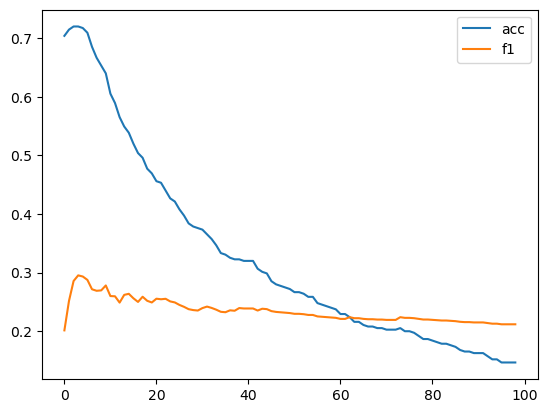

In [ ]:
optimized_threshold_vgg, acc, f1 = find_optimized_threshold(siamese_net_vgg16, test_dataloader, max_threshold=1)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:01<00:00, 62.55it/s]

Accuracy: 0.7200, Precision: 0.9167, Recall: 0.1760, F1-score: 0.2953


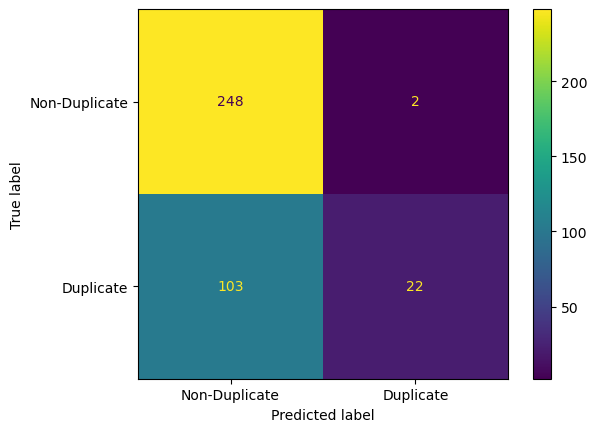

In [ ]:
evaluate_model(siamese_net_vgg16,test_dataloader, threshold=optimized_threshold_vgg)

### 5.8 Siamese VGGNet with Triplet Loss <a class="anchor" id="section_5_8"></a>

In [ ]:
import torch
torch.cuda.empty_cache()
import gc
gc.collect()

Epoch 1/20, Train Loss: 0.889128964198263, Val Loss: 1.4579793810844421
Epoch 2/20, Train Loss: 0.6061769347441824, Val Loss: 2.423659051719465
Epoch 3/20, Train Loss: 0.49997931405117635, Val Loss: 3.0266920955557572
Epoch 4/20, Train Loss: 0.46578209023726613, Val Loss: 3.196270271351463
Epoch 5/20, Train Loss: 0.4065494035419665, Val Loss: 3.8496152695856596
Epoch 6/20, Train Loss: 0.42371544712468195, Val Loss: 4.06430176684731
Epoch 7/20, Train Loss: 0.41087356366609273, Val Loss: 4.3243893510416935
Epoch 8/20, Train Loss: 0.45771812137804535, Val Loss: 3.930562822442306
Epoch 9/20, Train Loss: 0.43434827892403854, Val Loss: 4.3134334401080485
Epoch 10/20, Train Loss: 0.381187965995387, Val Loss: 4.121930975663035
Epoch 11/20, Train Loss: 0.4277538217996296, Val Loss: 3.6601142130400004
Epoch 12/20, Train Loss: 0.39244173702440766, Val Loss: 3.6579985806816504
Epoch 13/20, Train Loss: 0.3725629543003283, Val Loss: 5.271760868398767
Epoch 14/20, Train Loss: 0.35898412842499583, Val

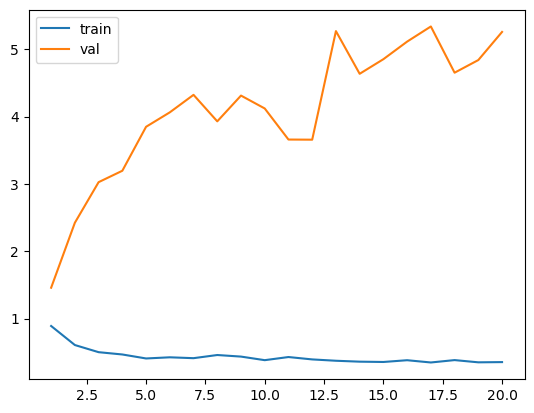

5.259310603141785

In [ ]:
siamese_net_vgg16_triplet = SiameseVGG16()
train_siamese_network(siamese_net_vgg16_triplet, train_dataloader_triplet, val_dataloader_triplet, num_epochs=20, learning_rate=0.00001, loss_function="triplet")

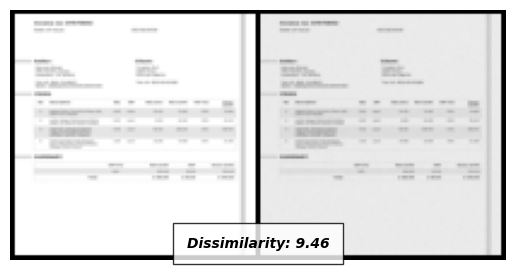

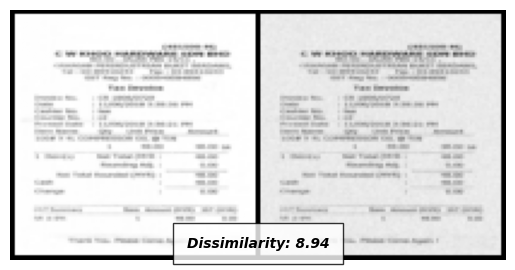

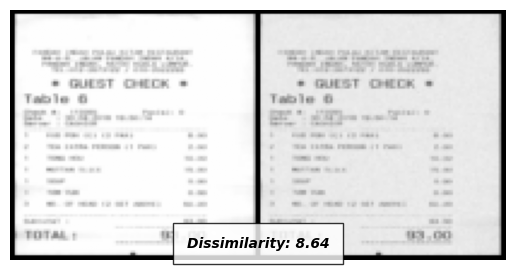

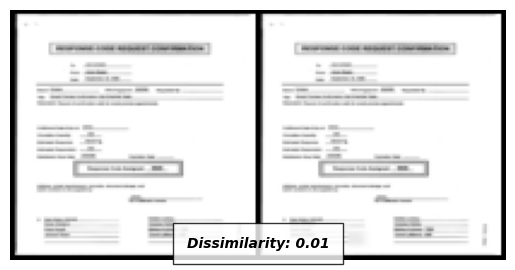

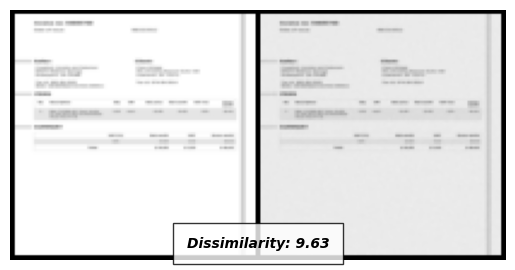

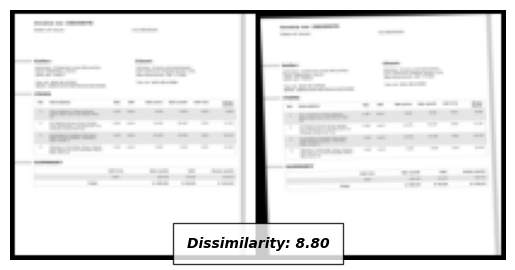

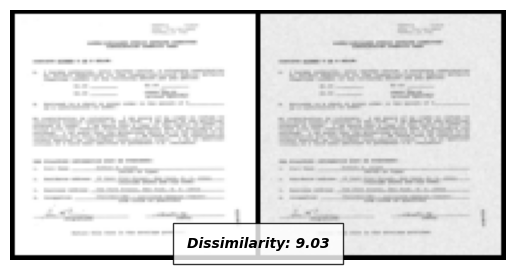

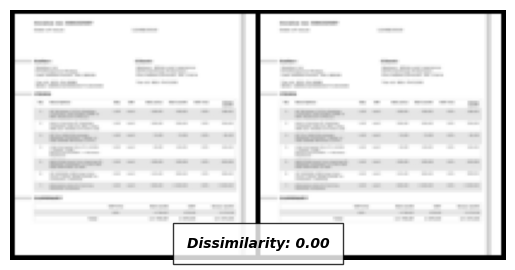

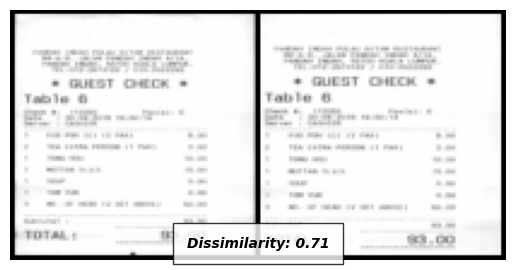

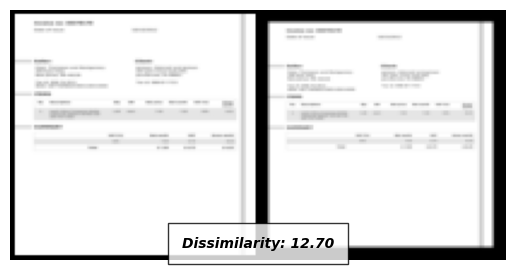

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_vgg16_triplet, dataiter_1, 10)

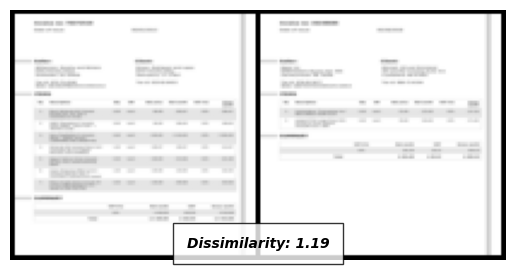

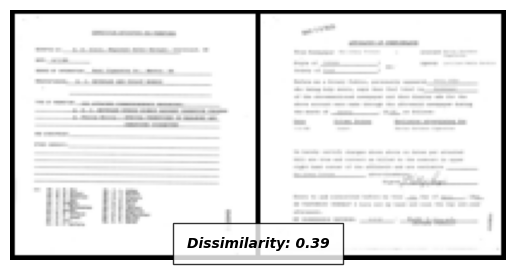

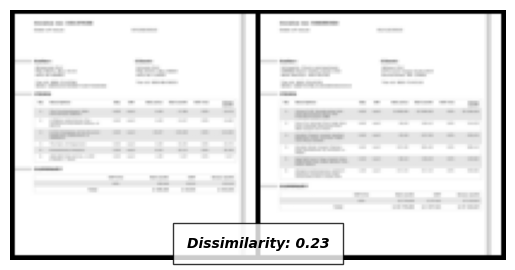

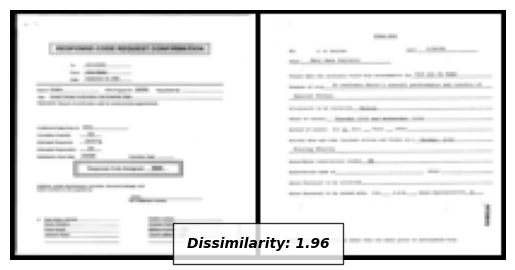

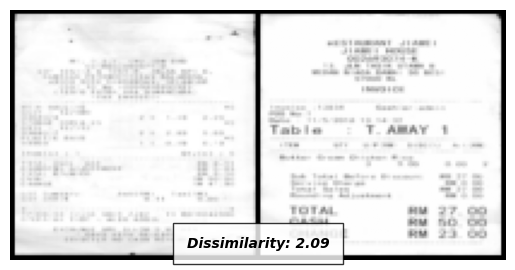

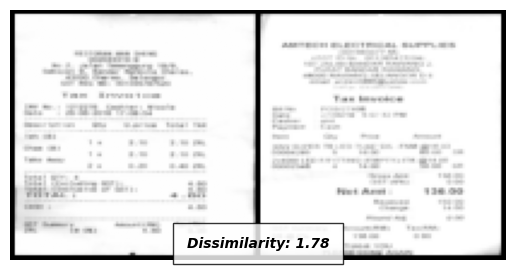

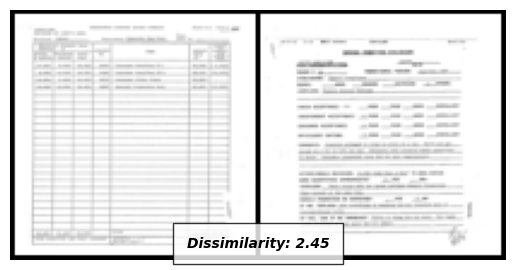

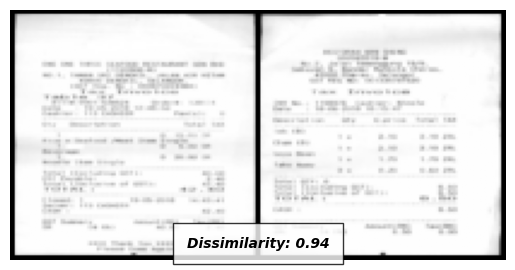

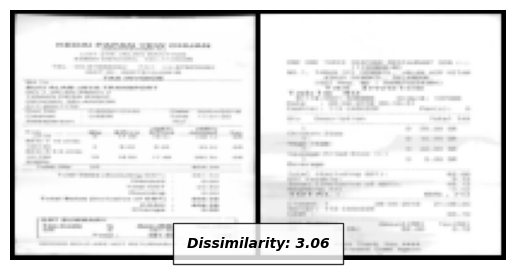

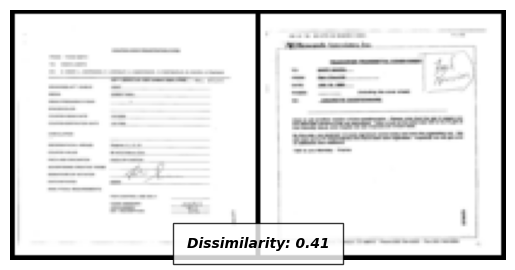

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_vgg16_triplet, dataiter_2, 10)

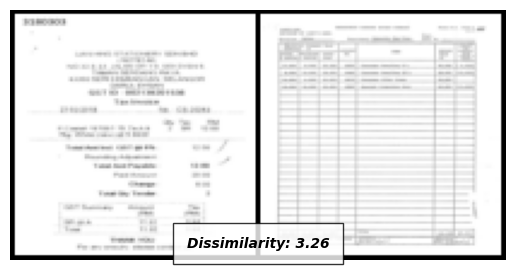

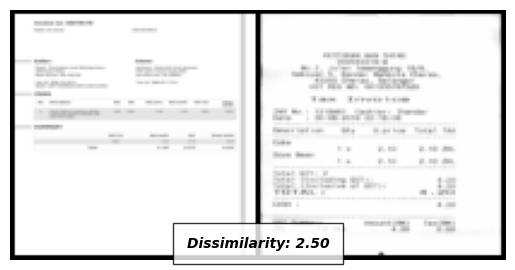

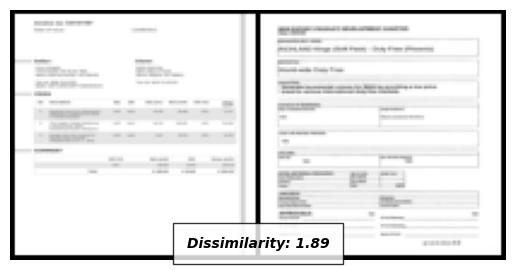

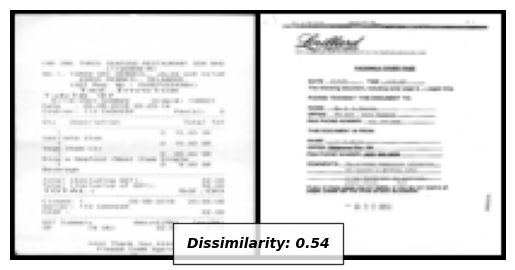

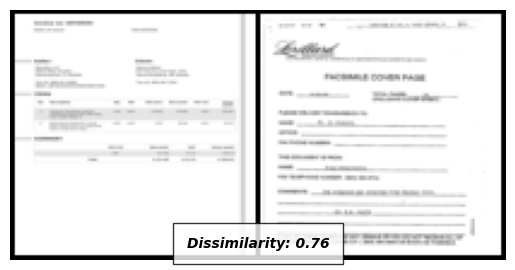

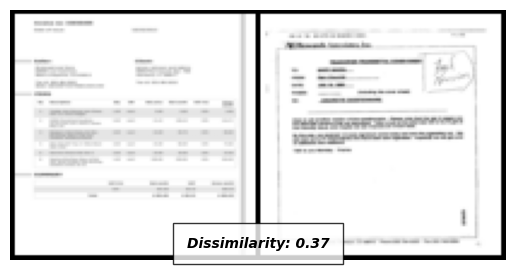

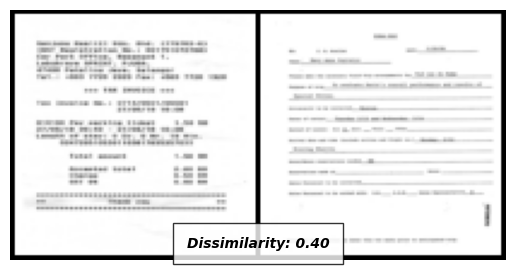

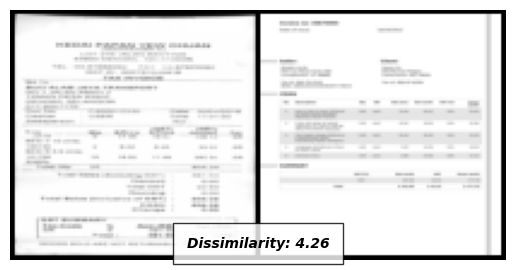

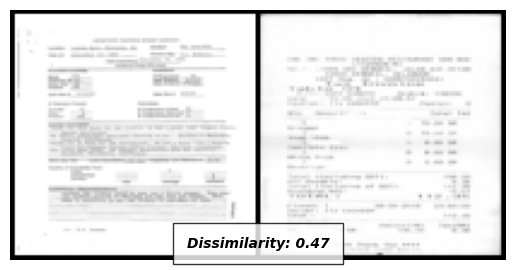

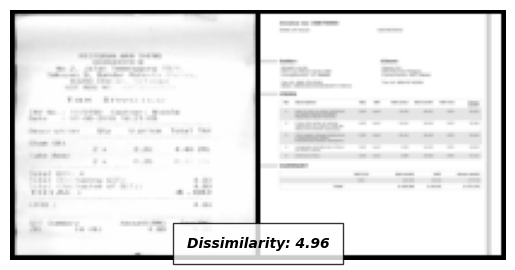

In [ ]:
#dupes(transformed)
visualize_val_dissimilarity(siamese_net_vgg16_triplet, dataiter_3, 10)

In [ ]:
optimized_threshold_vgg_triplet, acc, f1 = find_optimized_threshold(siamese_net_vgg16_triplet, test_dataloader)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:02<00:00, 51.91it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:02<00:00, 61.26it/s]


accuracy:0.7146666666666667, precision:1.0, recall:0.144, f1:0.2517482517482518
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:02<00:00, 61.57it/s]


accuracy:0.72, precision:0.9545454545454546, recall:0.168, f1:0.28571428571428575
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:02<00:00, 62.05it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.53it/s]


accuracy:0.7173333333333334, precision:0.88, recall:0.176, f1:0.2933333333333333
Current threshold:0.060000000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.74it/s]


accuracy:0.7093333333333334, precision:0.7857142857142857, recall:0.176, f1:0.28758169934640515
Current threshold:0.07, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.97it/s]


accuracy:0.6853333333333333, precision:0.5945945945945946, recall:0.176, f1:0.2716049382716049
Current threshold:0.08, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 60.70it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.184, f1:0.2690058479532164
Current threshold:0.09, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.56it/s]


accuracy:0.6533333333333333, precision:0.4528301886792453, recall:0.192, f1:0.2696629213483146
Current threshold:0.09999999999999999, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.84it/s]


accuracy:0.64, precision:0.41935483870967744, recall:0.208, f1:0.27807486631016043
Current threshold:0.10999999999999999, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.18it/s]


accuracy:0.6053333333333333, precision:0.3466666666666667, recall:0.208, f1:0.26
Current threshold:0.11999999999999998, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.83it/s]


accuracy:0.5893333333333334, precision:0.3253012048192771, recall:0.216, f1:0.2596153846153846
Current threshold:0.12999999999999998, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.99it/s]


accuracy:0.5653333333333334, precision:0.29347826086956524, recall:0.216, f1:0.2488479262672811
Current threshold:0.13999999999999999, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 62.24it/s]


accuracy:0.5493333333333333, precision:0.28846153846153844, recall:0.24, f1:0.26200873362445415
Current threshold:0.15, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.71it/s]


accuracy:0.5386666666666666, precision:0.2818181818181818, recall:0.248, f1:0.2638297872340426
Current threshold:0.16, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.55it/s]


accuracy:0.52, precision:0.26495726495726496, recall:0.248, f1:0.25619834710743805
Current threshold:0.17, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.52it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.18000000000000002, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.81it/s]


accuracy:0.496, precision:0.25384615384615383, recall:0.264, f1:0.25882352941176473
Current threshold:0.19000000000000003, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 63.17it/s]


accuracy:0.47733333333333333, precision:0.24087591240875914, recall:0.264, f1:0.2519083969465649
Current threshold:0.20000000000000004, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 62.89it/s]


accuracy:0.4693333333333333, precision:0.2357142857142857, recall:0.264, f1:0.2490566037735849
Current threshold:0.21000000000000005, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.78it/s]


accuracy:0.456, precision:0.2348993288590604, recall:0.28, f1:0.25547445255474455
Current threshold:0.22000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 60.55it/s]


accuracy:0.4533333333333333, precision:0.23333333333333334, recall:0.28, f1:0.2545454545454545
Current threshold:0.23000000000000007, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.87it/s]


accuracy:0.44, precision:0.22929936305732485, recall:0.288, f1:0.2553191489361702
Current threshold:0.24000000000000007, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.53it/s]


accuracy:0.4266666666666667, precision:0.2222222222222222, recall:0.288, f1:0.2508710801393728
Current threshold:0.25000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.84it/s]


accuracy:0.42133333333333334, precision:0.21951219512195122, recall:0.288, f1:0.2491349480968858
Current threshold:0.26000000000000006, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.93it/s]


accuracy:0.408, precision:0.21301775147928995, recall:0.288, f1:0.24489795918367346
Current threshold:0.2700000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 60.70it/s]


accuracy:0.3973333333333333, precision:0.20809248554913296, recall:0.288, f1:0.24161073825503357
Current threshold:0.2800000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 59.67it/s]


accuracy:0.384, precision:0.20224719101123595, recall:0.288, f1:0.2376237623762376
Current threshold:0.2900000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 61.53it/s]


accuracy:0.37866666666666665, precision:0.2, recall:0.288, f1:0.2360655737704918
Current threshold:0.3000000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 58.13it/s]


accuracy:0.376, precision:0.19889502762430938, recall:0.288, f1:0.2352941176470588
Current threshold:0.3100000000000001, Best threshold:0.0400


100%|██████████| 125/125 [00:02<00:00, 57.86it/s]


accuracy:0.37333333333333335, precision:0.20108695652173914, recall:0.296, f1:0.23948220064724918
Current threshold:0.3200000000000001, Best threshold:0.0400


  6%|▌         | 7/125 [00:00<00:01, 61.93it/s]

100%|██████████| 125/125 [00:04<00:00, 30.34it/s]


Accuracy: 0.7227, Precision: 0.9200, Recall: 0.1840, F1-score: 0.3067


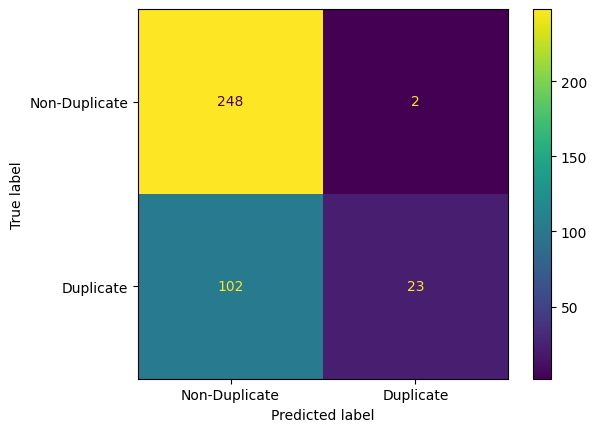

In [ ]:
evaluate_model(siamese_net_vgg16_triplet,test_dataloader,threshold=optimized_threshold_vgg_triplet)

### 5.9 Siamese Barlow Twins with Contrastive Loss <a class="anchor" id="section_5_9"></a>

Epoch 1/30, Loss: 0.7530504751239756, Val Loss: 0.8761956166123056
Epoch 2/30, Loss: 0.7386625778653022, Val Loss: 0.87514374907377
Epoch 3/30, Loss: 0.7370778268484987, Val Loss: 0.864956163371732
Epoch 4/30, Loss: 0.7345294865693799, Val Loss: 0.8796564345611841
Epoch 5/30, Loss: 0.7435166181040633, Val Loss: 0.8657183467167717
Epoch 6/30, Loss: 0.7354338280734067, Val Loss: 0.8652287538616771
Epoch 7/30, Loss: 0.707918518100326, Val Loss: 0.8312828188354615
Epoch 8/30, Loss: 0.684663570731094, Val Loss: 0.8064684709564685
Epoch 9/30, Loss: 0.6592146798257569, Val Loss: 0.770202764726587
Epoch 10/30, Loss: 0.59444153558855, Val Loss: 0.7242763015000444
Epoch 11/30, Loss: 0.5459199751678266, Val Loss: 0.6819370960522639
Epoch 12/30, Loss: 0.4743241622651878, Val Loss: 0.6481037428112406
Epoch 13/30, Loss: 0.4371791947633028, Val Loss: 0.624306284087269
Epoch 14/30, Loss: 0.416039403675026, Val Loss: 0.6003041055641676
Epoch 15/30, Loss: 0.40747236102623374, Val Loss: 0.597414234751149

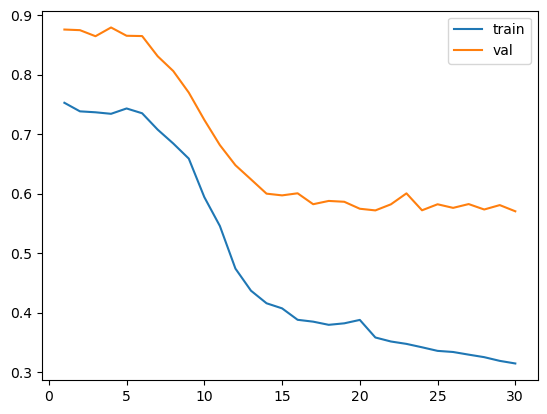

0.3148194523283133

In [ ]:
siamese_barlow = SiameseNetworkBarlowTwins()
train_siamese_network_barlowtwins(siamese_barlow, train_dataloader, val_dataloader, num_epochs=30, learning_rate=0.00001)

100%|██████████| 125/125 [00:00<00:00, 176.66it/s]


accuracy:0.6986666666666667, precision:0.75, recall:0.144, f1:0.2416107382550335
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6853333333333333, precision:0.5777777777777777, recall:0.208, f1:0.30588235294117644
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.672, precision:0.5178571428571429, recall:0.232, f1:0.32044198895027626
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.6613333333333333, precision:0.4852941176470588, recall:0.264, f1:0.34196891191709844
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.648, precision:0.45454545454545453, recall:0.28, f1:0.34653465346534656
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.6213333333333333, precision:0.40229885057471265, recall:0.28, f1:0.330188679245283
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.47it/s]


accuracy:0.5973333333333334, precision:0.3673469387755102, recall:0.288, f1:0.32286995515695066
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.5706666666666667, precision:0.3333333333333333, recall:0.288, f1:0.30901287553648066
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.56, precision:0.32142857142857145, recall:0.288, f1:0.3037974683544304
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 222.77it/s]


accuracy:0.552, precision:0.3130434782608696, recall:0.288, f1:0.30000000000000004
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.536, precision:0.2975206611570248, recall:0.288, f1:0.2926829268292683
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.5306666666666666, precision:0.2926829268292683, recall:0.288, f1:0.29032258064516125
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.512, precision:0.27692307692307694, recall:0.288, f1:0.2823529411764706
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.49866666666666665, precision:0.26666666666666666, recall:0.288, f1:0.27692307692307694
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.488, precision:0.2624113475177305, recall:0.296, f1:0.2781954887218045
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4826666666666667, precision:0.2653061224489796, recall:0.312, f1:0.2867647058823529
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.464, precision:0.2532467532467532, recall:0.312, f1:0.27956989247311825
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.95it/s]


accuracy:0.45066666666666666, precision:0.24528301886792453, recall:0.312, f1:0.2746478873239437
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.44, precision:0.2392638036809816, recall:0.312, f1:0.2708333333333333
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.4266666666666667, precision:0.23214285714285715, recall:0.312, f1:0.2662116040955631
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 236.69it/s]


accuracy:0.424, precision:0.23391812865497075, recall:0.32, f1:0.27027027027027023
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 235.80it/s]


accuracy:0.408, precision:0.22598870056497175, recall:0.32, f1:0.26490066225165565
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 235.35it/s]


accuracy:0.4, precision:0.2222222222222222, recall:0.32, f1:0.26229508196721313
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.392, precision:0.2185792349726776, recall:0.32, f1:0.25974025974025977
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.38133333333333336, precision:0.21390374331550802, recall:0.32, f1:0.2564102564102564
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.376, precision:0.21164021164021163, recall:0.32, f1:0.25477707006369427
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.37066666666666664, precision:0.2094240837696335, recall:0.32, f1:0.25316455696202533
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.36533333333333334, precision:0.20725388601036268, recall:0.32, f1:0.25157232704402516
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.36, precision:0.20812182741116753, recall:0.328, f1:0.25465838509316774
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.344, precision:0.2019704433497537, recall:0.328, f1:0.25
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.3413333333333333, precision:0.20098039215686275, recall:0.328, f1:0.2492401215805471
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.3333333333333333, precision:0.19806763285024154, recall:0.328, f1:0.24698795180722888
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3253333333333333, precision:0.19811320754716982, recall:0.336, f1:0.24925816023738875
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.312, precision:0.1935483870967742, recall:0.336, f1:0.2456140350877193
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.312, precision:0.1935483870967742, recall:0.336, f1:0.2456140350877193
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.304, precision:0.19090909090909092, recall:0.336, f1:0.24347826086956517
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.29333333333333333, precision:0.1875, recall:0.336, f1:0.24068767908309452
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.91it/s]


accuracy:0.2906666666666667, precision:0.18666666666666668, recall:0.336, f1:0.24000000000000002
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.288, precision:0.18584070796460178, recall:0.336, f1:0.23931623931623933
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 235.35it/s]


accuracy:0.27466666666666667, precision:0.18181818181818182, recall:0.336, f1:0.2359550561797753
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.2693333333333333, precision:0.18025751072961374, recall:0.336, f1:0.2346368715083799
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.26666666666666666, precision:0.1794871794871795, recall:0.336, f1:0.23398328690807801
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.26666666666666666, precision:0.1794871794871795, recall:0.336, f1:0.23398328690807801
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.91it/s]


accuracy:0.25866666666666666, precision:0.17721518987341772, recall:0.336, f1:0.23204419889502761
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.91it/s]


accuracy:0.256, precision:0.17647058823529413, recall:0.336, f1:0.23140495867768598
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.25333333333333335, precision:0.17573221757322174, recall:0.336, f1:0.23076923076923078
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.25066666666666665, precision:0.175, recall:0.336, f1:0.23013698630136986
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.24533333333333332, precision:0.17355371900826447, recall:0.336, f1:0.22888283378746593
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.24266666666666667, precision:0.1728395061728395, recall:0.336, f1:0.22826086956521743
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.24, precision:0.1721311475409836, recall:0.336, f1:0.22764227642276422
Current threshold:0.5100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.23466666666666666, precision:0.17073170731707318, recall:0.336, f1:0.22641509433962267
Current threshold:0.5200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.232, precision:0.1700404858299595, recall:0.336, f1:0.22580645161290322
Current threshold:0.5300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.22933333333333333, precision:0.1693548387096774, recall:0.336, f1:0.22520107238605896
Current threshold:0.5400000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.22666666666666666, precision:0.1686746987951807, recall:0.336, f1:0.22459893048128343
Current threshold:0.5500000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.224, precision:0.168, recall:0.336, f1:0.22400000000000003
Current threshold:0.5600000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.22133333333333333, precision:0.16733067729083664, recall:0.336, f1:0.22340425531914893
Current threshold:0.5700000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.21333333333333335, precision:0.16535433070866143, recall:0.336, f1:0.22163588390501324
Current threshold:0.5800000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.21066666666666667, precision:0.16731517509727625, recall:0.344, f1:0.225130890052356
Current threshold:0.5900000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.208, precision:0.16666666666666666, recall:0.344, f1:0.2245430809399478
Current threshold:0.6000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.208, precision:0.16666666666666666, recall:0.344, f1:0.2245430809399478
Current threshold:0.6100000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]


accuracy:0.208, precision:0.16923076923076924, recall:0.352, f1:0.2285714285714286
Current threshold:0.6200000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.208, precision:0.16923076923076924, recall:0.352, f1:0.2285714285714286
Current threshold:0.6300000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.20266666666666666, precision:0.16793893129770993, recall:0.352, f1:0.22739018087855298
Current threshold:0.6400000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.91it/s]


accuracy:0.20266666666666666, precision:0.16793893129770993, recall:0.352, f1:0.22739018087855298
Current threshold:0.6500000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.91it/s]


accuracy:0.2, precision:0.16730038022813687, recall:0.352, f1:0.22680412371134018
Current threshold:0.6600000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.19733333333333333, precision:0.16666666666666666, recall:0.352, f1:0.2262210796915167
Current threshold:0.6700000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.19733333333333333, precision:0.16666666666666666, recall:0.352, f1:0.2262210796915167
Current threshold:0.6800000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.19733333333333333, precision:0.16666666666666666, recall:0.352, f1:0.2262210796915167
Current threshold:0.6900000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.7000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.19466666666666665, precision:0.1660377358490566, recall:0.352, f1:0.22564102564102562
Current threshold:0.7100000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.192, precision:0.16541353383458646, recall:0.352, f1:0.22506393861892582
Current threshold:0.7200000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.192, precision:0.16541353383458646, recall:0.352, f1:0.22506393861892582
Current threshold:0.7300000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.192, precision:0.16541353383458646, recall:0.352, f1:0.22506393861892582
Current threshold:0.7400000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7500000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7600000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.18933333333333333, precision:0.1647940074906367, recall:0.352, f1:0.22448979591836735
Current threshold:0.7700000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.18666666666666668, precision:0.16417910447761194, recall:0.352, f1:0.2239185750636132
Current threshold:0.7800000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.184, precision:0.16356877323420074, recall:0.352, f1:0.2233502538071066
Current threshold:0.7900000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.184, precision:0.16356877323420074, recall:0.352, f1:0.2233502538071066
Current threshold:0.8000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 234.03it/s]


accuracy:0.18133333333333335, precision:0.16296296296296298, recall:0.352, f1:0.22278481012658227
Current threshold:0.8100000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.18133333333333335, precision:0.16296296296296298, recall:0.352, f1:0.22278481012658227
Current threshold:0.8200000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.18133333333333335, precision:0.16296296296296298, recall:0.352, f1:0.22278481012658227
Current threshold:0.8300000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.18133333333333335, precision:0.16296296296296298, recall:0.352, f1:0.22278481012658227
Current threshold:0.8400000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.184, precision:0.16605166051660517, recall:0.36, f1:0.22727272727272727
Current threshold:0.8500000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.18666666666666668, precision:0.16911764705882354, recall:0.368, f1:0.23173803526448367
Current threshold:0.8600000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.18666666666666668, precision:0.16911764705882354, recall:0.368, f1:0.23173803526448367
Current threshold:0.8700000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.184, precision:0.1684981684981685, recall:0.368, f1:0.2311557788944724
Current threshold:0.8800000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.18666666666666668, precision:0.17153284671532848, recall:0.376, f1:0.23558897243107774
Current threshold:0.8900000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.18666666666666668, precision:0.17153284671532848, recall:0.376, f1:0.23558897243107774
Current threshold:0.9000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.18666666666666668, precision:0.17153284671532848, recall:0.376, f1:0.23558897243107774
Current threshold:0.9100000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.184, precision:0.1709090909090909, recall:0.376, f1:0.23500000000000001
Current threshold:0.9200000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.18666666666666668, precision:0.17391304347826086, recall:0.384, f1:0.2394014962593516
Current threshold:0.9300000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.18666666666666668, precision:0.17391304347826086, recall:0.384, f1:0.2394014962593516
Current threshold:0.9400000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.17866666666666667, precision:0.17204301075268819, recall:0.384, f1:0.23762376237623764
Current threshold:0.9500000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.72it/s]


accuracy:0.176, precision:0.17142857142857143, recall:0.384, f1:0.23703703703703707
Current threshold:0.9600000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.59it/s]


accuracy:0.17333333333333334, precision:0.1708185053380783, recall:0.384, f1:0.23645320197044337
Current threshold:0.9700000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.168, precision:0.1696113074204947, recall:0.384, f1:0.23529411764705888
Current threshold:0.9800000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.168, precision:0.1696113074204947, recall:0.384, f1:0.23529411764705888
Current threshold:0.9900000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 233.16it/s]

accuracy:0.168, precision:0.1696113074204947, recall:0.384, f1:0.23529411764705888
Current threshold:1.0000000000000007, Best threshold:0.0100


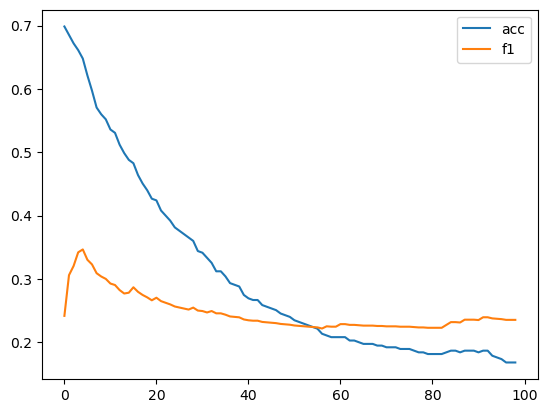

In [ ]:
optimized_threshold_barlow, acc, f1 = find_optimized_threshold(siamese_barlow, test_dataloader, model_type="barlow", max_threshold=1)
plt.plot(acc, label="acc")
plt.plot(f1, label="f1")
plt.legend()

100%|██████████| 125/125 [00:00<00:00, 175.28it/s]

Accuracy: 0.6987, Precision: 0.7500, Recall: 0.1440, F1-score: 0.2416


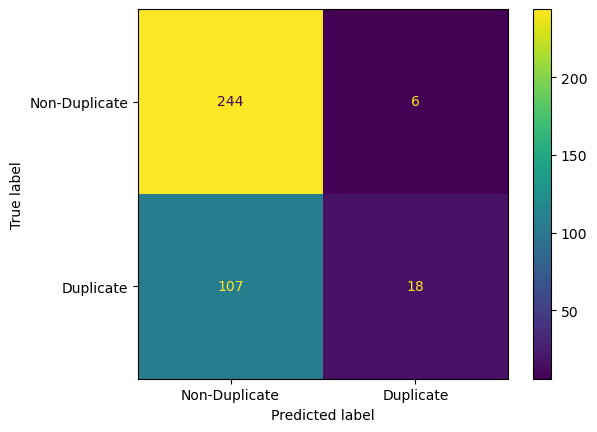

In [ ]:
evaluate_model(siamese_barlow,test_dataloader, threshold=optimized_threshold_barlow, model_type="barlow")

# 6 Hyper Parameter Tuning

In [ ]:
def evaluate_model_return(siamese_net, test_dataloader, threshold=0.02, model_type=""):
    all_true_y = []
    all_predicted_y = []

    for choice_data in tqdm(test_dataloader):
        true_y = []
        predicted_y = []
        for x0, x1, label in choice_data:
        # a is in the form of (x0, x1, label)
            if model_type=="barlow":
                output1, output2,_,_ = siamese_net(x0.cuda(), x1.cuda())
            else:
                output1, output2 = siamese_net(x0.cuda(), x1.cuda())
            euclidean_distance = F.pairwise_distance(output1, output2)
            if euclidean_distance.item() < threshold: # predicted duplicate
                true_y.append(label.item())
                predicted_y.append(1.)
            else:
                true_y.append(label.item())
                predicted_y.append(0.)

        all_true_y.extend(true_y)
        all_predicted_y.extend(predicted_y)

    accuracy = accuracy_score(all_true_y, all_predicted_y)
    precision = precision_score(all_true_y, all_predicted_y)
    recall = recall_score(all_true_y, all_predicted_y)
    f1 = f1_score(all_true_y, all_predicted_y)

    return accuracy, precision, recall, f1


In [ ]:
lr = [0.001, 0.0001, 0.00001]
bc = [8, 32]

## 6.1 Contra tune - vanilla <a class="anchor" id="section_6_1"></a>

In [ ]:
def gridsearch_siamese(train_siamese_dataset, val_siamese_dataset, num_epochs=30, learning_rates=[0.001], batch_sizes=[8]):
    params_results = {}

    for bc in batch_sizes:
        for lr in learning_rates:

            train_dataloader_tune = DataLoader(train_siamese_dataset,
                        shuffle=True,
                        batch_size=bc)

            val_dataloader_tune = DataLoader(val_siamese_dataset,
                                    shuffle=True,
                                    batch_size=bc)

            model = SiameseNetwork()
            train_siamese_network(model, train_dataloader_tune, val_dataloader_tune, num_epochs=30, learning_rate=lr)
            optimized_threshold, acc, f1 = find_optimized_threshold(model, test_dataloader, max_threshold=0.5)

            accuracy, precision, recall, f1 = evaluate_model_return(model, test_dataloader, threshold=optimized_threshold)
            lr_bc_key = f"lr={lr} and bc={bc}"
            params_results[lr_bc_key] = [accuracy, precision, recall, f1]
            print(lr_bc_key, "results:", [accuracy, precision, recall, f1])

    return params_results

Epoch 1/30, Train Loss: 0.548926453743326, Val Loss: 0.6372955582398725
Epoch 2/30, Train Loss: 0.5290581989347151, Val Loss: 0.6203473063283845
Epoch 3/30, Train Loss: 0.40132239117826285, Val Loss: 0.6390131611965204
Epoch 4/30, Train Loss: 0.3699730979768853, Val Loss: 0.5894121401453096
Epoch 5/30, Train Loss: 0.30801465607395295, Val Loss: 0.6171049179607316
Epoch 6/30, Train Loss: 0.26763632345797594, Val Loss: 0.5777575818723754
Epoch 7/30, Train Loss: 0.28903307338049145, Val Loss: 0.6627932826155111
Epoch 8/30, Train Loss: 0.2522761110510481, Val Loss: 0.6181106424253238
Epoch 9/30, Train Loss: 0.22010849433411894, Val Loss: 0.6113818984870848
Epoch 10/30, Train Loss: 0.21070150914601982, Val Loss: 0.6247393002635554
Epoch 11/30, Train Loss: 0.20138730252112605, Val Loss: 0.6023254163171116
Epoch 12/30, Train Loss: 0.19948974545848996, Val Loss: 0.5528879891100683
Epoch 13/30, Train Loss: 0.19904804069205725, Val Loss: 0.6657450642240675
Epoch 14/30, Train Loss: 0.182760626580

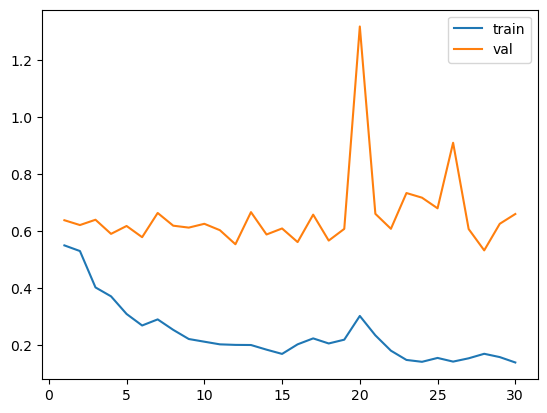

100%|██████████| 125/125 [00:00<00:00, 215.84it/s]


accuracy:0.6906666666666667, precision:0.7368421052631579, recall:0.112, f1:0.19444444444444445
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.6853333333333333, precision:0.6206896551724138, recall:0.144, f1:0.23376623376623376
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 222.37it/s]


accuracy:0.6773333333333333, precision:0.5588235294117647, recall:0.152, f1:0.23899371069182387
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.152, f1:0.2331288343558282
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.6586666666666666, precision:0.46511627906976744, recall:0.16, f1:0.2380952380952381
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.6506666666666666, precision:0.4423076923076923, recall:0.184, f1:0.2598870056497175
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.64, precision:0.4107142857142857, recall:0.184, f1:0.25414364640883974
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.6373333333333333, precision:0.4067796610169492, recall:0.192, f1:0.26086956521739135
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.6213333333333333, precision:0.36923076923076925, recall:0.192, f1:0.2526315789473685
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.6106666666666667, precision:0.352112676056338, recall:0.2, f1:0.2551020408163266
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.5973333333333334, precision:0.32894736842105265, recall:0.2, f1:0.2487562189054727
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.5813333333333334, precision:0.3048780487804878, recall:0.2, f1:0.24154589371980675
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.5813333333333334, precision:0.313953488372093, recall:0.216, f1:0.2559241706161137
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.576, precision:0.3111111111111111, recall:0.224, f1:0.2604651162790698
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.5706666666666667, precision:0.30851063829787234, recall:0.232, f1:0.2648401826484018
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.568, precision:0.30526315789473685, recall:0.232, f1:0.2636363636363636
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.56, precision:0.29591836734693877, recall:0.232, f1:0.26008968609865474
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.5573333333333333, precision:0.297029702970297, recall:0.24, f1:0.2654867256637168
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.5493333333333333, precision:0.28846153846153844, recall:0.24, f1:0.26200873362445415
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.5413333333333333, precision:0.2803738317757009, recall:0.24, f1:0.2586206896551724
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.5413333333333333, precision:0.28440366972477066, recall:0.248, f1:0.26495726495726496
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5226666666666666, precision:0.2672413793103448, recall:0.248, f1:0.2572614107883817
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.52, precision:0.26495726495726496, recall:0.248, f1:0.25619834710743805
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.5146666666666667, precision:0.2605042016806723, recall:0.248, f1:0.2540983606557377
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.512, precision:0.25833333333333336, recall:0.248, f1:0.25306122448979596
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.5066666666666667, precision:0.2540983606557377, recall:0.248, f1:0.2510121457489879
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.496, precision:0.24603174603174602, recall:0.248, f1:0.24701195219123503
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.49333333333333335, precision:0.24806201550387597, recall:0.256, f1:0.25196850393700787
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.49066666666666664, precision:0.24615384615384617, recall:0.256, f1:0.2509803921568628
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.4826666666666667, precision:0.24060150375939848, recall:0.256, f1:0.24806201550387597
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.47733333333333333, precision:0.24087591240875914, recall:0.264, f1:0.2519083969465649
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.472, precision:0.23741007194244604, recall:0.264, f1:0.25
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.4666666666666667, precision:0.23404255319148937, recall:0.264, f1:0.24812030075187969
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.4613333333333333, precision:0.23076923076923078, recall:0.264, f1:0.24626865671641793
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.456, precision:0.22758620689655173, recall:0.264, f1:0.24444444444444444
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.448, precision:0.22297297297297297, recall:0.264, f1:0.2417582417582418
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.45066666666666666, precision:0.22818791946308725, recall:0.272, f1:0.24817518248175183
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.45066666666666666, precision:0.22818791946308725, recall:0.272, f1:0.24817518248175183
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.44266666666666665, precision:0.2236842105263158, recall:0.272, f1:0.24548736462093862
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.44266666666666665, precision:0.2236842105263158, recall:0.272, f1:0.24548736462093862
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.44, precision:0.2222222222222222, recall:0.272, f1:0.2446043165467626
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.43733333333333335, precision:0.22077922077922077, recall:0.272, f1:0.24372759856630824
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.42933333333333334, precision:0.21656050955414013, recall:0.272, f1:0.24113475177304966
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.424, precision:0.2138364779874214, recall:0.272, f1:0.23943661971830987
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.42133333333333334, precision:0.2125, recall:0.272, f1:0.23859649122807017
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.41333333333333333, precision:0.2085889570552147, recall:0.272, f1:0.2361111111111111
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.41333333333333333, precision:0.21212121212121213, recall:0.28, f1:0.2413793103448276
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.41333333333333333, precision:0.21212121212121213, recall:0.28, f1:0.2413793103448276
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


lr=0.001 and bc=8 results: [0.6906666666666667, 0.7368421052631579, 0.112, 0.19444444444444445]
Epoch 1/30, Train Loss: 0.7283702063897662, Val Loss: 0.8607793767863002
Epoch 2/30, Train Loss: 0.6061909678545291, Val Loss: 0.7789379298490914
Epoch 3/30, Train Loss: 0.5148281425629792, Val Loss: 0.6317789201673708
Epoch 4/30, Train Loss: 0.4023987705525207, Val Loss: 0.5808170243705574
Epoch 5/30, Train Loss: 0.3744152502990083, Val Loss: 0.5860019971273447
Epoch 6/30, Train Loss: 0.36520362351285784, Val Loss: 0.5704227015376091
Epoch 7/30, Train Loss: 0.3224988134675904, Val Loss: 0.573334210993428
Epoch 8/30, Train Loss: 0.3147100983677726, Val Loss: 0.59315377865967
Epoch 9/30, Train Loss: 0.2840625735269369, Val Loss: 0.5953483808001405
Epoch 10/30, Train Loss: 0.26328435765677377, Val Loss: 0.617533419869448
Epoch 11/30, Train Loss: 0.24113818539894724, Val Loss: 0.609345955872222
Epoch 12/30, Train Loss: 0.23562918547050735, Val Loss: 0.6133147544766727
Epoch 13/30, Train Loss: 0

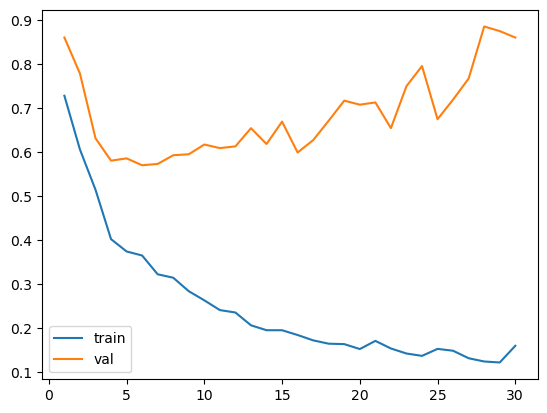

100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.6906666666666667, precision:0.7368421052631579, recall:0.112, f1:0.19444444444444445
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.688, precision:0.6666666666666666, recall:0.128, f1:0.21476510067114093
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.6853333333333333, precision:0.6296296296296297, recall:0.136, f1:0.2236842105263158
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.688, precision:0.6428571428571429, recall:0.144, f1:0.2352941176470588
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6933333333333334, precision:0.65625, recall:0.168, f1:0.267515923566879
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6906666666666667, precision:0.6216216216216216, recall:0.184, f1:0.2839506172839506
Current threshold:0.07, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.6746666666666666, precision:0.5333333333333333, recall:0.192, f1:0.2823529411764706
Current threshold:0.08, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.6693333333333333, precision:0.5106382978723404, recall:0.192, f1:0.27906976744186046
Current threshold:0.09, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.6613333333333333, precision:0.4807692307692308, recall:0.2, f1:0.2824858757062147
Current threshold:0.09999999999999999, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.664, precision:0.4909090909090909, recall:0.216, f1:0.3
Current threshold:0.10999999999999999, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.6533333333333333, precision:0.4576271186440678, recall:0.216, f1:0.29347826086956524
Current threshold:0.11999999999999998, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6506666666666666, precision:0.45161290322580644, recall:0.224, f1:0.2994652406417112
Current threshold:0.12999999999999998, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6346666666666667, precision:0.4117647058823529, recall:0.224, f1:0.2901554404145078
Current threshold:0.13999999999999999, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.6266666666666667, precision:0.39436619718309857, recall:0.224, f1:0.2857142857142857
Current threshold:0.15, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.616, precision:0.37333333333333335, recall:0.224, f1:0.27999999999999997
Current threshold:0.16, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.6053333333333333, precision:0.35443037974683544, recall:0.224, f1:0.27450980392156865
Current threshold:0.17, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.5946666666666667, precision:0.3373493975903614, recall:0.224, f1:0.2692307692307692
Current threshold:0.18000000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.584, precision:0.3218390804597701, recall:0.224, f1:0.26415094339622636
Current threshold:0.19000000000000003, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.584, precision:0.3258426966292135, recall:0.232, f1:0.2710280373831776
Current threshold:0.20000000000000004, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5786666666666667, precision:0.31868131868131866, recall:0.232, f1:0.26851851851851855
Current threshold:0.21000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.5733333333333334, precision:0.3118279569892473, recall:0.232, f1:0.26605504587155965
Current threshold:0.22000000000000006, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.568, precision:0.30526315789473685, recall:0.232, f1:0.2636363636363636
Current threshold:0.23000000000000007, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 217.34it/s]


accuracy:0.56, precision:0.29591836734693877, recall:0.232, f1:0.26008968609865474
Current threshold:0.24000000000000007, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.5493333333333333, precision:0.28431372549019607, recall:0.232, f1:0.2555066079295154
Current threshold:0.25000000000000006, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.544, precision:0.27884615384615385, recall:0.232, f1:0.2532751091703057
Current threshold:0.26000000000000006, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.536, precision:0.27102803738317754, recall:0.232, f1:0.25
Current threshold:0.2700000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.5333333333333333, precision:0.2727272727272727, recall:0.24, f1:0.2553191489361702
Current threshold:0.2800000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.528, precision:0.26785714285714285, recall:0.24, f1:0.25316455696202533
Current threshold:0.2900000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5253333333333333, precision:0.26548672566371684, recall:0.24, f1:0.25210084033613445
Current threshold:0.3000000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.52, precision:0.26495726495726496, recall:0.248, f1:0.25619834710743805
Current threshold:0.3100000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5173333333333333, precision:0.26666666666666666, recall:0.256, f1:0.2612244897959184
Current threshold:0.3200000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.512, precision:0.26229508196721313, recall:0.256, f1:0.2591093117408907
Current threshold:0.3300000000000001, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5093333333333333, precision:0.264, recall:0.264, f1:0.264
Current threshold:0.34000000000000014, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.512, precision:0.2698412698412698, recall:0.272, f1:0.2709163346613546
Current threshold:0.35000000000000014, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.5066666666666667, precision:0.265625, recall:0.272, f1:0.26877470355731226
Current threshold:0.36000000000000015, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.496, precision:0.25757575757575757, recall:0.272, f1:0.26459143968871596
Current threshold:0.37000000000000016, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.49333333333333335, precision:0.2556390977443609, recall:0.272, f1:0.26356589147286824
Current threshold:0.38000000000000017, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.4826666666666667, precision:0.24817518248175183, recall:0.272, f1:0.25954198473282447
Current threshold:0.3900000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.48, precision:0.2463768115942029, recall:0.272, f1:0.25855513307984795
Current threshold:0.4000000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.4746666666666667, precision:0.24285714285714285, recall:0.272, f1:0.25660377358490566
Current threshold:0.4100000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.464, precision:0.2361111111111111, recall:0.272, f1:0.2527881040892193
Current threshold:0.4200000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.4613333333333333, precision:0.23448275862068965, recall:0.272, f1:0.2518518518518518
Current threshold:0.4300000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.45066666666666666, precision:0.22818791946308725, recall:0.272, f1:0.24817518248175183
Current threshold:0.4400000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.44266666666666665, precision:0.2236842105263158, recall:0.272, f1:0.24548736462093862
Current threshold:0.45000000000000023, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.44266666666666665, precision:0.2236842105263158, recall:0.272, f1:0.24548736462093862
Current threshold:0.46000000000000024, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.44, precision:0.2222222222222222, recall:0.272, f1:0.2446043165467626
Current threshold:0.47000000000000025, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.432, precision:0.21794871794871795, recall:0.272, f1:0.24199288256227758
Current threshold:0.48000000000000026, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.4266666666666667, precision:0.21518987341772153, recall:0.272, f1:0.2402826855123675
Current threshold:0.49000000000000027, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 206.91it/s]


accuracy:0.42133333333333334, precision:0.2125, recall:0.272, f1:0.23859649122807017
Current threshold:0.5000000000000002, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


lr=0.0001 and bc=8 results: [0.6933333333333334, 0.65625, 0.168, 0.267515923566879]
Epoch 1/30, Train Loss: 0.7490919430874873, Val Loss: 0.8760489656716871
Epoch 2/30, Train Loss: 0.7345129604711061, Val Loss: 0.8749631312823208
Epoch 3/30, Train Loss: 0.7455365818222354, Val Loss: 0.8642130583122803
Epoch 4/30, Train Loss: 0.7420846423115587, Val Loss: 0.8701944362347651
Epoch 5/30, Train Loss: 0.7368440287182717, Val Loss: 0.8728143263177021
Epoch 6/30, Train Loss: 0.715117235022358, Val Loss: 0.8464017820461824
Epoch 7/30, Train Loss: 0.6992094687953604, Val Loss: 0.8562905157879485
Epoch 8/30, Train Loss: 0.6709782391538427, Val Loss: 0.8292161522702756
Epoch 9/30, Train Loss: 0.6271489660476187, Val Loss: 0.7729457206533927
Epoch 10/30, Train Loss: 0.583993740563624, Val Loss: 0.7308086217626145
Epoch 11/30, Train Loss: 0.5092791410065011, Val Loss: 0.6713578530440205
Epoch 12/30, Train Loss: 0.44254754922401746, Val Loss: 0.6362739368096778
Epoch 13/30, Train Loss: 0.41727583355

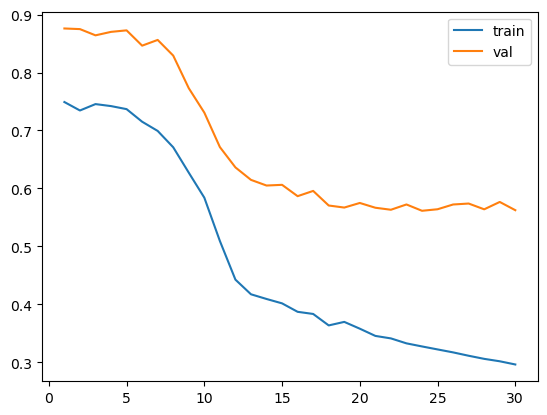

100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.704, precision:0.7916666666666666, recall:0.152, f1:0.25503355704697983
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6853333333333333, precision:0.5813953488372093, recall:0.2, f1:0.2976190476190476
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.672, precision:0.5178571428571429, recall:0.232, f1:0.32044198895027626
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6506666666666666, precision:0.45588235294117646, recall:0.248, f1:0.3212435233160622
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6213333333333333, precision:0.3950617283950617, recall:0.256, f1:0.3106796116504854
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6053333333333333, precision:0.3707865168539326, recall:0.264, f1:0.308411214953271
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5733333333333334, precision:0.32673267326732675, recall:0.264, f1:0.2920353982300885
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.568, precision:0.3238095238095238, recall:0.272, f1:0.29565217391304355
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.552, precision:0.30973451327433627, recall:0.28, f1:0.2941176470588235
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5466666666666666, precision:0.30434782608695654, recall:0.28, f1:0.2916666666666667
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5333333333333333, precision:0.29508196721311475, recall:0.288, f1:0.291497975708502
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.52, precision:0.28346456692913385, recall:0.288, f1:0.2857142857142857
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.5066666666666667, precision:0.2727272727272727, recall:0.288, f1:0.28015564202334625
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5013333333333333, precision:0.26865671641791045, recall:0.288, f1:0.277992277992278
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.49066666666666664, precision:0.2608695652173913, recall:0.288, f1:0.27376425855513303
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.47733333333333333, precision:0.25517241379310346, recall:0.296, f1:0.2740740740740741
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.4746666666666667, precision:0.2534246575342466, recall:0.296, f1:0.2730627306273063
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4613333333333333, precision:0.24503311258278146, recall:0.296, f1:0.2681159420289855
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.448, precision:0.23717948717948717, recall:0.296, f1:0.26334519572953735
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4186666666666667, precision:0.2215568862275449, recall:0.296, f1:0.25342465753424653
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.41333333333333333, precision:0.21893491124260356, recall:0.296, f1:0.2517006802721088
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.4026666666666667, precision:0.21714285714285714, recall:0.304, f1:0.2533333333333333
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.3973333333333333, precision:0.21468926553672316, recall:0.304, f1:0.25165562913907286
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3893333333333333, precision:0.2111111111111111, recall:0.304, f1:0.24918032786885247
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.38133333333333336, precision:0.20765027322404372, recall:0.304, f1:0.24675324675324675
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.37333333333333335, precision:0.20430107526881722, recall:0.304, f1:0.24437299035369775
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.36, precision:0.19895287958115182, recall:0.304, f1:0.24050632911392406
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.34933333333333333, precision:0.19487179487179487, recall:0.304, f1:0.2375
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.3466666666666667, precision:0.19387755102040816, recall:0.304, f1:0.2367601246105919
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.344, precision:0.19289340101522842, recall:0.304, f1:0.2360248447204969
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.3466666666666667, precision:0.19696969696969696, recall:0.312, f1:0.2414860681114551
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 232.29it/s]


accuracy:0.33066666666666666, precision:0.19117647058823528, recall:0.312, f1:0.23708206686930086
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.32266666666666666, precision:0.18840579710144928, recall:0.312, f1:0.23493975903614459
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.32, precision:0.19047619047619047, recall:0.32, f1:0.2388059701492537
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.31466666666666665, precision:0.18867924528301888, recall:0.32, f1:0.23738872403560832
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.304, precision:0.18518518518518517, recall:0.32, f1:0.2346041055718475
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.30133333333333334, precision:0.1872146118721461, recall:0.328, f1:0.23837209302325582
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.2906666666666667, precision:0.18385650224215247, recall:0.328, f1:0.23563218390804597
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.288, precision:0.18303571428571427, recall:0.328, f1:0.2349570200573066
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.2693333333333333, precision:0.1774891774891775, recall:0.328, f1:0.2303370786516854
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.2693333333333333, precision:0.1774891774891775, recall:0.328, f1:0.2303370786516854
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 201.24it/s]


accuracy:0.2613333333333333, precision:0.1752136752136752, recall:0.328, f1:0.22841225626740946
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 189.35it/s]


accuracy:0.2613333333333333, precision:0.1752136752136752, recall:0.328, f1:0.22841225626740946
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 218.10it/s]


accuracy:0.256, precision:0.17372881355932204, recall:0.328, f1:0.22714681440443213
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.25066666666666665, precision:0.1722689075630252, recall:0.328, f1:0.22589531680440772
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.24533333333333332, precision:0.17083333333333334, recall:0.328, f1:0.22465753424657536
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.24266666666666667, precision:0.17012448132780084, recall:0.328, f1:0.22404371584699453
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.24, precision:0.16942148760330578, recall:0.328, f1:0.22343324250681199
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.232, precision:0.1673469387755102, recall:0.328, f1:0.22162162162162163
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


lr=1e-05 and bc=8 results: [0.704, 0.7916666666666666, 0.152, 0.25503355704697983]
Epoch 1/30, Train Loss: 0.6418318837881088, Val Loss: 0.7521739840507508
Epoch 2/30, Train Loss: 0.4174436628818512, Val Loss: 0.5664777636528016
Epoch 3/30, Train Loss: 0.44305805265903475, Val Loss: 0.7056356906890869
Epoch 4/30, Train Loss: 0.3651845917105675, Val Loss: 0.6706276535987854
Epoch 5/30, Train Loss: 0.3261486321687698, Val Loss: 0.5954316258430481
Epoch 6/30, Train Loss: 0.28139159828424454, Val Loss: 0.6304865539073944
Epoch 7/30, Train Loss: 0.24512821566313506, Val Loss: 0.5903164595365524
Epoch 8/30, Train Loss: 0.22440949864685536, Val Loss: 0.640871274471283
Epoch 9/30, Train Loss: 0.1959450425580144, Val Loss: 0.6849818229675293
Epoch 10/30, Train Loss: 0.19988851323723794, Val Loss: 0.6084309339523315
Epoch 11/30, Train Loss: 0.2089807130396366, Val Loss: 0.635516905784607
Epoch 12/30, Train Loss: 0.17894597221165895, Val Loss: 0.6132724761962891
Epoch 13/30, Train Loss: 0.1982359

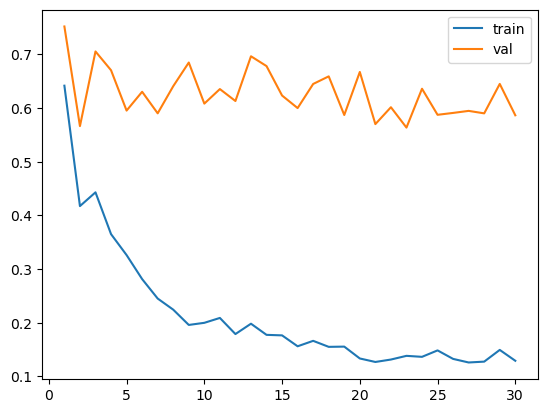

100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.696, precision:0.8235294117647058, recall:0.112, f1:0.19718309859154928
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.6933333333333334, precision:0.7083333333333334, recall:0.136, f1:0.22818791946308725
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.688, precision:0.6333333333333333, recall:0.152, f1:0.2451612903225806
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.688, precision:0.625, recall:0.16, f1:0.25477707006369427
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.6746666666666666, precision:0.5365853658536586, recall:0.176, f1:0.26506024096385544
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.672, precision:0.5227272727272727, recall:0.184, f1:0.27218934911242604
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.664, precision:0.48936170212765956, recall:0.184, f1:0.2674418604651163
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.648, precision:0.4339622641509434, recall:0.184, f1:0.2584269662921348
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.6293333333333333, precision:0.390625, recall:0.2, f1:0.2645502645502646
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.6186666666666667, precision:0.375, recall:0.216, f1:0.2741116751269036
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.608, precision:0.35526315789473684, recall:0.216, f1:0.26865671641791045
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.5946666666666667, precision:0.3333333333333333, recall:0.216, f1:0.2621359223300971
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5893333333333334, precision:0.32941176470588235, recall:0.224, f1:0.26666666666666666
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.5786666666666667, precision:0.3146067415730337, recall:0.224, f1:0.26168224299065423
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5733333333333334, precision:0.3076923076923077, recall:0.224, f1:0.2592592592592593
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5626666666666666, precision:0.29473684210526313, recall:0.224, f1:0.2545454545454545
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.56, precision:0.29591836734693877, recall:0.232, f1:0.26008968609865474
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.552, precision:0.2871287128712871, recall:0.232, f1:0.25663716814159293
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.5413333333333333, precision:0.2761904761904762, recall:0.232, f1:0.2521739130434783
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.5306666666666666, precision:0.26605504587155965, recall:0.232, f1:0.24786324786324784
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.5253333333333333, precision:0.26548672566371684, recall:0.24, f1:0.25210084033613445
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5173333333333333, precision:0.25862068965517243, recall:0.24, f1:0.24896265560165975
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.5093333333333333, precision:0.25210084033613445, recall:0.24, f1:0.24590163934426226
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.49866666666666665, precision:0.248, recall:0.248, f1:0.248
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.4826666666666667, precision:0.2366412213740458, recall:0.248, f1:0.2421875
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.48, precision:0.23484848484848486, recall:0.248, f1:0.24124513618677046
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.47733333333333333, precision:0.23703703703703705, recall:0.256, f1:0.24615384615384614
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.4746666666666667, precision:0.23529411764705882, recall:0.256, f1:0.24521072796934867
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4746666666666667, precision:0.23529411764705882, recall:0.256, f1:0.24521072796934867
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.4693333333333333, precision:0.2318840579710145, recall:0.256, f1:0.24334600760456274
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.4613333333333333, precision:0.22695035460992907, recall:0.256, f1:0.2406015037593985
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4533333333333333, precision:0.2222222222222222, recall:0.256, f1:0.2379182156133829
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.448, precision:0.2191780821917808, recall:0.256, f1:0.23616236162361623
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.43466666666666665, precision:0.2119205298013245, recall:0.256, f1:0.23188405797101452
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.42933333333333334, precision:0.2129032258064516, recall:0.264, f1:0.2357142857142857
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.424, precision:0.21019108280254778, recall:0.264, f1:0.23404255319148937
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4186666666666667, precision:0.20754716981132076, recall:0.264, f1:0.23239436619718312
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.4053333333333333, precision:0.20121951219512196, recall:0.264, f1:0.22837370242214533
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.3893333333333333, precision:0.19411764705882353, recall:0.264, f1:0.22372881355932206
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 205.55it/s]


accuracy:0.3893333333333333, precision:0.19411764705882353, recall:0.264, f1:0.22372881355932206
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 206.22it/s]


accuracy:0.38133333333333336, precision:0.1907514450867052, recall:0.264, f1:0.2214765100671141
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 219.63it/s]


accuracy:0.38133333333333336, precision:0.1907514450867052, recall:0.264, f1:0.2214765100671141
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.38133333333333336, precision:0.1907514450867052, recall:0.264, f1:0.2214765100671141
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.38133333333333336, precision:0.1907514450867052, recall:0.264, f1:0.2214765100671141
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.37866666666666665, precision:0.1896551724137931, recall:0.264, f1:0.22073578595317728
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.37066666666666664, precision:0.1864406779661017, recall:0.264, f1:0.2185430463576159
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.37333333333333335, precision:0.19101123595505617, recall:0.272, f1:0.22442244224422442
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.37333333333333335, precision:0.19444444444444445, recall:0.28, f1:0.22950819672131148
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


lr=0.001 and bc=32 results: [0.696, 0.8235294117647058, 0.112, 0.19718309859154928]
Epoch 1/30, Train Loss: 0.7190089374780655, Val Loss: 0.901693320274353
Epoch 2/30, Train Loss: 0.7106708198785782, Val Loss: 0.869402265548706
Epoch 3/30, Train Loss: 0.7062869012355805, Val Loss: 0.7991172790527343
Epoch 4/30, Train Loss: 0.6159514248371124, Val Loss: 0.7770052909851074
Epoch 5/30, Train Loss: 0.5262146949768066, Val Loss: 0.7496878743171692
Epoch 6/30, Train Loss: 0.4953011885285378, Val Loss: 0.645550686120987
Epoch 7/30, Train Loss: 0.4215067431330681, Val Loss: 0.6420745015144348
Epoch 8/30, Train Loss: 0.3932025462388992, Val Loss: 0.5891331434249878
Epoch 9/30, Train Loss: 0.38232893869280815, Val Loss: 0.577801090478897
Epoch 10/30, Train Loss: 0.35989079624414444, Val Loss: 0.6025955021381378
Epoch 11/30, Train Loss: 0.33353722766041755, Val Loss: 0.5815466523170472
Epoch 12/30, Train Loss: 0.3447737291455269, Val Loss: 0.5504485607147217
Epoch 13/30, Train Loss: 0.30863476656

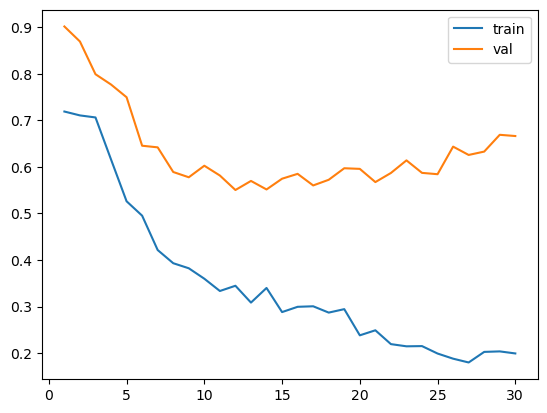

100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.6933333333333334, precision:0.7083333333333334, recall:0.136, f1:0.22818791946308725
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.6853333333333333, precision:0.6129032258064516, recall:0.152, f1:0.24358974358974358
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.664, precision:0.4883720930232558, recall:0.168, f1:0.25
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.6453333333333333, precision:0.42, recall:0.168, f1:0.24000000000000002
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.6373333333333333, precision:0.4, recall:0.176, f1:0.24444444444444444
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6346666666666667, precision:0.39285714285714285, recall:0.176, f1:0.24309392265193366
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.6346666666666667, precision:0.4032258064516129, recall:0.2, f1:0.267379679144385
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.616, precision:0.36231884057971014, recall:0.2, f1:0.2577319587628866
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.608, precision:0.3472222222222222, recall:0.2, f1:0.25380710659898476
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5973333333333334, precision:0.32894736842105265, recall:0.2, f1:0.2487562189054727
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.592, precision:0.32051282051282054, recall:0.2, f1:0.24630541871921183
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.5813333333333334, precision:0.30952380952380953, recall:0.208, f1:0.2488038277511962
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.5733333333333334, precision:0.2988505747126437, recall:0.208, f1:0.24528301886792453
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.568, precision:0.29213483146067415, recall:0.208, f1:0.24299065420560745
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.5653333333333334, precision:0.29347826086956524, recall:0.216, f1:0.2488479262672811
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.552, precision:0.27835051546391754, recall:0.216, f1:0.24324324324324326
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.544, precision:0.27, recall:0.216, f1:0.24000000000000002
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.536, precision:0.2621359223300971, recall:0.216, f1:0.2368421052631579
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.5333333333333333, precision:0.25961538461538464, recall:0.216, f1:0.23580786026200873
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.528, precision:0.25471698113207547, recall:0.216, f1:0.23376623376623376
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.5226666666666666, precision:0.25, recall:0.216, f1:0.23175965665236054
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.5173333333333333, precision:0.25862068965517243, recall:0.24, f1:0.24896265560165975
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5066666666666667, precision:0.2540983606557377, recall:0.248, f1:0.2510121457489879
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.496, precision:0.24603174603174602, recall:0.248, f1:0.24701195219123503
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.488, precision:0.24031007751937986, recall:0.248, f1:0.2440944881889764
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.4826666666666667, precision:0.2366412213740458, recall:0.248, f1:0.2421875
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.48, precision:0.23484848484848486, recall:0.248, f1:0.24124513618677046
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.47733333333333333, precision:0.23308270676691728, recall:0.248, f1:0.24031007751937983
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.4693333333333333, precision:0.22794117647058823, recall:0.248, f1:0.23754789272030655
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.464, precision:0.2246376811594203, recall:0.248, f1:0.23574144486692014
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.464, precision:0.2246376811594203, recall:0.248, f1:0.23574144486692014
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.4613333333333333, precision:0.22695035460992907, recall:0.256, f1:0.2406015037593985
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.464, precision:0.2323943661971831, recall:0.264, f1:0.24719101123595505
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.45066666666666666, precision:0.22448979591836735, recall:0.264, f1:0.2426470588235294
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.44266666666666665, precision:0.22, recall:0.264, f1:0.24000000000000002
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.43733333333333335, precision:0.21710526315789475, recall:0.264, f1:0.23826714801444043
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.43466666666666665, precision:0.21568627450980393, recall:0.264, f1:0.23741007194244604
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.42933333333333334, precision:0.2129032258064516, recall:0.264, f1:0.2357142857142857
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.4266666666666667, precision:0.21153846153846154, recall:0.264, f1:0.23487544483985764
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 218.10it/s]


accuracy:0.42133333333333334, precision:0.2088607594936709, recall:0.264, f1:0.2332155477031802
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 209.33it/s]


accuracy:0.4186666666666667, precision:0.20754716981132076, recall:0.264, f1:0.23239436619718312
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.416, precision:0.21341463414634146, recall:0.28, f1:0.24221453287197234
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.41333333333333333, precision:0.21212121212121213, recall:0.28, f1:0.2413793103448276
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.416, precision:0.21686746987951808, recall:0.288, f1:0.24742268041237114
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.41333333333333333, precision:0.2155688622754491, recall:0.288, f1:0.24657534246575344
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4106666666666667, precision:0.21428571428571427, recall:0.288, f1:0.24573378839590443
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.408, precision:0.21301775147928995, recall:0.288, f1:0.24489795918367346
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.39466666666666667, precision:0.20689655172413793, recall:0.288, f1:0.24080267558528426
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.3893333333333333, precision:0.20454545454545456, recall:0.288, f1:0.23920265780730898
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


lr=0.0001 and bc=32 results: [0.6933333333333334, 0.7083333333333334, 0.136, 0.22818791946308725]
Epoch 1/30, Train Loss: 0.782633975148201, Val Loss: 0.8925343751907349
Epoch 2/30, Train Loss: 0.7405329868197441, Val Loss: 0.8922662794589996
Epoch 3/30, Train Loss: 0.7607558876276016, Val Loss: 0.8918082237243652
Epoch 4/30, Train Loss: 0.7811453461647033, Val Loss: 0.8687371611595154
Epoch 5/30, Train Loss: 0.718209183216095, Val Loss: 0.8795816421508789
Epoch 6/30, Train Loss: 0.7791777580976487, Val Loss: 0.8337722301483155
Epoch 7/30, Train Loss: 0.7166017681360245, Val Loss: 0.9010703206062317
Epoch 8/30, Train Loss: 0.7155402109026909, Val Loss: 0.8886219143867493
Epoch 9/30, Train Loss: 0.7146923929452896, Val Loss: 0.8653122782707214
Epoch 10/30, Train Loss: 0.754326245188713, Val Loss: 0.9314371824264527
Epoch 11/30, Train Loss: 0.7531774491071701, Val Loss: 0.8734651505947113
Epoch 12/30, Train Loss: 0.709236341714859, Val Loss: 0.8492605209350585
Epoch 13/30, Train Loss: 0.

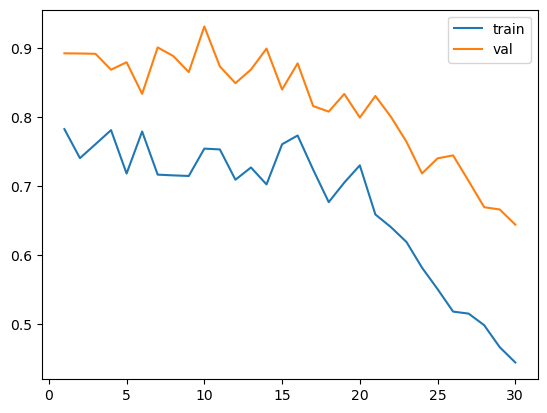

100%|██████████| 125/125 [00:00<00:00, 216.97it/s]


accuracy:0.7013333333333334, precision:0.7241379310344828, recall:0.168, f1:0.27272727272727276
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7013333333333334, precision:0.6444444444444445, recall:0.232, f1:0.3411764705882353
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.6773333333333333, precision:0.5333333333333333, recall:0.256, f1:0.34594594594594597
Current threshold:0.04, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6586666666666666, precision:0.4782608695652174, recall:0.264, f1:0.3402061855670103
Current threshold:0.05, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.6293333333333333, precision:0.4166666666666667, recall:0.28, f1:0.33492822966507174
Current threshold:0.060000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.616, precision:0.39325842696629215, recall:0.28, f1:0.32710280373831774
Current threshold:0.07, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.608, precision:0.3854166666666667, recall:0.296, f1:0.334841628959276
Current threshold:0.08, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5866666666666667, precision:0.3584905660377358, recall:0.304, f1:0.329004329004329
Current threshold:0.09, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.5653333333333334, precision:0.33620689655172414, recall:0.312, f1:0.3236514522821577
Current threshold:0.09999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.536, precision:0.30708661417322836, recall:0.312, f1:0.30952380952380953
Current threshold:0.10999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.5173333333333333, precision:0.291044776119403, recall:0.312, f1:0.30115830115830117
Current threshold:0.11999999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.49333333333333335, precision:0.2727272727272727, recall:0.312, f1:0.29104477611940294
Current threshold:0.12999999999999998, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.49066666666666664, precision:0.273972602739726, recall:0.32, f1:0.2952029520295203
Current threshold:0.13999999999999999, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.464, precision:0.2564102564102564, recall:0.32, f1:0.2846975088967971
Current threshold:0.15, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.44266666666666665, precision:0.24390243902439024, recall:0.32, f1:0.27681660899653976
Current threshold:0.16, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.42933333333333334, precision:0.23668639053254437, recall:0.32, f1:0.272108843537415
Current threshold:0.17, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.4186666666666667, precision:0.23121387283236994, recall:0.32, f1:0.26845637583892623
Current threshold:0.18000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.4106666666666667, precision:0.22727272727272727, recall:0.32, f1:0.26578073089701
Current threshold:0.19000000000000003, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.4, precision:0.2222222222222222, recall:0.32, f1:0.26229508196721313
Current threshold:0.20000000000000004, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.392, precision:0.2185792349726776, recall:0.32, f1:0.25974025974025977
Current threshold:0.21000000000000005, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.384, precision:0.21505376344086022, recall:0.32, f1:0.2572347266881029
Current threshold:0.22000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.38133333333333336, precision:0.21693121693121692, recall:0.328, f1:0.2611464968152866
Current threshold:0.23000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.37333333333333335, precision:0.21354166666666666, recall:0.328, f1:0.2586750788643533
Current threshold:0.24000000000000007, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.37066666666666664, precision:0.2153846153846154, recall:0.336, f1:0.26250000000000007
Current threshold:0.25000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.37066666666666664, precision:0.2153846153846154, recall:0.336, f1:0.26250000000000007
Current threshold:0.26000000000000006, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.36, precision:0.21105527638190955, recall:0.336, f1:0.25925925925925924
Current threshold:0.2700000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.34933333333333333, precision:0.20689655172413793, recall:0.336, f1:0.25609756097560976
Current threshold:0.2800000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.336, precision:0.20192307692307693, recall:0.336, f1:0.25225225225225223
Current threshold:0.2900000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.3253333333333333, precision:0.19811320754716982, recall:0.336, f1:0.24925816023738875
Current threshold:0.3000000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.32, precision:0.19626168224299065, recall:0.336, f1:0.24778761061946905
Current threshold:0.3100000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.30933333333333335, precision:0.1926605504587156, recall:0.336, f1:0.24489795918367346
Current threshold:0.3200000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.304, precision:0.19090909090909092, recall:0.336, f1:0.24347826086956517
Current threshold:0.3300000000000001, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.29333333333333333, precision:0.1875, recall:0.336, f1:0.24068767908309452
Current threshold:0.34000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.288, precision:0.18584070796460178, recall:0.336, f1:0.23931623931623933
Current threshold:0.35000000000000014, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.2773333333333333, precision:0.1826086956521739, recall:0.336, f1:0.23661971830985917
Current threshold:0.36000000000000015, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.2773333333333333, precision:0.1826086956521739, recall:0.336, f1:0.23661971830985917
Current threshold:0.37000000000000016, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.272, precision:0.1810344827586207, recall:0.336, f1:0.23529411764705882
Current threshold:0.38000000000000017, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.26666666666666666, precision:0.18220338983050846, recall:0.344, f1:0.23822714681440443
Current threshold:0.3900000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.264, precision:0.18143459915611815, recall:0.344, f1:0.23756906077348067
Current threshold:0.4000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 206.56it/s]


accuracy:0.256, precision:0.17916666666666667, recall:0.344, f1:0.2356164383561644
Current threshold:0.4100000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 215.47it/s]


accuracy:0.25066666666666665, precision:0.17768595041322313, recall:0.344, f1:0.23433242506811988
Current threshold:0.4200000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.24, precision:0.17479674796747968, recall:0.344, f1:0.23180592991913748
Current threshold:0.4300000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.23733333333333334, precision:0.17408906882591094, recall:0.344, f1:0.23118279569892475
Current threshold:0.4400000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.22933333333333333, precision:0.172, recall:0.344, f1:0.2293333333333333
Current threshold:0.45000000000000023, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.22933333333333333, precision:0.172, recall:0.344, f1:0.2293333333333333
Current threshold:0.46000000000000024, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.22133333333333333, precision:0.16996047430830039, recall:0.344, f1:0.22751322751322747
Current threshold:0.47000000000000025, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.22133333333333333, precision:0.17254901960784313, recall:0.352, f1:0.23157894736842108
Current threshold:0.48000000000000026, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.22133333333333333, precision:0.17509727626459143, recall:0.36, f1:0.23560209424083772
Current threshold:0.49000000000000027, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.216, precision:0.17374517374517376, recall:0.36, f1:0.23437500000000003
Current threshold:0.5000000000000002, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]

lr=1e-05 and bc=32 results: [0.7013333333333334, 0.6444444444444445, 0.232, 0.3411764705882353]


In [ ]:
vanilla_tune_results = gridsearch_siamese(train_siamese_dataset, val_siamese_dataset, num_epochs=30, learning_rates=lr, batch_sizes=bc)

In [ ]:
vanilla_tune_results

{'lr=0.001 and bc=8': [0.6906666666666667,
  0.7368421052631579,
  0.112,
  0.19444444444444445],
 'lr=0.0001 and bc=8': [0.6933333333333334, 0.65625, 0.168, 0.267515923566879],
 'lr=1e-05 and bc=8': [0.704, 0.7916666666666666, 0.152, 0.25503355704697983],
 'lr=0.001 and bc=32': [0.696, 0.8235294117647058, 0.112, 0.19718309859154928],
 'lr=0.0001 and bc=32': [0.6933333333333334,
  0.7083333333333334,
  0.136,
  0.22818791946308725],
 'lr=1e-05 and bc=32': [0.7013333333333334,
  0.6444444444444445,
  0.232,
  0.3411764705882353]}

## 6.2 Contra tune - Alexnet  <a class="anchor" id="section_6_2"></a>

In [ ]:
def gridsearch_alexnet(train_siamese_dataset, val_siamese_dataset, num_epochs=30, learning_rates=[0.001], batch_sizes=[8]):
    params_results = {}

    for bc in batch_sizes:
        for lr in learning_rates:

            train_dataloader_tune = DataLoader(train_siamese_dataset,
                        shuffle=True,
                        batch_size=bc)

            val_dataloader_tune = DataLoader(val_siamese_dataset,
                                    shuffle=True,
                                    batch_size=bc)

            model = SiameseNetworkAlexNet()
            train_siamese_network(model, train_dataloader_tune, val_dataloader_tune, num_epochs=30, learning_rate=lr)
            optimized_threshold, acc, f1 = find_optimized_threshold(model, test_dataloader, max_threshold=0.5)

            accuracy, precision, recall, f1 = evaluate_model_return(model, test_dataloader, threshold=optimized_threshold)
            lr_bc_key = f"lr={lr} and bc={bc}"
            params_results[lr_bc_key] = [accuracy, precision, recall, f1]
            print(lr_bc_key, "results:", [accuracy, precision, recall, f1])

    return params_results

Epoch 1/30, Train Loss: 0.6673602724653105, Val Loss: 0.8065146330842062
Epoch 2/30, Train Loss: 0.6349141127948075, Val Loss: 0.6466483226732204
Epoch 3/30, Train Loss: 0.4834732433235714, Val Loss: 0.5835776260416758
Epoch 4/30, Train Loss: 0.5309533148262601, Val Loss: 0.591024550731833
Epoch 5/30, Train Loss: 0.42155686596800623, Val Loss: 0.6204449038364386
Epoch 6/30, Train Loss: 0.41014113203671415, Val Loss: 0.694755525181168
Epoch 7/30, Train Loss: 0.3930665187684721, Val Loss: 0.5739246833285219
Epoch 8/30, Train Loss: 0.4146980528143774, Val Loss: 0.6052929749222178
Epoch 9/30, Train Loss: 0.36412393549107946, Val Loss: 0.6455259702266439
Epoch 10/30, Train Loss: 0.3949960795304689, Val Loss: 0.6139822449522877
Epoch 11/30, Train Loss: 0.34948585514212027, Val Loss: 0.6137149100633044
Epoch 12/30, Train Loss: 0.31009777791883897, Val Loss: 0.590728501544187
Epoch 13/30, Train Loss: 0.2897167911900109, Val Loss: 0.5550848993129636
Epoch 14/30, Train Loss: 0.3412406620826866, 

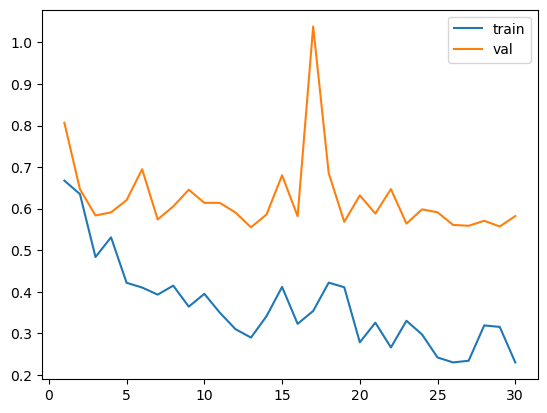

100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.6853333333333333, precision:0.6296296296296297, recall:0.136, f1:0.2236842105263158
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.58it/s]


accuracy:0.672, precision:0.5294117647058824, recall:0.144, f1:0.22641509433962262
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.6586666666666666, precision:0.46808510638297873, recall:0.176, f1:0.2558139534883721
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.648, precision:0.43137254901960786, recall:0.176, f1:0.25
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 114.97it/s]


accuracy:0.6186666666666667, precision:0.3548387096774194, recall:0.176, f1:0.2352941176470588
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 115.39it/s]


accuracy:0.608, precision:0.34285714285714286, recall:0.192, f1:0.24615384615384614
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6026666666666667, precision:0.3333333333333333, recall:0.192, f1:0.2436548223350254
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.12it/s]


accuracy:0.592, precision:0.3157894736842105, recall:0.192, f1:0.2388059701492537
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.5786666666666667, precision:0.30120481927710846, recall:0.2, f1:0.2403846153846154
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5786666666666667, precision:0.3146067415730337, recall:0.224, f1:0.26168224299065423
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.5706666666666667, precision:0.30434782608695654, recall:0.224, f1:0.25806451612903225
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.568, precision:0.3010752688172043, recall:0.224, f1:0.25688073394495414
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.23it/s]


accuracy:0.5626666666666666, precision:0.29473684210526313, recall:0.224, f1:0.2545454545454545
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5493333333333333, precision:0.28, recall:0.224, f1:0.24888888888888894
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5386666666666666, precision:0.27358490566037735, recall:0.232, f1:0.2510822510822511
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.5333333333333333, precision:0.26851851851851855, recall:0.232, f1:0.24892703862660945
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5306666666666666, precision:0.26605504587155965, recall:0.232, f1:0.24786324786324784
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.52, precision:0.25663716814159293, recall:0.232, f1:0.24369747899159663
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.512, precision:0.25, recall:0.232, f1:0.2406639004149378
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.5093333333333333, precision:0.24786324786324787, recall:0.232, f1:0.2396694214876033
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5013333333333333, precision:0.24166666666666667, recall:0.232, f1:0.23673469387755103
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.496, precision:0.23770491803278687, recall:0.232, f1:0.23481781376518218
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.49066666666666664, precision:0.23809523809523808, recall:0.24, f1:0.2390438247011952
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.48533333333333334, precision:0.23846153846153847, recall:0.248, f1:0.24313725490196078
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.48, precision:0.23484848484848486, recall:0.248, f1:0.24124513618677046
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 112.89it/s]


accuracy:0.4693333333333333, precision:0.22794117647058823, recall:0.248, f1:0.23754789272030655
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.4533333333333333, precision:0.21830985915492956, recall:0.248, f1:0.23220973782771534
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.44533333333333336, precision:0.21379310344827587, recall:0.248, f1:0.22962962962962966
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.63it/s]


accuracy:0.43733333333333335, precision:0.20945945945945946, recall:0.248, f1:0.22710622710622713
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.42933333333333334, precision:0.2052980132450331, recall:0.248, f1:0.2246376811594203
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.4266666666666667, precision:0.20394736842105263, recall:0.248, f1:0.22382671480144403
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.41333333333333333, precision:0.19745222929936307, recall:0.248, f1:0.21985815602836878
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.4053333333333333, precision:0.19753086419753085, recall:0.256, f1:0.2229965156794425
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.4053333333333333, precision:0.19753086419753085, recall:0.256, f1:0.2229965156794425
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.87it/s]


accuracy:0.4, precision:0.1951219512195122, recall:0.256, f1:0.22145328719723184
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.39466666666666667, precision:0.1927710843373494, recall:0.256, f1:0.21993127147766325
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.3973333333333333, precision:0.19760479041916168, recall:0.264, f1:0.22602739726027396
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.392, precision:0.1952662721893491, recall:0.264, f1:0.22448979591836735
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.61it/s]


accuracy:0.392, precision:0.1952662721893491, recall:0.264, f1:0.22448979591836735
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.3893333333333333, precision:0.20114942528735633, recall:0.28, f1:0.23411371237458195
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.3893333333333333, precision:0.20114942528735633, recall:0.28, f1:0.23411371237458195
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.38133333333333336, precision:0.1977401129943503, recall:0.28, f1:0.2317880794701987
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.38133333333333336, precision:0.1977401129943503, recall:0.28, f1:0.2317880794701987
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.37333333333333335, precision:0.19444444444444445, recall:0.28, f1:0.22950819672131148
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.37333333333333335, precision:0.19444444444444445, recall:0.28, f1:0.22950819672131148
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.37066666666666664, precision:0.19337016574585636, recall:0.28, f1:0.22875816993464054
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.3626666666666667, precision:0.19021739130434784, recall:0.28, f1:0.226537216828479
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.34933333333333333, precision:0.18848167539267016, recall:0.288, f1:0.22784810126582275
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.3466666666666667, precision:0.19072164948453607, recall:0.296, f1:0.23197492163009403
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


lr=0.001 and bc=8 results: [0.6853333333333333, 0.6296296296296297, 0.136, 0.2236842105263158]
Epoch 1/30, Train Loss: 0.6268030597913049, Val Loss: 0.7736759183830336
Epoch 2/30, Train Loss: 0.45184934126997467, Val Loss: 0.7333970267056046
Epoch 3/30, Train Loss: 0.4370690501834217, Val Loss: 0.591491979595862
Epoch 4/30, Train Loss: 0.3288171300664544, Val Loss: 0.5889184306326666
Epoch 5/30, Train Loss: 0.3009638676150261, Val Loss: 0.5536610759598645
Epoch 6/30, Train Loss: 0.3184769412649697, Val Loss: 0.536565234198382
Epoch 7/30, Train Loss: 0.2660472835291569, Val Loss: 0.5667193859423462
Epoch 8/30, Train Loss: 0.2701533203209309, Val Loss: 0.6163378916680813
Epoch 9/30, Train Loss: 0.25478365299242894, Val Loss: 0.5859541783207342
Epoch 10/30, Train Loss: 0.23959273379296064, Val Loss: 0.5943047741526052
Epoch 11/30, Train Loss: 0.45707323291878166, Val Loss: 0.5477546575038057
Epoch 12/30, Train Loss: 0.39841746590958027, Val Loss: 0.6881935639601005
Epoch 13/30, Train Loss

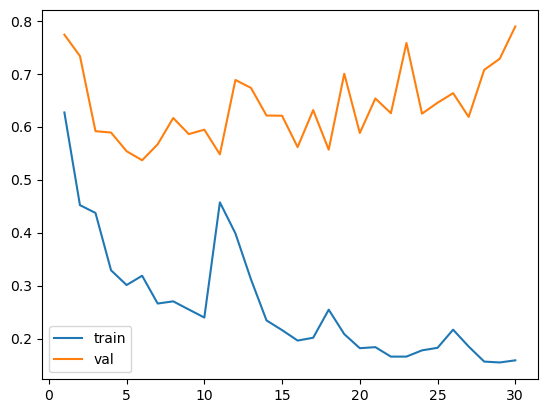

100%|██████████| 125/125 [00:01<00:00, 120.02it/s]


accuracy:0.688, precision:0.7857142857142857, recall:0.088, f1:0.15827338129496402
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.6773333333333333, precision:0.5909090909090909, recall:0.104, f1:0.17687074829931973
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.66it/s]


accuracy:0.6773333333333333, precision:0.5666666666666667, recall:0.136, f1:0.21935483870967742
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.6693333333333333, precision:0.5142857142857142, recall:0.144, f1:0.22499999999999998
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.672, precision:0.5263157894736842, recall:0.16, f1:0.24539877300613497
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.6693333333333333, precision:0.5111111111111111, recall:0.184, f1:0.27058823529411763
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.664, precision:0.48936170212765956, recall:0.184, f1:0.2674418604651163
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 115.93it/s]


accuracy:0.656, precision:0.46, recall:0.184, f1:0.26285714285714284
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.36it/s]


accuracy:0.6533333333333333, precision:0.4528301886792453, recall:0.192, f1:0.2696629213483146
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 107.92it/s]


accuracy:0.6453333333333333, precision:0.42857142857142855, recall:0.192, f1:0.26519337016574585
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.83it/s]


accuracy:0.6293333333333333, precision:0.3870967741935484, recall:0.192, f1:0.2566844919786096
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.60it/s]


accuracy:0.624, precision:0.3787878787878788, recall:0.2, f1:0.2617801047120419
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6133333333333333, precision:0.3611111111111111, recall:0.208, f1:0.2639593908629441
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.77it/s]


accuracy:0.6106666666666667, precision:0.36, recall:0.216, f1:0.27
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6, precision:0.34177215189873417, recall:0.216, f1:0.2647058823529412
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5946666666666667, precision:0.3333333333333333, recall:0.216, f1:0.2621359223300971
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.5866666666666667, precision:0.32142857142857145, recall:0.216, f1:0.2583732057416268
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.01it/s]


accuracy:0.584, precision:0.3176470588235294, recall:0.216, f1:0.2571428571428571
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.23it/s]


accuracy:0.5786666666666667, precision:0.3103448275862069, recall:0.216, f1:0.2547169811320754
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.5706666666666667, precision:0.3, recall:0.216, f1:0.2511627906976744
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.568, precision:0.2967032967032967, recall:0.216, f1:0.25
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.56, precision:0.2916666666666667, recall:0.224, f1:0.25339366515837103
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.5626666666666666, precision:0.29896907216494845, recall:0.232, f1:0.26126126126126126
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.56, precision:0.29591836734693877, recall:0.232, f1:0.26008968609865474
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5626666666666666, precision:0.30303030303030304, recall:0.24, f1:0.26785714285714285
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.552, precision:0.2912621359223301, recall:0.24, f1:0.2631578947368421
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5493333333333333, precision:0.28846153846153844, recall:0.24, f1:0.26200873362445415
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5413333333333333, precision:0.2803738317757009, recall:0.24, f1:0.2586206896551724
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5386666666666666, precision:0.2777777777777778, recall:0.24, f1:0.2575107296137339
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5386666666666666, precision:0.2777777777777778, recall:0.24, f1:0.2575107296137339
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5386666666666666, precision:0.2777777777777778, recall:0.24, f1:0.2575107296137339
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5306666666666666, precision:0.2702702702702703, recall:0.24, f1:0.2542372881355932
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.528, precision:0.26785714285714285, recall:0.24, f1:0.25316455696202533
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.528, precision:0.2719298245614035, recall:0.248, f1:0.25941422594142266
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.5253333333333333, precision:0.26956521739130435, recall:0.248, f1:0.2583333333333333
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.52, precision:0.26495726495726496, recall:0.248, f1:0.25619834710743805
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.5173333333333333, precision:0.2627118644067797, recall:0.248, f1:0.2551440329218107
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.13it/s]


accuracy:0.5093333333333333, precision:0.256198347107438, recall:0.248, f1:0.2520325203252032
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 112.38it/s]


accuracy:0.504, precision:0.25203252032520324, recall:0.248, f1:0.25
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.17it/s]


accuracy:0.49333333333333335, precision:0.2440944881889764, recall:0.248, f1:0.24603174603174605
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.49066666666666664, precision:0.2421875, recall:0.248, f1:0.2450592885375494
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.48533333333333334, precision:0.24242424242424243, recall:0.256, f1:0.2490272373540856
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.12it/s]


accuracy:0.48533333333333334, precision:0.25, recall:0.272, f1:0.260536398467433
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.14it/s]


accuracy:0.47733333333333333, precision:0.2446043165467626, recall:0.272, f1:0.25757575757575757
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.30it/s]


accuracy:0.4693333333333333, precision:0.23943661971830985, recall:0.272, f1:0.25468164794007486
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.4666666666666667, precision:0.23776223776223776, recall:0.272, f1:0.2537313432835821
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.464, precision:0.2361111111111111, recall:0.272, f1:0.2527881040892193
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.45866666666666667, precision:0.2328767123287671, recall:0.272, f1:0.25092250922509224
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.4533333333333333, precision:0.22972972972972974, recall:0.272, f1:0.24908424908424912
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


lr=0.0001 and bc=8 results: [0.688, 0.7857142857142857, 0.088, 0.15827338129496402]
Epoch 1/30, Train Loss: 0.7484653338477657, Val Loss: 0.8831598989258964
Epoch 2/30, Train Loss: 0.7361048870644529, Val Loss: 0.8440271227736957
Epoch 3/30, Train Loss: 0.6431602534537791, Val Loss: 0.7254576204638732
Epoch 4/30, Train Loss: 0.4552990886211199, Val Loss: 0.6082259473439894
Epoch 5/30, Train Loss: 0.38455483670297425, Val Loss: 0.5636431417967144
Epoch 6/30, Train Loss: 0.345030172875053, Val Loss: 0.5437666234609327
Epoch 7/30, Train Loss: 0.31044843709586484, Val Loss: 0.5441928062784044
Epoch 8/30, Train Loss: 0.294507362144558, Val Loss: 0.5841508160688376
Epoch 9/30, Train Loss: 0.2731487273581718, Val Loss: 0.5523438010560838
Epoch 10/30, Train Loss: 0.2558173045859133, Val Loss: 0.5431273326669869
Epoch 11/30, Train Loss: 0.2433077092282474, Val Loss: 0.5598907188365334
Epoch 12/30, Train Loss: 0.24454472963943294, Val Loss: 0.5687640258356145
Epoch 13/30, Train Loss: 0.230601216

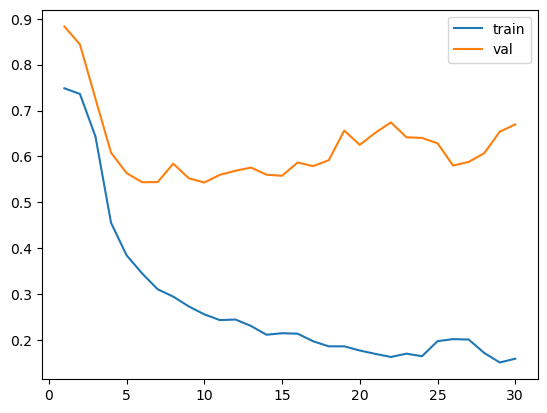

100%|██████████| 125/125 [00:01<00:00, 120.07it/s]


accuracy:0.6826666666666666, precision:0.65, recall:0.104, f1:0.17931034482758618
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.6773333333333333, precision:0.5769230769230769, recall:0.12, f1:0.1986754966887417
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.93it/s]


accuracy:0.6693333333333333, precision:0.5142857142857142, recall:0.144, f1:0.22499999999999998
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6586666666666666, precision:0.46511627906976744, recall:0.16, f1:0.2380952380952381
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.6506666666666666, precision:0.4423076923076923, recall:0.184, f1:0.2598870056497175
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.6426666666666667, precision:0.42105263157894735, recall:0.192, f1:0.2637362637362638
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6346666666666667, precision:0.4032258064516129, recall:0.2, f1:0.267379679144385
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.624, precision:0.3787878787878788, recall:0.2, f1:0.2617801047120419
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.6106666666666667, precision:0.352112676056338, recall:0.2, f1:0.2551020408163266
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.6, precision:0.3333333333333333, recall:0.2, f1:0.25
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.5973333333333334, precision:0.32894736842105265, recall:0.2, f1:0.2487562189054727
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.5946666666666667, precision:0.3246753246753247, recall:0.2, f1:0.24752475247524758
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.80it/s]


accuracy:0.592, precision:0.325, recall:0.208, f1:0.2536585365853658
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.92it/s]


accuracy:0.584, precision:0.3132530120481928, recall:0.208, f1:0.25
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5813333333333334, precision:0.30952380952380953, recall:0.208, f1:0.2488038277511962
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.5786666666666667, precision:0.31868131868131866, recall:0.232, f1:0.26851851851851855
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5733333333333334, precision:0.3118279569892473, recall:0.232, f1:0.26605504587155965
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5733333333333334, precision:0.3157894736842105, recall:0.24, f1:0.2727272727272727
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.568, precision:0.31313131313131315, recall:0.248, f1:0.2767857142857143
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.99it/s]


accuracy:0.5653333333333334, precision:0.31, recall:0.248, f1:0.27555555555555555
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.56, precision:0.30392156862745096, recall:0.248, f1:0.2731277533039647
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.69it/s]


accuracy:0.56, precision:0.30392156862745096, recall:0.248, f1:0.2731277533039647
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 115.72it/s]


accuracy:0.56, precision:0.30392156862745096, recall:0.248, f1:0.2731277533039647
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 115.61it/s]


accuracy:0.56, precision:0.30392156862745096, recall:0.248, f1:0.2731277533039647
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5546666666666666, precision:0.2980769230769231, recall:0.248, f1:0.2707423580786026
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5386666666666666, precision:0.2818181818181818, recall:0.248, f1:0.2638297872340426
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.5253333333333333, precision:0.26956521739130435, recall:0.248, f1:0.2583333333333333
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.5253333333333333, precision:0.27350427350427353, recall:0.256, f1:0.2644628099173554
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.63it/s]


accuracy:0.5146666666666667, precision:0.2644628099173554, recall:0.256, f1:0.2601626016260163
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.80it/s]


accuracy:0.5093333333333333, precision:0.2601626016260163, recall:0.256, f1:0.25806451612903225
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.80it/s]


accuracy:0.504, precision:0.256, recall:0.256, f1:0.256
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.73it/s]


accuracy:0.496, precision:0.25, recall:0.256, f1:0.25296442687747034
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.48533333333333334, precision:0.24242424242424243, recall:0.256, f1:0.2490272373540856
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.4826666666666667, precision:0.24444444444444444, recall:0.264, f1:0.25384615384615383
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.4826666666666667, precision:0.24444444444444444, recall:0.264, f1:0.25384615384615383
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.47733333333333333, precision:0.24087591240875914, recall:0.264, f1:0.2519083969465649
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.4666666666666667, precision:0.23404255319148937, recall:0.264, f1:0.24812030075187969
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.12it/s]


accuracy:0.4666666666666667, precision:0.23404255319148937, recall:0.264, f1:0.24812030075187969
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.464, precision:0.2323943661971831, recall:0.264, f1:0.24719101123595505
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.36it/s]


accuracy:0.464, precision:0.23972602739726026, recall:0.28, f1:0.25830258302583026
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.4613333333333333, precision:0.23809523809523808, recall:0.28, f1:0.25735294117647056
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.456, precision:0.23841059602649006, recall:0.288, f1:0.2608695652173913
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.4533333333333333, precision:0.23684210526315788, recall:0.288, f1:0.259927797833935
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.44533333333333336, precision:0.23225806451612904, recall:0.288, f1:0.2571428571428572
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.44, precision:0.22929936305732485, recall:0.288, f1:0.2553191489361702
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.69it/s]


accuracy:0.43733333333333335, precision:0.22784810126582278, recall:0.288, f1:0.2544169611307421
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.432, precision:0.225, recall:0.288, f1:0.25263157894736843
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.76it/s]


accuracy:0.42133333333333334, precision:0.21951219512195122, recall:0.288, f1:0.2491349480968858
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.41333333333333333, precision:0.2155688622754491, recall:0.288, f1:0.24657534246575344
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.77it/s]


lr=1e-05 and bc=8 results: [0.6826666666666666, 0.65, 0.104, 0.17931034482758618]
Epoch 1/30, Train Loss: 1.0072902923915534, Val Loss: 0.8206068336963653
Epoch 2/30, Train Loss: 0.5037990540266037, Val Loss: 0.7543921113014221
Epoch 3/30, Train Loss: 0.7123346671462059, Val Loss: 0.7015990197658539
Epoch 4/30, Train Loss: 0.6619210749864578, Val Loss: 0.7892333626747131
Epoch 5/30, Train Loss: 0.5289689660072326, Val Loss: 0.6776146233081818
Epoch 6/30, Train Loss: 0.4578137472271919, Val Loss: 0.5633161008358002
Epoch 7/30, Train Loss: 0.3522468417882919, Val Loss: 0.550334632396698
Epoch 8/30, Train Loss: 0.3796799421310425, Val Loss: 0.5837769895792008
Epoch 9/30, Train Loss: 0.3424225777387619, Val Loss: 0.6139039993286133
Epoch 10/30, Train Loss: 0.3689121946692467, Val Loss: 0.5791739046573638
Epoch 11/30, Train Loss: 0.3182643674314022, Val Loss: 0.6526249349117279
Epoch 12/30, Train Loss: 0.30130206439644097, Val Loss: 0.5889201164245605
Epoch 13/30, Train Loss: 0.262538015842

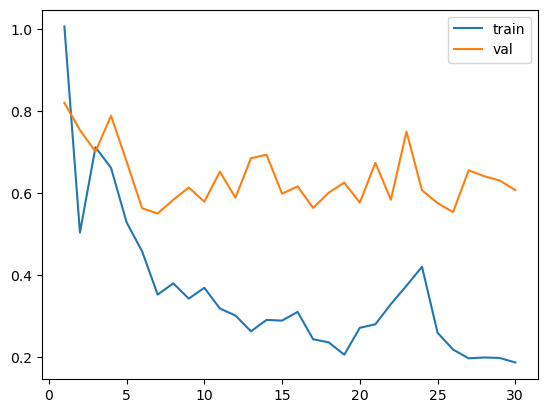

100%|██████████| 125/125 [00:01<00:00, 118.57it/s]


accuracy:0.6933333333333334, precision:0.75, recall:0.12, f1:0.20689655172413793
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.91it/s]


accuracy:0.6906666666666667, precision:0.6451612903225806, recall:0.16, f1:0.2564102564102564
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.68, precision:0.5675675675675675, recall:0.168, f1:0.25925925925925924
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.6746666666666666, precision:0.5365853658536586, recall:0.176, f1:0.26506024096385544
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.184, f1:0.2690058479532164
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6586666666666666, precision:0.4716981132075472, recall:0.2, f1:0.28089887640449435
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6373333333333333, precision:0.4098360655737705, recall:0.2, f1:0.2688172043010753
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.624, precision:0.38235294117647056, recall:0.208, f1:0.2694300518134715
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.616, precision:0.36619718309859156, recall:0.208, f1:0.2653061224489796
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.5946666666666667, precision:0.3291139240506329, recall:0.208, f1:0.2549019607843137
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5786666666666667, precision:0.3058823529411765, recall:0.208, f1:0.24761904761904763
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5653333333333334, precision:0.28888888888888886, recall:0.208, f1:0.24186046511627907
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.5573333333333333, precision:0.27956989247311825, recall:0.208, f1:0.23853211009174313
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.544, precision:0.2653061224489796, recall:0.208, f1:0.23318385650224213
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.536, precision:0.25742574257425743, recall:0.208, f1:0.23008849557522126
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.84it/s]


accuracy:0.5253333333333333, precision:0.24761904761904763, recall:0.208, f1:0.22608695652173916
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.86it/s]


accuracy:0.5253333333333333, precision:0.24761904761904763, recall:0.208, f1:0.22608695652173916
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5093333333333333, precision:0.23423423423423423, recall:0.208, f1:0.22033898305084743
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5013333333333333, precision:0.22807017543859648, recall:0.208, f1:0.21757322175732216
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.49333333333333335, precision:0.226890756302521, recall:0.216, f1:0.22131147540983606
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 109.24it/s]


accuracy:0.48533333333333334, precision:0.22131147540983606, recall:0.216, f1:0.21862348178137653
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.58it/s]


accuracy:0.4746666666666667, precision:0.21428571428571427, recall:0.216, f1:0.2151394422310757
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.01it/s]


accuracy:0.4693333333333333, precision:0.2109375, recall:0.216, f1:0.21343873517786563
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.464, precision:0.2076923076923077, recall:0.216, f1:0.21176470588235297
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.4613333333333333, precision:0.21052631578947367, recall:0.224, f1:0.2170542635658915
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.12it/s]


accuracy:0.4613333333333333, precision:0.21481481481481482, recall:0.232, f1:0.2230769230769231
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.45866666666666667, precision:0.21739130434782608, recall:0.24, f1:0.22813688212927757
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.23it/s]


accuracy:0.456, precision:0.2158273381294964, recall:0.24, f1:0.22727272727272727
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.69it/s]


accuracy:0.4533333333333333, precision:0.21428571428571427, recall:0.24, f1:0.2264150943396226
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.23it/s]


accuracy:0.448, precision:0.2112676056338028, recall:0.24, f1:0.2247191011235955
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.44266666666666665, precision:0.20833333333333334, recall:0.24, f1:0.22304832713754646
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.4266666666666667, precision:0.2, recall:0.24, f1:0.2181818181818182
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.41333333333333333, precision:0.1935483870967742, recall:0.24, f1:0.21428571428571427
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.4, precision:0.1875, recall:0.24, f1:0.21052631578947367
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.392, precision:0.18404907975460122, recall:0.24, f1:0.20833333333333331
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.3893333333333333, precision:0.18292682926829268, recall:0.24, f1:0.20761245674740483
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.384, precision:0.18452380952380953, recall:0.248, f1:0.21160409556313994
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.57it/s]


accuracy:0.38133333333333336, precision:0.1834319526627219, recall:0.248, f1:0.2108843537414966
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.37866666666666665, precision:0.18235294117647058, recall:0.248, f1:0.21016949152542372
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.36533333333333334, precision:0.17714285714285713, recall:0.248, f1:0.20666666666666664
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.36, precision:0.1751412429378531, recall:0.248, f1:0.2052980132450331
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.41it/s]


accuracy:0.352, precision:0.17222222222222222, recall:0.248, f1:0.20327868852459016
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.53it/s]


accuracy:0.352, precision:0.17222222222222222, recall:0.248, f1:0.20327868852459016
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.88it/s]


accuracy:0.34933333333333333, precision:0.1712707182320442, recall:0.248, f1:0.20261437908496732
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.344, precision:0.16939890710382513, recall:0.248, f1:0.2012987012987013
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.33866666666666667, precision:0.16756756756756758, recall:0.248, f1:0.2
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.33066666666666666, precision:0.16489361702127658, recall:0.248, f1:0.19808306709265175
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.328, precision:0.164021164021164, recall:0.248, f1:0.19745222929936304
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.32, precision:0.16145833333333334, recall:0.248, f1:0.19558359621451105
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.67it/s]


lr=0.001 and bc=32 results: [0.6933333333333334, 0.75, 0.12, 0.20689655172413793]
Epoch 1/30, Train Loss: 0.6854823164641857, Val Loss: 0.7941343188285828
Epoch 2/30, Train Loss: 0.5035336673259735, Val Loss: 0.5939066767692566
Epoch 3/30, Train Loss: 0.43258083909749984, Val Loss: 0.5720819056034088
Epoch 4/30, Train Loss: 0.3612529575824738, Val Loss: 0.5519081830978394
Epoch 5/30, Train Loss: 0.33882770985364913, Val Loss: 0.5526297450065613
Epoch 6/30, Train Loss: 0.3199055105447769, Val Loss: 0.5447726428508759
Epoch 7/30, Train Loss: 0.2780794225633144, Val Loss: 0.5675878286361694
Epoch 8/30, Train Loss: 0.264104288443923, Val Loss: 0.5295618593692779
Epoch 9/30, Train Loss: 0.22959506660699844, Val Loss: 0.5675834953784943
Epoch 10/30, Train Loss: 0.2203853875398636, Val Loss: 0.5700449824333191
Epoch 11/30, Train Loss: 0.22233662344515323, Val Loss: 0.5540303826332093
Epoch 12/30, Train Loss: 0.3805822156369686, Val Loss: 0.6011694371700287
Epoch 13/30, Train Loss: 0.315530461

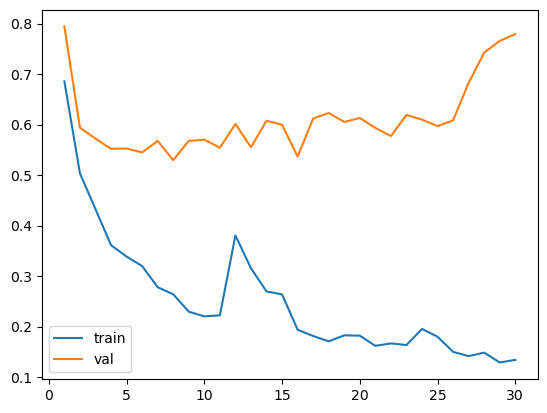

100%|██████████| 125/125 [00:01<00:00, 119.82it/s]


accuracy:0.6853333333333333, precision:0.7058823529411765, recall:0.096, f1:0.16901408450704228
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.68, precision:0.6190476190476191, recall:0.104, f1:0.17808219178082194
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.68, precision:0.5925925925925926, recall:0.128, f1:0.2105263157894737
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.6746666666666666, precision:0.5483870967741935, recall:0.136, f1:0.21794871794871795
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.6693333333333333, precision:0.5121951219512195, recall:0.168, f1:0.25301204819277107
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.6613333333333333, precision:0.4772727272727273, recall:0.168, f1:0.2485207100591716
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.6506666666666666, precision:0.4423076923076923, recall:0.184, f1:0.2598870056497175
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.6506666666666666, precision:0.4423076923076923, recall:0.184, f1:0.2598870056497175
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.64, precision:0.4107142857142857, recall:0.184, f1:0.25414364640883974
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.6346666666666667, precision:0.39655172413793105, recall:0.184, f1:0.25136612021857924
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.71it/s]


accuracy:0.6213333333333333, precision:0.36507936507936506, recall:0.184, f1:0.24468085106382975
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.94it/s]


accuracy:0.6133333333333333, precision:0.3484848484848485, recall:0.184, f1:0.2408376963350785
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5973333333333334, precision:0.32432432432432434, recall:0.192, f1:0.2412060301507538
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.592, precision:0.32051282051282054, recall:0.2, f1:0.24630541871921183
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.25it/s]


accuracy:0.5893333333333334, precision:0.3253012048192771, recall:0.216, f1:0.2596153846153846
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.576, precision:0.3068181818181818, recall:0.216, f1:0.2535211267605634
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5706666666666667, precision:0.3, recall:0.216, f1:0.2511627906976744
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5706666666666667, precision:0.3, recall:0.216, f1:0.2511627906976744
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.80it/s]


accuracy:0.568, precision:0.2967032967032967, recall:0.216, f1:0.25
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 111.98it/s]


accuracy:0.56, precision:0.2872340425531915, recall:0.216, f1:0.24657534246575344
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.56, precision:0.2872340425531915, recall:0.216, f1:0.24657534246575344
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.552, precision:0.27835051546391754, recall:0.216, f1:0.24324324324324326
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5493333333333333, precision:0.2755102040816326, recall:0.216, f1:0.242152466367713
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.5466666666666666, precision:0.2727272727272727, recall:0.216, f1:0.24107142857142858
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5413333333333333, precision:0.26732673267326734, recall:0.216, f1:0.23893805309734514
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5333333333333333, precision:0.25961538461538464, recall:0.216, f1:0.23580786026200873
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.528, precision:0.25471698113207547, recall:0.216, f1:0.23376623376623376
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5253333333333333, precision:0.2523364485981308, recall:0.216, f1:0.23275862068965514
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.69it/s]


accuracy:0.5226666666666666, precision:0.25, recall:0.216, f1:0.23175965665236054
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.52, precision:0.24770642201834864, recall:0.216, f1:0.23076923076923075
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5226666666666666, precision:0.2545454545454545, recall:0.224, f1:0.23829787234042554
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.5173333333333333, precision:0.25, recall:0.224, f1:0.23628691983122366
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.512, precision:0.24561403508771928, recall:0.224, f1:0.23430962343096234
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.5093333333333333, precision:0.24347826086956523, recall:0.224, f1:0.23333333333333334
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.5093333333333333, precision:0.24786324786324787, recall:0.232, f1:0.2396694214876033
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.5013333333333333, precision:0.24166666666666667, recall:0.232, f1:0.23673469387755103
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.504, precision:0.24793388429752067, recall:0.24, f1:0.24390243902439024
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.5013333333333333, precision:0.2459016393442623, recall:0.24, f1:0.242914979757085
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.49866666666666665, precision:0.248, recall:0.248, f1:0.248
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.49066666666666664, precision:0.2421875, recall:0.248, f1:0.2450592885375494
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.488, precision:0.24031007751937986, recall:0.248, f1:0.2440944881889764
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.488, precision:0.24031007751937986, recall:0.248, f1:0.2440944881889764
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.48533333333333334, precision:0.23846153846153847, recall:0.248, f1:0.24313725490196078
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.98it/s]


accuracy:0.4826666666666667, precision:0.2366412213740458, recall:0.248, f1:0.2421875
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.94it/s]


accuracy:0.4746666666666667, precision:0.23134328358208955, recall:0.248, f1:0.23938223938223938
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.4746666666666667, precision:0.23134328358208955, recall:0.248, f1:0.23938223938223938
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


accuracy:0.472, precision:0.22962962962962963, recall:0.248, f1:0.23846153846153847
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.59it/s]


accuracy:0.4666666666666667, precision:0.22627737226277372, recall:0.248, f1:0.2366412213740458
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 114.97it/s]


accuracy:0.464, precision:0.2246376811594203, recall:0.248, f1:0.23574144486692014
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


lr=0.0001 and bc=32 results: [0.6853333333333333, 0.7058823529411765, 0.096, 0.16901408450704228]
Epoch 1/30, Train Loss: 0.7411410957574844, Val Loss: 0.8697807669639588
Epoch 2/30, Train Loss: 0.7399859875440598, Val Loss: 0.8915996074676513
Epoch 3/30, Train Loss: 0.7173245325684547, Val Loss: 0.8445356667041779
Epoch 4/30, Train Loss: 0.7351102113723755, Val Loss: 0.8869440019130707
Epoch 5/30, Train Loss: 0.6898308029070904, Val Loss: 0.8593503832817078
Epoch 6/30, Train Loss: 0.681401913931768, Val Loss: 0.8830952942371368
Epoch 7/30, Train Loss: 0.723866218328476, Val Loss: 0.8292525768280029
Epoch 8/30, Train Loss: 0.6871344298124313, Val Loss: 0.8097147017717361
Epoch 9/30, Train Loss: 0.623063862323761, Val Loss: 0.7244636952877045
Epoch 10/30, Train Loss: 0.5284178674221038, Val Loss: 0.6380335092544556
Epoch 11/30, Train Loss: 0.4655610308051109, Val Loss: 0.5730130553245545
Epoch 12/30, Train Loss: 0.40335696935653687, Val Loss: 0.5872517824172974
Epoch 13/30, Train Loss: 

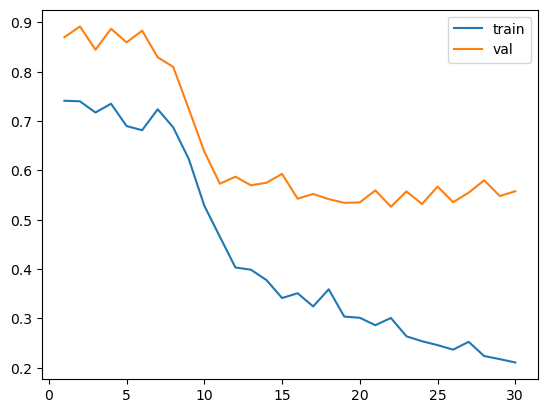

100%|██████████| 125/125 [00:01<00:00, 120.98it/s]


accuracy:0.6986666666666667, precision:0.7727272727272727, recall:0.136, f1:0.23129251700680273
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.6853333333333333, precision:0.6060606060606061, recall:0.16, f1:0.2531645569620253
Current threshold:0.03, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.672, precision:0.525, recall:0.168, f1:0.2545454545454546
Current threshold:0.04, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.6506666666666666, precision:0.44, recall:0.176, f1:0.2514285714285714
Current threshold:0.05, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.6453333333333333, precision:0.43333333333333335, recall:0.208, f1:0.2810810810810811
Current threshold:0.060000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.6373333333333333, precision:0.42028985507246375, recall:0.232, f1:0.29896907216494845
Current threshold:0.07, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.632, precision:0.410958904109589, recall:0.24, f1:0.30303030303030304
Current threshold:0.08, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.616, precision:0.3855421686746988, recall:0.256, f1:0.3076923076923077
Current threshold:0.09, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.6026666666666667, precision:0.36363636363636365, recall:0.256, f1:0.3004694835680751
Current threshold:0.09999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.5893333333333334, precision:0.34408602150537637, recall:0.256, f1:0.29357798165137616
Current threshold:0.10999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.5706666666666667, precision:0.32, recall:0.256, f1:0.28444444444444444
Current threshold:0.11999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.5546666666666666, precision:0.3055555555555556, recall:0.264, f1:0.2832618025751073
Current threshold:0.12999999999999998, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 111.89it/s]


accuracy:0.5546666666666666, precision:0.3090909090909091, recall:0.272, f1:0.28936170212765955
Current threshold:0.13999999999999999, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.91it/s]


accuracy:0.544, precision:0.3050847457627119, recall:0.288, f1:0.29629629629629634
Current threshold:0.15, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.77it/s]


accuracy:0.5226666666666666, precision:0.2857142857142857, recall:0.288, f1:0.2868525896414343
Current threshold:0.16, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 112.93it/s]


accuracy:0.5093333333333333, precision:0.2748091603053435, recall:0.288, f1:0.28124999999999994
Current threshold:0.17, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.45it/s]


accuracy:0.496, precision:0.2647058823529412, recall:0.288, f1:0.27586206896551724
Current threshold:0.18000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.91it/s]


accuracy:0.48533333333333334, precision:0.2605633802816901, recall:0.296, f1:0.27715355805243447
Current threshold:0.19000000000000003, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 115.82it/s]


accuracy:0.48, precision:0.2602739726027397, recall:0.304, f1:0.2804428044280443
Current threshold:0.20000000000000004, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.472, precision:0.2550335570469799, recall:0.304, f1:0.2773722627737227
Current threshold:0.21000000000000005, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.472, precision:0.2550335570469799, recall:0.304, f1:0.2773722627737227
Current threshold:0.22000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.464, precision:0.25, recall:0.304, f1:0.27436823104693137
Current threshold:0.23000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.4533333333333333, precision:0.24358974358974358, recall:0.304, f1:0.2704626334519573
Current threshold:0.24000000000000007, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.44, precision:0.2360248447204969, recall:0.304, f1:0.2657342657342657
Current threshold:0.25000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.43466666666666665, precision:0.2331288343558282, recall:0.304, f1:0.26388888888888884
Current threshold:0.26000000000000006, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.42933333333333334, precision:0.23030303030303031, recall:0.304, f1:0.2620689655172414
Current threshold:0.2700000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.42133333333333334, precision:0.2261904761904762, recall:0.304, f1:0.2593856655290102
Current threshold:0.2800000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.42133333333333334, precision:0.2261904761904762, recall:0.304, f1:0.2593856655290102
Current threshold:0.2900000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.4186666666666667, precision:0.22807017543859648, recall:0.312, f1:0.2635135135135135
Current threshold:0.3000000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.4, precision:0.21910112359550563, recall:0.312, f1:0.25742574257425743
Current threshold:0.3100000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.34it/s]


accuracy:0.4, precision:0.21910112359550563, recall:0.312, f1:0.25742574257425743
Current threshold:0.3200000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.3893333333333333, precision:0.21428571428571427, recall:0.312, f1:0.254071661237785
Current threshold:0.3300000000000001, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.384, precision:0.21195652173913043, recall:0.312, f1:0.2524271844660194
Current threshold:0.34000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.79it/s]


accuracy:0.37866666666666665, precision:0.20967741935483872, recall:0.312, f1:0.25080385852090037
Current threshold:0.35000000000000014, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.34it/s]


accuracy:0.37066666666666664, precision:0.20634920634920634, recall:0.312, f1:0.24840764331210188
Current threshold:0.36000000000000015, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.3626666666666667, precision:0.203125, recall:0.312, f1:0.24605678233438483
Current threshold:0.37000000000000016, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.36, precision:0.20207253886010362, recall:0.312, f1:0.2452830188679245
Current threshold:0.38000000000000017, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


accuracy:0.36, precision:0.20207253886010362, recall:0.312, f1:0.2452830188679245
Current threshold:0.3900000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.55it/s]


accuracy:0.344, precision:0.19597989949748743, recall:0.312, f1:0.2407407407407407
Current threshold:0.4000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.78it/s]


accuracy:0.3413333333333333, precision:0.195, recall:0.312, f1:0.24000000000000002
Current threshold:0.4100000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.19it/s]


accuracy:0.33066666666666666, precision:0.19117647058823528, recall:0.312, f1:0.23708206686930086
Current threshold:0.4200000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.98it/s]


accuracy:0.3253333333333333, precision:0.18932038834951456, recall:0.312, f1:0.2356495468277946
Current threshold:0.4300000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.96it/s]


accuracy:0.3253333333333333, precision:0.18932038834951456, recall:0.312, f1:0.2356495468277946
Current threshold:0.4400000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]


accuracy:0.32266666666666666, precision:0.18840579710144928, recall:0.312, f1:0.23493975903614459
Current threshold:0.45000000000000023, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.12it/s]


accuracy:0.32, precision:0.1875, recall:0.312, f1:0.23423423423423423
Current threshold:0.46000000000000024, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


accuracy:0.31733333333333336, precision:0.18660287081339713, recall:0.312, f1:0.23353293413173654
Current threshold:0.47000000000000025, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 116.14it/s]


accuracy:0.31466666666666665, precision:0.18571428571428572, recall:0.312, f1:0.23283582089552238
Current threshold:0.48000000000000026, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 114.97it/s]


accuracy:0.304, precision:0.1822429906542056, recall:0.312, f1:0.23008849557522124
Current threshold:0.49000000000000027, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


accuracy:0.30133333333333334, precision:0.18433179723502305, recall:0.32, f1:0.23391812865497075
Current threshold:0.5000000000000002, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 117.90it/s]

lr=1e-05 and bc=32 results: [0.6986666666666667, 0.7727272727272727, 0.136, 0.23129251700680273]


In [ ]:
alex_tune_results = gridsearch_alexnet(train_siamese_dataset, val_siamese_dataset, num_epochs=30, learning_rates=lr, batch_sizes=bc)

In [ ]:
alex_tune_results

{'lr=0.001 and bc=8': [0.6853333333333333,
  0.6296296296296297,
  0.136,
  0.2236842105263158],
 'lr=0.0001 and bc=8': [0.688, 0.7857142857142857, 0.088, 0.15827338129496402],
 'lr=1e-05 and bc=8': [0.6826666666666666, 0.65, 0.104, 0.17931034482758618],
 'lr=0.001 and bc=32': [0.6933333333333334, 0.75, 0.12, 0.20689655172413793],
 'lr=0.0001 and bc=32': [0.6853333333333333,
  0.7058823529411765,
  0.096,
  0.16901408450704228],
 'lr=1e-05 and bc=32': [0.6986666666666667,
  0.7727272727272727,
  0.136,
  0.23129251700680273]}

In [ ]:
def gridsearch_resnet(train_siamese_dataset, val_siamese_dataset, num_epochs=30, learning_rates=[0.001], batch_sizes=[8]):
    params_results = {}

    for bc in batch_sizes:
        for lr in learning_rates:

            train_dataloader_tune = DataLoader(train_siamese_dataset,
                        shuffle=True,
                        batch_size=bc)

            val_dataloader_tune = DataLoader(val_siamese_dataset,
                                    shuffle=True,
                                    batch_size=bc)

            model = SiameseResNet()
            train_siamese_network(model, train_dataloader_tune, val_dataloader_tune, num_epochs=30, learning_rate=lr)
            optimized_threshold, acc, f1 = find_optimized_threshold(model, test_dataloader, max_threshold=0.5)

            accuracy, precision, recall, f1 = evaluate_model_return(model, test_dataloader, threshold=optimized_threshold)
            lr_bc_key = f"lr={lr} and bc={bc}"
            params_results[lr_bc_key] = [accuracy, precision, recall, f1]
            print(lr_bc_key, "results:", [accuracy, precision, recall, f1])

    return params_results

## 6.3 Triplet tune - Vanilla  <a class="anchor" id="section_6_3"></a>

In [ ]:
def gridsearch_siamese_triplet(train_siamese_triplet_dataset, val_siamese_triplet_dataset, num_epochs=30, learning_rates=[0.001], batch_sizes=[8]):
    params_results = {}

    for bc in batch_sizes:
        for lr in learning_rates:

            train_dataloader_tune = DataLoader(train_siamese_triplet_dataset,
                        shuffle=True,
                        batch_size=bc)

            val_dataloader_tune = DataLoader(val_siamese_triplet_dataset,
                                    shuffle=True,
                                    batch_size=bc)

            model = SiameseNetwork()
            train_siamese_network(model, train_dataloader_tune, val_dataloader_tune, num_epochs=30, learning_rate=lr, loss_function="triplet")
            optimized_threshold, acc, f1 = find_optimized_threshold(model, test_dataloader, max_threshold=1.5)

            accuracy, precision, recall, f1 = evaluate_model_return(model, test_dataloader, threshold=optimized_threshold)
            lr_bc_key = f"lr={lr} and bc={bc}"
            params_results[lr_bc_key] = [accuracy, precision, recall, f1]
            print(lr_bc_key, "results:", [accuracy, precision, recall, f1])

    return params_results

Epoch 1/30, Train Loss: 0.6401101556655607, Val Loss: 0.2713161942205931
Epoch 2/30, Train Loss: 0.36081256619409513, Val Loss: 0.3347515734402757
Epoch 3/30, Train Loss: 0.1876011557484928, Val Loss: 0.2152891982542841
Epoch 4/30, Train Loss: 0.1089357837642494, Val Loss: 0.25036791202269104
Epoch 5/30, Train Loss: 0.24300434205092883, Val Loss: 0.6127974689006805
Epoch 6/30, Train Loss: 0.20634541307625018, Val Loss: 0.2435499621849311
Epoch 7/30, Train Loss: 0.25484559096788106, Val Loss: 0.4799129562942605
Epoch 8/30, Train Loss: 0.40053501999691915, Val Loss: 0.4312503063365033
Epoch 9/30, Train Loss: 0.1770923812138407, Val Loss: 0.17793183773756027
Epoch 10/30, Train Loss: 0.10847978686031542, Val Loss: 0.21826971949715362
Epoch 11/30, Train Loss: 0.15124405332301794, Val Loss: 0.5794194328941797
Epoch 12/30, Train Loss: 0.28940711582177564, Val Loss: 0.41934809951405777
Epoch 13/30, Train Loss: 0.15143084035892235, Val Loss: 0.2504317752624813
Epoch 14/30, Train Loss: 0.1265447

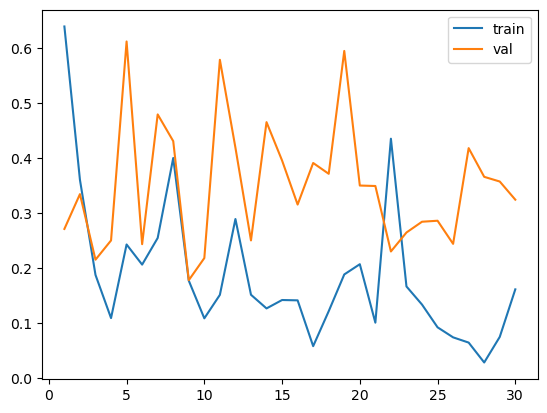

100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.6933333333333334, precision:1.0, recall:0.08, f1:0.14814814814814814
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7093333333333334, precision:1.0, recall:0.128, f1:0.22695035460992907
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7093333333333334, precision:1.0, recall:0.128, f1:0.22695035460992907
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7093333333333334, precision:0.9444444444444444, recall:0.136, f1:0.2377622377622378
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.712, precision:0.9473684210526315, recall:0.144, f1:0.25
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7066666666666667, precision:0.8571428571428571, recall:0.144, f1:0.2465753424657534
Current threshold:0.09, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7093333333333334, precision:0.8636363636363636, recall:0.152, f1:0.25850340136054417
Current threshold:0.09999999999999999, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7093333333333334, precision:0.8333333333333334, recall:0.16, f1:0.2684563758389262
Current threshold:0.10999999999999999, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7093333333333334, precision:0.8333333333333334, recall:0.16, f1:0.2684563758389262
Current threshold:0.11999999999999998, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.712, precision:0.84, recall:0.168, f1:0.27999999999999997
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.712, precision:0.84, recall:0.168, f1:0.27999999999999997
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.712, precision:0.8148148148148148, recall:0.176, f1:0.2894736842105263
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7146666666666667, precision:0.8214285714285714, recall:0.184, f1:0.3006535947712418
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.72, precision:0.8333333333333334, recall:0.2, f1:0.3225806451612903
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7253333333333334, precision:0.84375, recall:0.216, f1:0.34394904458598724
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.728, precision:0.8484848484848485, recall:0.224, f1:0.35443037974683544
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.8484848484848485, recall:0.224, f1:0.35443037974683544
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.8484848484848485, recall:0.224, f1:0.35443037974683544
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.3300000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 221.97it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.34000000000000014, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 216.96it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.35000000000000014, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.36000000000000015, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7333333333333333, precision:0.8205128205128205, recall:0.256, f1:0.3902439024390244
Current threshold:0.37000000000000016, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.736, precision:0.825, recall:0.264, f1:0.4
Current threshold:0.38000000000000017, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7386666666666667, precision:0.8292682926829268, recall:0.272, f1:0.40963855421686746
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7413333333333333, precision:0.8333333333333334, recall:0.28, f1:0.41916167664670667
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7413333333333333, precision:0.8333333333333334, recall:0.28, f1:0.41916167664670667
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.744, precision:0.8085106382978723, recall:0.304, f1:0.4418604651162791
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.8085106382978723, recall:0.304, f1:0.4418604651162791
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7466666666666667, precision:0.8125, recall:0.312, f1:0.4508670520231214
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7466666666666667, precision:0.8125, recall:0.312, f1:0.4508670520231214
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7466666666666667, precision:0.8125, recall:0.312, f1:0.4508670520231214
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.5000000000000002, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.5100000000000002, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.5200000000000002, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7466666666666667, precision:0.7884615384615384, recall:0.328, f1:0.46327683615819215
Current threshold:0.5700000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7466666666666667, precision:0.7884615384615384, recall:0.328, f1:0.46327683615819215
Current threshold:0.5800000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.7735849056603774, recall:0.328, f1:0.46067415730337075
Current threshold:0.5900000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.744, precision:0.7735849056603774, recall:0.328, f1:0.46067415730337075
Current threshold:0.6000000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.7735849056603774, recall:0.328, f1:0.46067415730337075
Current threshold:0.6100000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7413333333333333, precision:0.7592592592592593, recall:0.328, f1:0.4581005586592179
Current threshold:0.6200000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.7592592592592593, recall:0.328, f1:0.4581005586592179
Current threshold:0.6300000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7413333333333333, precision:0.7592592592592593, recall:0.328, f1:0.4581005586592179
Current threshold:0.6400000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.744, precision:0.7636363636363637, recall:0.336, f1:0.4666666666666666
Current threshold:0.6500000000000004, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.7636363636363637, recall:0.336, f1:0.4666666666666666
Current threshold:0.6600000000000004, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7466666666666667, precision:0.7678571428571429, recall:0.344, f1:0.4751381215469613
Current threshold:0.6700000000000004, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7466666666666667, precision:0.7678571428571429, recall:0.344, f1:0.4751381215469613
Current threshold:0.6800000000000004, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:0.7000000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:0.7100000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:0.7200000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:0.7300000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:0.7400000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7413333333333333, precision:0.7333333333333333, recall:0.352, f1:0.4756756756756757
Current threshold:0.7500000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7413333333333333, precision:0.7333333333333333, recall:0.352, f1:0.4756756756756757
Current threshold:0.7600000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:0.7700000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:0.7800000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:0.7900000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:0.8000000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.736, precision:0.7096774193548387, recall:0.352, f1:0.4705882352941176
Current threshold:0.8100000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7333333333333333, precision:0.6984126984126984, recall:0.352, f1:0.4680851063829786
Current threshold:0.8200000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.736, precision:0.703125, recall:0.36, f1:0.4761904761904762
Current threshold:0.8300000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7413333333333333, precision:0.7121212121212122, recall:0.376, f1:0.49214659685863865
Current threshold:0.8400000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7413333333333333, precision:0.7121212121212122, recall:0.376, f1:0.49214659685863865
Current threshold:0.8500000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.744, precision:0.7164179104477612, recall:0.384, f1:0.5
Current threshold:0.8600000000000005, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7466666666666667, precision:0.7205882352941176, recall:0.392, f1:0.5077720207253886
Current threshold:0.8700000000000006, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7466666666666667, precision:0.7205882352941176, recall:0.392, f1:0.5077720207253886
Current threshold:0.8800000000000006, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7466666666666667, precision:0.7142857142857143, recall:0.4, f1:0.5128205128205129
Current threshold:0.8900000000000006, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7493333333333333, precision:0.7183098591549296, recall:0.408, f1:0.520408163265306
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 207.25it/s]


accuracy:0.7493333333333333, precision:0.7183098591549296, recall:0.408, f1:0.520408163265306
Current threshold:0.9100000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:00<00:00, 221.58it/s]


accuracy:0.752, precision:0.7222222222222222, recall:0.416, f1:0.5279187817258882
Current threshold:0.9200000000000006, Best threshold:0.9100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7546666666666667, precision:0.726027397260274, recall:0.424, f1:0.5353535353535354
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7573333333333333, precision:0.7297297297297297, recall:0.432, f1:0.5427135678391959
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7573333333333333, precision:0.7297297297297297, recall:0.432, f1:0.5427135678391959
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7573333333333333, precision:0.7297297297297297, recall:0.432, f1:0.5427135678391959
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.76, precision:0.7333333333333333, recall:0.44, f1:0.5499999999999999
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.76, precision:0.7333333333333333, recall:0.44, f1:0.5499999999999999
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7573333333333333, precision:0.7236842105263158, recall:0.44, f1:0.5472636815920398
Current threshold:0.9900000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7573333333333333, precision:0.7236842105263158, recall:0.44, f1:0.5472636815920398
Current threshold:1.0000000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7546666666666667, precision:0.7142857142857143, recall:0.44, f1:0.5445544554455445
Current threshold:1.0100000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7546666666666667, precision:0.7142857142857143, recall:0.44, f1:0.5445544554455445
Current threshold:1.0200000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7546666666666667, precision:0.7142857142857143, recall:0.44, f1:0.5445544554455445
Current threshold:1.0300000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7573333333333333, precision:0.717948717948718, recall:0.448, f1:0.5517241379310345
Current threshold:1.0400000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7573333333333333, precision:0.7125, recall:0.456, f1:0.5560975609756097
Current threshold:1.0500000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 221.58it/s]


accuracy:0.7546666666666667, precision:0.7037037037037037, recall:0.456, f1:0.5533980582524272
Current threshold:1.0600000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 223.16it/s]


accuracy:0.7546666666666667, precision:0.7037037037037037, recall:0.456, f1:0.5533980582524272
Current threshold:1.0700000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.752, precision:0.6951219512195121, recall:0.456, f1:0.5507246376811594
Current threshold:1.0800000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7466666666666667, precision:0.6785714285714286, recall:0.456, f1:0.5454545454545455
Current threshold:1.0900000000000007, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7493333333333333, precision:0.6823529411764706, recall:0.464, f1:0.5523809523809524
Current threshold:1.1000000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7466666666666667, precision:0.6744186046511628, recall:0.464, f1:0.5497630331753555
Current threshold:1.1100000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7493333333333333, precision:0.6781609195402298, recall:0.472, f1:0.5566037735849056
Current threshold:1.1200000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7493333333333333, precision:0.6781609195402298, recall:0.472, f1:0.5566037735849056
Current threshold:1.1300000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7493333333333333, precision:0.6781609195402298, recall:0.472, f1:0.5566037735849056
Current threshold:1.1400000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7466666666666667, precision:0.6704545454545454, recall:0.472, f1:0.5539906103286385
Current threshold:1.1500000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7466666666666667, precision:0.6704545454545454, recall:0.472, f1:0.5539906103286385
Current threshold:1.1600000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.1700000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.1800000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.1900000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.2000000000000008, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.2100000000000009, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.2200000000000009, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.2300000000000009, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.2400000000000009, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.2500000000000009, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.260000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.270000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.280000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.290000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.6629213483146067, recall:0.472, f1:0.5514018691588783
Current threshold:1.300000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7466666666666667, precision:0.6666666666666666, recall:0.48, f1:0.5581395348837209
Current threshold:1.310000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7466666666666667, precision:0.6666666666666666, recall:0.48, f1:0.5581395348837209
Current threshold:1.320000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7466666666666667, precision:0.6666666666666666, recall:0.48, f1:0.5581395348837209
Current threshold:1.330000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7466666666666667, precision:0.6666666666666666, recall:0.48, f1:0.5581395348837209
Current threshold:1.340000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7466666666666667, precision:0.6666666666666666, recall:0.48, f1:0.5581395348837209
Current threshold:1.350000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7466666666666667, precision:0.6666666666666666, recall:0.48, f1:0.5581395348837209
Current threshold:1.360000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.744, precision:0.6593406593406593, recall:0.48, f1:0.5555555555555556
Current threshold:1.370000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7493333333333333, precision:0.6666666666666666, recall:0.496, f1:0.5688073394495413
Current threshold:1.380000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7466666666666667, precision:0.6595744680851063, recall:0.496, f1:0.5662100456621004
Current threshold:1.390000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7493333333333333, precision:0.6597938144329897, recall:0.512, f1:0.5765765765765766
Current threshold:1.400000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7493333333333333, precision:0.6597938144329897, recall:0.512, f1:0.5765765765765766
Current threshold:1.410000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.420000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.430000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.440000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.450000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.460000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 207.25it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.470000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 219.63it/s]


accuracy:0.7546666666666667, precision:0.6666666666666666, recall:0.528, f1:0.5892857142857143
Current threshold:1.480000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.7573333333333333, precision:0.67, recall:0.536, f1:0.5955555555555556
Current threshold:1.490000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7546666666666667, precision:0.6633663366336634, recall:0.536, f1:0.5929203539823008
Current threshold:1.500000000000001, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


lr=0.001 and bc=8 results: [0.76, 0.7333333333333333, 0.44, 0.5499999999999999]
Epoch 1/30, Train Loss: 0.9480823152943662, Val Loss: 0.7043998492391486
Epoch 2/30, Train Loss: 0.3726939719758536, Val Loss: 0.1809114582444492
Epoch 3/30, Train Loss: 0.1682631963569867, Val Loss: 0.1254104186388615
Epoch 4/30, Train Loss: 0.10469020903110504, Val Loss: 0.14892582046358208
Epoch 5/30, Train Loss: 0.07627798185536735, Val Loss: 0.1344618322817903
Epoch 6/30, Train Loss: 0.06274676617038877, Val Loss: 0.11602003911608144
Epoch 7/30, Train Loss: 0.05211254738663372, Val Loss: 0.15848152966875778
Epoch 8/30, Train Loss: 0.067519345761914, Val Loss: 0.09217237641936854
Epoch 9/30, Train Loss: 0.03424075579172686, Val Loss: 0.10428886076337412
Epoch 10/30, Train Loss: 0.04125501999729558, Val Loss: 0.09498705518873114
Epoch 11/30, Train Loss: 0.03198806941509247, Val Loss: 0.12862926172582725
Epoch 12/30, Train Loss: 0.034183805710390994, Val Loss: 0.11141709238290787
Epoch 13/30, Train Loss: 

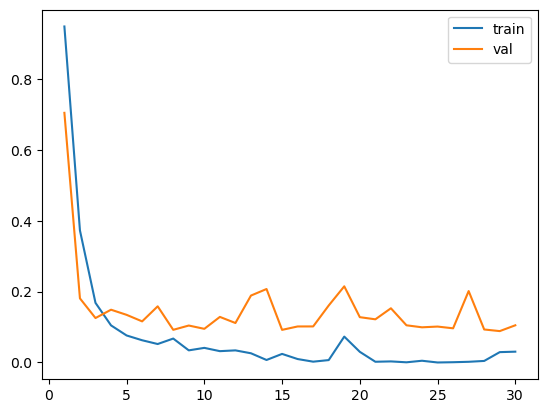

100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.688, precision:1.0, recall:0.064, f1:0.12030075187969924
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.04, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.712, precision:0.9047619047619048, recall:0.152, f1:0.2602739726027397
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.712, precision:0.9047619047619048, recall:0.152, f1:0.2602739726027397
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7386666666666667, precision:0.9090909090909091, recall:0.24, f1:0.379746835443038
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7386666666666667, precision:0.9090909090909091, recall:0.24, f1:0.379746835443038
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.9090909090909091, recall:0.24, f1:0.379746835443038
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7413333333333333, precision:0.9117647058823529, recall:0.248, f1:0.38993710691823896
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.744, precision:0.9142857142857143, recall:0.256, f1:0.39999999999999997
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.744, precision:0.8918918918918919, recall:0.264, f1:0.40740740740740744
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.752, precision:0.8809523809523809, recall:0.296, f1:0.4431137724550898
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.752, precision:0.8809523809523809, recall:0.296, f1:0.4431137724550898
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7546666666666667, precision:0.8837209302325582, recall:0.304, f1:0.45238095238095233
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7573333333333333, precision:0.8863636363636364, recall:0.312, f1:0.46153846153846156
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.76, precision:0.8723404255319149, recall:0.328, f1:0.47674418604651164
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.7626666666666667, precision:0.86, recall:0.344, f1:0.49142857142857144
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:00<00:00, 209.68it/s]


accuracy:0.7653333333333333, precision:0.8627450980392157, recall:0.352, f1:0.5
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:00<00:00, 219.63it/s]


accuracy:0.768, precision:0.8653846153846154, recall:0.36, f1:0.5084745762711865
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.768, precision:0.8653846153846154, recall:0.36, f1:0.5084745762711865
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7706666666666667, precision:0.8679245283018868, recall:0.368, f1:0.5168539325842696
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7733333333333333, precision:0.8703703703703703, recall:0.376, f1:0.5251396648044693
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7733333333333333, precision:0.8703703703703703, recall:0.376, f1:0.5251396648044693
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7706666666666667, precision:0.8545454545454545, recall:0.376, f1:0.5222222222222223
Current threshold:0.4400000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.768, precision:0.8392857142857143, recall:0.376, f1:0.5193370165745856
Current threshold:0.45000000000000023, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7706666666666667, precision:0.8421052631578947, recall:0.384, f1:0.5274725274725276
Current threshold:0.46000000000000024, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.768, precision:0.8275862068965517, recall:0.384, f1:0.5245901639344263
Current threshold:0.47000000000000025, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.768, precision:0.8166666666666667, recall:0.392, f1:0.5297297297297296
Current threshold:0.48000000000000026, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.768, precision:0.8166666666666667, recall:0.392, f1:0.5297297297297296
Current threshold:0.49000000000000027, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7733333333333333, precision:0.8225806451612904, recall:0.408, f1:0.5454545454545454
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.768, precision:0.796875, recall:0.408, f1:0.5396825396825398
Current threshold:0.5100000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.768, precision:0.796875, recall:0.408, f1:0.5396825396825398
Current threshold:0.5200000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7706666666666667, precision:0.8, recall:0.416, f1:0.5473684210526316
Current threshold:0.5300000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7706666666666667, precision:0.8, recall:0.416, f1:0.5473684210526316
Current threshold:0.5400000000000003, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7706666666666667, precision:0.8, recall:0.416, f1:0.5473684210526316
Current threshold:0.5500000000000003, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7733333333333333, precision:0.803030303030303, recall:0.424, f1:0.5549738219895288
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.776, precision:0.8059701492537313, recall:0.432, f1:0.5624999999999999
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7786666666666666, precision:0.8088235294117647, recall:0.44, f1:0.5699481865284974
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7786666666666666, precision:0.8088235294117647, recall:0.44, f1:0.5699481865284974
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.7786666666666666, precision:0.8088235294117647, recall:0.44, f1:0.5699481865284974
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7813333333333333, precision:0.8115942028985508, recall:0.448, f1:0.577319587628866
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7813333333333333, precision:0.8115942028985508, recall:0.448, f1:0.577319587628866
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7893333333333333, precision:0.8194444444444444, recall:0.472, f1:0.598984771573604
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7893333333333333, precision:0.8194444444444444, recall:0.472, f1:0.598984771573604
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.792, precision:0.821917808219178, recall:0.48, f1:0.6060606060606061
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:0.6600000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8053333333333333, precision:0.8333333333333334, recall:0.52, f1:0.6403940886699507
Current threshold:0.6700000000000004, Best threshold:0.6600


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8106666666666666, precision:0.8375, recall:0.536, f1:0.6536585365853659
Current threshold:0.6800000000000004, Best threshold:0.6700


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8106666666666666, precision:0.8292682926829268, recall:0.544, f1:0.6570048309178744
Current threshold:0.7000000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8133333333333334, precision:0.8313253012048193, recall:0.552, f1:0.6634615384615384
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8106666666666666, precision:0.8214285714285714, recall:0.552, f1:0.6602870813397129
Current threshold:0.7200000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8106666666666666, precision:0.8214285714285714, recall:0.552, f1:0.6602870813397129
Current threshold:0.7300000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8133333333333334, precision:0.8235294117647058, recall:0.56, f1:0.6666666666666666
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8133333333333334, precision:0.8235294117647058, recall:0.56, f1:0.6666666666666666
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8133333333333334, precision:0.8235294117647058, recall:0.56, f1:0.6666666666666666
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8133333333333334, precision:0.8160919540229885, recall:0.568, f1:0.669811320754717
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.8133333333333334, precision:0.8160919540229885, recall:0.568, f1:0.669811320754717
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8133333333333334, precision:0.8160919540229885, recall:0.568, f1:0.669811320754717
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.816, precision:0.8181818181818182, recall:0.576, f1:0.676056338028169
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8213333333333334, precision:0.8222222222222222, recall:0.592, f1:0.6883720930232559
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:0.8300000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:0.8400000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.832, precision:0.8297872340425532, recall:0.624, f1:0.7123287671232877
Current threshold:0.8500000000000005, Best threshold:0.8400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8346666666666667, precision:0.8315789473684211, recall:0.632, f1:0.7181818181818181
Current threshold:0.8600000000000005, Best threshold:0.8500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8346666666666667, precision:0.8315789473684211, recall:0.632, f1:0.7181818181818181
Current threshold:0.8700000000000006, Best threshold:0.8600


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8346666666666667, precision:0.8315789473684211, recall:0.632, f1:0.7181818181818181
Current threshold:0.8800000000000006, Best threshold:0.8700


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.8346666666666667, precision:0.8315789473684211, recall:0.632, f1:0.7181818181818181
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8373333333333334, precision:0.8333333333333334, recall:0.64, f1:0.7239819004524887
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8373333333333334, precision:0.8333333333333334, recall:0.64, f1:0.7239819004524887
Current threshold:0.9100000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:00<00:00, 189.93it/s]


accuracy:0.8373333333333334, precision:0.8333333333333334, recall:0.64, f1:0.7239819004524887
Current threshold:0.9200000000000006, Best threshold:0.9100


100%|██████████| 125/125 [00:00<00:00, 210.74it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.84, precision:0.8282828282828283, recall:0.656, f1:0.7321428571428571
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.84, precision:0.8282828282828283, recall:0.656, f1:0.7321428571428571
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.84, precision:0.8282828282828283, recall:0.656, f1:0.7321428571428571
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.84, precision:0.8282828282828283, recall:0.656, f1:0.7321428571428571
Current threshold:1.0200000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:1.0300000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:1.0400000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:1.0500000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:1.0600000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 221.19it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:1.0700000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 219.25it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:1.0800000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:00<00:00, 221.97it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:1.0900000000000007, Best threshold:1.0800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:1.1000000000000008, Best threshold:1.0900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.848, precision:0.8269230769230769, recall:0.688, f1:0.7510917030567685
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8506666666666667, precision:0.8285714285714286, recall:0.696, f1:0.7565217391304347
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8506666666666667, precision:0.8285714285714286, recall:0.696, f1:0.7565217391304347
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8506666666666667, precision:0.8285714285714286, recall:0.696, f1:0.7565217391304347
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.856, precision:0.8317757009345794, recall:0.712, f1:0.7672413793103448
Current threshold:1.1700000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8613333333333333, precision:0.8348623853211009, recall:0.728, f1:0.7777777777777778
Current threshold:1.1800000000000008, Best threshold:1.1700


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8613333333333333, precision:0.8348623853211009, recall:0.728, f1:0.7777777777777778
Current threshold:1.1900000000000008, Best threshold:1.1800


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8613333333333333, precision:0.8348623853211009, recall:0.728, f1:0.7777777777777778
Current threshold:1.2000000000000008, Best threshold:1.1900


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.864, precision:0.8363636363636363, recall:0.736, f1:0.7829787234042553
Current threshold:1.2100000000000009, Best threshold:1.2000


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.864, precision:0.8363636363636363, recall:0.736, f1:0.7829787234042553
Current threshold:1.2200000000000009, Best threshold:1.2100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.864, precision:0.8363636363636363, recall:0.736, f1:0.7829787234042553
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8613333333333333, precision:0.8288288288288288, recall:0.736, f1:0.7796610169491526
Current threshold:1.2400000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8613333333333333, precision:0.8288288288288288, recall:0.736, f1:0.7796610169491526
Current threshold:1.2500000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8613333333333333, precision:0.8288288288288288, recall:0.736, f1:0.7796610169491526
Current threshold:1.260000000000001, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8613333333333333, precision:0.8230088495575221, recall:0.744, f1:0.7815126050420168
Current threshold:1.270000000000001, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8613333333333333, precision:0.8230088495575221, recall:0.744, f1:0.7815126050420168
Current threshold:1.280000000000001, Best threshold:1.2200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.864, precision:0.8245614035087719, recall:0.752, f1:0.7866108786610879
Current threshold:1.290000000000001, Best threshold:1.2800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.864, precision:0.8245614035087719, recall:0.752, f1:0.7866108786610879
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.864, precision:0.8245614035087719, recall:0.752, f1:0.7866108786610879
Current threshold:1.310000000000001, Best threshold:1.3000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.864, precision:0.8245614035087719, recall:0.752, f1:0.7866108786610879
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8613333333333333, precision:0.8173913043478261, recall:0.752, f1:0.7833333333333333
Current threshold:1.330000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8613333333333333, precision:0.8173913043478261, recall:0.752, f1:0.7833333333333333
Current threshold:1.340000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.8613333333333333, precision:0.8173913043478261, recall:0.752, f1:0.7833333333333333
Current threshold:1.350000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8613333333333333, precision:0.8173913043478261, recall:0.752, f1:0.7833333333333333
Current threshold:1.360000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8586666666666667, precision:0.8103448275862069, recall:0.752, f1:0.7800829875518671
Current threshold:1.370000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.8586666666666667, precision:0.8103448275862069, recall:0.752, f1:0.7800829875518671
Current threshold:1.380000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8613333333333333, precision:0.811965811965812, recall:0.76, f1:0.7851239669421488
Current threshold:1.390000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8613333333333333, precision:0.811965811965812, recall:0.76, f1:0.7851239669421488
Current threshold:1.400000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8613333333333333, precision:0.811965811965812, recall:0.76, f1:0.7851239669421488
Current threshold:1.410000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8613333333333333, precision:0.811965811965812, recall:0.76, f1:0.7851239669421488
Current threshold:1.420000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.864, precision:0.8135593220338984, recall:0.768, f1:0.7901234567901235
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.864, precision:0.8135593220338984, recall:0.768, f1:0.7901234567901235
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.864, precision:0.8135593220338984, recall:0.768, f1:0.7901234567901235
Current threshold:1.450000000000001, Best threshold:1.4400


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.864, precision:0.8135593220338984, recall:0.768, f1:0.7901234567901235
Current threshold:1.460000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.864, precision:0.8135593220338984, recall:0.768, f1:0.7901234567901235
Current threshold:1.470000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.864, precision:0.8083333333333333, recall:0.776, f1:0.7918367346938776
Current threshold:1.480000000000001, Best threshold:1.4700


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.864, precision:0.8083333333333333, recall:0.776, f1:0.7918367346938776
Current threshold:1.490000000000001, Best threshold:1.4800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.864, precision:0.8083333333333333, recall:0.776, f1:0.7918367346938776
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


lr=0.0001 and bc=8 results: [0.864, 0.8083333333333333, 0.776, 0.7918367346938776]
Epoch 1/30, Train Loss: 0.9992882813277998, Val Loss: 0.9986696588365656
Epoch 2/30, Train Loss: 0.997674109120118, Val Loss: 0.9961643375848469
Epoch 3/30, Train Loss: 0.9936063540609259, Val Loss: 0.9894514491683558
Epoch 4/30, Train Loss: 0.9819779850934681, Val Loss: 0.9690710870843184
Epoch 5/30, Train Loss: 0.9487613439559937, Val Loss: 0.9154942631721497
Epoch 6/30, Train Loss: 0.8745870605895394, Val Loss: 0.8021865361615231
Epoch 7/30, Train Loss: 0.7206917428656628, Val Loss: 0.5975399425155238
Epoch 8/30, Train Loss: 0.5000526167844471, Val Loss: 0.4371823574367322
Epoch 9/30, Train Loss: 0.3814985485453355, Val Loss: 0.3878900663633096
Epoch 10/30, Train Loss: 0.32320088128510277, Val Loss: 0.3214234215648551
Epoch 11/30, Train Loss: 0.2990680721245314, Val Loss: 0.29341806343903665
Epoch 12/30, Train Loss: 0.26705800683090564, Val Loss: 0.2665218350134398
Epoch 13/30, Train Loss: 0.239428786

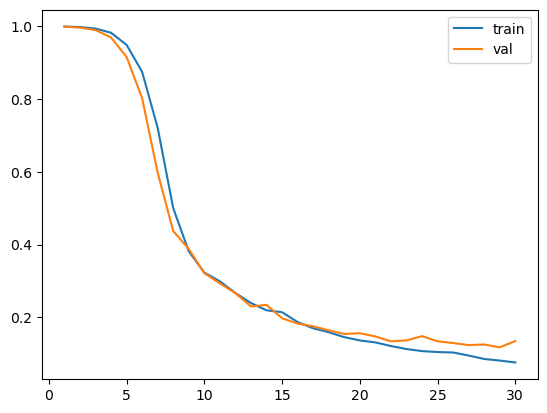

100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7253333333333334, precision:0.8928571428571429, recall:0.2, f1:0.32679738562091504
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.8888888888888888, recall:0.256, f1:0.39751552795031053
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7466666666666667, precision:0.8947368421052632, recall:0.272, f1:0.4171779141104295
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.752, precision:0.9, recall:0.288, f1:0.43636363636363634
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7546666666666667, precision:0.9024390243902439, recall:0.296, f1:0.44578313253012053
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.768, precision:0.9130434782608695, recall:0.336, f1:0.4912280701754386
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.768, precision:0.8958333333333334, recall:0.344, f1:0.49710982658959535
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7733333333333333, precision:0.9, recall:0.36, f1:0.5142857142857143
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.776, precision:0.9019607843137255, recall:0.368, f1:0.5227272727272727
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.776, precision:0.9019607843137255, recall:0.368, f1:0.5227272727272727
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.784, precision:0.9074074074074074, recall:0.392, f1:0.5474860335195532
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7866666666666666, precision:0.9090909090909091, recall:0.4, f1:0.5555555555555556
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7893333333333333, precision:0.9107142857142857, recall:0.408, f1:0.56353591160221
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.792, precision:0.9122807017543859, recall:0.416, f1:0.5714285714285714
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7946666666666666, precision:0.9137931034482759, recall:0.424, f1:0.5792349726775956
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.792, precision:0.8983050847457628, recall:0.424, f1:0.5760869565217391
Current threshold:0.23000000000000007, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7893333333333333, precision:0.8833333333333333, recall:0.424, f1:0.572972972972973
Current threshold:0.24000000000000007, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7866666666666666, precision:0.8571428571428571, recall:0.432, f1:0.5744680851063829
Current threshold:0.25000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7866666666666666, precision:0.8461538461538461, recall:0.44, f1:0.5789473684210525
Current threshold:0.26000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.792, precision:0.8309859154929577, recall:0.472, f1:0.6020408163265306
Current threshold:0.2800000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7946666666666666, precision:0.8333333333333334, recall:0.48, f1:0.6091370558375634
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.808, precision:0.8441558441558441, recall:0.52, f1:0.6435643564356436
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8106666666666666, precision:0.8375, recall:0.536, f1:0.6536585365853659
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8106666666666666, precision:0.8214285714285714, recall:0.552, f1:0.6602870813397129
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8106666666666666, precision:0.813953488372093, recall:0.56, f1:0.6635071090047393
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8106666666666666, precision:0.813953488372093, recall:0.56, f1:0.6635071090047393
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.808, precision:0.8045977011494253, recall:0.56, f1:0.660377358490566
Current threshold:0.36000000000000015, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 210.04it/s]


accuracy:0.808, precision:0.8045977011494253, recall:0.56, f1:0.660377358490566
Current threshold:0.37000000000000016, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.808, precision:0.8045977011494253, recall:0.56, f1:0.660377358490566
Current threshold:0.38000000000000017, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.3900000000000002, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8053333333333333, precision:0.7888888888888889, recall:0.568, f1:0.6604651162790697
Current threshold:0.4000000000000002, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.808, precision:0.7912087912087912, recall:0.576, f1:0.6666666666666666
Current threshold:0.4100000000000002, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8106666666666666, precision:0.7934782608695652, recall:0.584, f1:0.6728110599078342
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.816, precision:0.7978723404255319, recall:0.6, f1:0.6849315068493151
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8213333333333334, precision:0.8020833333333334, recall:0.616, f1:0.6968325791855204
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8186666666666667, precision:0.7938144329896907, recall:0.616, f1:0.6936936936936936
Current threshold:0.45000000000000023, Best threshold:0.4300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8213333333333334, precision:0.7959183673469388, recall:0.624, f1:0.6995515695067265
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.824, precision:0.7920792079207921, recall:0.64, f1:0.7079646017699115
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8373333333333334, precision:0.8018867924528302, recall:0.68, f1:0.735930735930736
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.8037383177570093, recall:0.688, f1:0.7413793103448275
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.8037383177570093, recall:0.688, f1:0.7413793103448275
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.8037383177570093, recall:0.688, f1:0.7413793103448275
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8426666666666667, precision:0.8055555555555556, recall:0.696, f1:0.7467811158798283
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:0.5400000000000003, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.84, precision:0.7927927927927928, recall:0.704, f1:0.7457627118644067
Current threshold:0.5500000000000003, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8373333333333334, precision:0.7857142857142857, recall:0.704, f1:0.7426160337552741
Current threshold:0.5600000000000003, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8373333333333334, precision:0.7857142857142857, recall:0.704, f1:0.7426160337552741
Current threshold:0.5700000000000003, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8373333333333334, precision:0.7807017543859649, recall:0.712, f1:0.7447698744769874
Current threshold:0.5800000000000003, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.84, precision:0.782608695652174, recall:0.72, f1:0.7499999999999999
Current threshold:0.5900000000000003, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:0.6100000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:00<00:00, 225.17it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:0.6600000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.84, precision:0.7642276422764228, recall:0.752, f1:0.7580645161290323
Current threshold:0.6700000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8346666666666667, precision:0.752, recall:0.752, f1:0.752
Current threshold:0.6800000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8373333333333334, precision:0.753968253968254, recall:0.76, f1:0.7569721115537849
Current threshold:0.6900000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.7559055118110236, recall:0.768, f1:0.761904761904762
Current threshold:0.7000000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.84, precision:0.7559055118110236, recall:0.768, f1:0.761904761904762
Current threshold:0.7100000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.84, precision:0.7559055118110236, recall:0.768, f1:0.761904761904762
Current threshold:0.7200000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8426666666666667, precision:0.7538461538461538, recall:0.784, f1:0.7686274509803921
Current threshold:0.7300000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.8426666666666667, precision:0.7538461538461538, recall:0.784, f1:0.7686274509803921
Current threshold:0.7400000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8426666666666667, precision:0.7538461538461538, recall:0.784, f1:0.7686274509803921
Current threshold:0.7500000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8453333333333334, precision:0.7557251908396947, recall:0.792, f1:0.7734375000000001
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.848, precision:0.7575757575757576, recall:0.8, f1:0.7782101167315175
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8586666666666667, precision:0.7647058823529411, recall:0.832, f1:0.7969348659003832
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.856, precision:0.7591240875912408, recall:0.832, f1:0.7938931297709924
Current threshold:0.8200000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8533333333333334, precision:0.7536231884057971, recall:0.832, f1:0.7908745247148289
Current threshold:0.8300000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8533333333333334, precision:0.7536231884057971, recall:0.832, f1:0.7908745247148289
Current threshold:0.8400000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8506666666666667, precision:0.7482014388489209, recall:0.832, f1:0.7878787878787878
Current threshold:0.8500000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8453333333333334, precision:0.7375886524822695, recall:0.832, f1:0.781954887218045
Current threshold:0.8600000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8453333333333334, precision:0.7375886524822695, recall:0.832, f1:0.781954887218045
Current threshold:0.8700000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8453333333333334, precision:0.7375886524822695, recall:0.832, f1:0.781954887218045
Current threshold:0.8800000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 220.80it/s]


accuracy:0.8426666666666667, precision:0.7323943661971831, recall:0.832, f1:0.7790262172284644
Current threshold:0.8900000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 222.77it/s]


accuracy:0.8426666666666667, precision:0.7323943661971831, recall:0.832, f1:0.7790262172284644
Current threshold:0.9000000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:0.9100000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:0.9200000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.84, precision:0.7272727272727273, recall:0.832, f1:0.7761194029850746
Current threshold:0.9300000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.8373333333333334, precision:0.7222222222222222, recall:0.832, f1:0.7732342007434944
Current threshold:0.9400000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 194.96it/s]


accuracy:0.84, precision:0.7241379310344828, recall:0.84, f1:0.7777777777777777
Current threshold:0.9500000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.8346666666666667, precision:0.7142857142857143, recall:0.84, f1:0.7720588235294118
Current threshold:0.9600000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.832, precision:0.7094594594594594, recall:0.84, f1:0.769230769230769
Current threshold:0.9700000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.832, precision:0.7094594594594594, recall:0.84, f1:0.769230769230769
Current threshold:0.9800000000000006, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8293333333333334, precision:0.7046979865771812, recall:0.84, f1:0.7664233576642336
Current threshold:0.9900000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8293333333333334, precision:0.7046979865771812, recall:0.84, f1:0.7664233576642336
Current threshold:1.0000000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8293333333333334, precision:0.7046979865771812, recall:0.84, f1:0.7664233576642336
Current threshold:1.0100000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8293333333333334, precision:0.7019867549668874, recall:0.848, f1:0.7681159420289856
Current threshold:1.0200000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.8266666666666667, precision:0.6973684210526315, recall:0.848, f1:0.7653429602888087
Current threshold:1.0300000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8293333333333334, precision:0.6993464052287581, recall:0.856, f1:0.7697841726618704
Current threshold:1.0400000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8346666666666667, precision:0.7032258064516129, recall:0.872, f1:0.7785714285714286
Current threshold:1.0500000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8346666666666667, precision:0.7032258064516129, recall:0.872, f1:0.7785714285714286
Current threshold:1.0600000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8346666666666667, precision:0.7006369426751592, recall:0.88, f1:0.7801418439716312
Current threshold:1.0700000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8346666666666667, precision:0.7006369426751592, recall:0.88, f1:0.7801418439716312
Current threshold:1.0800000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.832, precision:0.6962025316455697, recall:0.88, f1:0.7773851590106008
Current threshold:1.0900000000000007, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.832, precision:0.6962025316455697, recall:0.88, f1:0.7773851590106008
Current threshold:1.1000000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.832, precision:0.6962025316455697, recall:0.88, f1:0.7773851590106008
Current threshold:1.1100000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.1200000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.1300000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.1400000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.1500000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.1600000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.8373333333333334, precision:0.7, recall:0.896, f1:0.7859649122807016
Current threshold:1.1700000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.8373333333333334, precision:0.7, recall:0.896, f1:0.7859649122807016
Current threshold:1.1800000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.7018633540372671, recall:0.904, f1:0.7902097902097903
Current threshold:1.1900000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.84, precision:0.7018633540372671, recall:0.904, f1:0.7902097902097903
Current threshold:1.2000000000000008, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.84, precision:0.696969696969697, recall:0.92, f1:0.793103448275862
Current threshold:1.2100000000000009, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.84, precision:0.696969696969697, recall:0.92, f1:0.793103448275862
Current threshold:1.2200000000000009, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:1.2300000000000009, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:1.2400000000000009, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:1.2500000000000009, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:1.260000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:1.270000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.8346666666666667, precision:0.688622754491018, recall:0.92, f1:0.7876712328767123
Current threshold:1.280000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8346666666666667, precision:0.688622754491018, recall:0.92, f1:0.7876712328767123
Current threshold:1.290000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:1.300000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:1.310000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:1.320000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:1.330000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:1.340000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:1.350000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:1.360000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.832, precision:0.6823529411764706, recall:0.928, f1:0.7864406779661016
Current threshold:1.370000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.832, precision:0.6823529411764706, recall:0.928, f1:0.7864406779661016
Current threshold:1.380000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.832, precision:0.6823529411764706, recall:0.928, f1:0.7864406779661016
Current threshold:1.390000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8293333333333334, precision:0.6783625730994152, recall:0.928, f1:0.7837837837837837
Current threshold:1.400000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8293333333333334, precision:0.6783625730994152, recall:0.928, f1:0.7837837837837837
Current threshold:1.410000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8266666666666667, precision:0.6744186046511628, recall:0.928, f1:0.7811447811447813
Current threshold:1.420000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.824, precision:0.6705202312138728, recall:0.928, f1:0.7785234899328859
Current threshold:1.430000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.824, precision:0.6705202312138728, recall:0.928, f1:0.7785234899328859
Current threshold:1.440000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.824, precision:0.6705202312138728, recall:0.928, f1:0.7785234899328859
Current threshold:1.450000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.824, precision:0.6705202312138728, recall:0.928, f1:0.7785234899328859
Current threshold:1.460000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.824, precision:0.6685714285714286, recall:0.936, f1:0.7800000000000001
Current threshold:1.470000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.824, precision:0.6685714285714286, recall:0.936, f1:0.7800000000000001
Current threshold:1.480000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.8213333333333334, precision:0.6647727272727273, recall:0.936, f1:0.777408637873754
Current threshold:1.490000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8213333333333334, precision:0.6647727272727273, recall:0.936, f1:0.777408637873754
Current threshold:1.500000000000001, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


lr=1e-05 and bc=8 results: [0.8586666666666667, 0.7647058823529411, 0.832, 0.7969348659003832]
Epoch 1/30, Train Loss: 0.9751345694065094, Val Loss: 0.6558587670326232
Epoch 2/30, Train Loss: 0.3397416241466999, Val Loss: 0.22134252190589904
Epoch 3/30, Train Loss: 0.2025897905230522, Val Loss: 0.3777672201395035
Epoch 4/30, Train Loss: 0.1268309935927391, Val Loss: 0.17894841283559798
Epoch 5/30, Train Loss: 0.12313060015439987, Val Loss: 0.18991061747074128
Epoch 6/30, Train Loss: 0.1739119239151478, Val Loss: 0.2953984379768372
Epoch 7/30, Train Loss: 0.08638443686068058, Val Loss: 0.3007879763841629
Epoch 8/30, Train Loss: 0.08297164216637612, Val Loss: 0.1519359305500984
Epoch 9/30, Train Loss: 0.0615272156894207, Val Loss: 0.16877917051315308
Epoch 10/30, Train Loss: 0.04362683203071356, Val Loss: 0.2584210827946663
Epoch 11/30, Train Loss: 0.03626407813280821, Val Loss: 0.16903236359357834
Epoch 12/30, Train Loss: 0.04321204349398613, Val Loss: 0.16778946667909622
Epoch 13/30, T

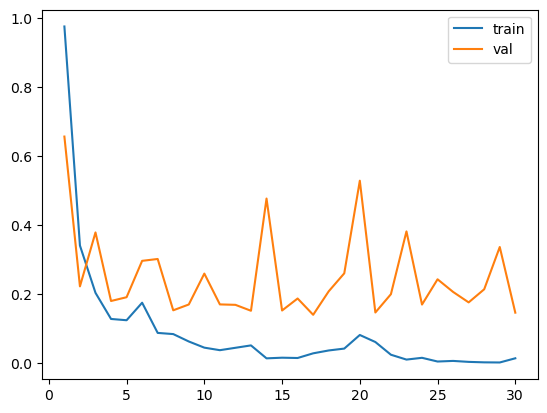

100%|██████████| 125/125 [00:00<00:00, 222.77it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.6933333333333334, precision:1.0, recall:0.08, f1:0.14814814814814814
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.6986666666666667, precision:0.9285714285714286, recall:0.104, f1:0.1870503597122302
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.712, precision:0.9047619047619048, recall:0.152, f1:0.2602739726027397
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.2700000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7253333333333334, precision:0.8928571428571429, recall:0.2, f1:0.32679738562091504
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7253333333333334, precision:0.8666666666666667, recall:0.208, f1:0.3354838709677419
Current threshold:0.3200000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7253333333333334, precision:0.8666666666666667, recall:0.208, f1:0.3354838709677419
Current threshold:0.3300000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7253333333333334, precision:0.8666666666666667, recall:0.208, f1:0.3354838709677419
Current threshold:0.34000000000000014, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.8709677419354839, recall:0.216, f1:0.34615384615384615
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.8709677419354839, recall:0.216, f1:0.34615384615384615
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:00<00:00, 229.37it/s]


accuracy:0.728, precision:0.8709677419354839, recall:0.216, f1:0.34615384615384615
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.728, precision:0.8709677419354839, recall:0.216, f1:0.34615384615384615
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.728, precision:0.8709677419354839, recall:0.216, f1:0.34615384615384615
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7306666666666667, precision:0.875, recall:0.224, f1:0.356687898089172
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.7253333333333334, precision:0.8235294117647058, recall:0.224, f1:0.3522012578616352
Current threshold:0.4100000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7253333333333334, precision:0.8235294117647058, recall:0.224, f1:0.3522012578616352
Current threshold:0.4200000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7253333333333334, precision:0.8235294117647058, recall:0.224, f1:0.3522012578616352
Current threshold:0.4300000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7253333333333334, precision:0.8235294117647058, recall:0.224, f1:0.3522012578616352
Current threshold:0.4400000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7253333333333334, precision:0.8235294117647058, recall:0.224, f1:0.3522012578616352
Current threshold:0.45000000000000023, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7226666666666667, precision:0.8, recall:0.224, f1:0.35000000000000003
Current threshold:0.46000000000000024, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7253333333333334, precision:0.8055555555555556, recall:0.232, f1:0.36024844720496896
Current threshold:0.47000000000000025, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7253333333333334, precision:0.8055555555555556, recall:0.232, f1:0.36024844720496896
Current threshold:0.48000000000000026, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7253333333333334, precision:0.7894736842105263, recall:0.24, f1:0.36809815950920244
Current threshold:0.49000000000000027, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.7253333333333334, precision:0.7894736842105263, recall:0.24, f1:0.36809815950920244
Current threshold:0.5000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 206.91it/s]


accuracy:0.7253333333333334, precision:0.7894736842105263, recall:0.24, f1:0.36809815950920244
Current threshold:0.5100000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.7253333333333334, precision:0.7894736842105263, recall:0.24, f1:0.36809815950920244
Current threshold:0.5200000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.728, precision:0.7948717948717948, recall:0.248, f1:0.3780487804878048
Current threshold:0.5300000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7306666666666667, precision:0.8, recall:0.256, f1:0.3878787878787879
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.7333333333333333, precision:0.8048780487804879, recall:0.264, f1:0.39759036144578314
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.728, precision:0.7674418604651163, recall:0.264, f1:0.3928571428571429
Current threshold:0.5600000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.7674418604651163, recall:0.264, f1:0.3928571428571429
Current threshold:0.5700000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.728, precision:0.7674418604651163, recall:0.264, f1:0.3928571428571429
Current threshold:0.5800000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7306666666666667, precision:0.7727272727272727, recall:0.272, f1:0.40236686390532544
Current threshold:0.5900000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7306666666666667, precision:0.7727272727272727, recall:0.272, f1:0.40236686390532544
Current threshold:0.6000000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7306666666666667, precision:0.7727272727272727, recall:0.272, f1:0.40236686390532544
Current threshold:0.6100000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7306666666666667, precision:0.7727272727272727, recall:0.272, f1:0.40236686390532544
Current threshold:0.6200000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.728, precision:0.7555555555555555, recall:0.272, f1:0.4
Current threshold:0.6300000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.728, precision:0.7555555555555555, recall:0.272, f1:0.4
Current threshold:0.6400000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.7555555555555555, recall:0.272, f1:0.4
Current threshold:0.6500000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.7555555555555555, recall:0.272, f1:0.4
Current threshold:0.6600000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.728, precision:0.7555555555555555, recall:0.272, f1:0.4
Current threshold:0.6700000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.728, precision:0.7555555555555555, recall:0.272, f1:0.4
Current threshold:0.6800000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.7446808510638298, recall:0.28, f1:0.4069767441860466
Current threshold:0.6900000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.728, precision:0.7446808510638298, recall:0.28, f1:0.4069767441860466
Current threshold:0.7000000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7100000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7200000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7300000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7400000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7500000000000004, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7600000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7253333333333334, precision:0.7291666666666666, recall:0.28, f1:0.40462427745664736
Current threshold:0.7700000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.728, precision:0.7346938775510204, recall:0.288, f1:0.41379310344827586
Current threshold:0.7800000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7253333333333334, precision:0.72, recall:0.288, f1:0.4114285714285714
Current threshold:0.7900000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.7253333333333334, precision:0.72, recall:0.288, f1:0.4114285714285714
Current threshold:0.8000000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.62it/s]


accuracy:0.7253333333333334, precision:0.72, recall:0.288, f1:0.4114285714285714
Current threshold:0.8100000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7226666666666667, precision:0.7058823529411765, recall:0.288, f1:0.4090909090909091
Current threshold:0.8200000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.47it/s]


accuracy:0.72, precision:0.6923076923076923, recall:0.288, f1:0.40677966101694907
Current threshold:0.8300000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.72, precision:0.6923076923076923, recall:0.288, f1:0.40677966101694907
Current threshold:0.8400000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.72, precision:0.6923076923076923, recall:0.288, f1:0.40677966101694907
Current threshold:0.8500000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.72, precision:0.6923076923076923, recall:0.288, f1:0.40677966101694907
Current threshold:0.8600000000000005, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.72, precision:0.6923076923076923, recall:0.288, f1:0.40677966101694907
Current threshold:0.8700000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7226666666666667, precision:0.6981132075471698, recall:0.296, f1:0.41573033707865165
Current threshold:0.8800000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7226666666666667, precision:0.6909090909090909, recall:0.304, f1:0.42222222222222217
Current threshold:0.8900000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7226666666666667, precision:0.6909090909090909, recall:0.304, f1:0.42222222222222217
Current threshold:0.9000000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7226666666666667, precision:0.6909090909090909, recall:0.304, f1:0.42222222222222217
Current threshold:0.9100000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7226666666666667, precision:0.6909090909090909, recall:0.304, f1:0.42222222222222217
Current threshold:0.9200000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7226666666666667, precision:0.6909090909090909, recall:0.304, f1:0.42222222222222217
Current threshold:0.9300000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.728, precision:0.7017543859649122, recall:0.32, f1:0.43956043956043955
Current threshold:0.9400000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.728, precision:0.7017543859649122, recall:0.32, f1:0.43956043956043955
Current threshold:0.9500000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.728, precision:0.7017543859649122, recall:0.32, f1:0.43956043956043955
Current threshold:0.9600000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.728, precision:0.7017543859649122, recall:0.32, f1:0.43956043956043955
Current threshold:0.9700000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.728, precision:0.7017543859649122, recall:0.32, f1:0.43956043956043955
Current threshold:0.9800000000000006, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7306666666666667, precision:0.7068965517241379, recall:0.328, f1:0.44808743169398907
Current threshold:0.9900000000000007, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 229.63it/s]


accuracy:0.7306666666666667, precision:0.7068965517241379, recall:0.328, f1:0.44808743169398907
Current threshold:1.0000000000000007, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7333333333333333, precision:0.711864406779661, recall:0.336, f1:0.4565217391304348
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7333333333333333, precision:0.711864406779661, recall:0.336, f1:0.4565217391304348
Current threshold:1.0200000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7333333333333333, precision:0.711864406779661, recall:0.336, f1:0.4565217391304348
Current threshold:1.0300000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.736, precision:0.7166666666666667, recall:0.344, f1:0.46486486486486484
Current threshold:1.0400000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:00<00:00, 219.84it/s]


accuracy:0.736, precision:0.7166666666666667, recall:0.344, f1:0.46486486486486484
Current threshold:1.0500000000000007, Best threshold:1.0400


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:1.0600000000000007, Best threshold:1.0500


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:1.0700000000000007, Best threshold:1.0600


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.7386666666666667, precision:0.7213114754098361, recall:0.352, f1:0.4731182795698925
Current threshold:1.0800000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.736, precision:0.7096774193548387, recall:0.352, f1:0.4705882352941176
Current threshold:1.0900000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.736, precision:0.7096774193548387, recall:0.352, f1:0.4705882352941176
Current threshold:1.1000000000000008, Best threshold:1.0700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.7142857142857143, recall:0.36, f1:0.4787234042553191
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7386666666666667, precision:0.7076923076923077, recall:0.368, f1:0.4842105263157895
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.7121212121212122, recall:0.376, f1:0.49214659685863865
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.7121212121212122, recall:0.376, f1:0.49214659685863865
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7413333333333333, precision:0.7121212121212122, recall:0.376, f1:0.49214659685863865
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.7121212121212122, recall:0.376, f1:0.49214659685863865
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.1700000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.1800000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.1900000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.2000000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.2100000000000009, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.2200000000000009, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.7386666666666667, precision:0.7014925373134329, recall:0.376, f1:0.4895833333333334
Current threshold:1.2300000000000009, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.736, precision:0.6911764705882353, recall:0.376, f1:0.48704663212435223
Current threshold:1.2400000000000009, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.736, precision:0.6911764705882353, recall:0.376, f1:0.48704663212435223
Current threshold:1.2500000000000009, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.736, precision:0.6911764705882353, recall:0.376, f1:0.48704663212435223
Current threshold:1.260000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.736, precision:0.6911764705882353, recall:0.376, f1:0.48704663212435223
Current threshold:1.270000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7386666666666667, precision:0.6956521739130435, recall:0.384, f1:0.4948453608247423
Current threshold:1.280000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.736, precision:0.6857142857142857, recall:0.384, f1:0.4923076923076923
Current threshold:1.290000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.736, precision:0.6857142857142857, recall:0.384, f1:0.4923076923076923
Current threshold:1.300000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.736, precision:0.6857142857142857, recall:0.384, f1:0.4923076923076923
Current threshold:1.310000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.736, precision:0.6857142857142857, recall:0.384, f1:0.4923076923076923
Current threshold:1.320000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.736, precision:0.6857142857142857, recall:0.384, f1:0.4923076923076923
Current threshold:1.330000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.736, precision:0.6857142857142857, recall:0.384, f1:0.4923076923076923
Current threshold:1.340000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 227.84it/s]


accuracy:0.7386666666666667, precision:0.6901408450704225, recall:0.392, f1:0.5000000000000001
Current threshold:1.350000000000001, Best threshold:1.1500


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7413333333333333, precision:0.6944444444444444, recall:0.4, f1:0.5076142131979695
Current threshold:1.360000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:00<00:00, 228.09it/s]


accuracy:0.7413333333333333, precision:0.6944444444444444, recall:0.4, f1:0.5076142131979695
Current threshold:1.370000000000001, Best threshold:1.3600


100%|██████████| 125/125 [00:00<00:00, 228.38it/s]


accuracy:0.7413333333333333, precision:0.6944444444444444, recall:0.4, f1:0.5076142131979695
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.6944444444444444, recall:0.4, f1:0.5076142131979695
Current threshold:1.390000000000001, Best threshold:1.3800


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.7413333333333333, precision:0.6944444444444444, recall:0.4, f1:0.5076142131979695
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7413333333333333, precision:0.6944444444444444, recall:0.4, f1:0.5076142131979695
Current threshold:1.410000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.744, precision:0.6986301369863014, recall:0.408, f1:0.5151515151515151
Current threshold:1.420000000000001, Best threshold:1.4100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.744, precision:0.6986301369863014, recall:0.408, f1:0.5151515151515151
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.744, precision:0.6933333333333334, recall:0.416, f1:0.52
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.744, precision:0.6883116883116883, recall:0.424, f1:0.5247524752475248
Current threshold:1.450000000000001, Best threshold:1.4400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.6883116883116883, recall:0.424, f1:0.5247524752475248
Current threshold:1.460000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.6794871794871795, recall:0.424, f1:0.5221674876847291
Current threshold:1.470000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.744, precision:0.6835443037974683, recall:0.432, f1:0.5294117647058824
Current threshold:1.480000000000001, Best threshold:1.4700


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.675, recall:0.432, f1:0.526829268292683
Current threshold:1.490000000000001, Best threshold:1.4700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.744, precision:0.6790123456790124, recall:0.44, f1:0.5339805825242718
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


lr=0.001 and bc=32 results: [0.744, 0.6790123456790124, 0.44, 0.5339805825242718]
Epoch 1/30, Train Loss: 0.9988322913646698, Val Loss: 0.9963297724723816
Epoch 2/30, Train Loss: 0.9909640789031983, Val Loss: 0.9770025730133056
Epoch 3/30, Train Loss: 0.9498189210891723, Val Loss: 0.8872928977012634
Epoch 4/30, Train Loss: 0.8102343857288361, Val Loss: 0.6290116906166077
Epoch 5/30, Train Loss: 0.5083556860685349, Val Loss: 0.38896491527557375
Epoch 6/30, Train Loss: 0.31420013308525085, Val Loss: 0.2674938291311264
Epoch 7/30, Train Loss: 0.2399756520986557, Val Loss: 0.21359440684318542
Epoch 8/30, Train Loss: 0.21734875589609146, Val Loss: 0.17481824457645417
Epoch 9/30, Train Loss: 0.1534234881401062, Val Loss: 0.14718834012746812
Epoch 10/30, Train Loss: 0.12617331594228745, Val Loss: 0.14688270837068557
Epoch 11/30, Train Loss: 0.10266098156571388, Val Loss: 0.14061516374349595
Epoch 12/30, Train Loss: 0.09805904887616634, Val Loss: 0.15141646564006805
Epoch 13/30, Train Loss: 0.

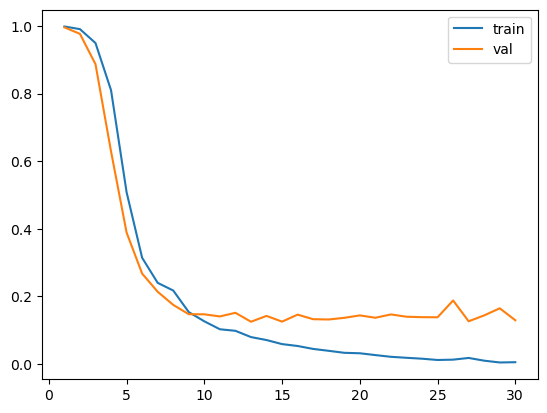

100%|██████████| 125/125 [00:00<00:00, 224.36it/s]


accuracy:0.696, precision:1.0, recall:0.088, f1:0.16176470588235292
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 201.24it/s]


accuracy:0.7013333333333334, precision:1.0, recall:0.104, f1:0.18840579710144925
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 215.84it/s]


accuracy:0.7013333333333334, precision:1.0, recall:0.104, f1:0.18840579710144925
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7013333333333334, precision:1.0, recall:0.104, f1:0.18840579710144925
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.704, precision:0.9375, recall:0.12, f1:0.21276595744680846
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.08, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.09, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.09999999999999999, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.10999999999999999, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.11999999999999998, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.7013333333333334, precision:0.8823529411764706, recall:0.12, f1:0.21126760563380279
Current threshold:0.12999999999999998, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.704, precision:0.8888888888888888, recall:0.128, f1:0.22377622377622375
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:00<00:00, 222.37it/s]


accuracy:0.704, precision:0.8888888888888888, recall:0.128, f1:0.22377622377622375
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 220.80it/s]


accuracy:0.7013333333333334, precision:0.8421052631578947, recall:0.128, f1:0.2222222222222222
Current threshold:0.16, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.704, precision:0.85, recall:0.136, f1:0.23448275862068968
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 220.41it/s]


accuracy:0.7066666666666667, precision:0.8571428571428571, recall:0.144, f1:0.2465753424657534
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 214.73it/s]


accuracy:0.7066666666666667, precision:0.8571428571428571, recall:0.144, f1:0.2465753424657534
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 223.96it/s]


accuracy:0.7093333333333334, precision:0.8636363636363636, recall:0.152, f1:0.25850340136054417
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:00<00:00, 225.99it/s]


accuracy:0.7093333333333334, precision:0.8636363636363636, recall:0.152, f1:0.25850340136054417
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7146666666666667, precision:0.875, recall:0.168, f1:0.2818791946308725
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7173333333333334, precision:0.88, recall:0.176, f1:0.2933333333333333
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.7253333333333334, precision:0.8928571428571429, recall:0.2, f1:0.32679738562091504
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.736, precision:0.8823529411764706, recall:0.24, f1:0.37735849056603776
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.736, precision:0.8823529411764706, recall:0.24, f1:0.37735849056603776
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7413333333333333, precision:0.8888888888888888, recall:0.256, f1:0.39751552795031053
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.752, precision:0.8809523809523809, recall:0.296, f1:0.4431137724550898
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.752, precision:0.8809523809523809, recall:0.296, f1:0.4431137724550898
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7546666666666667, precision:0.8666666666666667, recall:0.312, f1:0.45882352941176474
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.76, precision:0.8723404255319149, recall:0.328, f1:0.47674418604651164
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7626666666666667, precision:0.875, recall:0.336, f1:0.4855491329479769
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7626666666666667, precision:0.875, recall:0.336, f1:0.4855491329479769
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7626666666666667, precision:0.875, recall:0.336, f1:0.4855491329479769
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.768, precision:0.88, recall:0.352, f1:0.5028571428571428
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7706666666666667, precision:0.8823529411764706, recall:0.36, f1:0.5113636363636364
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7733333333333333, precision:0.8846153846153846, recall:0.368, f1:0.519774011299435
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7813333333333333, precision:0.8909090909090909, recall:0.392, f1:0.5444444444444444
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7813333333333333, precision:0.8909090909090909, recall:0.392, f1:0.5444444444444444
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7786666666666666, precision:0.875, recall:0.392, f1:0.5414364640883979
Current threshold:0.5600000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7786666666666666, precision:0.875, recall:0.392, f1:0.5414364640883979
Current threshold:0.5700000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7786666666666666, precision:0.875, recall:0.392, f1:0.5414364640883979
Current threshold:0.5800000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7786666666666666, precision:0.875, recall:0.392, f1:0.5414364640883979
Current threshold:0.5900000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.7786666666666666, precision:0.875, recall:0.392, f1:0.5414364640883979
Current threshold:0.6000000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:00<00:00, 225.58it/s]


accuracy:0.7813333333333333, precision:0.8771929824561403, recall:0.4, f1:0.5494505494505494
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:00<00:00, 228.49it/s]


accuracy:0.7813333333333333, precision:0.8771929824561403, recall:0.4, f1:0.5494505494505494
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.784, precision:0.8793103448275862, recall:0.408, f1:0.5573770491803278
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.784, precision:0.8793103448275862, recall:0.408, f1:0.5573770491803278
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.6500000000000004, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.6600000000000004, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.6700000000000004, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.6800000000000004, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.6900000000000004, Best threshold:0.6300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:0.7200000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.792, precision:0.873015873015873, recall:0.44, f1:0.5851063829787234
Current threshold:0.7300000000000004, Best threshold:0.7200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.792, precision:0.873015873015873, recall:0.44, f1:0.5851063829787234
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:0.8300000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:00<00:00, 223.16it/s]


accuracy:0.8026666666666666, precision:0.8591549295774648, recall:0.488, f1:0.6224489795918366
Current threshold:0.8400000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:0.8500000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:0.8600000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:0.8700000000000006, Best threshold:0.8300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:0.8800000000000006, Best threshold:0.8300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8053333333333333, precision:0.8421052631578947, recall:0.512, f1:0.6368159203980099
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8053333333333333, precision:0.8421052631578947, recall:0.512, f1:0.6368159203980099
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:0.9100000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:0.9200000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:0.9300000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:0.9400000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:0.9500000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:0.9600000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:0.9700000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:0.9800000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:0.9900000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8, precision:0.8125, recall:0.52, f1:0.6341463414634146
Current threshold:1.0000000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8, precision:0.8125, recall:0.52, f1:0.6341463414634146
Current threshold:1.0100000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8, precision:0.8125, recall:0.52, f1:0.6341463414634146
Current threshold:1.0200000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8, precision:0.8125, recall:0.52, f1:0.6341463414634146
Current threshold:1.0300000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7973333333333333, precision:0.7951807228915663, recall:0.528, f1:0.6346153846153846
Current threshold:1.0400000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:1.0500000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:1.0600000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:1.0700000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:1.0800000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8026666666666666, precision:0.8, recall:0.544, f1:0.6476190476190476
Current threshold:1.0900000000000007, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8026666666666666, precision:0.8, recall:0.544, f1:0.6476190476190476
Current threshold:1.1000000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8, precision:0.7906976744186046, recall:0.544, f1:0.6445497630331752
Current threshold:1.1100000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8026666666666666, precision:0.7931034482758621, recall:0.552, f1:0.6509433962264152
Current threshold:1.1200000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8, precision:0.7840909090909091, recall:0.552, f1:0.6478873239436619
Current threshold:1.1300000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.8, precision:0.7840909090909091, recall:0.552, f1:0.6478873239436619
Current threshold:1.1400000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 220.41it/s]


accuracy:0.8, precision:0.7840909090909091, recall:0.552, f1:0.6478873239436619
Current threshold:1.1500000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.8, precision:0.7840909090909091, recall:0.552, f1:0.6478873239436619
Current threshold:1.1600000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8026666666666666, precision:0.7865168539325843, recall:0.56, f1:0.6542056074766355
Current threshold:1.1700000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8, precision:0.7777777777777778, recall:0.56, f1:0.6511627906976745
Current threshold:1.1800000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8, precision:0.7777777777777778, recall:0.56, f1:0.6511627906976745
Current threshold:1.1900000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7973333333333333, precision:0.7692307692307693, recall:0.56, f1:0.6481481481481483
Current threshold:1.2000000000000008, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8026666666666666, precision:0.7741935483870968, recall:0.576, f1:0.6605504587155964
Current threshold:1.2100000000000009, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8, precision:0.7659574468085106, recall:0.576, f1:0.6575342465753425
Current threshold:1.2200000000000009, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8026666666666666, precision:0.7684210526315789, recall:0.584, f1:0.6636363636363636
Current threshold:1.2300000000000009, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8, precision:0.7604166666666666, recall:0.584, f1:0.6606334841628959
Current threshold:1.2400000000000009, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.8026666666666666, precision:0.7628865979381443, recall:0.592, f1:0.6666666666666666
Current threshold:1.2500000000000009, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8, precision:0.7551020408163265, recall:0.592, f1:0.6636771300448431
Current threshold:1.260000000000001, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8026666666666666, precision:0.7575757575757576, recall:0.6, f1:0.6696428571428572
Current threshold:1.270000000000001, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8026666666666666, precision:0.7575757575757576, recall:0.6, f1:0.6696428571428572
Current threshold:1.280000000000001, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8026666666666666, precision:0.7575757575757576, recall:0.6, f1:0.6696428571428572
Current threshold:1.290000000000001, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8026666666666666, precision:0.7575757575757576, recall:0.6, f1:0.6696428571428572
Current threshold:1.300000000000001, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 229.58it/s]


accuracy:0.8026666666666666, precision:0.7524752475247525, recall:0.608, f1:0.672566371681416
Current threshold:1.310000000000001, Best threshold:0.8900


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8053333333333333, precision:0.7549019607843137, recall:0.616, f1:0.6784140969162995
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8053333333333333, precision:0.7549019607843137, recall:0.616, f1:0.6784140969162995
Current threshold:1.330000000000001, Best threshold:1.3200


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.808, precision:0.7572815533980582, recall:0.624, f1:0.6842105263157895
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.808, precision:0.7572815533980582, recall:0.624, f1:0.6842105263157895
Current threshold:1.350000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.808, precision:0.7572815533980582, recall:0.624, f1:0.6842105263157895
Current threshold:1.360000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.370000000000001, Best threshold:1.3600


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.390000000000001, Best threshold:1.3800


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.410000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:00<00:00, 231.86it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.420000000000001, Best threshold:1.4100


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.450000000000001, Best threshold:1.4400


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.460000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8106666666666666, precision:0.7596153846153846, recall:0.632, f1:0.6899563318777292
Current threshold:1.470000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.808, precision:0.7523809523809524, recall:0.632, f1:0.6869565217391305
Current threshold:1.480000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.808, precision:0.7523809523809524, recall:0.632, f1:0.6869565217391305
Current threshold:1.490000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8106666666666666, precision:0.7547169811320755, recall:0.64, f1:0.6926406926406927
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


lr=0.0001 and bc=32 results: [0.8106666666666666, 0.7547169811320755, 0.64, 0.6926406926406927]
Epoch 1/30, Train Loss: 0.999418956041336, Val Loss: 0.9988755583763123
Epoch 2/30, Train Loss: 0.9985544383525848, Val Loss: 0.9981152772903442
Epoch 3/30, Train Loss: 0.9977760076522827, Val Loss: 0.9970659971237182
Epoch 4/30, Train Loss: 0.9966411471366883, Val Loss: 0.9958165526390076
Epoch 5/30, Train Loss: 0.9951424598693848, Val Loss: 0.9938668966293335
Epoch 6/30, Train Loss: 0.9931221067905426, Val Loss: 0.9915820002555847
Epoch 7/30, Train Loss: 0.9903909623622894, Val Loss: 0.9880648016929626
Epoch 8/30, Train Loss: 0.9863685131072998, Val Loss: 0.9830064654350281
Epoch 9/30, Train Loss: 0.9808026015758514, Val Loss: 0.9763632774353027
Epoch 10/30, Train Loss: 0.972869235277176, Val Loss: 0.9664687991142273
Epoch 11/30, Train Loss: 0.9629645586013794, Val Loss: 0.9549860477447509
Epoch 12/30, Train Loss: 0.949288010597229, Val Loss: 0.9388489603996277
Epoch 13/30, Train Loss: 0.9

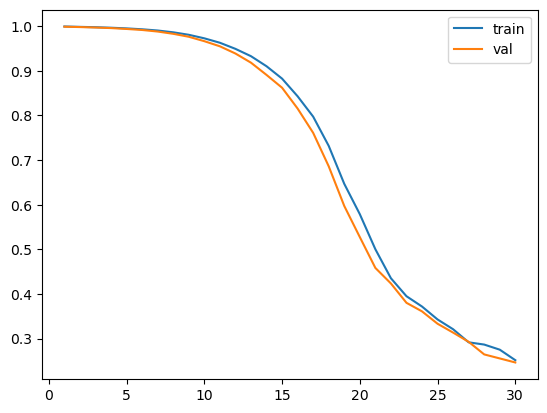

100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.72, precision:1.0, recall:0.16, f1:0.2758620689655173
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7333333333333333, precision:0.9310344827586207, recall:0.216, f1:0.35064935064935066
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7493333333333333, precision:0.8444444444444444, recall:0.304, f1:0.4470588235294118
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7573333333333333, precision:0.8269230769230769, recall:0.344, f1:0.48587570621468923
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7813333333333333, precision:0.8524590163934426, recall:0.416, f1:0.5591397849462365
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.7973333333333333, precision:0.8656716417910447, recall:0.464, f1:0.6041666666666666
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.816, precision:0.868421052631579, recall:0.528, f1:0.6567164179104478
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8213333333333334, precision:0.8717948717948718, recall:0.544, f1:0.6699507389162562
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 207.94it/s]


accuracy:0.8186666666666667, precision:0.8607594936708861, recall:0.544, f1:0.6666666666666666
Current threshold:0.11999999999999998, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.8133333333333334, precision:0.8395061728395061, recall:0.544, f1:0.6601941747572816
Current threshold:0.12999999999999998, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8133333333333334, precision:0.8235294117647058, recall:0.56, f1:0.6666666666666666
Current threshold:0.13999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.8213333333333334, precision:0.8222222222222222, recall:0.592, f1:0.6883720930232559
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.824, precision:0.8172043010752689, recall:0.608, f1:0.6972477064220183
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.8282828282828283, recall:0.656, f1:0.7321428571428571
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.8453333333333334, precision:0.819047619047619, recall:0.688, f1:0.7478260869565216
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8453333333333334, precision:0.8073394495412844, recall:0.704, f1:0.7521367521367521
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8373333333333334, precision:0.7857142857142857, recall:0.704, f1:0.7426160337552741
Current threshold:0.20000000000000004, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.8426666666666667, precision:0.7894736842105263, recall:0.72, f1:0.7531380753138075
Current threshold:0.21000000000000005, Best threshold:0.1800


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.856, precision:0.7983193277310925, recall:0.76, f1:0.778688524590164
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8533333333333334, precision:0.7868852459016393, recall:0.768, f1:0.7773279352226721
Current threshold:0.23000000000000007, Best threshold:0.2100


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.856, precision:0.784, recall:0.784, f1:0.7840000000000001
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.856, precision:0.784, recall:0.784, f1:0.7840000000000001
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.8586666666666667, precision:0.7769230769230769, recall:0.808, f1:0.792156862745098
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:0.2700000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.856, precision:0.7553956834532374, recall:0.84, f1:0.7954545454545454
Current threshold:0.2800000000000001, Best threshold:0.2500


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.864, precision:0.7605633802816901, recall:0.864, f1:0.8089887640449438
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.8666666666666667, precision:0.7622377622377622, recall:0.872, f1:0.8134328358208954
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.864, precision:0.7569444444444444, recall:0.872, f1:0.8104089219330854
Current threshold:0.3100000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8693333333333333, precision:0.7602739726027398, recall:0.888, f1:0.8191881918819189
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8693333333333333, precision:0.7602739726027398, recall:0.888, f1:0.8191881918819189
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.872, precision:0.7583892617449665, recall:0.904, f1:0.8248175182481752
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8666666666666667, precision:0.7450980392156863, recall:0.912, f1:0.8201438848920864
Current threshold:0.35000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8693333333333333, precision:0.7467532467532467, recall:0.92, f1:0.8243727598566308
Current threshold:0.36000000000000015, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8666666666666667, precision:0.7419354838709677, recall:0.92, f1:0.8214285714285714
Current threshold:0.37000000000000016, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.43it/s]


accuracy:0.8666666666666667, precision:0.7388535031847133, recall:0.928, f1:0.822695035460993
Current threshold:0.38000000000000017, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8666666666666667, precision:0.7388535031847133, recall:0.928, f1:0.822695035460993
Current threshold:0.3900000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.8666666666666667, precision:0.7358490566037735, recall:0.936, f1:0.823943661971831
Current threshold:0.4000000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8613333333333333, precision:0.7267080745341615, recall:0.936, f1:0.8181818181818182
Current threshold:0.4100000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.8586666666666667, precision:0.7222222222222222, recall:0.936, f1:0.8153310104529617
Current threshold:0.4200000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8586666666666667, precision:0.7222222222222222, recall:0.936, f1:0.8153310104529617
Current threshold:0.4300000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8586666666666667, precision:0.7195121951219512, recall:0.944, f1:0.8166089965397924
Current threshold:0.4400000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8586666666666667, precision:0.7195121951219512, recall:0.944, f1:0.8166089965397924
Current threshold:0.45000000000000023, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8586666666666667, precision:0.7195121951219512, recall:0.944, f1:0.8166089965397924
Current threshold:0.46000000000000024, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.856, precision:0.7151515151515152, recall:0.944, f1:0.8137931034482758
Current threshold:0.47000000000000025, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8533333333333334, precision:0.7108433734939759, recall:0.944, f1:0.8109965635738832
Current threshold:0.48000000000000026, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8533333333333334, precision:0.7108433734939759, recall:0.944, f1:0.8109965635738832
Current threshold:0.49000000000000027, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.848, precision:0.7023809523809523, recall:0.944, f1:0.8054607508532423
Current threshold:0.5000000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.8506666666666667, precision:0.7017543859649122, recall:0.96, f1:0.8108108108108109
Current threshold:0.5100000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8506666666666667, precision:0.7017543859649122, recall:0.96, f1:0.8108108108108109
Current threshold:0.5200000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.856, precision:0.7052023121387283, recall:0.976, f1:0.8187919463087248
Current threshold:0.5300000000000002, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8533333333333334, precision:0.6988636363636364, recall:0.984, f1:0.8172757475083057
Current threshold:0.5400000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8506666666666667, precision:0.6949152542372882, recall:0.984, f1:0.8145695364238411
Current threshold:0.5500000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.57it/s]


accuracy:0.848, precision:0.6910112359550562, recall:0.984, f1:0.8118811881188118
Current threshold:0.5600000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8426666666666667, precision:0.6833333333333333, recall:0.984, f1:0.8065573770491803
Current threshold:0.5700000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.8453333333333334, precision:0.6850828729281768, recall:0.992, f1:0.8104575163398693
Current threshold:0.5800000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8426666666666667, precision:0.6813186813186813, recall:0.992, f1:0.8078175895765473
Current threshold:0.5900000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.84, precision:0.6775956284153005, recall:0.992, f1:0.8051948051948052
Current threshold:0.6000000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8373333333333334, precision:0.6720430107526881, recall:1.0, f1:0.8038585209003216
Current threshold:0.6100000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.832, precision:0.6648936170212766, recall:1.0, f1:0.7987220447284346
Current threshold:0.6200000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.832, precision:0.6648936170212766, recall:1.0, f1:0.7987220447284346
Current threshold:0.6300000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8266666666666667, precision:0.6578947368421053, recall:1.0, f1:0.7936507936507937
Current threshold:0.6400000000000003, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.824, precision:0.6544502617801047, recall:1.0, f1:0.7911392405063291
Current threshold:0.6500000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.824, precision:0.6544502617801047, recall:1.0, f1:0.7911392405063291
Current threshold:0.6600000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8213333333333334, precision:0.6510416666666666, recall:1.0, f1:0.7886435331230284
Current threshold:0.6700000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 200.27it/s]


accuracy:0.8186666666666667, precision:0.6476683937823834, recall:1.0, f1:0.7861635220125786
Current threshold:0.6800000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 216.96it/s]


accuracy:0.8186666666666667, precision:0.6476683937823834, recall:1.0, f1:0.7861635220125786
Current threshold:0.6900000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.816, precision:0.6443298969072165, recall:1.0, f1:0.7836990595611286
Current threshold:0.7000000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.8133333333333334, precision:0.6410256410256411, recall:1.0, f1:0.7812500000000001
Current threshold:0.7100000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:0.7200000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:0.7300000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:0.7400000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:0.7500000000000004, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:0.7600000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 227.63it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:0.7700000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.06it/s]


accuracy:0.792, precision:0.6157635467980296, recall:1.0, f1:0.7621951219512195
Current threshold:0.7800000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.792, precision:0.6157635467980296, recall:1.0, f1:0.7621951219512195
Current threshold:0.7900000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.792, precision:0.6157635467980296, recall:1.0, f1:0.7621951219512195
Current threshold:0.8000000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.792, precision:0.6157635467980296, recall:1.0, f1:0.7621951219512195
Current threshold:0.8100000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.792, precision:0.6157635467980296, recall:1.0, f1:0.7621951219512195
Current threshold:0.8200000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.7893333333333333, precision:0.6127450980392157, recall:1.0, f1:0.7598784194528876
Current threshold:0.8300000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7866666666666666, precision:0.6097560975609756, recall:1.0, f1:0.7575757575757575
Current threshold:0.8400000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7866666666666666, precision:0.6097560975609756, recall:1.0, f1:0.7575757575757575
Current threshold:0.8500000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7813333333333333, precision:0.6038647342995169, recall:1.0, f1:0.7530120481927711
Current threshold:0.8600000000000005, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7813333333333333, precision:0.6038647342995169, recall:1.0, f1:0.7530120481927711
Current threshold:0.8700000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7813333333333333, precision:0.6038647342995169, recall:1.0, f1:0.7530120481927711
Current threshold:0.8800000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7786666666666666, precision:0.6009615384615384, recall:1.0, f1:0.7507507507507508
Current threshold:0.8900000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.776, precision:0.5980861244019139, recall:1.0, f1:0.748502994011976
Current threshold:0.9000000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.776, precision:0.5980861244019139, recall:1.0, f1:0.748502994011976
Current threshold:0.9100000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7706666666666667, precision:0.5924170616113744, recall:1.0, f1:0.7440476190476191
Current threshold:0.9200000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7706666666666667, precision:0.5924170616113744, recall:1.0, f1:0.7440476190476191
Current threshold:0.9300000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7706666666666667, precision:0.5924170616113744, recall:1.0, f1:0.7440476190476191
Current threshold:0.9400000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7653333333333333, precision:0.5868544600938967, recall:1.0, f1:0.7396449704142012
Current threshold:0.9500000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7626666666666667, precision:0.5841121495327103, recall:1.0, f1:0.7374631268436578
Current threshold:0.9600000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7626666666666667, precision:0.5841121495327103, recall:1.0, f1:0.7374631268436578
Current threshold:0.9700000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7573333333333333, precision:0.5787037037037037, recall:1.0, f1:0.7331378299120235
Current threshold:0.9800000000000006, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7546666666666667, precision:0.576036866359447, recall:1.0, f1:0.7309941520467835
Current threshold:0.9900000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.752, precision:0.573394495412844, recall:1.0, f1:0.7288629737609329
Current threshold:1.0000000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.752, precision:0.573394495412844, recall:1.0, f1:0.7288629737609329
Current threshold:1.0100000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7493333333333333, precision:0.5707762557077626, recall:1.0, f1:0.7267441860465117
Current threshold:1.0200000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7493333333333333, precision:0.5707762557077626, recall:1.0, f1:0.7267441860465117
Current threshold:1.0300000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7466666666666667, precision:0.5681818181818182, recall:1.0, f1:0.7246376811594203
Current threshold:1.0400000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7413333333333333, precision:0.5630630630630631, recall:1.0, f1:0.7204610951008645
Current threshold:1.0500000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7413333333333333, precision:0.5630630630630631, recall:1.0, f1:0.7204610951008645
Current threshold:1.0600000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.7386666666666667, precision:0.5605381165919282, recall:1.0, f1:0.7183908045977011
Current threshold:1.0700000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7386666666666667, precision:0.5605381165919282, recall:1.0, f1:0.7183908045977011
Current threshold:1.0800000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.736, precision:0.5580357142857143, recall:1.0, f1:0.7163323782234957
Current threshold:1.0900000000000007, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 226.81it/s]


accuracy:0.7333333333333333, precision:0.5555555555555556, recall:1.0, f1:0.7142857142857143
Current threshold:1.1000000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.7226666666666667, precision:0.5458515283842795, recall:1.0, f1:0.7062146892655368
Current threshold:1.1100000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.7173333333333334, precision:0.5411255411255411, recall:1.0, f1:0.702247191011236
Current threshold:1.1200000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.18it/s]


accuracy:0.7173333333333334, precision:0.5411255411255411, recall:1.0, f1:0.702247191011236
Current threshold:1.1300000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7173333333333334, precision:0.5411255411255411, recall:1.0, f1:0.702247191011236
Current threshold:1.1400000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.712, precision:0.5364806866952789, recall:1.0, f1:0.6983240223463687
Current threshold:1.1500000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.7093333333333334, precision:0.5341880341880342, recall:1.0, f1:0.6963788300835655
Current threshold:1.1600000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.704, precision:0.5296610169491526, recall:1.0, f1:0.6925207756232686
Current threshold:1.1700000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 231.00it/s]


accuracy:0.7013333333333334, precision:0.5274261603375527, recall:1.0, f1:0.6906077348066298
Current threshold:1.1800000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.696, precision:0.5230125523012552, recall:1.0, f1:0.6868131868131868
Current threshold:1.1900000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.696, precision:0.5230125523012552, recall:1.0, f1:0.6868131868131868
Current threshold:1.2000000000000008, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.688, precision:0.5165289256198347, recall:1.0, f1:0.6811989100817438
Current threshold:1.2100000000000009, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.688, precision:0.5165289256198347, recall:1.0, f1:0.6811989100817438
Current threshold:1.2200000000000009, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.6826666666666666, precision:0.5122950819672131, recall:1.0, f1:0.6775067750677507
Current threshold:1.2300000000000009, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 206.22it/s]


accuracy:0.68, precision:0.5102040816326531, recall:1.0, f1:0.6756756756756758
Current threshold:1.2400000000000009, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 210.74it/s]


accuracy:0.6773333333333333, precision:0.508130081300813, recall:1.0, f1:0.6738544474393531
Current threshold:1.2500000000000009, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 210.75it/s]


accuracy:0.6746666666666666, precision:0.5060728744939271, recall:1.0, f1:0.6720430107526881
Current threshold:1.260000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.672, precision:0.5040322580645161, recall:1.0, f1:0.6702412868632708
Current threshold:1.270000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.672, precision:0.5040322580645161, recall:1.0, f1:0.6702412868632708
Current threshold:1.280000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.672, precision:0.5040322580645161, recall:1.0, f1:0.6702412868632708
Current threshold:1.290000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.672, precision:0.5040322580645161, recall:1.0, f1:0.6702412868632708
Current threshold:1.300000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6613333333333333, precision:0.49603174603174605, recall:1.0, f1:0.6631299734748011
Current threshold:1.310000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.6613333333333333, precision:0.49603174603174605, recall:1.0, f1:0.6631299734748011
Current threshold:1.320000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.656, precision:0.4921259842519685, recall:1.0, f1:0.6596306068601583
Current threshold:1.330000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.05it/s]


accuracy:0.656, precision:0.4921259842519685, recall:1.0, f1:0.6596306068601583
Current threshold:1.340000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 224.77it/s]


accuracy:0.6506666666666666, precision:0.48828125, recall:1.0, f1:0.6561679790026247
Current threshold:1.350000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 227.22it/s]


accuracy:0.6426666666666667, precision:0.4826254826254826, recall:1.0, f1:0.6510416666666666
Current threshold:1.360000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.47it/s]


accuracy:0.6346666666666667, precision:0.4770992366412214, recall:1.0, f1:0.6459948320413437
Current threshold:1.370000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.624, precision:0.4699248120300752, recall:1.0, f1:0.639386189258312
Current threshold:1.380000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.624, precision:0.4699248120300752, recall:1.0, f1:0.639386189258312
Current threshold:1.390000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.400000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 227.64it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.410000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.420000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 226.40it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.430000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.440000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.450000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.73it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.460000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.470000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.480000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 228.89it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.490000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 230.58it/s]


accuracy:0.6186666666666667, precision:0.4664179104477612, recall:1.0, f1:0.6361323155216285
Current threshold:1.500000000000001, Best threshold:0.3300


100%|██████████| 125/125 [00:00<00:00, 229.31it/s]

lr=1e-05 and bc=32 results: [0.872, 0.7583892617449665, 0.904, 0.8248175182481752]


In [ ]:
vanilla_tune_results_triplet = gridsearch_siamese_triplet(train_siamese_triplet_dataset, val_siamese_triplet_dataset, num_epochs=30, learning_rates=lr, batch_sizes=bc)

In [ ]:
vanilla_tune_results_triplet

{'lr=0.001 and bc=8': [0.7546666666666667,
  0.7619047619047619,
  0.384,
  0.5106382978723404],
 'lr=0.0001 and bc=8': [0.7493333333333333,
  0.8604651162790697,
  0.296,
  0.44047619047619047],
 'lr=1e-05 and bc=8': [0.8186666666666667,
  0.8202247191011236,
  0.584,
  0.6822429906542056],
 'lr=0.001 and bc=32': [0.768, 0.9130434782608695, 0.336, 0.4912280701754386],
 'lr=0.0001 and bc=32': [0.792, 0.8983050847457628, 0.424, 0.5760869565217391],
 'lr=1e-05 and bc=32': [0.856, 0.7751937984496124, 0.8, 0.7874015748031497]}

## 6.4 Triplet tune - AlexNet  <a class="anchor" id="section_6_4"></a>

In [ ]:
def gridsearch_alexnet_triplet(train_siamese_triplet_dataset, val_siamese_triplet_dataset, num_epochs=30, learning_rates=[0.001], batch_sizes=[8]):
    params_results = {}

    for bc in batch_sizes:
        for lr in learning_rates:

            train_dataloader_tune = DataLoader(train_siamese_triplet_dataset,
                        shuffle=True,
                        batch_size=bc)

            val_dataloader_tune = DataLoader(val_siamese_triplet_dataset,
                                    shuffle=True,
                                    batch_size=bc)

            model = SiameseNetworkAlexNet()
            train_siamese_network(model, train_dataloader_tune, val_dataloader_tune, num_epochs=30, learning_rate=lr, loss_function="triplet")
            optimized_threshold, acc, f1 = find_optimized_threshold(model, test_dataloader, max_threshold=1.5)

            accuracy, precision, recall, f1 = evaluate_model_return(model, test_dataloader, threshold=optimized_threshold)
            lr_bc_key = f"lr={lr} and bc={bc}"
            params_results[lr_bc_key] = [accuracy, precision, recall, f1]
            print(lr_bc_key, "results:", [accuracy, precision, recall, f1])

    return params_results

Epoch 1/30, Train Loss: 0.5439058320694848, Val Loss: 0.4964517166740016
Epoch 2/30, Train Loss: 0.31504177262908534, Val Loss: 0.2586940491670056
Epoch 3/30, Train Loss: 0.23931289640696427, Val Loss: 0.3943344138954815
Epoch 4/30, Train Loss: 0.2683927514835408, Val Loss: 0.2894145124836972
Epoch 5/30, Train Loss: 0.22575583112867256, Val Loss: 0.1657690029395254
Epoch 6/30, Train Loss: 0.27337743988946867, Val Loss: 0.22022995862521624
Epoch 7/30, Train Loss: 0.26937168777773257, Val Loss: 0.34657396062424306
Epoch 8/30, Train Loss: 0.29323333678276914, Val Loss: 0.23478523053620992
Epoch 9/30, Train Loss: 0.3438338886358236, Val Loss: 1.2877228409051895
Epoch 10/30, Train Loss: 0.2278674221352527, Val Loss: 0.21569635130857168
Epoch 11/30, Train Loss: 0.2866930142045021, Val Loss: 0.3271667239697356
Epoch 12/30, Train Loss: 0.32290422151747505, Val Loss: 0.37241407420094075
Epoch 13/30, Train Loss: 0.2792709793307279, Val Loss: 0.2560038288172923
Epoch 14/30, Train Loss: 0.15738276

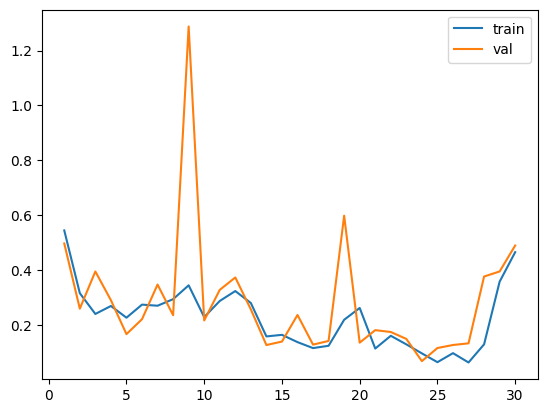

100%|██████████| 125/125 [00:01<00:00, 92.93it/s]


accuracy:0.7093333333333334, precision:1.0, recall:0.128, f1:0.22695035460992907
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 92.60it/s]


accuracy:0.7253333333333334, precision:1.0, recall:0.176, f1:0.29931972789115646
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 94.99it/s]


accuracy:0.7306666666666667, precision:1.0, recall:0.192, f1:0.32214765100671144
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 101.93it/s]


accuracy:0.7306666666666667, precision:1.0, recall:0.192, f1:0.32214765100671144
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 102.47it/s]


accuracy:0.736, precision:1.0, recall:0.208, f1:0.3443708609271523
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 102.94it/s]


accuracy:0.7386666666666667, precision:1.0, recall:0.216, f1:0.35526315789473684
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 102.37it/s]


accuracy:0.736, precision:0.9333333333333333, recall:0.224, f1:0.3612903225806452
Current threshold:0.08, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 102.25it/s]


accuracy:0.736, precision:0.8823529411764706, recall:0.24, f1:0.37735849056603776
Current threshold:0.09, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 102.38it/s]


accuracy:0.7386666666666667, precision:0.8648648648648649, recall:0.256, f1:0.39506172839506176
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:01<00:00, 103.00it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 98.76it/s]


accuracy:0.7386666666666667, precision:0.8461538461538461, recall:0.264, f1:0.402439024390244
Current threshold:0.11999999999999998, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 92.71it/s]


accuracy:0.736, precision:0.825, recall:0.264, f1:0.4
Current threshold:0.12999999999999998, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 94.25it/s]


accuracy:0.7306666666666667, precision:0.7857142857142857, recall:0.264, f1:0.3952095808383233
Current threshold:0.13999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 99.16it/s] 


accuracy:0.7386666666666667, precision:0.7872340425531915, recall:0.296, f1:0.43023255813953487
Current threshold:0.15, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 102.77it/s]


accuracy:0.7413333333333333, precision:0.7916666666666666, recall:0.304, f1:0.4393063583815029
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 103.33it/s]


accuracy:0.7333333333333333, precision:0.7450980392156863, recall:0.304, f1:0.4318181818181818
Current threshold:0.17, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 102.96it/s]


accuracy:0.736, precision:0.75, recall:0.312, f1:0.44067796610169485
Current threshold:0.18000000000000002, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 102.83it/s]


accuracy:0.736, precision:0.75, recall:0.312, f1:0.44067796610169485
Current threshold:0.19000000000000003, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 103.32it/s]


accuracy:0.7413333333333333, precision:0.7592592592592593, recall:0.328, f1:0.4581005586592179
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:01<00:00, 102.83it/s]


accuracy:0.7413333333333333, precision:0.7592592592592593, recall:0.328, f1:0.4581005586592179
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 103.05it/s]


accuracy:0.7413333333333333, precision:0.7592592592592593, recall:0.328, f1:0.4581005586592179
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:01<00:00, 97.07it/s]


accuracy:0.7413333333333333, precision:0.75, recall:0.336, f1:0.46408839779005523
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:01<00:00, 91.59it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:01<00:00, 92.07it/s]


accuracy:0.7546666666666667, precision:0.7704918032786885, recall:0.376, f1:0.5053763440860214
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.28it/s]


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:0.26000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.40it/s]


accuracy:0.752, precision:0.75, recall:0.384, f1:0.507936507936508
Current threshold:0.2700000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.85it/s]


accuracy:0.752, precision:0.75, recall:0.384, f1:0.507936507936508
Current threshold:0.2800000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.30it/s]


accuracy:0.752, precision:0.75, recall:0.384, f1:0.507936507936508
Current threshold:0.2900000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.32it/s]


accuracy:0.7493333333333333, precision:0.7384615384615385, recall:0.384, f1:0.505263157894737
Current threshold:0.3000000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.21it/s]


accuracy:0.7466666666666667, precision:0.7272727272727273, recall:0.384, f1:0.5026178010471204
Current threshold:0.3100000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.16it/s]


accuracy:0.744, precision:0.7101449275362319, recall:0.392, f1:0.5051546391752578
Current threshold:0.3200000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.56it/s]


accuracy:0.744, precision:0.6986301369863014, recall:0.408, f1:0.5151515151515151
Current threshold:0.3300000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.61it/s]


accuracy:0.7466666666666667, precision:0.6973684210526315, recall:0.424, f1:0.5273631840796019
Current threshold:0.34000000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.06it/s]


accuracy:0.7493333333333333, precision:0.7012987012987013, recall:0.432, f1:0.5346534653465347
Current threshold:0.35000000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.92it/s]


accuracy:0.752, precision:0.7051282051282052, recall:0.44, f1:0.541871921182266
Current threshold:0.36000000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.25it/s]


accuracy:0.752, precision:0.7051282051282052, recall:0.44, f1:0.541871921182266
Current threshold:0.37000000000000016, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.68it/s]


accuracy:0.752, precision:0.7, recall:0.448, f1:0.5463414634146342
Current threshold:0.38000000000000017, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.29it/s]


accuracy:0.752, precision:0.7, recall:0.448, f1:0.5463414634146342
Current threshold:0.3900000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.46it/s]


accuracy:0.7466666666666667, precision:0.6829268292682927, recall:0.448, f1:0.5410628019323672
Current threshold:0.4000000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.18it/s]


accuracy:0.744, precision:0.6746987951807228, recall:0.448, f1:0.5384615384615384
Current threshold:0.4100000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.92it/s]


accuracy:0.7413333333333333, precision:0.6666666666666666, recall:0.448, f1:0.5358851674641147
Current threshold:0.4200000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.65it/s]


accuracy:0.736, precision:0.6511627906976745, recall:0.448, f1:0.5308056872037915
Current threshold:0.4300000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.736, precision:0.6511627906976745, recall:0.448, f1:0.5308056872037915
Current threshold:0.4400000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.10it/s]


accuracy:0.7306666666666667, precision:0.6363636363636364, recall:0.448, f1:0.5258215962441315
Current threshold:0.45000000000000023, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.42it/s]


accuracy:0.7306666666666667, precision:0.6304347826086957, recall:0.464, f1:0.5345622119815668
Current threshold:0.46000000000000024, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 97.82it/s] 


accuracy:0.728, precision:0.6236559139784946, recall:0.464, f1:0.5321100917431193
Current threshold:0.47000000000000025, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.86it/s]


accuracy:0.7333333333333333, precision:0.631578947368421, recall:0.48, f1:0.5454545454545454
Current threshold:0.48000000000000026, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.85it/s]


accuracy:0.7333333333333333, precision:0.6288659793814433, recall:0.488, f1:0.5495495495495496
Current threshold:0.49000000000000027, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.71it/s]


accuracy:0.7306666666666667, precision:0.6224489795918368, recall:0.488, f1:0.547085201793722
Current threshold:0.5000000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.13it/s]


accuracy:0.7333333333333333, precision:0.6262626262626263, recall:0.496, f1:0.5535714285714286
Current threshold:0.5100000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.40it/s]


accuracy:0.7333333333333333, precision:0.6262626262626263, recall:0.496, f1:0.5535714285714286
Current threshold:0.5200000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.94it/s]


accuracy:0.736, precision:0.63, recall:0.504, f1:0.56
Current threshold:0.5300000000000002, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.75it/s]


accuracy:0.736, precision:0.63, recall:0.504, f1:0.56
Current threshold:0.5400000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 97.49it/s]


accuracy:0.7386666666666667, precision:0.6336633663366337, recall:0.512, f1:0.5663716814159292
Current threshold:0.5500000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.53it/s]


accuracy:0.736, precision:0.6274509803921569, recall:0.512, f1:0.5638766519823789
Current threshold:0.5600000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.18it/s]


accuracy:0.736, precision:0.625, recall:0.52, f1:0.5676855895196506
Current threshold:0.5700000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.7333333333333333, precision:0.6190476190476191, recall:0.52, f1:0.5652173913043478
Current threshold:0.5800000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.00it/s]


accuracy:0.736, precision:0.6226415094339622, recall:0.528, f1:0.5714285714285714
Current threshold:0.5900000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.02it/s]


accuracy:0.736, precision:0.6226415094339622, recall:0.528, f1:0.5714285714285714
Current threshold:0.6000000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.08it/s]


accuracy:0.736, precision:0.6203703703703703, recall:0.536, f1:0.5751072961373391
Current threshold:0.6100000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.23it/s]


accuracy:0.736, precision:0.6203703703703703, recall:0.536, f1:0.5751072961373391
Current threshold:0.6200000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.82it/s]


accuracy:0.736, precision:0.6203703703703703, recall:0.536, f1:0.5751072961373391
Current threshold:0.6300000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.80it/s]


accuracy:0.7333333333333333, precision:0.6126126126126126, recall:0.544, f1:0.576271186440678
Current threshold:0.6400000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.68it/s]


accuracy:0.7333333333333333, precision:0.6126126126126126, recall:0.544, f1:0.576271186440678
Current threshold:0.6500000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.69it/s]


accuracy:0.7333333333333333, precision:0.6126126126126126, recall:0.544, f1:0.576271186440678
Current threshold:0.6600000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.98it/s]


accuracy:0.7333333333333333, precision:0.6126126126126126, recall:0.544, f1:0.576271186440678
Current threshold:0.6700000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 96.02it/s]


accuracy:0.7306666666666667, precision:0.6071428571428571, recall:0.544, f1:0.5738396624472574
Current threshold:0.6800000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.49it/s]


accuracy:0.728, precision:0.6, recall:0.552, f1:0.575
Current threshold:0.6900000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.93it/s]


accuracy:0.7253333333333334, precision:0.5948275862068966, recall:0.552, f1:0.5726141078838174
Current threshold:0.7000000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.61it/s]


accuracy:0.7253333333333334, precision:0.5948275862068966, recall:0.552, f1:0.5726141078838174
Current threshold:0.7100000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.50it/s]


accuracy:0.7253333333333334, precision:0.5948275862068966, recall:0.552, f1:0.5726141078838174
Current threshold:0.7200000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.94it/s]


accuracy:0.7253333333333334, precision:0.5948275862068966, recall:0.552, f1:0.5726141078838174
Current threshold:0.7300000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.02it/s]


accuracy:0.728, precision:0.5982905982905983, recall:0.56, f1:0.5785123966942148
Current threshold:0.7400000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.99it/s]


accuracy:0.728, precision:0.5982905982905983, recall:0.56, f1:0.5785123966942148
Current threshold:0.7500000000000004, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.728, precision:0.5982905982905983, recall:0.56, f1:0.5785123966942148
Current threshold:0.7600000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.18it/s]


accuracy:0.7253333333333334, precision:0.5932203389830508, recall:0.56, f1:0.5761316872427984
Current threshold:0.7700000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.06it/s]


accuracy:0.7226666666666667, precision:0.5867768595041323, recall:0.568, f1:0.5772357723577235
Current threshold:0.7800000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 96.81it/s] 


accuracy:0.72, precision:0.5819672131147541, recall:0.568, f1:0.5748987854251012
Current threshold:0.7900000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.86it/s]


accuracy:0.72, precision:0.5819672131147541, recall:0.568, f1:0.5748987854251012
Current threshold:0.8000000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.50it/s]


accuracy:0.7173333333333334, precision:0.5772357723577236, recall:0.568, f1:0.5725806451612903
Current threshold:0.8100000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.93it/s]


accuracy:0.7226666666666667, precision:0.584, recall:0.584, f1:0.584
Current threshold:0.8200000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.06it/s]


accuracy:0.7226666666666667, precision:0.584, recall:0.584, f1:0.584
Current threshold:0.8300000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.46it/s]


accuracy:0.72, precision:0.5793650793650794, recall:0.584, f1:0.5816733067729084
Current threshold:0.8400000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.19it/s]


accuracy:0.7173333333333334, precision:0.5748031496062992, recall:0.584, f1:0.5793650793650793
Current threshold:0.8500000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.52it/s]


accuracy:0.712, precision:0.5658914728682171, recall:0.584, f1:0.5748031496062992
Current threshold:0.8600000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 99.41it/s]


accuracy:0.7146666666666667, precision:0.5692307692307692, recall:0.592, f1:0.580392156862745
Current threshold:0.8700000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.26it/s]


accuracy:0.7066666666666667, precision:0.556390977443609, recall:0.592, f1:0.5736434108527131
Current threshold:0.8800000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.45it/s]


accuracy:0.7066666666666667, precision:0.556390977443609, recall:0.592, f1:0.5736434108527131
Current threshold:0.8900000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.45it/s]


accuracy:0.704, precision:0.5522388059701493, recall:0.592, f1:0.5714285714285714
Current threshold:0.9000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.29it/s]


accuracy:0.704, precision:0.5522388059701493, recall:0.592, f1:0.5714285714285714
Current threshold:0.9100000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.89it/s]


accuracy:0.704, precision:0.5522388059701493, recall:0.592, f1:0.5714285714285714
Current threshold:0.9200000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.41it/s]


accuracy:0.704, precision:0.5522388059701493, recall:0.592, f1:0.5714285714285714
Current threshold:0.9300000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.69it/s]


accuracy:0.704, precision:0.5522388059701493, recall:0.592, f1:0.5714285714285714
Current threshold:0.9400000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.12it/s]


accuracy:0.7066666666666667, precision:0.5555555555555556, recall:0.6, f1:0.576923076923077
Current threshold:0.9500000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.31it/s]


accuracy:0.7066666666666667, precision:0.5555555555555556, recall:0.6, f1:0.576923076923077
Current threshold:0.9600000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.49it/s]


accuracy:0.7066666666666667, precision:0.5547445255474452, recall:0.608, f1:0.5801526717557253
Current threshold:0.9700000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.79it/s]


accuracy:0.7066666666666667, precision:0.5547445255474452, recall:0.608, f1:0.5801526717557253
Current threshold:0.9800000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.17it/s]


accuracy:0.7066666666666667, precision:0.5539568345323741, recall:0.616, f1:0.5833333333333333
Current threshold:0.9900000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.12it/s]


accuracy:0.7013333333333334, precision:0.5460992907801419, recall:0.616, f1:0.5789473684210527
Current threshold:1.0000000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.04it/s]


accuracy:0.696, precision:0.5384615384615384, recall:0.616, f1:0.5746268656716418
Current threshold:1.0100000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.27it/s]


accuracy:0.7013333333333334, precision:0.5448275862068965, recall:0.632, f1:0.5851851851851851
Current threshold:1.0200000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.73it/s]


accuracy:0.6986666666666667, precision:0.541095890410959, recall:0.632, f1:0.5830258302583027
Current threshold:1.0300000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.02it/s]


accuracy:0.6986666666666667, precision:0.541095890410959, recall:0.632, f1:0.5830258302583027
Current threshold:1.0400000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.92it/s]


accuracy:0.696, precision:0.5374149659863946, recall:0.632, f1:0.5808823529411765
Current threshold:1.0500000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.71it/s]


accuracy:0.696, precision:0.5374149659863946, recall:0.632, f1:0.5808823529411765
Current threshold:1.0600000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.696, precision:0.5374149659863946, recall:0.632, f1:0.5808823529411765
Current threshold:1.0700000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.696, precision:0.5374149659863946, recall:0.632, f1:0.5808823529411765
Current threshold:1.0800000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.72it/s]


accuracy:0.6933333333333334, precision:0.5337837837837838, recall:0.632, f1:0.5787545787545787
Current threshold:1.0900000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.20it/s]


accuracy:0.6933333333333334, precision:0.5337837837837838, recall:0.632, f1:0.5787545787545787
Current threshold:1.1000000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.34it/s] 


accuracy:0.6906666666666667, precision:0.5302013422818792, recall:0.632, f1:0.5766423357664233
Current threshold:1.1100000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.72it/s]


accuracy:0.6853333333333333, precision:0.5231788079470199, recall:0.632, f1:0.5724637681159421
Current threshold:1.1200000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.22it/s]


accuracy:0.68, precision:0.5163398692810458, recall:0.632, f1:0.5683453237410072
Current threshold:1.1300000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.54it/s]


accuracy:0.6773333333333333, precision:0.512987012987013, recall:0.632, f1:0.5663082437275986
Current threshold:1.1400000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.60it/s]


accuracy:0.6746666666666666, precision:0.5096774193548387, recall:0.632, f1:0.5642857142857143
Current threshold:1.1500000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.31it/s]


accuracy:0.6746666666666666, precision:0.5096774193548387, recall:0.632, f1:0.5642857142857143
Current threshold:1.1600000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.89it/s]


accuracy:0.672, precision:0.5064102564102564, recall:0.632, f1:0.5622775800711742
Current threshold:1.1700000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.51it/s]


accuracy:0.6693333333333333, precision:0.5031847133757962, recall:0.632, f1:0.5602836879432624
Current threshold:1.1800000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.77it/s]


accuracy:0.6693333333333333, precision:0.5031847133757962, recall:0.632, f1:0.5602836879432624
Current threshold:1.1900000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 91.23it/s]


accuracy:0.6693333333333333, precision:0.5031847133757962, recall:0.632, f1:0.5602836879432624
Current threshold:1.2000000000000008, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.51it/s]


accuracy:0.6666666666666666, precision:0.5, recall:0.632, f1:0.558303886925795
Current threshold:1.2100000000000009, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.70it/s] 


accuracy:0.6613333333333333, precision:0.49375, recall:0.632, f1:0.5543859649122806
Current threshold:1.2200000000000009, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.17it/s]


accuracy:0.6613333333333333, precision:0.49375, recall:0.632, f1:0.5543859649122806
Current threshold:1.2300000000000009, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.6613333333333333, precision:0.49375, recall:0.632, f1:0.5543859649122806
Current threshold:1.2400000000000009, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.74it/s]


accuracy:0.6613333333333333, precision:0.49375, recall:0.632, f1:0.5543859649122806
Current threshold:1.2500000000000009, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.60it/s]


accuracy:0.6586666666666666, precision:0.4906832298136646, recall:0.632, f1:0.5524475524475524
Current threshold:1.260000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.26it/s]


accuracy:0.6586666666666666, precision:0.4906832298136646, recall:0.632, f1:0.5524475524475524
Current threshold:1.270000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.02it/s]


accuracy:0.656, precision:0.4876543209876543, recall:0.632, f1:0.5505226480836237
Current threshold:1.280000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.51it/s]


accuracy:0.656, precision:0.4876543209876543, recall:0.632, f1:0.5505226480836237
Current threshold:1.290000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 96.64it/s]


accuracy:0.656, precision:0.4876543209876543, recall:0.632, f1:0.5505226480836237
Current threshold:1.300000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.72it/s]


accuracy:0.656, precision:0.4876543209876543, recall:0.632, f1:0.5505226480836237
Current threshold:1.310000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.70it/s]


accuracy:0.656, precision:0.4876543209876543, recall:0.632, f1:0.5505226480836237
Current threshold:1.320000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.6586666666666666, precision:0.49079754601226994, recall:0.64, f1:0.5555555555555556
Current threshold:1.330000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.71it/s]


accuracy:0.656, precision:0.4878048780487805, recall:0.64, f1:0.5536332179930795
Current threshold:1.340000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.09it/s]


accuracy:0.656, precision:0.4878048780487805, recall:0.64, f1:0.5536332179930795
Current threshold:1.350000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.94it/s]


accuracy:0.656, precision:0.4878048780487805, recall:0.64, f1:0.5536332179930795
Current threshold:1.360000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.34it/s]


accuracy:0.656, precision:0.4878048780487805, recall:0.64, f1:0.5536332179930795
Current threshold:1.370000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.99it/s]


accuracy:0.6533333333333333, precision:0.48484848484848486, recall:0.64, f1:0.5517241379310344
Current threshold:1.380000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.43it/s]


accuracy:0.6533333333333333, precision:0.48484848484848486, recall:0.64, f1:0.5517241379310344
Current threshold:1.390000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.82it/s]


accuracy:0.656, precision:0.4879518072289157, recall:0.648, f1:0.5567010309278351
Current threshold:1.400000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.81it/s]


accuracy:0.656, precision:0.4879518072289157, recall:0.648, f1:0.5567010309278351
Current threshold:1.410000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.45it/s]


accuracy:0.6586666666666666, precision:0.49101796407185627, recall:0.656, f1:0.5616438356164384
Current threshold:1.420000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.24it/s]


accuracy:0.6586666666666666, precision:0.49101796407185627, recall:0.656, f1:0.5616438356164384
Current threshold:1.430000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.13it/s]


accuracy:0.6586666666666666, precision:0.49101796407185627, recall:0.656, f1:0.5616438356164384
Current threshold:1.440000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.82it/s]


accuracy:0.6586666666666666, precision:0.49101796407185627, recall:0.656, f1:0.5616438356164384
Current threshold:1.450000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.54it/s]


accuracy:0.6586666666666666, precision:0.49101796407185627, recall:0.656, f1:0.5616438356164384
Current threshold:1.460000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.67it/s]


accuracy:0.6586666666666666, precision:0.49101796407185627, recall:0.656, f1:0.5616438356164384
Current threshold:1.470000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.88it/s]


accuracy:0.656, precision:0.4880952380952381, recall:0.656, f1:0.5597269624573379
Current threshold:1.480000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.22it/s]


accuracy:0.656, precision:0.4880952380952381, recall:0.656, f1:0.5597269624573379
Current threshold:1.490000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.09it/s]


accuracy:0.656, precision:0.4880952380952381, recall:0.656, f1:0.5597269624573379
Current threshold:1.500000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 99.42it/s]


accuracy:0.6533333333333333, precision:0.48520710059171596, recall:0.656, f1:0.5578231292517007
Current threshold:1.5100000000000011, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.53it/s]


accuracy:0.6533333333333333, precision:0.48520710059171596, recall:0.656, f1:0.5578231292517007
Current threshold:1.5200000000000011, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.10it/s]


accuracy:0.6506666666666666, precision:0.4823529411764706, recall:0.656, f1:0.5559322033898305
Current threshold:1.5300000000000011, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 99.33it/s] 


accuracy:0.648, precision:0.4797687861271676, recall:0.664, f1:0.5570469798657718
Current threshold:1.5400000000000011, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.6453333333333333, precision:0.47701149425287354, recall:0.664, f1:0.5551839464882944
Current threshold:1.5500000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.54it/s]


accuracy:0.6453333333333333, precision:0.47701149425287354, recall:0.664, f1:0.5551839464882944
Current threshold:1.5600000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.63it/s]


accuracy:0.6453333333333333, precision:0.47701149425287354, recall:0.664, f1:0.5551839464882944
Current threshold:1.5700000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.60it/s]


accuracy:0.648, precision:0.48, recall:0.672, f1:0.5599999999999999
Current threshold:1.5800000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.79it/s]


accuracy:0.648, precision:0.48, recall:0.672, f1:0.5599999999999999
Current threshold:1.5900000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.50it/s]


accuracy:0.648, precision:0.48, recall:0.672, f1:0.5599999999999999
Current threshold:1.6000000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.56it/s]


accuracy:0.6453333333333333, precision:0.4772727272727273, recall:0.672, f1:0.558139534883721
Current threshold:1.6100000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.63it/s]


accuracy:0.6453333333333333, precision:0.4772727272727273, recall:0.672, f1:0.558139534883721
Current threshold:1.6200000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 89.93it/s]


accuracy:0.6453333333333333, precision:0.4772727272727273, recall:0.672, f1:0.558139534883721
Current threshold:1.6300000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.52it/s]


accuracy:0.6426666666666667, precision:0.4745762711864407, recall:0.672, f1:0.5562913907284769
Current threshold:1.6400000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.21it/s]


accuracy:0.64, precision:0.47191011235955055, recall:0.672, f1:0.5544554455445545
Current threshold:1.6500000000000012, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.20it/s]


accuracy:0.6426666666666667, precision:0.4748603351955307, recall:0.68, f1:0.5592105263157896
Current threshold:1.6600000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.68it/s]


accuracy:0.64, precision:0.4722222222222222, recall:0.68, f1:0.5573770491803278
Current threshold:1.6700000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.6426666666666667, precision:0.47513812154696133, recall:0.688, f1:0.5620915032679739
Current threshold:1.6800000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.09it/s]


accuracy:0.6426666666666667, precision:0.47513812154696133, recall:0.688, f1:0.5620915032679739
Current threshold:1.6900000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.96it/s]


accuracy:0.6426666666666667, precision:0.47513812154696133, recall:0.688, f1:0.5620915032679739
Current threshold:1.7000000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.19it/s]


accuracy:0.6426666666666667, precision:0.47513812154696133, recall:0.688, f1:0.5620915032679739
Current threshold:1.7100000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.35it/s]


accuracy:0.6426666666666667, precision:0.47513812154696133, recall:0.688, f1:0.5620915032679739
Current threshold:1.7200000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.17it/s]


accuracy:0.6453333333333333, precision:0.47802197802197804, recall:0.696, f1:0.5667752442996742
Current threshold:1.7300000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.56it/s]


accuracy:0.6426666666666667, precision:0.47540983606557374, recall:0.696, f1:0.5649350649350648
Current threshold:1.7400000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.56it/s]


accuracy:0.6426666666666667, precision:0.47540983606557374, recall:0.696, f1:0.5649350649350648
Current threshold:1.7500000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.05it/s]


accuracy:0.6426666666666667, precision:0.4756756756756757, recall:0.704, f1:0.567741935483871
Current threshold:1.7600000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.57it/s]


accuracy:0.6453333333333333, precision:0.4787234042553192, recall:0.72, f1:0.5750798722044728
Current threshold:1.7700000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.6506666666666666, precision:0.4842105263157895, recall:0.736, f1:0.5841269841269842
Current threshold:1.7800000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.08it/s]


accuracy:0.6506666666666666, precision:0.4842105263157895, recall:0.736, f1:0.5841269841269842
Current threshold:1.7900000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.32it/s]


accuracy:0.6506666666666666, precision:0.4842105263157895, recall:0.736, f1:0.5841269841269842
Current threshold:1.8000000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.60it/s]


accuracy:0.6506666666666666, precision:0.4842105263157895, recall:0.736, f1:0.5841269841269842
Current threshold:1.8100000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.15it/s]


accuracy:0.6506666666666666, precision:0.4842105263157895, recall:0.736, f1:0.5841269841269842
Current threshold:1.8200000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.67it/s]


accuracy:0.648, precision:0.4816753926701571, recall:0.736, f1:0.5822784810126582
Current threshold:1.8300000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 96.24it/s]


accuracy:0.648, precision:0.4816753926701571, recall:0.736, f1:0.5822784810126582
Current threshold:1.8400000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.28it/s]


accuracy:0.648, precision:0.4816753926701571, recall:0.736, f1:0.5822784810126582
Current threshold:1.8500000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 96.46it/s] 


accuracy:0.6533333333333333, precision:0.48704663212435234, recall:0.752, f1:0.5911949685534591
Current threshold:1.8600000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.75it/s]


accuracy:0.6506666666666666, precision:0.4845360824742268, recall:0.752, f1:0.5893416927899686
Current threshold:1.8700000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.22it/s]


accuracy:0.6506666666666666, precision:0.4845360824742268, recall:0.752, f1:0.5893416927899686
Current threshold:1.8800000000000014, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.6506666666666666, precision:0.4845360824742268, recall:0.752, f1:0.5893416927899686
Current threshold:1.8900000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.6533333333333333, precision:0.48717948717948717, recall:0.76, f1:0.59375
Current threshold:1.9000000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.19it/s]


accuracy:0.6533333333333333, precision:0.48717948717948717, recall:0.76, f1:0.59375
Current threshold:1.9100000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.69it/s]


accuracy:0.6506666666666666, precision:0.4846938775510204, recall:0.76, f1:0.5919003115264797
Current threshold:1.9200000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.6453333333333333, precision:0.4797979797979798, recall:0.76, f1:0.5882352941176471
Current threshold:1.9300000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 96.61it/s]


accuracy:0.6426666666666667, precision:0.47738693467336685, recall:0.76, f1:0.5864197530864198
Current threshold:1.9400000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.27it/s]


accuracy:0.6426666666666667, precision:0.47738693467336685, recall:0.76, f1:0.5864197530864198
Current threshold:1.9500000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.39it/s]


accuracy:0.64, precision:0.475, recall:0.76, f1:0.5846153846153846
Current threshold:1.9600000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.17it/s]


accuracy:0.64, precision:0.475, recall:0.76, f1:0.5846153846153846
Current threshold:1.9700000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


accuracy:0.64, precision:0.475, recall:0.76, f1:0.5846153846153846
Current threshold:1.9800000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.79it/s]


accuracy:0.6373333333333333, precision:0.472636815920398, recall:0.76, f1:0.5828220858895706
Current threshold:1.9900000000000015, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.6373333333333333, precision:0.472636815920398, recall:0.76, f1:0.5828220858895706
Current threshold:2.0000000000000013, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.13it/s]


accuracy:0.6373333333333333, precision:0.472636815920398, recall:0.76, f1:0.5828220858895706
Current threshold:2.010000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.6373333333333333, precision:0.472636815920398, recall:0.76, f1:0.5828220858895706
Current threshold:2.020000000000001, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.49it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.0300000000000007, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.75it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.0400000000000005, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.10it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.0500000000000003, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.94it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.06, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.60it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.07, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.63it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.0799999999999996, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.68it/s]


accuracy:0.632, precision:0.46798029556650245, recall:0.76, f1:0.5792682926829268
Current threshold:2.0899999999999994, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.96it/s]


accuracy:0.6346666666666667, precision:0.47058823529411764, recall:0.768, f1:0.5835866261398177
Current threshold:2.099999999999999, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.86it/s]


accuracy:0.6293333333333333, precision:0.46601941747572817, recall:0.768, f1:0.5800604229607251
Current threshold:2.109999999999999, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.632, precision:0.46859903381642515, recall:0.776, f1:0.5843373493975903
Current threshold:2.1199999999999988, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.632, precision:0.46859903381642515, recall:0.776, f1:0.5843373493975903
Current threshold:2.1299999999999986, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.94it/s]


accuracy:0.6293333333333333, precision:0.46634615384615385, recall:0.776, f1:0.5825825825825826
Current threshold:2.1399999999999983, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.33it/s]


accuracy:0.6266666666666667, precision:0.46445497630331756, recall:0.784, f1:0.5833333333333334
Current threshold:2.149999999999998, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 91.72it/s]


accuracy:0.6266666666666667, precision:0.46445497630331756, recall:0.784, f1:0.5833333333333334
Current threshold:2.159999999999998, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.71it/s]


accuracy:0.6266666666666667, precision:0.46445497630331756, recall:0.784, f1:0.5833333333333334
Current threshold:2.1699999999999977, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.23it/s]


accuracy:0.6266666666666667, precision:0.46445497630331756, recall:0.784, f1:0.5833333333333334
Current threshold:2.1799999999999975, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.06it/s]


accuracy:0.6266666666666667, precision:0.46445497630331756, recall:0.784, f1:0.5833333333333334
Current threshold:2.1899999999999973, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.86it/s]


accuracy:0.6293333333333333, precision:0.4669811320754717, recall:0.792, f1:0.5875370919881305
Current threshold:2.199999999999997, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.33it/s]


accuracy:0.6293333333333333, precision:0.4669811320754717, recall:0.792, f1:0.5875370919881305
Current threshold:2.209999999999997, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.98it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.2199999999999966, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.74it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.2299999999999964, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.58it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.239999999999996, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.03it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.249999999999996, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 99.49it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.259999999999996, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.54it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.2699999999999956, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.77it/s]


accuracy:0.632, precision:0.4694835680751174, recall:0.8, f1:0.5917159763313611
Current threshold:2.2799999999999954, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 97.00it/s] 


accuracy:0.6346666666666667, precision:0.4719626168224299, recall:0.808, f1:0.5958702064896756
Current threshold:2.289999999999995, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.13it/s]


accuracy:0.6373333333333333, precision:0.4744186046511628, recall:0.816, f1:0.6
Current threshold:2.299999999999995, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.90it/s]


accuracy:0.6373333333333333, precision:0.4744186046511628, recall:0.816, f1:0.6
Current threshold:2.3099999999999947, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.72it/s]


accuracy:0.6373333333333333, precision:0.47465437788018433, recall:0.824, f1:0.6023391812865497
Current threshold:2.3199999999999945, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.50it/s]


accuracy:0.6346666666666667, precision:0.4724770642201835, recall:0.824, f1:0.6005830903790087
Current threshold:2.3299999999999943, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.04it/s]


accuracy:0.6346666666666667, precision:0.4724770642201835, recall:0.824, f1:0.6005830903790087
Current threshold:2.339999999999994, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.93it/s]


accuracy:0.6346666666666667, precision:0.4724770642201835, recall:0.824, f1:0.6005830903790087
Current threshold:2.349999999999994, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.23it/s]


accuracy:0.6346666666666667, precision:0.4724770642201835, recall:0.824, f1:0.6005830903790087
Current threshold:2.3599999999999937, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.81it/s]


accuracy:0.6346666666666667, precision:0.4724770642201835, recall:0.824, f1:0.6005830903790087
Current threshold:2.3699999999999934, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.27it/s]


accuracy:0.6373333333333333, precision:0.4748858447488584, recall:0.832, f1:0.6046511627906977
Current threshold:2.3799999999999932, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.83it/s]


accuracy:0.64, precision:0.4772727272727273, recall:0.84, f1:0.6086956521739131
Current threshold:2.389999999999993, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 99.38it/s] 


accuracy:0.64, precision:0.4772727272727273, recall:0.84, f1:0.6086956521739131
Current threshold:2.399999999999993, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.69it/s]


accuracy:0.64, precision:0.4772727272727273, recall:0.84, f1:0.6086956521739131
Current threshold:2.4099999999999926, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.52it/s]


accuracy:0.64, precision:0.4774774774774775, recall:0.848, f1:0.6109510086455332
Current threshold:2.4199999999999924, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.23it/s]


accuracy:0.6373333333333333, precision:0.47533632286995514, recall:0.848, f1:0.6091954022988505
Current threshold:2.429999999999992, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.59it/s]


accuracy:0.6346666666666667, precision:0.4732142857142857, recall:0.848, f1:0.6074498567335244
Current threshold:2.439999999999992, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.6346666666666667, precision:0.4732142857142857, recall:0.848, f1:0.6074498567335244
Current threshold:2.4499999999999917, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.85it/s]


accuracy:0.632, precision:0.4711111111111111, recall:0.848, f1:0.6057142857142856
Current threshold:2.4599999999999915, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.70it/s]


accuracy:0.6346666666666667, precision:0.47345132743362833, recall:0.856, f1:0.6096866096866096
Current threshold:2.4699999999999913, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.23it/s]


accuracy:0.6346666666666667, precision:0.47345132743362833, recall:0.856, f1:0.6096866096866096
Current threshold:2.479999999999991, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.90it/s]


accuracy:0.632, precision:0.4713656387665198, recall:0.856, f1:0.6079545454545454
Current threshold:2.489999999999991, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 92.34it/s]


accuracy:0.632, precision:0.4713656387665198, recall:0.856, f1:0.6079545454545454
Current threshold:2.4999999999999907, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.81it/s]


accuracy:0.6293333333333333, precision:0.46956521739130436, recall:0.864, f1:0.6084507042253521
Current threshold:2.5099999999999905, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.65it/s]


accuracy:0.6266666666666667, precision:0.4675324675324675, recall:0.864, f1:0.6067415730337078
Current threshold:2.5199999999999902, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.52999999999999, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.92it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.53999999999999, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.5499999999999896, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.62it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.5599999999999894, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.05it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.569999999999989, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.66it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.579999999999989, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.47it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.5899999999999888, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.35it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.5999999999999885, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.81it/s] 


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.6099999999999883, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.46it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.619999999999988, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.57it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.629999999999988, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.19it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.6399999999999877, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.23it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.6499999999999875, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.47it/s]


accuracy:0.6293333333333333, precision:0.4698275862068966, recall:0.872, f1:0.6106442577030812
Current threshold:2.6599999999999873, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.07it/s]


accuracy:0.632, precision:0.4721030042918455, recall:0.88, f1:0.6145251396648044
Current threshold:2.669999999999987, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.29it/s]


accuracy:0.6293333333333333, precision:0.4700854700854701, recall:0.88, f1:0.6128133704735376
Current threshold:2.679999999999987, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.91it/s]


accuracy:0.6293333333333333, precision:0.4700854700854701, recall:0.88, f1:0.6128133704735376
Current threshold:2.6899999999999866, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.15it/s]


accuracy:0.6293333333333333, precision:0.4700854700854701, recall:0.88, f1:0.6128133704735376
Current threshold:2.6999999999999864, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.09it/s]


accuracy:0.6293333333333333, precision:0.4700854700854701, recall:0.88, f1:0.6128133704735376
Current threshold:2.709999999999986, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 98.46it/s] 


accuracy:0.6293333333333333, precision:0.4700854700854701, recall:0.88, f1:0.6128133704735376
Current threshold:2.719999999999986, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.6266666666666667, precision:0.46808510638297873, recall:0.88, f1:0.6111111111111112
Current threshold:2.7299999999999858, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.24it/s]


accuracy:0.6266666666666667, precision:0.46808510638297873, recall:0.88, f1:0.6111111111111112
Current threshold:2.7399999999999856, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.38it/s]


accuracy:0.6266666666666667, precision:0.46808510638297873, recall:0.88, f1:0.6111111111111112
Current threshold:2.7499999999999853, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.89it/s]


accuracy:0.6266666666666667, precision:0.46808510638297873, recall:0.88, f1:0.6111111111111112
Current threshold:2.759999999999985, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.60it/s]


accuracy:0.6266666666666667, precision:0.46808510638297873, recall:0.88, f1:0.6111111111111112
Current threshold:2.769999999999985, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.69it/s]


accuracy:0.6266666666666667, precision:0.46808510638297873, recall:0.88, f1:0.6111111111111112
Current threshold:2.7799999999999847, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.624, precision:0.4661016949152542, recall:0.88, f1:0.6094182825484764
Current threshold:2.7899999999999845, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.07it/s]


accuracy:0.624, precision:0.4661016949152542, recall:0.88, f1:0.6094182825484764
Current threshold:2.7999999999999843, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 91.53it/s]


accuracy:0.624, precision:0.4661016949152542, recall:0.88, f1:0.6094182825484764
Current threshold:2.809999999999984, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 93.22it/s]


accuracy:0.624, precision:0.4661016949152542, recall:0.88, f1:0.6094182825484764
Current threshold:2.819999999999984, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.49it/s]


accuracy:0.6213333333333333, precision:0.4641350210970464, recall:0.88, f1:0.6077348066298343
Current threshold:2.8299999999999836, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.6213333333333333, precision:0.4641350210970464, recall:0.88, f1:0.6077348066298343
Current threshold:2.8399999999999834, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.06it/s]


accuracy:0.624, precision:0.46638655462184875, recall:0.888, f1:0.6115702479338844
Current threshold:2.849999999999983, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.98it/s]


accuracy:0.6213333333333333, precision:0.46443514644351463, recall:0.888, f1:0.6098901098901098
Current threshold:2.859999999999983, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.66it/s]


accuracy:0.6213333333333333, precision:0.46443514644351463, recall:0.888, f1:0.6098901098901098
Current threshold:2.869999999999983, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.14it/s]


accuracy:0.6213333333333333, precision:0.46443514644351463, recall:0.888, f1:0.6098901098901098
Current threshold:2.8799999999999826, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.616, precision:0.4605809128630705, recall:0.888, f1:0.6065573770491803
Current threshold:2.8899999999999824, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.92it/s]


accuracy:0.6133333333333333, precision:0.45867768595041325, recall:0.888, f1:0.6049046321525886
Current threshold:2.899999999999982, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.53it/s]


accuracy:0.6106666666666667, precision:0.4567901234567901, recall:0.888, f1:0.6032608695652174
Current threshold:2.909999999999982, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.16it/s]


accuracy:0.6106666666666667, precision:0.4567901234567901, recall:0.888, f1:0.6032608695652174
Current threshold:2.9199999999999817, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 91.16it/s]


accuracy:0.6133333333333333, precision:0.45934959349593496, recall:0.904, f1:0.6091644204851752
Current threshold:2.9299999999999815, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.608, precision:0.45564516129032256, recall:0.904, f1:0.6058981233243967
Current threshold:2.9399999999999813, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.48it/s]


accuracy:0.6053333333333333, precision:0.4538152610441767, recall:0.904, f1:0.6042780748663101
Current threshold:2.949999999999981, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.93it/s]


accuracy:0.6053333333333333, precision:0.4538152610441767, recall:0.904, f1:0.6042780748663101
Current threshold:2.959999999999981, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.63it/s]


accuracy:0.6026666666666667, precision:0.452, recall:0.904, f1:0.6026666666666667
Current threshold:2.9699999999999807, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.07it/s]


accuracy:0.6, precision:0.450199203187251, recall:0.904, f1:0.601063829787234
Current threshold:2.9799999999999804, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 103.06it/s]


accuracy:0.5973333333333334, precision:0.44841269841269843, recall:0.904, f1:0.5994694960212201
Current threshold:2.9899999999999802, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.99it/s]


accuracy:0.5946666666666667, precision:0.44664031620553357, recall:0.904, f1:0.5978835978835979
Current threshold:2.99999999999998, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.94it/s]


accuracy:0.5946666666666667, precision:0.44664031620553357, recall:0.904, f1:0.5978835978835979
Current threshold:3.00999999999998, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 94.53it/s]


lr=0.001 and bc=8 results: [0.7546666666666667, 0.7704918032786885, 0.376, 0.5053763440860214]
Epoch 1/30, Train Loss: 0.6092885695397854, Val Loss: 0.2973744916288476
Epoch 2/30, Train Loss: 0.18973814382364876, Val Loss: 0.1428006060029331
Epoch 3/30, Train Loss: 0.10903775397884219, Val Loss: 0.1467212175852374
Epoch 4/30, Train Loss: 0.11271448021656588, Val Loss: 0.20363019210727593
Epoch 5/30, Train Loss: 0.055358602812415676, Val Loss: 0.16879381788404366
Epoch 6/30, Train Loss: 0.11408606504923419, Val Loss: 0.1327772991437661
Epoch 7/30, Train Loss: 0.04428773255724656, Val Loss: 0.12183738460666255
Epoch 8/30, Train Loss: 0.042398267866749516, Val Loss: 0.16902632658418856
Epoch 9/30, Train Loss: 0.0524440545000528, Val Loss: 0.2225471763920627
Epoch 10/30, Train Loss: 0.052883710908262355, Val Loss: 0.21924547458949842
Epoch 11/30, Train Loss: 0.04484009781950399, Val Loss: 0.17921139613578194
Epoch 12/30, Train Loss: 0.044112307852820345, Val Loss: 0.13165614008903503
Epoch

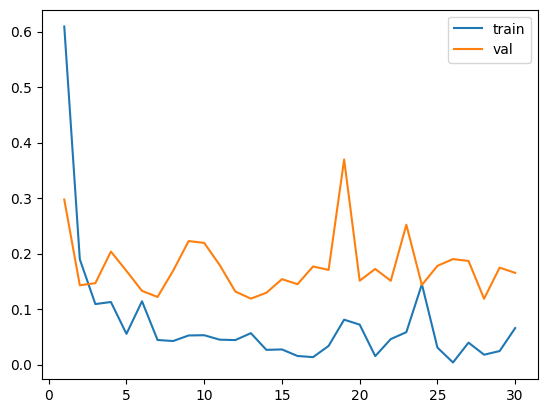

100%|██████████| 125/125 [00:01<00:00, 93.40it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 94.39it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 101.79it/s]


accuracy:0.6933333333333334, precision:1.0, recall:0.08, f1:0.14814814814814814
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 102.32it/s]


accuracy:0.6933333333333334, precision:1.0, recall:0.08, f1:0.14814814814814814
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 102.02it/s]


accuracy:0.6933333333333334, precision:1.0, recall:0.08, f1:0.14814814814814814
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 102.79it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 102.54it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:01<00:00, 102.66it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:01<00:00, 102.31it/s]


accuracy:0.7066666666666667, precision:0.9411764705882353, recall:0.128, f1:0.22535211267605637
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:01<00:00, 99.60it/s]


accuracy:0.7066666666666667, precision:0.8947368421052632, recall:0.136, f1:0.23611111111111113
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 91.53it/s]


accuracy:0.7093333333333334, precision:0.9, recall:0.144, f1:0.24827586206896549
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:01<00:00, 94.22it/s]


accuracy:0.7093333333333334, precision:0.9, recall:0.144, f1:0.24827586206896549
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:01<00:00, 93.75it/s] 


accuracy:0.7093333333333334, precision:0.8636363636363636, recall:0.152, f1:0.25850340136054417
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:01<00:00, 102.47it/s]


accuracy:0.7093333333333334, precision:0.8636363636363636, recall:0.152, f1:0.25850340136054417
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 103.05it/s]


accuracy:0.7093333333333334, precision:0.8636363636363636, recall:0.152, f1:0.25850340136054417
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 102.62it/s]


accuracy:0.712, precision:0.8695652173913043, recall:0.16, f1:0.2702702702702703
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.712, precision:0.8695652173913043, recall:0.16, f1:0.2702702702702703
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.712, precision:0.8695652173913043, recall:0.16, f1:0.2702702702702703
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 102.04it/s]


accuracy:0.7093333333333334, precision:0.8333333333333334, recall:0.16, f1:0.2684563758389262
Current threshold:0.20000000000000004, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 100.63it/s]


accuracy:0.7093333333333334, precision:0.8333333333333334, recall:0.16, f1:0.2684563758389262
Current threshold:0.21000000000000005, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 97.71it/s]


accuracy:0.7093333333333334, precision:0.8333333333333334, recall:0.16, f1:0.2684563758389262
Current threshold:0.22000000000000006, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 93.65it/s]


accuracy:0.712, precision:0.84, recall:0.168, f1:0.27999999999999997
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:01<00:00, 95.64it/s]


accuracy:0.7146666666666667, precision:0.8461538461538461, recall:0.176, f1:0.2913907284768211
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:01<00:00, 96.60it/s] 


accuracy:0.7146666666666667, precision:0.8461538461538461, recall:0.176, f1:0.2913907284768211
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 102.29it/s]


accuracy:0.7146666666666667, precision:0.8461538461538461, recall:0.176, f1:0.2913907284768211
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:01<00:00, 102.25it/s]


accuracy:0.7146666666666667, precision:0.8461538461538461, recall:0.176, f1:0.2913907284768211
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:01<00:00, 102.19it/s]


accuracy:0.7146666666666667, precision:0.8461538461538461, recall:0.176, f1:0.2913907284768211
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:01<00:00, 102.25it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:01<00:00, 102.99it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:01<00:00, 102.07it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:01<00:00, 97.04it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:01<00:00, 94.20it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:01<00:00, 93.69it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:01<00:00, 99.14it/s] 


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:01<00:00, 101.98it/s]


accuracy:0.7173333333333334, precision:0.8518518518518519, recall:0.184, f1:0.3026315789473684
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 102.06it/s]


accuracy:0.7146666666666667, precision:0.8214285714285714, recall:0.184, f1:0.3006535947712418
Current threshold:0.38000000000000017, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.7146666666666667, precision:0.8214285714285714, recall:0.184, f1:0.3006535947712418
Current threshold:0.3900000000000002, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 102.14it/s]


accuracy:0.7146666666666667, precision:0.8214285714285714, recall:0.184, f1:0.3006535947712418
Current threshold:0.4000000000000002, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.45it/s]


accuracy:0.7146666666666667, precision:0.8214285714285714, recall:0.184, f1:0.3006535947712418
Current threshold:0.4100000000000002, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.14it/s]


accuracy:0.7146666666666667, precision:0.8214285714285714, recall:0.184, f1:0.3006535947712418
Current threshold:0.4200000000000002, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.7173333333333334, precision:0.8275862068965517, recall:0.192, f1:0.3116883116883117
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 94.16it/s]


accuracy:0.7173333333333334, precision:0.8275862068965517, recall:0.192, f1:0.3116883116883117
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:01<00:00, 91.79it/s]


accuracy:0.7226666666666667, precision:0.8387096774193549, recall:0.208, f1:0.3333333333333333
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:01<00:00, 91.98it/s]


accuracy:0.7226666666666667, precision:0.8387096774193549, recall:0.208, f1:0.3333333333333333
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.7226666666666667, precision:0.8387096774193549, recall:0.208, f1:0.3333333333333333
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:01<00:00, 100.81it/s]


accuracy:0.7226666666666667, precision:0.8387096774193549, recall:0.208, f1:0.3333333333333333
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:01<00:00, 101.31it/s]


accuracy:0.7253333333333334, precision:0.84375, recall:0.216, f1:0.34394904458598724
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:01<00:00, 101.93it/s]


accuracy:0.7253333333333334, precision:0.84375, recall:0.216, f1:0.34394904458598724
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.7253333333333334, precision:0.84375, recall:0.216, f1:0.34394904458598724
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:01<00:00, 101.47it/s]


accuracy:0.728, precision:0.8484848484848485, recall:0.224, f1:0.35443037974683544
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:01<00:00, 101.59it/s]


accuracy:0.728, precision:0.8484848484848485, recall:0.224, f1:0.35443037974683544
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:01<00:00, 100.30it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 92.87it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:01<00:00, 92.43it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:01<00:00, 95.15it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:01<00:00, 101.86it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 101.28it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.35it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:01<00:00, 101.00it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:01<00:00, 102.46it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:01<00:00, 102.50it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:01<00:00, 97.00it/s]


accuracy:0.744, precision:0.8717948717948718, recall:0.272, f1:0.41463414634146345
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:01<00:00, 92.97it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.6600000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:01<00:00, 94.29it/s]


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.6700000000000004, Best threshold:0.6600


100%|██████████| 125/125 [00:01<00:00, 95.02it/s]


accuracy:0.7493333333333333, precision:0.8780487804878049, recall:0.288, f1:0.43373493975903615
Current threshold:0.6800000000000004, Best threshold:0.6700


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.7493333333333333, precision:0.8780487804878049, recall:0.288, f1:0.43373493975903615
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.7493333333333333, precision:0.8780487804878049, recall:0.288, f1:0.43373493975903615
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:01<00:00, 101.33it/s]


accuracy:0.7493333333333333, precision:0.8780487804878049, recall:0.288, f1:0.43373493975903615
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:01<00:00, 102.14it/s]


accuracy:0.7493333333333333, precision:0.8780487804878049, recall:0.288, f1:0.43373493975903615
Current threshold:0.7200000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:01<00:00, 101.84it/s]


accuracy:0.7546666666666667, precision:0.8837209302325582, recall:0.304, f1:0.45238095238095233
Current threshold:0.7300000000000004, Best threshold:0.7200


100%|██████████| 125/125 [00:01<00:00, 100.64it/s]


accuracy:0.7546666666666667, precision:0.8837209302325582, recall:0.304, f1:0.45238095238095233
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:01<00:00, 99.93it/s] 


accuracy:0.7573333333333333, precision:0.8863636363636364, recall:0.312, f1:0.46153846153846156
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:01<00:00, 97.03it/s]


accuracy:0.7573333333333333, precision:0.8863636363636364, recall:0.312, f1:0.46153846153846156
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:01<00:00, 90.95it/s]


accuracy:0.7573333333333333, precision:0.8863636363636364, recall:0.312, f1:0.46153846153846156
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:01<00:00, 89.82it/s]


accuracy:0.7573333333333333, precision:0.8863636363636364, recall:0.312, f1:0.46153846153846156
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:01<00:00, 95.48it/s] 


accuracy:0.7573333333333333, precision:0.8863636363636364, recall:0.312, f1:0.46153846153846156
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.7573333333333333, precision:0.8541666666666666, recall:0.328, f1:0.4739884393063584
Current threshold:0.8300000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.7626666666666667, precision:0.86, recall:0.344, f1:0.49142857142857144
Current threshold:0.8400000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:01<00:00, 100.81it/s]


accuracy:0.7626666666666667, precision:0.86, recall:0.344, f1:0.49142857142857144
Current threshold:0.8500000000000005, Best threshold:0.8400


100%|██████████| 125/125 [00:01<00:00, 100.43it/s]


accuracy:0.768, precision:0.8653846153846154, recall:0.36, f1:0.5084745762711865
Current threshold:0.8600000000000005, Best threshold:0.8500


100%|██████████| 125/125 [00:01<00:00, 94.70it/s]


accuracy:0.768, precision:0.8653846153846154, recall:0.36, f1:0.5084745762711865
Current threshold:0.8700000000000006, Best threshold:0.8600


100%|██████████| 125/125 [00:01<00:00, 90.35it/s]


accuracy:0.7733333333333333, precision:0.8703703703703703, recall:0.376, f1:0.5251396648044693
Current threshold:0.8800000000000006, Best threshold:0.8700


100%|██████████| 125/125 [00:01<00:00, 88.07it/s]


accuracy:0.7733333333333333, precision:0.8703703703703703, recall:0.376, f1:0.5251396648044693
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 96.28it/s] 


accuracy:0.7733333333333333, precision:0.8703703703703703, recall:0.376, f1:0.5251396648044693
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.776, precision:0.8727272727272727, recall:0.384, f1:0.5333333333333333
Current threshold:0.9100000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:01<00:00, 100.93it/s]


accuracy:0.776, precision:0.8596491228070176, recall:0.392, f1:0.5384615384615385
Current threshold:0.9200000000000006, Best threshold:0.9100


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:01<00:00, 100.83it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:01<00:00, 101.09it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:01<00:00, 91.05it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:01<00:00, 94.57it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:01<00:00, 91.89it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 102.62it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.0200000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:01<00:00, 102.70it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.0300000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 101.58it/s]


accuracy:0.792, precision:0.873015873015873, recall:0.44, f1:0.5851063829787234
Current threshold:1.0400000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 100.83it/s]


accuracy:0.792, precision:0.873015873015873, recall:0.44, f1:0.5851063829787234
Current threshold:1.0500000000000007, Best threshold:1.0400


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.792, precision:0.873015873015873, recall:0.44, f1:0.5851063829787234
Current threshold:1.0600000000000007, Best threshold:1.0500


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.0700000000000007, Best threshold:1.0600


100%|██████████| 125/125 [00:01<00:00, 99.14it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.0800000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:01<00:00, 91.83it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.0900000000000007, Best threshold:1.0800


100%|██████████| 125/125 [00:01<00:00, 89.53it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1000000000000008, Best threshold:1.0900


100%|██████████| 125/125 [00:01<00:00, 94.44it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:01<00:00, 100.91it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:01<00:00, 102.14it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:01<00:00, 102.08it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:01<00:00, 102.56it/s]


accuracy:0.7946666666666666, precision:0.875, recall:0.448, f1:0.5925925925925927
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:1.1700000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 100.84it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:1.1800000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 97.33it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.1900000000000008, Best threshold:1.1800


100%|██████████| 125/125 [00:01<00:00, 90.63it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.2000000000000008, Best threshold:1.1800


100%|██████████| 125/125 [00:01<00:00, 93.01it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.2100000000000009, Best threshold:1.1800


100%|██████████| 125/125 [00:01<00:00, 95.30it/s] 


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.2200000000000009, Best threshold:1.1800


100%|██████████| 125/125 [00:01<00:00, 101.66it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.7973333333333333, precision:0.855072463768116, recall:0.472, f1:0.6082474226804123
Current threshold:1.2400000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:1.2500000000000009, Best threshold:1.2400


100%|██████████| 125/125 [00:01<00:00, 102.21it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:1.260000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:01<00:00, 102.22it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:1.270000000000001, Best threshold:1.2600


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:1.280000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 102.96it/s]


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:1.290000000000001, Best threshold:1.2800


100%|██████████| 125/125 [00:01<00:00, 98.38it/s]


accuracy:0.8026666666666666, precision:0.8591549295774648, recall:0.488, f1:0.6224489795918366
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:01<00:00, 95.57it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:1.310000000000001, Best threshold:1.3000


100%|██████████| 125/125 [00:01<00:00, 92.29it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:01<00:00, 96.13it/s] 


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:1.330000000000001, Best threshold:1.3200


100%|██████████| 125/125 [00:01<00:00, 102.33it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:01<00:00, 102.20it/s]


accuracy:0.8053333333333333, precision:0.8611111111111112, recall:0.496, f1:0.6294416243654822
Current threshold:1.350000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.808, precision:0.863013698630137, recall:0.504, f1:0.6363636363636364
Current threshold:1.360000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.808, precision:0.863013698630137, recall:0.504, f1:0.6363636363636364
Current threshold:1.370000000000001, Best threshold:1.3600


100%|██████████| 125/125 [00:01<00:00, 102.11it/s]


accuracy:0.808, precision:0.863013698630137, recall:0.504, f1:0.6363636363636364
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:01<00:00, 102.24it/s]


accuracy:0.8106666666666666, precision:0.8648648648648649, recall:0.512, f1:0.6432160804020101
Current threshold:1.390000000000001, Best threshold:1.3800


100%|██████████| 125/125 [00:01<00:00, 102.49it/s]


accuracy:0.8106666666666666, precision:0.8648648648648649, recall:0.512, f1:0.6432160804020101
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 95.09it/s]


accuracy:0.8106666666666666, precision:0.8648648648648649, recall:0.512, f1:0.6432160804020101
Current threshold:1.410000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 93.28it/s]


accuracy:0.8053333333333333, precision:0.8421052631578947, recall:0.512, f1:0.6368159203980099
Current threshold:1.420000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 93.77it/s]


accuracy:0.808, precision:0.8441558441558441, recall:0.52, f1:0.6435643564356436
Current threshold:1.430000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 100.21it/s]


accuracy:0.808, precision:0.8441558441558441, recall:0.52, f1:0.6435643564356436
Current threshold:1.440000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 101.98it/s]


accuracy:0.808, precision:0.8441558441558441, recall:0.52, f1:0.6435643564356436
Current threshold:1.450000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 102.38it/s]


accuracy:0.808, precision:0.8441558441558441, recall:0.52, f1:0.6435643564356436
Current threshold:1.460000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 101.70it/s]


accuracy:0.8106666666666666, precision:0.8461538461538461, recall:0.528, f1:0.6502463054187192
Current threshold:1.470000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.8106666666666666, precision:0.8461538461538461, recall:0.528, f1:0.6502463054187192
Current threshold:1.480000000000001, Best threshold:1.4700


100%|██████████| 125/125 [00:01<00:00, 102.14it/s]


accuracy:0.8106666666666666, precision:0.8461538461538461, recall:0.528, f1:0.6502463054187192
Current threshold:1.490000000000001, Best threshold:1.4800


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.8106666666666666, precision:0.8461538461538461, recall:0.528, f1:0.6502463054187192
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:01<00:00, 101.99it/s]


accuracy:0.8106666666666666, precision:0.8461538461538461, recall:0.528, f1:0.6502463054187192
Current threshold:1.5100000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:01<00:00, 93.12it/s]


accuracy:0.8133333333333334, precision:0.8481012658227848, recall:0.536, f1:0.6568627450980392
Current threshold:1.5200000000000011, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 91.99it/s]


accuracy:0.816, precision:0.85, recall:0.544, f1:0.6634146341463415
Current threshold:1.5300000000000011, Best threshold:1.5200


100%|██████████| 125/125 [00:01<00:00, 94.28it/s]


accuracy:0.816, precision:0.85, recall:0.544, f1:0.6634146341463415
Current threshold:1.5400000000000011, Best threshold:1.5300


100%|██████████| 125/125 [00:01<00:00, 102.44it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.5500000000000012, Best threshold:1.5400


100%|██████████| 125/125 [00:01<00:00, 102.53it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.5600000000000012, Best threshold:1.5500


100%|██████████| 125/125 [00:01<00:00, 102.35it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.5700000000000012, Best threshold:1.5600


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.5800000000000012, Best threshold:1.5700


100%|██████████| 125/125 [00:01<00:00, 101.79it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.5900000000000012, Best threshold:1.5800


100%|██████████| 125/125 [00:01<00:00, 100.57it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.6000000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:01<00:00, 101.05it/s]


accuracy:0.8213333333333334, precision:0.8536585365853658, recall:0.56, f1:0.676328502415459
Current threshold:1.6100000000000012, Best threshold:1.6000


100%|██████████| 125/125 [00:01<00:00, 100.60it/s]


accuracy:0.8186666666666667, precision:0.8433734939759037, recall:0.56, f1:0.6730769230769231
Current threshold:1.6200000000000012, Best threshold:1.6000


100%|██████████| 125/125 [00:01<00:00, 94.67it/s]


accuracy:0.8213333333333334, precision:0.8452380952380952, recall:0.568, f1:0.6794258373205742
Current threshold:1.6300000000000012, Best threshold:1.6200


100%|██████████| 125/125 [00:01<00:00, 94.98it/s]


accuracy:0.824, precision:0.8470588235294118, recall:0.576, f1:0.6857142857142857
Current threshold:1.6400000000000012, Best threshold:1.6300


100%|██████████| 125/125 [00:01<00:00, 94.98it/s]


accuracy:0.824, precision:0.8470588235294118, recall:0.576, f1:0.6857142857142857
Current threshold:1.6500000000000012, Best threshold:1.6400


100%|██████████| 125/125 [00:01<00:00, 102.81it/s]


accuracy:0.824, precision:0.8470588235294118, recall:0.576, f1:0.6857142857142857
Current threshold:1.6600000000000013, Best threshold:1.6500


100%|██████████| 125/125 [00:01<00:00, 102.48it/s]


accuracy:0.8266666666666667, precision:0.8488372093023255, recall:0.584, f1:0.6919431279620853
Current threshold:1.6700000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 101.69it/s]


accuracy:0.8293333333333334, precision:0.8505747126436781, recall:0.592, f1:0.6981132075471698
Current threshold:1.6800000000000013, Best threshold:1.6700


100%|██████████| 125/125 [00:01<00:00, 102.24it/s]


accuracy:0.8293333333333334, precision:0.8505747126436781, recall:0.592, f1:0.6981132075471698
Current threshold:1.6900000000000013, Best threshold:1.6800


100%|██████████| 125/125 [00:01<00:00, 101.79it/s]


accuracy:0.832, precision:0.8522727272727273, recall:0.6, f1:0.7042253521126761
Current threshold:1.7000000000000013, Best threshold:1.6900


100%|██████████| 125/125 [00:01<00:00, 100.99it/s]


accuracy:0.832, precision:0.8522727272727273, recall:0.6, f1:0.7042253521126761
Current threshold:1.7100000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.19it/s]


accuracy:0.832, precision:0.8522727272727273, recall:0.6, f1:0.7042253521126761
Current threshold:1.7200000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 100.41it/s]


accuracy:0.832, precision:0.8522727272727273, recall:0.6, f1:0.7042253521126761
Current threshold:1.7300000000000013, Best threshold:1.7200


100%|██████████| 125/125 [00:01<00:00, 92.54it/s]


accuracy:0.8346666666666667, precision:0.8539325842696629, recall:0.608, f1:0.7102803738317757
Current threshold:1.7400000000000013, Best threshold:1.7300


100%|██████████| 125/125 [00:01<00:00, 93.24it/s]


accuracy:0.8346666666666667, precision:0.8539325842696629, recall:0.608, f1:0.7102803738317757
Current threshold:1.7500000000000013, Best threshold:1.7400


100%|██████████| 125/125 [00:01<00:00, 95.62it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.7600000000000013, Best threshold:1.7500


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.7700000000000014, Best threshold:1.7600


100%|██████████| 125/125 [00:01<00:00, 101.98it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.7800000000000014, Best threshold:1.7700


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.7900000000000014, Best threshold:1.7800


100%|██████████| 125/125 [00:01<00:00, 102.66it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.8000000000000014, Best threshold:1.7900


100%|██████████| 125/125 [00:01<00:00, 102.21it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.8100000000000014, Best threshold:1.8000


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.8373333333333334, precision:0.8555555555555555, recall:0.616, f1:0.7162790697674418
Current threshold:1.8200000000000014, Best threshold:1.8100


100%|██████████| 125/125 [00:01<00:00, 102.39it/s]


accuracy:0.84, precision:0.8571428571428571, recall:0.624, f1:0.7222222222222222
Current threshold:1.8300000000000014, Best threshold:1.8200


100%|██████████| 125/125 [00:01<00:00, 98.66it/s]


accuracy:0.8426666666666667, precision:0.8586956521739131, recall:0.632, f1:0.7281105990783409
Current threshold:1.8400000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 90.07it/s]


accuracy:0.8426666666666667, precision:0.8586956521739131, recall:0.632, f1:0.7281105990783409
Current threshold:1.8500000000000014, Best threshold:1.8400


100%|██████████| 125/125 [00:01<00:00, 91.29it/s]


accuracy:0.8426666666666667, precision:0.8586956521739131, recall:0.632, f1:0.7281105990783409
Current threshold:1.8600000000000014, Best threshold:1.8500


100%|██████████| 125/125 [00:01<00:00, 93.75it/s]


accuracy:0.8426666666666667, precision:0.8586956521739131, recall:0.632, f1:0.7281105990783409
Current threshold:1.8700000000000014, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.64it/s]


accuracy:0.84, precision:0.8494623655913979, recall:0.632, f1:0.7247706422018348
Current threshold:1.8800000000000014, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.84, precision:0.8494623655913979, recall:0.632, f1:0.7247706422018348
Current threshold:1.8900000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 102.64it/s]


accuracy:0.8373333333333334, precision:0.8404255319148937, recall:0.632, f1:0.7214611872146117
Current threshold:1.9000000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.8373333333333334, precision:0.8404255319148937, recall:0.632, f1:0.7214611872146117
Current threshold:1.9100000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.8373333333333334, precision:0.8404255319148937, recall:0.632, f1:0.7214611872146117
Current threshold:1.9200000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8373333333333334, precision:0.8404255319148937, recall:0.632, f1:0.7214611872146117
Current threshold:1.9300000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.8346666666666667, precision:0.8315789473684211, recall:0.632, f1:0.7181818181818181
Current threshold:1.9400000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 99.26it/s]


accuracy:0.8373333333333334, precision:0.8333333333333334, recall:0.64, f1:0.7239819004524887
Current threshold:1.9500000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 90.79it/s]


accuracy:0.8373333333333334, precision:0.826530612244898, recall:0.648, f1:0.726457399103139
Current threshold:1.9600000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 95.28it/s]


accuracy:0.8346666666666667, precision:0.8181818181818182, recall:0.648, f1:0.7232142857142857
Current threshold:1.9700000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 98.18it/s] 


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:1.9800000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:1.9900000000000015, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.18it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.0000000000000013, Best threshold:1.9900


100%|██████████| 125/125 [00:01<00:00, 102.00it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.010000000000001, Best threshold:2.0000


100%|██████████| 125/125 [00:01<00:00, 102.00it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.020000000000001, Best threshold:2.0100


100%|██████████| 125/125 [00:01<00:00, 102.59it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.0300000000000007, Best threshold:2.0200


100%|██████████| 125/125 [00:01<00:00, 101.80it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.0400000000000005, Best threshold:2.0300


100%|██████████| 125/125 [00:01<00:00, 102.58it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.0500000000000003, Best threshold:2.0400


100%|██████████| 125/125 [00:01<00:00, 98.89it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.06, Best threshold:2.0500


100%|██████████| 125/125 [00:01<00:00, 95.21it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.07, Best threshold:2.0600


100%|██████████| 125/125 [00:01<00:00, 93.13it/s]


accuracy:0.8426666666666667, precision:0.8235294117647058, recall:0.672, f1:0.7400881057268723
Current threshold:2.0799999999999996, Best threshold:2.0700


100%|██████████| 125/125 [00:01<00:00, 96.34it/s] 


accuracy:0.8453333333333334, precision:0.8252427184466019, recall:0.68, f1:0.7456140350877193
Current threshold:2.0899999999999994, Best threshold:2.0800


100%|██████████| 125/125 [00:01<00:00, 103.01it/s]


accuracy:0.84, precision:0.8095238095238095, recall:0.68, f1:0.7391304347826089
Current threshold:2.099999999999999, Best threshold:2.0800


100%|██████████| 125/125 [00:01<00:00, 102.78it/s]


accuracy:0.84, precision:0.8095238095238095, recall:0.68, f1:0.7391304347826089
Current threshold:2.109999999999999, Best threshold:2.0800


100%|██████████| 125/125 [00:01<00:00, 102.09it/s]


accuracy:0.8426666666666667, precision:0.8113207547169812, recall:0.688, f1:0.7445887445887446
Current threshold:2.1199999999999988, Best threshold:2.0800


100%|██████████| 125/125 [00:01<00:00, 101.58it/s]


accuracy:0.8453333333333334, precision:0.8130841121495327, recall:0.696, f1:0.75
Current threshold:2.1299999999999986, Best threshold:2.1200


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.848, precision:0.8148148148148148, recall:0.704, f1:0.7553648068669528
Current threshold:2.1399999999999983, Best threshold:2.1300


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.848, precision:0.8148148148148148, recall:0.704, f1:0.7553648068669528
Current threshold:2.149999999999998, Best threshold:2.1400


100%|██████████| 125/125 [00:01<00:00, 102.64it/s]


accuracy:0.848, precision:0.8148148148148148, recall:0.704, f1:0.7553648068669528
Current threshold:2.159999999999998, Best threshold:2.1500


100%|██████████| 125/125 [00:01<00:00, 96.19it/s]


accuracy:0.848, precision:0.8148148148148148, recall:0.704, f1:0.7553648068669528
Current threshold:2.1699999999999977, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 91.15it/s]


accuracy:0.8453333333333334, precision:0.8073394495412844, recall:0.704, f1:0.7521367521367521
Current threshold:2.1799999999999975, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 93.82it/s]


accuracy:0.8453333333333334, precision:0.8073394495412844, recall:0.704, f1:0.7521367521367521
Current threshold:2.1899999999999973, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 99.87it/s] 


accuracy:0.8453333333333334, precision:0.8073394495412844, recall:0.704, f1:0.7521367521367521
Current threshold:2.199999999999997, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 101.80it/s]


accuracy:0.8453333333333334, precision:0.8018018018018018, recall:0.712, f1:0.7542372881355933
Current threshold:2.209999999999997, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 102.53it/s]


accuracy:0.8426666666666667, precision:0.7946428571428571, recall:0.712, f1:0.7510548523206751
Current threshold:2.2199999999999966, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 102.28it/s]


accuracy:0.8426666666666667, precision:0.7946428571428571, recall:0.712, f1:0.7510548523206751
Current threshold:2.2299999999999964, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.8426666666666667, precision:0.7946428571428571, recall:0.712, f1:0.7510548523206751
Current threshold:2.239999999999996, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.8453333333333334, precision:0.7964601769911505, recall:0.72, f1:0.7563025210084032
Current threshold:2.249999999999996, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 102.10it/s]


accuracy:0.8453333333333334, precision:0.7964601769911505, recall:0.72, f1:0.7563025210084032
Current threshold:2.259999999999996, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 101.49it/s]


accuracy:0.848, precision:0.7982456140350878, recall:0.728, f1:0.7615062761506276
Current threshold:2.2699999999999956, Best threshold:2.2600


100%|██████████| 125/125 [00:01<00:00, 98.06it/s]


accuracy:0.848, precision:0.7982456140350878, recall:0.728, f1:0.7615062761506276
Current threshold:2.2799999999999954, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 95.40it/s]


accuracy:0.8453333333333334, precision:0.7913043478260869, recall:0.728, f1:0.7583333333333333
Current threshold:2.289999999999995, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 94.22it/s]


accuracy:0.8453333333333334, precision:0.7913043478260869, recall:0.728, f1:0.7583333333333333
Current threshold:2.299999999999995, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 98.16it/s] 


accuracy:0.8426666666666667, precision:0.7844827586206896, recall:0.728, f1:0.7551867219917011
Current threshold:2.3099999999999947, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:2.3199999999999945, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.12it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:2.3299999999999943, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.96it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:2.339999999999994, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.21it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:2.349999999999994, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.14it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:2.3599999999999937, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.84, precision:0.7777777777777778, recall:0.728, f1:0.7520661157024793
Current threshold:2.3699999999999934, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.61it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.3799999999999932, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 94.95it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.389999999999993, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 93.51it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.399999999999993, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 93.45it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.4099999999999926, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 99.73it/s] 


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.4199999999999924, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.31it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.429999999999992, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.439999999999992, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.84it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.4499999999999917, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.48it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.4599999999999915, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.11it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.4699999999999913, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.48it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.479999999999991, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 102.26it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.489999999999991, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 94.29it/s]


accuracy:0.8426666666666667, precision:0.7796610169491526, recall:0.736, f1:0.7572016460905351
Current threshold:2.4999999999999907, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 88.89it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:2.5099999999999905, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 94.51it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:2.5199999999999902, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.45it/s]


accuracy:0.848, precision:0.7833333333333333, recall:0.752, f1:0.7673469387755101
Current threshold:2.52999999999999, Best threshold:2.5200


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.848, precision:0.7833333333333333, recall:0.752, f1:0.7673469387755101
Current threshold:2.53999999999999, Best threshold:2.5300


100%|██████████| 125/125 [00:01<00:00, 102.10it/s]


accuracy:0.848, precision:0.7833333333333333, recall:0.752, f1:0.7673469387755101
Current threshold:2.5499999999999896, Best threshold:2.5400


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.848, precision:0.7833333333333333, recall:0.752, f1:0.7673469387755101
Current threshold:2.5599999999999894, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 101.50it/s]


accuracy:0.8453333333333334, precision:0.7768595041322314, recall:0.752, f1:0.7642276422764228
Current threshold:2.569999999999989, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.8453333333333334, precision:0.7768595041322314, recall:0.752, f1:0.7642276422764228
Current threshold:2.579999999999989, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 102.32it/s]


accuracy:0.8453333333333334, precision:0.7768595041322314, recall:0.752, f1:0.7642276422764228
Current threshold:2.5899999999999888, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.8453333333333334, precision:0.7768595041322314, recall:0.752, f1:0.7642276422764228
Current threshold:2.5999999999999885, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 92.94it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.6099999999999883, Best threshold:2.6000


100%|██████████| 125/125 [00:01<00:00, 91.84it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.619999999999988, Best threshold:2.6100


100%|██████████| 125/125 [00:01<00:00, 91.51it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.629999999999988, Best threshold:2.6200


100%|██████████| 125/125 [00:01<00:00, 101.67it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.6399999999999877, Best threshold:2.6300


100%|██████████| 125/125 [00:01<00:00, 101.16it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.6499999999999875, Best threshold:2.6400


100%|██████████| 125/125 [00:01<00:00, 101.53it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.6599999999999873, Best threshold:2.6500


100%|██████████| 125/125 [00:01<00:00, 101.57it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:2.669999999999987, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 101.15it/s]


accuracy:0.8453333333333334, precision:0.7723577235772358, recall:0.76, f1:0.7661290322580646
Current threshold:2.679999999999987, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 101.74it/s]


accuracy:0.8453333333333334, precision:0.7723577235772358, recall:0.76, f1:0.7661290322580646
Current threshold:2.6899999999999866, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 102.59it/s]


accuracy:0.8453333333333334, precision:0.7723577235772358, recall:0.76, f1:0.7661290322580646
Current threshold:2.6999999999999864, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 99.95it/s]


accuracy:0.8453333333333334, precision:0.7723577235772358, recall:0.76, f1:0.7661290322580646
Current threshold:2.709999999999986, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 94.12it/s]


accuracy:0.8453333333333334, precision:0.7723577235772358, recall:0.76, f1:0.7661290322580646
Current threshold:2.719999999999986, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 96.60it/s]


accuracy:0.8426666666666667, precision:0.7661290322580645, recall:0.76, f1:0.7630522088353414
Current threshold:2.7299999999999858, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 97.04it/s] 


accuracy:0.8426666666666667, precision:0.7661290322580645, recall:0.76, f1:0.7630522088353414
Current threshold:2.7399999999999856, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 102.46it/s]


accuracy:0.8453333333333334, precision:0.768, recall:0.768, f1:0.768
Current threshold:2.7499999999999853, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.848, precision:0.7698412698412699, recall:0.776, f1:0.7729083665338645
Current threshold:2.759999999999985, Best threshold:2.7500


100%|██████████| 125/125 [00:01<00:00, 101.69it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:2.769999999999985, Best threshold:2.7600


100%|██████████| 125/125 [00:01<00:00, 101.63it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:2.7799999999999847, Best threshold:2.7700


100%|██████████| 125/125 [00:01<00:00, 101.39it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:2.7899999999999845, Best threshold:2.7800


100%|██████████| 125/125 [00:01<00:00, 101.25it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:2.7999999999999843, Best threshold:2.7900


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:2.809999999999984, Best threshold:2.8000


100%|██████████| 125/125 [00:01<00:00, 99.35it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:2.819999999999984, Best threshold:2.8100


100%|██████████| 125/125 [00:01<00:00, 93.81it/s]


accuracy:0.8533333333333334, precision:0.7734375, recall:0.792, f1:0.782608695652174
Current threshold:2.8299999999999836, Best threshold:2.8200


100%|██████████| 125/125 [00:01<00:00, 92.36it/s]


accuracy:0.8533333333333334, precision:0.7734375, recall:0.792, f1:0.782608695652174
Current threshold:2.8399999999999834, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 96.16it/s] 


accuracy:0.8533333333333334, precision:0.7734375, recall:0.792, f1:0.782608695652174
Current threshold:2.849999999999983, Best threshold:2.8400


100%|██████████| 125/125 [00:01<00:00, 102.60it/s]


accuracy:0.8533333333333334, precision:0.7734375, recall:0.792, f1:0.782608695652174
Current threshold:2.859999999999983, Best threshold:2.8500


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


accuracy:0.8533333333333334, precision:0.7734375, recall:0.792, f1:0.782608695652174
Current threshold:2.869999999999983, Best threshold:2.8600


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.8506666666666667, precision:0.7674418604651163, recall:0.792, f1:0.7795275590551182
Current threshold:2.8799999999999826, Best threshold:2.8600


100%|██████████| 125/125 [00:01<00:00, 100.95it/s]


accuracy:0.848, precision:0.7615384615384615, recall:0.792, f1:0.7764705882352941
Current threshold:2.8899999999999824, Best threshold:2.8600


100%|██████████| 125/125 [00:01<00:00, 100.87it/s]


accuracy:0.8506666666666667, precision:0.7633587786259542, recall:0.8, f1:0.7812500000000001
Current threshold:2.899999999999982, Best threshold:2.8600


100%|██████████| 125/125 [00:01<00:00, 100.53it/s]


accuracy:0.8533333333333334, precision:0.7651515151515151, recall:0.808, f1:0.7859922178988327
Current threshold:2.909999999999982, Best threshold:2.9000


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.8533333333333334, precision:0.7651515151515151, recall:0.808, f1:0.7859922178988327
Current threshold:2.9199999999999817, Best threshold:2.9100


100%|██████████| 125/125 [00:01<00:00, 96.36it/s]


accuracy:0.8533333333333334, precision:0.7651515151515151, recall:0.808, f1:0.7859922178988327
Current threshold:2.9299999999999815, Best threshold:2.9200


100%|██████████| 125/125 [00:01<00:00, 91.67it/s]


accuracy:0.8533333333333334, precision:0.7651515151515151, recall:0.808, f1:0.7859922178988327
Current threshold:2.9399999999999813, Best threshold:2.9300


100%|██████████| 125/125 [00:01<00:00, 92.65it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:2.949999999999981, Best threshold:2.9400


100%|██████████| 125/125 [00:01<00:00, 93.58it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:2.959999999999981, Best threshold:2.9500


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:2.9699999999999807, Best threshold:2.9600


100%|██████████| 125/125 [00:01<00:00, 101.44it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:2.9799999999999804, Best threshold:2.9700


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:2.9899999999999802, Best threshold:2.9800


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:2.99999999999998, Best threshold:2.9900


100%|██████████| 125/125 [00:01<00:00, 100.98it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:3.00999999999998, Best threshold:3.0000


100%|██████████| 125/125 [00:01<00:00, 100.20it/s]


lr=0.0001 and bc=8 results: [0.856, 0.7669172932330827, 0.816, 0.7906976744186045]
Epoch 1/30, Train Loss: 0.9959728921714582, Val Loss: 0.9827071710636741
Epoch 2/30, Train Loss: 0.8807256990357449, Val Loss: 0.6645849958846444
Epoch 3/30, Train Loss: 0.39174444640153333, Val Loss: 0.3664917592939578
Epoch 4/30, Train Loss: 0.23008224936692337, Val Loss: 0.20213258266448975
Epoch 5/30, Train Loss: 0.16022442692988798, Val Loss: 0.16865307288734535
Epoch 6/30, Train Loss: 0.13806065917015076, Val Loss: 0.15844470380168213
Epoch 7/30, Train Loss: 0.09565864699451547, Val Loss: 0.13865110121275248
Epoch 8/30, Train Loss: 0.08644653013662289, Val Loss: 0.12361276306604084
Epoch 9/30, Train Loss: 0.06409879813068792, Val Loss: 0.10827065023936723
Epoch 10/30, Train Loss: 0.08662007847114613, Val Loss: 0.13264042727257075
Epoch 11/30, Train Loss: 0.05541346555477694, Val Loss: 0.109526127576828
Epoch 12/30, Train Loss: 0.047147088144954885, Val Loss: 0.10774493139041097
Epoch 13/30, Train L

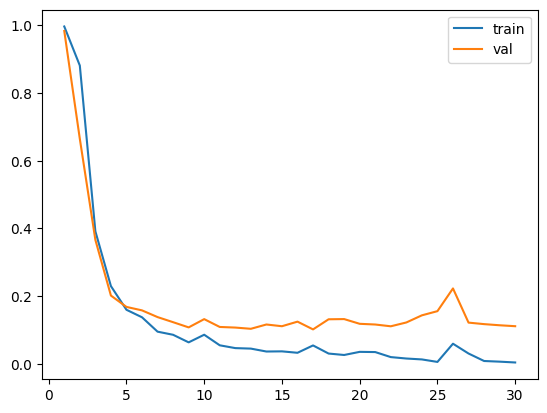

100%|██████████| 125/125 [00:01<00:00, 101.96it/s]


accuracy:0.688, precision:0.9, recall:0.072, f1:0.13333333333333333
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 96.80it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 93.14it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 95.64it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 95.35it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 99.24it/s]


accuracy:0.704, precision:0.9375, recall:0.12, f1:0.21276595744680846
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 101.78it/s]


accuracy:0.7093333333333334, precision:0.9444444444444444, recall:0.136, f1:0.2377622377622378
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:01<00:00, 101.58it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:01<00:00, 101.39it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:01<00:00, 101.94it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 102.32it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:01<00:00, 98.86it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:01<00:00, 90.29it/s]


accuracy:0.728, precision:0.9259259259259259, recall:0.2, f1:0.32894736842105265
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 92.99it/s]


accuracy:0.728, precision:0.9259259259259259, recall:0.2, f1:0.32894736842105265
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 93.19it/s]


accuracy:0.728, precision:0.9259259259259259, recall:0.2, f1:0.32894736842105265
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.7333333333333333, precision:0.9310344827586207, recall:0.216, f1:0.35064935064935066
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:01<00:00, 101.60it/s]


accuracy:0.736, precision:0.9333333333333333, recall:0.224, f1:0.3612903225806452
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


accuracy:0.7413333333333333, precision:0.9375, recall:0.24, f1:0.38216560509554137
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:01<00:00, 101.70it/s]


accuracy:0.7413333333333333, precision:0.9375, recall:0.24, f1:0.38216560509554137
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 101.79it/s]


accuracy:0.736, precision:0.8823529411764706, recall:0.24, f1:0.37735849056603776
Current threshold:0.22000000000000006, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.736, precision:0.8823529411764706, recall:0.24, f1:0.37735849056603776
Current threshold:0.23000000000000007, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 101.08it/s]


accuracy:0.7413333333333333, precision:0.8888888888888888, recall:0.256, f1:0.39751552795031053
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:01<00:00, 96.21it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 95.10it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:01<00:00, 94.13it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:01<00:00, 95.91it/s] 


accuracy:0.7466666666666667, precision:0.875, recall:0.28, f1:0.42424242424242425
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 102.41it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.2900000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 101.18it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.3000000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 100.25it/s]


accuracy:0.7413333333333333, precision:0.8043478260869565, recall:0.296, f1:0.4327485380116958
Current threshold:0.3100000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 101.33it/s]


accuracy:0.7413333333333333, precision:0.8043478260869565, recall:0.296, f1:0.4327485380116958
Current threshold:0.3200000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 102.54it/s]


accuracy:0.7413333333333333, precision:0.8043478260869565, recall:0.296, f1:0.4327485380116958
Current threshold:0.3300000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.7413333333333333, precision:0.8043478260869565, recall:0.296, f1:0.4327485380116958
Current threshold:0.34000000000000014, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.7413333333333333, precision:0.7916666666666666, recall:0.304, f1:0.4393063583815029
Current threshold:0.35000000000000014, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 94.75it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.36000000000000015, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 94.59it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.37000000000000016, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 95.05it/s]


accuracy:0.7466666666666667, precision:0.8, recall:0.32, f1:0.45714285714285713
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:01<00:00, 96.80it/s]


accuracy:0.7466666666666667, precision:0.8, recall:0.32, f1:0.45714285714285713
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:01<00:00, 101.68it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:01<00:00, 102.01it/s]


accuracy:0.752, precision:0.8076923076923077, recall:0.336, f1:0.47457627118644063
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:01<00:00, 102.21it/s]


accuracy:0.752, precision:0.8076923076923077, recall:0.336, f1:0.47457627118644063
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.752, precision:0.8076923076923077, recall:0.336, f1:0.47457627118644063
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:01<00:00, 102.70it/s]


accuracy:0.752, precision:0.8076923076923077, recall:0.336, f1:0.47457627118644063
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:01<00:00, 102.65it/s]


accuracy:0.7546666666666667, precision:0.8113207547169812, recall:0.344, f1:0.4831460674157304
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:01<00:00, 97.12it/s]


accuracy:0.7573333333333333, precision:0.8148148148148148, recall:0.352, f1:0.49162011173184356
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:01<00:00, 94.03it/s]


accuracy:0.7573333333333333, precision:0.8148148148148148, recall:0.352, f1:0.49162011173184356
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:01<00:00, 94.02it/s]


accuracy:0.76, precision:0.8181818181818182, recall:0.36, f1:0.5
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:01<00:00, 95.99it/s]


accuracy:0.7653333333333333, precision:0.8245614035087719, recall:0.376, f1:0.5164835164835165
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:01<00:00, 101.50it/s]


accuracy:0.7653333333333333, precision:0.8245614035087719, recall:0.376, f1:0.5164835164835165
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:01<00:00, 100.99it/s]


accuracy:0.7653333333333333, precision:0.8245614035087719, recall:0.376, f1:0.5164835164835165
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:01<00:00, 101.02it/s]


accuracy:0.7706666666666667, precision:0.8305084745762712, recall:0.392, f1:0.532608695652174
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:01<00:00, 99.49it/s] 


accuracy:0.7733333333333333, precision:0.8333333333333334, recall:0.4, f1:0.5405405405405406
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 100.53it/s]


accuracy:0.7706666666666667, precision:0.819672131147541, recall:0.4, f1:0.5376344086021506
Current threshold:0.5500000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 101.26it/s]


accuracy:0.768, precision:0.8064516129032258, recall:0.4, f1:0.53475935828877
Current threshold:0.5600000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 101.92it/s]


accuracy:0.776, precision:0.8153846153846154, recall:0.424, f1:0.5578947368421053
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:01<00:00, 97.12it/s]


accuracy:0.7813333333333333, precision:0.8208955223880597, recall:0.44, f1:0.5729166666666666
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 92.25it/s]


accuracy:0.7786666666666666, precision:0.8088235294117647, recall:0.44, f1:0.5699481865284974
Current threshold:0.5900000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 90.96it/s]


accuracy:0.7786666666666666, precision:0.8088235294117647, recall:0.44, f1:0.5699481865284974
Current threshold:0.6000000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 95.29it/s] 


accuracy:0.7813333333333333, precision:0.8115942028985508, recall:0.448, f1:0.577319587628866
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.784, precision:0.8142857142857143, recall:0.456, f1:0.5846153846153846
Current threshold:0.6200000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.7786666666666666, precision:0.7916666666666666, recall:0.456, f1:0.5786802030456852
Current threshold:0.6300000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 102.01it/s]


accuracy:0.7813333333333333, precision:0.7945205479452054, recall:0.464, f1:0.5858585858585859
Current threshold:0.6400000000000003, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.7813333333333333, precision:0.7945205479452054, recall:0.464, f1:0.5858585858585859
Current threshold:0.6500000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.7786666666666666, precision:0.7837837837837838, recall:0.464, f1:0.5829145728643217
Current threshold:0.6600000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.7786666666666666, precision:0.7763157894736842, recall:0.472, f1:0.5870646766169154
Current threshold:0.6700000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 102.11it/s]


accuracy:0.7813333333333333, precision:0.7792207792207793, recall:0.48, f1:0.594059405940594
Current threshold:0.6800000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 96.54it/s]


accuracy:0.7813333333333333, precision:0.7792207792207793, recall:0.48, f1:0.594059405940594
Current threshold:0.6900000000000004, Best threshold:0.6100


100%|██████████| 125/125 [00:01<00:00, 90.23it/s]


accuracy:0.7893333333333333, precision:0.7875, recall:0.504, f1:0.6146341463414633
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:01<00:00, 95.33it/s]


accuracy:0.792, precision:0.7901234567901234, recall:0.512, f1:0.6213592233009708
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:01<00:00, 96.01it/s] 


accuracy:0.792, precision:0.7901234567901234, recall:0.512, f1:0.6213592233009708
Current threshold:0.7200000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:01<00:00, 101.06it/s]


accuracy:0.792, precision:0.7901234567901234, recall:0.512, f1:0.6213592233009708
Current threshold:0.7300000000000004, Best threshold:0.7200


100%|██████████| 125/125 [00:01<00:00, 101.80it/s]


accuracy:0.792, precision:0.7901234567901234, recall:0.512, f1:0.6213592233009708
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:01<00:00, 102.12it/s]


accuracy:0.7946666666666666, precision:0.7926829268292683, recall:0.52, f1:0.6280193236714976
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:01<00:00, 101.78it/s]


accuracy:0.7946666666666666, precision:0.7926829268292683, recall:0.52, f1:0.6280193236714976
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.7973333333333333, precision:0.7951807228915663, recall:0.528, f1:0.6346153846153846
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:01<00:00, 100.56it/s]


accuracy:0.7973333333333333, precision:0.7951807228915663, recall:0.528, f1:0.6346153846153846
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:01<00:00, 101.14it/s]


accuracy:0.7973333333333333, precision:0.7951807228915663, recall:0.528, f1:0.6346153846153846
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:01<00:00, 92.54it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 90.76it/s]


accuracy:0.7973333333333333, precision:0.788235294117647, recall:0.536, f1:0.6380952380952382
Current threshold:0.8100000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 91.80it/s]


accuracy:0.7973333333333333, precision:0.788235294117647, recall:0.536, f1:0.6380952380952382
Current threshold:0.8200000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 99.15it/s] 


accuracy:0.7973333333333333, precision:0.788235294117647, recall:0.536, f1:0.6380952380952382
Current threshold:0.8300000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.8, precision:0.7906976744186046, recall:0.544, f1:0.6445497630331752
Current threshold:0.8400000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.8, precision:0.7906976744186046, recall:0.544, f1:0.6445497630331752
Current threshold:0.8500000000000005, Best threshold:0.8400


100%|██████████| 125/125 [00:01<00:00, 100.87it/s]


accuracy:0.8053333333333333, precision:0.7954545454545454, recall:0.56, f1:0.6572769953051644
Current threshold:0.8600000000000005, Best threshold:0.8500


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.8053333333333333, precision:0.7954545454545454, recall:0.56, f1:0.6572769953051644
Current threshold:0.8700000000000006, Best threshold:0.8600


100%|██████████| 125/125 [00:01<00:00, 102.29it/s]


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.8800000000000006, Best threshold:0.8700


100%|██████████| 125/125 [00:01<00:00, 102.12it/s]


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 100.13it/s]


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:01<00:00, 95.64it/s]


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.9100000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:01<00:00, 92.69it/s]


accuracy:0.8106666666666666, precision:0.8, recall:0.576, f1:0.6697674418604651
Current threshold:0.9200000000000006, Best threshold:0.9100


100%|██████████| 125/125 [00:01<00:00, 90.85it/s]


accuracy:0.8106666666666666, precision:0.8, recall:0.576, f1:0.6697674418604651
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:01<00:00, 99.12it/s] 


accuracy:0.8106666666666666, precision:0.7934782608695652, recall:0.584, f1:0.6728110599078342
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.8106666666666666, precision:0.7934782608695652, recall:0.584, f1:0.6728110599078342
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:01<00:00, 102.24it/s]


accuracy:0.8133333333333334, precision:0.7956989247311828, recall:0.592, f1:0.6788990825688073
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:01<00:00, 101.67it/s]


accuracy:0.816, precision:0.7978723404255319, recall:0.6, f1:0.6849315068493151
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:01<00:00, 100.99it/s]


accuracy:0.816, precision:0.7978723404255319, recall:0.6, f1:0.6849315068493151
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.816, precision:0.7978723404255319, recall:0.6, f1:0.6849315068493151
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:01<00:00, 102.05it/s]


accuracy:0.8186666666666667, precision:0.8, recall:0.608, f1:0.6909090909090909
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 101.09it/s]


accuracy:0.816, precision:0.7916666666666666, recall:0.608, f1:0.6877828054298643
Current threshold:1.0100000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 94.26it/s]


accuracy:0.816, precision:0.7916666666666666, recall:0.608, f1:0.6877828054298643
Current threshold:1.0200000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 93.05it/s]


accuracy:0.8213333333333334, precision:0.7959183673469388, recall:0.624, f1:0.6995515695067265
Current threshold:1.0300000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 88.49it/s]


accuracy:0.8213333333333334, precision:0.7959183673469388, recall:0.624, f1:0.6995515695067265
Current threshold:1.0400000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 97.39it/s] 


accuracy:0.8213333333333334, precision:0.7959183673469388, recall:0.624, f1:0.6995515695067265
Current threshold:1.0500000000000007, Best threshold:1.0400


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.8213333333333334, precision:0.7959183673469388, recall:0.624, f1:0.6995515695067265
Current threshold:1.0600000000000007, Best threshold:1.0500


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.824, precision:0.797979797979798, recall:0.632, f1:0.7053571428571429
Current threshold:1.0700000000000007, Best threshold:1.0600


100%|██████████| 125/125 [00:01<00:00, 101.60it/s]


accuracy:0.824, precision:0.797979797979798, recall:0.632, f1:0.7053571428571429
Current threshold:1.0800000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


accuracy:0.824, precision:0.797979797979798, recall:0.632, f1:0.7053571428571429
Current threshold:1.0900000000000007, Best threshold:1.0800


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1000000000000008, Best threshold:1.0900


100%|██████████| 125/125 [00:01<00:00, 102.27it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:01<00:00, 102.03it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:01<00:00, 93.39it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:01<00:00, 88.61it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:01<00:00, 93.66it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:01<00:00, 100.90it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 100.81it/s]


accuracy:0.8293333333333334, precision:0.801980198019802, recall:0.648, f1:0.7168141592920354
Current threshold:1.1700000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 101.75it/s]


accuracy:0.8266666666666667, precision:0.7941176470588235, recall:0.648, f1:0.7136563876651983
Current threshold:1.1800000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 102.65it/s]


accuracy:0.8266666666666667, precision:0.7941176470588235, recall:0.648, f1:0.7136563876651983
Current threshold:1.1900000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 102.72it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:1.2000000000000008, Best threshold:1.1900


100%|██████████| 125/125 [00:01<00:00, 102.06it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:1.2100000000000009, Best threshold:1.2000


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:1.2200000000000009, Best threshold:1.2100


100%|██████████| 125/125 [00:01<00:00, 100.93it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:01<00:00, 91.38it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:1.2400000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 92.36it/s]


accuracy:0.8346666666666667, precision:0.8, recall:0.672, f1:0.7304347826086958
Current threshold:1.2500000000000009, Best threshold:1.2400


100%|██████████| 125/125 [00:01<00:00, 92.33it/s]


accuracy:0.8346666666666667, precision:0.8, recall:0.672, f1:0.7304347826086958
Current threshold:1.260000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.8346666666666667, precision:0.8, recall:0.672, f1:0.7304347826086958
Current threshold:1.270000000000001, Best threshold:1.2600


100%|██████████| 125/125 [00:01<00:00, 99.77it/s]


accuracy:0.8373333333333334, precision:0.8018867924528302, recall:0.68, f1:0.735930735930736
Current threshold:1.280000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 101.00it/s]


accuracy:0.84, precision:0.8037383177570093, recall:0.688, f1:0.7413793103448275
Current threshold:1.290000000000001, Best threshold:1.2800


100%|██████████| 125/125 [00:01<00:00, 100.49it/s]


accuracy:0.84, precision:0.8037383177570093, recall:0.688, f1:0.7413793103448275
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:1.310000000000001, Best threshold:1.3000


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:01<00:00, 101.15it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:1.330000000000001, Best threshold:1.3200


100%|██████████| 125/125 [00:01<00:00, 99.03it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:01<00:00, 93.18it/s]


accuracy:0.8426666666666667, precision:0.8, recall:0.704, f1:0.748936170212766
Current threshold:1.350000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 91.42it/s]


accuracy:0.8426666666666667, precision:0.8, recall:0.704, f1:0.748936170212766
Current threshold:1.360000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:01<00:00, 93.35it/s]


accuracy:0.8426666666666667, precision:0.8, recall:0.704, f1:0.748936170212766
Current threshold:1.370000000000001, Best threshold:1.3600


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.8426666666666667, precision:0.8, recall:0.704, f1:0.748936170212766
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:01<00:00, 100.71it/s]


accuracy:0.84, precision:0.7927927927927928, recall:0.704, f1:0.7457627118644067
Current threshold:1.390000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:01<00:00, 102.50it/s]


accuracy:0.8426666666666667, precision:0.7946428571428571, recall:0.712, f1:0.7510548523206751
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 102.12it/s]


accuracy:0.8426666666666667, precision:0.7946428571428571, recall:0.712, f1:0.7510548523206751
Current threshold:1.410000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.8453333333333334, precision:0.7964601769911505, recall:0.72, f1:0.7563025210084032
Current threshold:1.420000000000001, Best threshold:1.4100


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.848, precision:0.7982456140350878, recall:0.728, f1:0.7615062761506276
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:01<00:00, 101.68it/s]


accuracy:0.848, precision:0.7982456140350878, recall:0.728, f1:0.7615062761506276
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 98.31it/s]


accuracy:0.8453333333333334, precision:0.7913043478260869, recall:0.728, f1:0.7583333333333333
Current threshold:1.450000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 91.18it/s]


accuracy:0.8453333333333334, precision:0.7913043478260869, recall:0.728, f1:0.7583333333333333
Current threshold:1.460000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 91.30it/s]


accuracy:0.8453333333333334, precision:0.7913043478260869, recall:0.728, f1:0.7583333333333333
Current threshold:1.470000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 96.41it/s]


accuracy:0.8453333333333334, precision:0.7913043478260869, recall:0.728, f1:0.7583333333333333
Current threshold:1.480000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.8506666666666667, precision:0.7948717948717948, recall:0.744, f1:0.768595041322314
Current threshold:1.490000000000001, Best threshold:1.4800


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.8506666666666667, precision:0.7948717948717948, recall:0.744, f1:0.768595041322314
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:01<00:00, 100.55it/s]


accuracy:0.8506666666666667, precision:0.7948717948717948, recall:0.744, f1:0.768595041322314
Current threshold:1.5100000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:01<00:00, 100.56it/s]


accuracy:0.8533333333333334, precision:0.7966101694915254, recall:0.752, f1:0.7736625514403294
Current threshold:1.5200000000000011, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.8533333333333334, precision:0.7966101694915254, recall:0.752, f1:0.7736625514403294
Current threshold:1.5300000000000011, Best threshold:1.5200


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.8533333333333334, precision:0.7966101694915254, recall:0.752, f1:0.7736625514403294
Current threshold:1.5400000000000011, Best threshold:1.5300


100%|██████████| 125/125 [00:01<00:00, 99.73it/s] 


accuracy:0.8586666666666667, precision:0.8, recall:0.768, f1:0.7836734693877552
Current threshold:1.5500000000000012, Best threshold:1.5400


100%|██████████| 125/125 [00:01<00:00, 97.65it/s]


accuracy:0.8586666666666667, precision:0.8, recall:0.768, f1:0.7836734693877552
Current threshold:1.5600000000000012, Best threshold:1.5500


100%|██████████| 125/125 [00:01<00:00, 94.53it/s]


accuracy:0.8613333333333333, precision:0.8016528925619835, recall:0.776, f1:0.7886178861788617
Current threshold:1.5700000000000012, Best threshold:1.5600


100%|██████████| 125/125 [00:01<00:00, 94.24it/s]


accuracy:0.8613333333333333, precision:0.8016528925619835, recall:0.776, f1:0.7886178861788617
Current threshold:1.5800000000000012, Best threshold:1.5700


100%|██████████| 125/125 [00:01<00:00, 95.68it/s]


accuracy:0.8613333333333333, precision:0.8016528925619835, recall:0.776, f1:0.7886178861788617
Current threshold:1.5900000000000012, Best threshold:1.5800


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.864, precision:0.8032786885245902, recall:0.784, f1:0.7935222672064778
Current threshold:1.6000000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.8613333333333333, precision:0.7967479674796748, recall:0.784, f1:0.7903225806451615
Current threshold:1.6100000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:01<00:00, 101.16it/s]


accuracy:0.8613333333333333, precision:0.7967479674796748, recall:0.784, f1:0.7903225806451615
Current threshold:1.6200000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.864, precision:0.7983870967741935, recall:0.792, f1:0.7951807228915663
Current threshold:1.6300000000000012, Best threshold:1.6200


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.864, precision:0.7983870967741935, recall:0.792, f1:0.7951807228915663
Current threshold:1.6400000000000012, Best threshold:1.6300


100%|██████████| 125/125 [00:01<00:00, 102.26it/s]


accuracy:0.8666666666666667, precision:0.8, recall:0.8, f1:0.8000000000000002
Current threshold:1.6500000000000012, Best threshold:1.6400


100%|██████████| 125/125 [00:01<00:00, 100.54it/s]


accuracy:0.8666666666666667, precision:0.8, recall:0.8, f1:0.8000000000000002
Current threshold:1.6600000000000013, Best threshold:1.6500


100%|██████████| 125/125 [00:01<00:00, 97.08it/s]


accuracy:0.8693333333333333, precision:0.8015873015873016, recall:0.808, f1:0.804780876494024
Current threshold:1.6700000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 94.47it/s]


accuracy:0.8666666666666667, precision:0.7952755905511811, recall:0.808, f1:0.8015873015873016
Current threshold:1.6800000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 91.16it/s]


accuracy:0.8666666666666667, precision:0.7952755905511811, recall:0.808, f1:0.8015873015873016
Current threshold:1.6900000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 96.04it/s]


accuracy:0.8666666666666667, precision:0.7952755905511811, recall:0.808, f1:0.8015873015873016
Current threshold:1.7000000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.8693333333333333, precision:0.796875, recall:0.816, f1:0.8063241106719369
Current threshold:1.7100000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.24it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7200000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.84it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7300000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.28it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7400000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.55it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7500000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.08it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7600000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.95it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7700000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 97.61it/s]


accuracy:0.8666666666666667, precision:0.7906976744186046, recall:0.816, f1:0.8031496062992125
Current threshold:1.7800000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 93.51it/s]


accuracy:0.8613333333333333, precision:0.7786259541984732, recall:0.816, f1:0.7968749999999999
Current threshold:1.7900000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.61it/s]


accuracy:0.8613333333333333, precision:0.7786259541984732, recall:0.816, f1:0.7968749999999999
Current threshold:1.8000000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 93.83it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:1.8100000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:1.8200000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:1.8300000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.34it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:1.8400000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.09it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:1.8500000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.72it/s]


accuracy:0.8533333333333334, precision:0.7611940298507462, recall:0.816, f1:0.7876447876447876
Current threshold:1.8600000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.62it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:1.8700000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.01it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:1.8800000000000014, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 96.40it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:1.8900000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.42it/s]


accuracy:0.8533333333333334, precision:0.7573529411764706, recall:0.824, f1:0.789272030651341
Current threshold:1.9000000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.74it/s]


accuracy:0.8533333333333334, precision:0.7573529411764706, recall:0.824, f1:0.789272030651341
Current threshold:1.9100000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 95.28it/s] 


accuracy:0.856, precision:0.7591240875912408, recall:0.832, f1:0.7938931297709924
Current threshold:1.9200000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.856, precision:0.7591240875912408, recall:0.832, f1:0.7938931297709924
Current threshold:1.9300000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.42it/s]


accuracy:0.856, precision:0.7591240875912408, recall:0.832, f1:0.7938931297709924
Current threshold:1.9400000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.856, precision:0.7591240875912408, recall:0.832, f1:0.7938931297709924
Current threshold:1.9500000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.8586666666666667, precision:0.7608695652173914, recall:0.84, f1:0.7984790874524714
Current threshold:1.9600000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.8586666666666667, precision:0.7608695652173914, recall:0.84, f1:0.7984790874524714
Current threshold:1.9700000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.8586666666666667, precision:0.7608695652173914, recall:0.84, f1:0.7984790874524714
Current threshold:1.9800000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.8586666666666667, precision:0.7608695652173914, recall:0.84, f1:0.7984790874524714
Current threshold:1.9900000000000015, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.92it/s]


accuracy:0.8533333333333334, precision:0.75, recall:0.84, f1:0.7924528301886793
Current threshold:2.0000000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 94.06it/s]


accuracy:0.8533333333333334, precision:0.7464788732394366, recall:0.848, f1:0.7940074906367041
Current threshold:2.010000000000001, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.06it/s]


accuracy:0.8533333333333334, precision:0.7464788732394366, recall:0.848, f1:0.7940074906367041
Current threshold:2.020000000000001, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 97.73it/s] 


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.0300000000000007, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.0400000000000005, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.21it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.0500000000000003, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.06, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.26it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.07, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.0799999999999996, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.05it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:2.0899999999999994, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.8533333333333334, precision:0.7430555555555556, recall:0.856, f1:0.7955390334572491
Current threshold:2.099999999999999, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.27it/s]


accuracy:0.8533333333333334, precision:0.7430555555555556, recall:0.856, f1:0.7955390334572491
Current threshold:2.109999999999999, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 94.22it/s]


accuracy:0.8533333333333334, precision:0.7430555555555556, recall:0.856, f1:0.7955390334572491
Current threshold:2.1199999999999988, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.70it/s]


accuracy:0.8533333333333334, precision:0.7430555555555556, recall:0.856, f1:0.7955390334572491
Current threshold:2.1299999999999986, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 99.54it/s] 


accuracy:0.856, precision:0.7448275862068966, recall:0.864, f1:0.7999999999999999
Current threshold:2.1399999999999983, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.8533333333333334, precision:0.7397260273972602, recall:0.864, f1:0.7970479704797048
Current threshold:2.149999999999998, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.01it/s]


accuracy:0.8533333333333334, precision:0.7397260273972602, recall:0.864, f1:0.7970479704797048
Current threshold:2.159999999999998, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.856, precision:0.738255033557047, recall:0.88, f1:0.8029197080291972
Current threshold:2.1699999999999977, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.1799999999999975, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.49it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.1899999999999973, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.20it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.199999999999997, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.209999999999997, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.79it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.2199999999999966, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 90.71it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.2299999999999964, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 95.29it/s]


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.239999999999996, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 98.36it/s] 


accuracy:0.8533333333333334, precision:0.7333333333333333, recall:0.88, f1:0.8
Current threshold:2.249999999999996, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.53it/s]


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.259999999999996, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.2699999999999956, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 99.95it/s] 


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.2799999999999954, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 99.96it/s] 


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.289999999999995, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.53it/s]


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.299999999999995, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.3099999999999947, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.30it/s]


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.3199999999999945, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 96.55it/s]


accuracy:0.8533333333333334, precision:0.7302631578947368, recall:0.888, f1:0.8014440433212996
Current threshold:2.3299999999999943, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 94.80it/s]


accuracy:0.8506666666666667, precision:0.7254901960784313, recall:0.888, f1:0.7985611510791366
Current threshold:2.339999999999994, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 95.85it/s]


accuracy:0.8506666666666667, precision:0.7254901960784313, recall:0.888, f1:0.7985611510791366
Current threshold:2.349999999999994, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 98.12it/s] 


accuracy:0.8506666666666667, precision:0.7254901960784313, recall:0.888, f1:0.7985611510791366
Current threshold:2.3599999999999937, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.51it/s]


accuracy:0.8506666666666667, precision:0.7254901960784313, recall:0.888, f1:0.7985611510791366
Current threshold:2.3699999999999934, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.8506666666666667, precision:0.7254901960784313, recall:0.888, f1:0.7985611510791366
Current threshold:2.3799999999999932, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.50it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.389999999999993, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.399999999999993, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.56it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.4099999999999926, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.00it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.4199999999999924, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.38it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.429999999999992, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.91it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.439999999999992, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.30it/s]


accuracy:0.848, precision:0.7207792207792207, recall:0.888, f1:0.7956989247311826
Current threshold:2.4499999999999917, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 89.07it/s]


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.4599999999999915, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 97.79it/s] 


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.4699999999999913, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.67it/s]


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.479999999999991, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.489999999999991, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.57it/s]


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.4999999999999907, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.5099999999999905, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


accuracy:0.8506666666666667, precision:0.7225806451612903, recall:0.896, f1:0.7999999999999999
Current threshold:2.5199999999999902, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8506666666666667, precision:0.7197452229299363, recall:0.904, f1:0.8014184397163121
Current threshold:2.52999999999999, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.8506666666666667, precision:0.7197452229299363, recall:0.904, f1:0.8014184397163121
Current threshold:2.53999999999999, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 96.53it/s]


accuracy:0.8506666666666667, precision:0.7197452229299363, recall:0.904, f1:0.8014184397163121
Current threshold:2.5499999999999896, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.51it/s]


accuracy:0.8506666666666667, precision:0.7197452229299363, recall:0.904, f1:0.8014184397163121
Current threshold:2.5599999999999894, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.44it/s]


accuracy:0.8533333333333334, precision:0.7215189873417721, recall:0.912, f1:0.8056537102473498
Current threshold:2.569999999999989, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 96.07it/s] 


accuracy:0.8533333333333334, precision:0.7215189873417721, recall:0.912, f1:0.8056537102473498
Current threshold:2.579999999999989, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.54it/s]


accuracy:0.8533333333333334, precision:0.7215189873417721, recall:0.912, f1:0.8056537102473498
Current threshold:2.5899999999999888, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.03it/s]


accuracy:0.8533333333333334, precision:0.7215189873417721, recall:0.912, f1:0.8056537102473498
Current threshold:2.5999999999999885, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.8506666666666667, precision:0.7169811320754716, recall:0.912, f1:0.8028169014084507
Current threshold:2.6099999999999883, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.8506666666666667, precision:0.7169811320754716, recall:0.912, f1:0.8028169014084507
Current threshold:2.619999999999988, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.8506666666666667, precision:0.7169811320754716, recall:0.912, f1:0.8028169014084507
Current threshold:2.629999999999988, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.10it/s]


accuracy:0.8506666666666667, precision:0.7169811320754716, recall:0.912, f1:0.8028169014084507
Current threshold:2.6399999999999877, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.848, precision:0.7125, recall:0.912, f1:0.8
Current threshold:2.6499999999999875, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.28it/s]


accuracy:0.848, precision:0.7125, recall:0.912, f1:0.8
Current threshold:2.6599999999999873, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 87.01it/s]


accuracy:0.848, precision:0.7125, recall:0.912, f1:0.8
Current threshold:2.669999999999987, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 88.07it/s]


accuracy:0.848, precision:0.7125, recall:0.912, f1:0.8
Current threshold:2.679999999999987, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 97.76it/s] 


accuracy:0.848, precision:0.7125, recall:0.912, f1:0.8
Current threshold:2.6899999999999866, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.848, precision:0.7125, recall:0.912, f1:0.8
Current threshold:2.6999999999999864, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.62it/s]


accuracy:0.8453333333333334, precision:0.7080745341614907, recall:0.912, f1:0.7972027972027971
Current threshold:2.709999999999986, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.8453333333333334, precision:0.7080745341614907, recall:0.912, f1:0.7972027972027971
Current threshold:2.719999999999986, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.8453333333333334, precision:0.7080745341614907, recall:0.912, f1:0.7972027972027971
Current threshold:2.7299999999999858, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.72it/s]


accuracy:0.8453333333333334, precision:0.7080745341614907, recall:0.912, f1:0.7972027972027971
Current threshold:2.7399999999999856, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.45it/s]


accuracy:0.8426666666666667, precision:0.7037037037037037, recall:0.912, f1:0.794425087108014
Current threshold:2.7499999999999853, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.8426666666666667, precision:0.7037037037037037, recall:0.912, f1:0.794425087108014
Current threshold:2.759999999999985, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.51it/s]


accuracy:0.8453333333333334, precision:0.7055214723926381, recall:0.92, f1:0.7986111111111112
Current threshold:2.769999999999985, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 90.90it/s]


accuracy:0.8453333333333334, precision:0.7055214723926381, recall:0.92, f1:0.7986111111111112
Current threshold:2.7799999999999847, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.87it/s]


accuracy:0.8453333333333334, precision:0.7055214723926381, recall:0.92, f1:0.7986111111111112
Current threshold:2.7899999999999845, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.01it/s]


accuracy:0.8453333333333334, precision:0.7055214723926381, recall:0.92, f1:0.7986111111111112
Current threshold:2.7999999999999843, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.8453333333333334, precision:0.7055214723926381, recall:0.92, f1:0.7986111111111112
Current threshold:2.809999999999984, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.8453333333333334, precision:0.7055214723926381, recall:0.92, f1:0.7986111111111112
Current threshold:2.819999999999984, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.33it/s]


accuracy:0.8426666666666667, precision:0.7012195121951219, recall:0.92, f1:0.795847750865052
Current threshold:2.8299999999999836, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.39it/s]


accuracy:0.8426666666666667, precision:0.7012195121951219, recall:0.92, f1:0.795847750865052
Current threshold:2.8399999999999834, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 102.11it/s]


accuracy:0.8426666666666667, precision:0.7012195121951219, recall:0.92, f1:0.795847750865052
Current threshold:2.849999999999983, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.99it/s]


accuracy:0.84, precision:0.696969696969697, recall:0.92, f1:0.793103448275862
Current threshold:2.859999999999983, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:2.869999999999983, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 94.50it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:2.8799999999999826, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 96.90it/s]


accuracy:0.8346666666666667, precision:0.688622754491018, recall:0.92, f1:0.7876712328767123
Current threshold:2.8899999999999824, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 92.27it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:2.899999999999982, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 99.91it/s] 


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.909999999999982, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.54it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.9199999999999817, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 99.40it/s] 


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.9299999999999815, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.9399999999999813, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.05it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.949999999999981, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.42it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.959999999999981, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 100.56it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.9699999999999807, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 101.73it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.9799999999999804, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 93.24it/s]


accuracy:0.832, precision:0.6823529411764706, recall:0.928, f1:0.7864406779661016
Current threshold:2.9899999999999802, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 90.60it/s]


accuracy:0.832, precision:0.6823529411764706, recall:0.928, f1:0.7864406779661016
Current threshold:2.99999999999998, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 91.80it/s]


accuracy:0.832, precision:0.6823529411764706, recall:0.928, f1:0.7864406779661016
Current threshold:3.00999999999998, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 99.19it/s] 


lr=1e-05 and bc=8 results: [0.8693333333333333, 0.796875, 0.816, 0.8063241106719369]
Epoch 1/30, Train Loss: 1.0149560630321504, Val Loss: 0.8356091380119324
Epoch 2/30, Train Loss: 0.3944751277565956, Val Loss: 0.39341047406196594
Epoch 3/30, Train Loss: 0.2815088669536635, Val Loss: 0.28530764281749726
Epoch 4/30, Train Loss: 0.17956973388791084, Val Loss: 0.12660386711359023
Epoch 5/30, Train Loss: 0.1644746519625187, Val Loss: 0.5532788217067719
Epoch 6/30, Train Loss: 0.19258134737610816, Val Loss: 0.24301839321851731
Epoch 7/30, Train Loss: 0.11960810348391533, Val Loss: 0.2727348268032074
Epoch 8/30, Train Loss: 0.083840293250978, Val Loss: 0.22987580299377441
Epoch 9/30, Train Loss: 0.108812340721488, Val Loss: 0.3147073149681091
Epoch 10/30, Train Loss: 0.10293470434844494, Val Loss: 0.1939600944519043
Epoch 11/30, Train Loss: 0.4174525858834386, Val Loss: 0.15469159036874772
Epoch 12/30, Train Loss: 0.4513589859008789, Val Loss: 0.2837671279907227
Epoch 13/30, Train Loss: 0.1

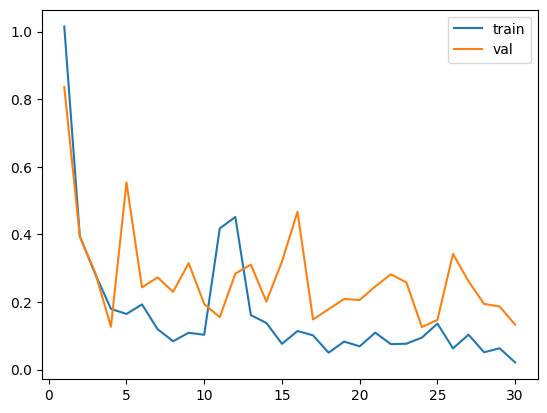

100%|██████████| 125/125 [00:01<00:00, 100.51it/s]


accuracy:0.688, precision:1.0, recall:0.064, f1:0.12030075187969924
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 100.52it/s]


accuracy:0.6933333333333334, precision:1.0, recall:0.08, f1:0.14814814814814814
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 98.24it/s]


accuracy:0.696, precision:1.0, recall:0.088, f1:0.16176470588235292
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 92.58it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 90.76it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 95.61it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:01<00:00, 102.47it/s]


accuracy:0.7013333333333334, precision:1.0, recall:0.104, f1:0.18840579710144925
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:01<00:00, 102.55it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:01<00:00, 102.82it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:01<00:00, 102.79it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.7066666666666667, precision:1.0, recall:0.12, f1:0.21428571428571425
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.7093333333333334, precision:1.0, recall:0.128, f1:0.22695035460992907
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 98.75it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 94.99it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:01<00:00, 91.99it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:01<00:00, 92.43it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:01<00:00, 101.92it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:01<00:00, 102.95it/s]


accuracy:0.712, precision:1.0, recall:0.136, f1:0.23943661971830985
Current threshold:0.23000000000000007, Best threshold:0.2200


100%|██████████| 125/125 [00:01<00:00, 102.27it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.24000000000000007, Best threshold:0.2300


100%|██████████| 125/125 [00:01<00:00, 101.04it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 100.03it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:01<00:00, 101.57it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:01<00:00, 91.99it/s]


accuracy:0.7173333333333334, precision:0.9523809523809523, recall:0.16, f1:0.273972602739726
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 93.05it/s]


accuracy:0.72, precision:0.9545454545454546, recall:0.168, f1:0.28571428571428575
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:01<00:00, 90.63it/s]


accuracy:0.72, precision:0.9545454545454546, recall:0.168, f1:0.28571428571428575
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:01<00:00, 102.59it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:01<00:00, 102.27it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:01<00:00, 101.89it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:01<00:00, 102.66it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:01<00:00, 102.71it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:01<00:00, 101.49it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.59it/s]


accuracy:0.72, precision:0.8846153846153846, recall:0.184, f1:0.304635761589404
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:01<00:00, 91.60it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:01<00:00, 91.46it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:01<00:00, 92.87it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:01<00:00, 101.33it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 103.09it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:01<00:00, 102.57it/s]


accuracy:0.7226666666666667, precision:0.8888888888888888, recall:0.192, f1:0.31578947368421056
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:01<00:00, 102.36it/s]


accuracy:0.7253333333333334, precision:0.8928571428571429, recall:0.2, f1:0.32679738562091504
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.7253333333333334, precision:0.8928571428571429, recall:0.2, f1:0.32679738562091504
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:01<00:00, 100.54it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:01<00:00, 87.33it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:01<00:00, 89.79it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:01<00:00, 93.08it/s]


accuracy:0.7306666666666667, precision:0.9, recall:0.216, f1:0.3483870967741935
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:01<00:00, 100.83it/s]


accuracy:0.7306666666666667, precision:0.9, recall:0.216, f1:0.3483870967741935
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:01<00:00, 102.01it/s]


accuracy:0.7306666666666667, precision:0.9, recall:0.216, f1:0.3483870967741935
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 101.57it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:01<00:00, 102.41it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:01<00:00, 102.91it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 102.88it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.86it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.6000000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 90.47it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.6100000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 94.35it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.6200000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 90.43it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.6300000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 100.99it/s]


accuracy:0.7333333333333333, precision:0.8787878787878788, recall:0.232, f1:0.36708860759493667
Current threshold:0.6400000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.6500000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.42it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.6600000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.6700000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 102.01it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.6800000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.6900000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7000000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7100000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 90.78it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7200000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 91.14it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7300000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 87.78it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7400000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.92it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7500000000000004, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 102.55it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7600000000000005, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7700000000000005, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7800000000000005, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.7900000000000005, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.8000000000000005, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 90.18it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.8300000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:01<00:00, 93.37it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.8400000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:01<00:00, 90.60it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.8500000000000005, Best threshold:0.8400


100%|██████████| 125/125 [00:01<00:00, 101.51it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.8600000000000005, Best threshold:0.8500


100%|██████████| 125/125 [00:01<00:00, 102.06it/s]


accuracy:0.7333333333333333, precision:0.8378378378378378, recall:0.248, f1:0.38271604938271603
Current threshold:0.8700000000000006, Best threshold:0.8500


100%|██████████| 125/125 [00:01<00:00, 101.02it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.8800000000000006, Best threshold:0.8700


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 102.42it/s]


accuracy:0.736, precision:0.8421052631578947, recall:0.256, f1:0.39263803680981596
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.7386666666666667, precision:0.8461538461538461, recall:0.264, f1:0.402439024390244
Current threshold:0.9100000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:01<00:00, 101.84it/s]


accuracy:0.7386666666666667, precision:0.8461538461538461, recall:0.264, f1:0.402439024390244
Current threshold:0.9200000000000006, Best threshold:0.9100


100%|██████████| 125/125 [00:01<00:00, 101.92it/s]


accuracy:0.7386666666666667, precision:0.8461538461538461, recall:0.264, f1:0.402439024390244
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:01<00:00, 88.11it/s]


accuracy:0.7386666666666667, precision:0.8461538461538461, recall:0.264, f1:0.402439024390244
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:01<00:00, 93.29it/s]


accuracy:0.7413333333333333, precision:0.85, recall:0.272, f1:0.41212121212121217
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:01<00:00, 85.59it/s]


accuracy:0.7413333333333333, precision:0.85, recall:0.272, f1:0.41212121212121217
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:01<00:00, 100.82it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:01<00:00, 102.34it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:01<00:00, 102.33it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 101.57it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:01<00:00, 101.18it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:1.0200000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:01<00:00, 101.70it/s]


accuracy:0.7493333333333333, precision:0.8604651162790697, recall:0.296, f1:0.44047619047619047
Current threshold:1.0300000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 102.43it/s]


accuracy:0.7493333333333333, precision:0.8604651162790697, recall:0.296, f1:0.44047619047619047
Current threshold:1.0400000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 90.03it/s]


accuracy:0.752, precision:0.8636363636363636, recall:0.304, f1:0.4497041420118343
Current threshold:1.0500000000000007, Best threshold:1.0400


100%|██████████| 125/125 [00:01<00:00, 91.99it/s]


accuracy:0.752, precision:0.8636363636363636, recall:0.304, f1:0.4497041420118343
Current threshold:1.0600000000000007, Best threshold:1.0500


100%|██████████| 125/125 [00:01<00:00, 95.59it/s]


accuracy:0.752, precision:0.8636363636363636, recall:0.304, f1:0.4497041420118343
Current threshold:1.0700000000000007, Best threshold:1.0600


100%|██████████| 125/125 [00:01<00:00, 100.11it/s]


accuracy:0.752, precision:0.8636363636363636, recall:0.304, f1:0.4497041420118343
Current threshold:1.0800000000000007, Best threshold:1.0700


100%|██████████| 125/125 [00:01<00:00, 101.25it/s]


accuracy:0.7546666666666667, precision:0.8666666666666667, recall:0.312, f1:0.45882352941176474
Current threshold:1.0900000000000007, Best threshold:1.0800


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.7546666666666667, precision:0.8666666666666667, recall:0.312, f1:0.45882352941176474
Current threshold:1.1000000000000008, Best threshold:1.0900


100%|██████████| 125/125 [00:01<00:00, 102.13it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:01<00:00, 102.10it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:01<00:00, 101.84it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:01<00:00, 101.20it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.7573333333333333, precision:0.8695652173913043, recall:0.32, f1:0.46783625730994155
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:01<00:00, 93.70it/s]


accuracy:0.7573333333333333, precision:0.8541666666666666, recall:0.328, f1:0.4739884393063584
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 94.58it/s]


accuracy:0.7573333333333333, precision:0.8541666666666666, recall:0.328, f1:0.4739884393063584
Current threshold:1.1700000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 93.20it/s]


accuracy:0.7546666666666667, precision:0.8367346938775511, recall:0.328, f1:0.471264367816092
Current threshold:1.1800000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 94.74it/s] 


accuracy:0.7626666666666667, precision:0.8461538461538461, recall:0.352, f1:0.4971751412429378
Current threshold:1.1900000000000008, Best threshold:1.1800


100%|██████████| 125/125 [00:01<00:00, 100.46it/s]


accuracy:0.7626666666666667, precision:0.8461538461538461, recall:0.352, f1:0.4971751412429378
Current threshold:1.2000000000000008, Best threshold:1.1900


100%|██████████| 125/125 [00:01<00:00, 100.47it/s]


accuracy:0.7653333333333333, precision:0.8490566037735849, recall:0.36, f1:0.5056179775280899
Current threshold:1.2100000000000009, Best threshold:1.2000


100%|██████████| 125/125 [00:01<00:00, 101.99it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.2200000000000009, Best threshold:1.2100


100%|██████████| 125/125 [00:01<00:00, 101.74it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:01<00:00, 101.59it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.2400000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 102.19it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.2500000000000009, Best threshold:1.2400


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.260000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:01<00:00, 96.46it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.270000000000001, Best threshold:1.2600


100%|██████████| 125/125 [00:01<00:00, 91.21it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.280000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 92.19it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.290000000000001, Best threshold:1.2800


100%|██████████| 125/125 [00:01<00:00, 95.26it/s] 


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:01<00:00, 101.49it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.310000000000001, Best threshold:1.3000


100%|██████████| 125/125 [00:01<00:00, 102.53it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.330000000000001, Best threshold:1.3200


100%|██████████| 125/125 [00:01<00:00, 101.33it/s]


accuracy:0.768, precision:0.8518518518518519, recall:0.368, f1:0.5139664804469273
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.7706666666666667, precision:0.8545454545454545, recall:0.376, f1:0.5222222222222223
Current threshold:1.350000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 101.74it/s]


accuracy:0.7706666666666667, precision:0.8545454545454545, recall:0.376, f1:0.5222222222222223
Current threshold:1.360000000000001, Best threshold:1.3500


100%|██████████| 125/125 [00:01<00:00, 102.88it/s]


accuracy:0.7733333333333333, precision:0.8571428571428571, recall:0.384, f1:0.5303867403314917
Current threshold:1.370000000000001, Best threshold:1.3600


100%|██████████| 125/125 [00:01<00:00, 95.16it/s]


accuracy:0.7733333333333333, precision:0.8571428571428571, recall:0.384, f1:0.5303867403314917
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:01<00:00, 96.38it/s]


accuracy:0.7733333333333333, precision:0.8571428571428571, recall:0.384, f1:0.5303867403314917
Current threshold:1.390000000000001, Best threshold:1.3800


100%|██████████| 125/125 [00:01<00:00, 96.14it/s]


accuracy:0.776, precision:0.8596491228070176, recall:0.392, f1:0.5384615384615385
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 93.63it/s]


accuracy:0.776, precision:0.8596491228070176, recall:0.392, f1:0.5384615384615385
Current threshold:1.410000000000001, Best threshold:1.4000


100%|██████████| 125/125 [00:01<00:00, 100.37it/s]


accuracy:0.776, precision:0.8596491228070176, recall:0.392, f1:0.5384615384615385
Current threshold:1.420000000000001, Best threshold:1.4100


100%|██████████| 125/125 [00:01<00:00, 101.59it/s]


accuracy:0.776, precision:0.8596491228070176, recall:0.392, f1:0.5384615384615385
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.7786666666666666, precision:0.8620689655172413, recall:0.4, f1:0.546448087431694
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 102.13it/s]


accuracy:0.7786666666666666, precision:0.8620689655172413, recall:0.4, f1:0.546448087431694
Current threshold:1.450000000000001, Best threshold:1.4400


100%|██████████| 125/125 [00:01<00:00, 100.83it/s]


accuracy:0.7786666666666666, precision:0.8620689655172413, recall:0.4, f1:0.546448087431694
Current threshold:1.460000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:1.470000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:1.480000000000001, Best threshold:1.4700


100%|██████████| 125/125 [00:01<00:00, 99.26it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:1.490000000000001, Best threshold:1.4800


100%|██████████| 125/125 [00:01<00:00, 96.71it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:01<00:00, 87.50it/s]


accuracy:0.7813333333333333, precision:0.864406779661017, recall:0.408, f1:0.5543478260869564
Current threshold:1.5100000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:01<00:00, 92.17it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:1.5200000000000011, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 101.17it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:1.5300000000000011, Best threshold:1.5200


100%|██████████| 125/125 [00:01<00:00, 101.42it/s]


accuracy:0.784, precision:0.8666666666666667, recall:0.416, f1:0.5621621621621622
Current threshold:1.5400000000000011, Best threshold:1.5300


100%|██████████| 125/125 [00:01<00:00, 102.51it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.5500000000000012, Best threshold:1.5400


100%|██████████| 125/125 [00:01<00:00, 102.04it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.5600000000000012, Best threshold:1.5500


100%|██████████| 125/125 [00:01<00:00, 101.89it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.5700000000000012, Best threshold:1.5600


100%|██████████| 125/125 [00:01<00:00, 101.62it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.5800000000000012, Best threshold:1.5700


100%|██████████| 125/125 [00:01<00:00, 100.79it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.5900000000000012, Best threshold:1.5800


100%|██████████| 125/125 [00:01<00:00, 100.91it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.6000000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:01<00:00, 89.14it/s]


accuracy:0.7866666666666666, precision:0.8688524590163934, recall:0.424, f1:0.5698924731182795
Current threshold:1.6100000000000012, Best threshold:1.6000


100%|██████████| 125/125 [00:01<00:00, 93.17it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6200000000000012, Best threshold:1.6100


100%|██████████| 125/125 [00:01<00:00, 92.91it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6300000000000012, Best threshold:1.6200


100%|██████████| 125/125 [00:01<00:00, 102.01it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6400000000000012, Best threshold:1.6300


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6500000000000012, Best threshold:1.6400


100%|██████████| 125/125 [00:01<00:00, 101.60it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6600000000000013, Best threshold:1.6500


100%|██████████| 125/125 [00:01<00:00, 100.83it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6700000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6800000000000013, Best threshold:1.6700


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.6900000000000013, Best threshold:1.6800


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.7000000000000013, Best threshold:1.6900


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.7100000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 89.84it/s]


accuracy:0.7893333333333333, precision:0.8709677419354839, recall:0.432, f1:0.5775401069518716
Current threshold:1.7200000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 96.46it/s]


accuracy:0.7866666666666666, precision:0.8571428571428571, recall:0.432, f1:0.5744680851063829
Current threshold:1.7300000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 93.43it/s]


accuracy:0.7866666666666666, precision:0.8571428571428571, recall:0.432, f1:0.5744680851063829
Current threshold:1.7400000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 97.35it/s] 


accuracy:0.7866666666666666, precision:0.8571428571428571, recall:0.432, f1:0.5744680851063829
Current threshold:1.7500000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 101.98it/s]


accuracy:0.7866666666666666, precision:0.8571428571428571, recall:0.432, f1:0.5744680851063829
Current threshold:1.7600000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 102.32it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:1.7700000000000014, Best threshold:1.7600


100%|██████████| 125/125 [00:01<00:00, 100.72it/s]


accuracy:0.792, precision:0.8615384615384616, recall:0.448, f1:0.5894736842105264
Current threshold:1.7800000000000014, Best threshold:1.7700


100%|██████████| 125/125 [00:01<00:00, 101.58it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.7900000000000014, Best threshold:1.7800


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.8000000000000014, Best threshold:1.7900


100%|██████████| 125/125 [00:01<00:00, 101.61it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.8100000000000014, Best threshold:1.8000


100%|██████████| 125/125 [00:01<00:00, 102.20it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.8200000000000014, Best threshold:1.8100


100%|██████████| 125/125 [00:01<00:00, 93.70it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.8300000000000014, Best threshold:1.8200


100%|██████████| 125/125 [00:01<00:00, 93.33it/s]


accuracy:0.7946666666666666, precision:0.8636363636363636, recall:0.456, f1:0.5968586387434555
Current threshold:1.8400000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 91.45it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.8500000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 97.78it/s] 


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.8600000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 101.67it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.8700000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 102.33it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.8800000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 100.36it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.8900000000000015, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 100.71it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.9000000000000015, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 100.00it/s]


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.9100000000000015, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 99.78it/s] 


accuracy:0.792, precision:0.8507462686567164, recall:0.456, f1:0.59375
Current threshold:1.9200000000000015, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:1.9300000000000015, Best threshold:1.9200


100%|██████████| 125/125 [00:01<00:00, 92.75it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:1.9400000000000015, Best threshold:1.9300


100%|██████████| 125/125 [00:01<00:00, 90.57it/s]


accuracy:0.7946666666666666, precision:0.8529411764705882, recall:0.464, f1:0.6010362694300518
Current threshold:1.9500000000000015, Best threshold:1.9400


100%|██████████| 125/125 [00:01<00:00, 94.07it/s]


accuracy:0.7973333333333333, precision:0.855072463768116, recall:0.472, f1:0.6082474226804123
Current threshold:1.9600000000000015, Best threshold:1.9500


100%|██████████| 125/125 [00:01<00:00, 96.68it/s] 


accuracy:0.8, precision:0.8571428571428571, recall:0.48, f1:0.6153846153846153
Current threshold:1.9700000000000015, Best threshold:1.9600


100%|██████████| 125/125 [00:01<00:00, 101.75it/s]


accuracy:0.7973333333333333, precision:0.8450704225352113, recall:0.48, f1:0.6122448979591836
Current threshold:1.9800000000000015, Best threshold:1.9600


100%|██████████| 125/125 [00:01<00:00, 101.04it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:1.9900000000000015, Best threshold:1.9800


100%|██████████| 125/125 [00:01<00:00, 100.03it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.0000000000000013, Best threshold:1.9900


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.010000000000001, Best threshold:2.0000


100%|██████████| 125/125 [00:01<00:00, 101.90it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.020000000000001, Best threshold:2.0100


100%|██████████| 125/125 [00:01<00:00, 100.90it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.0300000000000007, Best threshold:2.0200


100%|██████████| 125/125 [00:01<00:00, 102.01it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.0400000000000005, Best threshold:2.0300


100%|██████████| 125/125 [00:01<00:00, 93.51it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.0500000000000003, Best threshold:2.0400


100%|██████████| 125/125 [00:01<00:00, 91.11it/s]


accuracy:0.8, precision:0.8472222222222222, recall:0.488, f1:0.6192893401015228
Current threshold:2.06, Best threshold:2.0500


100%|██████████| 125/125 [00:01<00:00, 90.36it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:2.07, Best threshold:2.0600


100%|██████████| 125/125 [00:01<00:00, 96.53it/s] 


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:2.0799999999999996, Best threshold:2.0700


100%|██████████| 125/125 [00:01<00:00, 100.82it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:2.0899999999999994, Best threshold:2.0800


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:2.099999999999999, Best threshold:2.0900


100%|██████████| 125/125 [00:01<00:00, 101.35it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:2.109999999999999, Best threshold:2.1000


100%|██████████| 125/125 [00:01<00:00, 101.38it/s]


accuracy:0.8, precision:0.8378378378378378, recall:0.496, f1:0.6231155778894473
Current threshold:2.1199999999999988, Best threshold:2.1100


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.8026666666666666, precision:0.84, recall:0.504, f1:0.6300000000000001
Current threshold:2.1299999999999986, Best threshold:2.1200


100%|██████████| 125/125 [00:01<00:00, 101.04it/s]


accuracy:0.8026666666666666, precision:0.84, recall:0.504, f1:0.6300000000000001
Current threshold:2.1399999999999983, Best threshold:2.1300


100%|██████████| 125/125 [00:01<00:00, 101.57it/s]


accuracy:0.8026666666666666, precision:0.84, recall:0.504, f1:0.6300000000000001
Current threshold:2.149999999999998, Best threshold:2.1400


100%|██████████| 125/125 [00:01<00:00, 96.81it/s]


accuracy:0.8, precision:0.8289473684210527, recall:0.504, f1:0.6268656716417911
Current threshold:2.159999999999998, Best threshold:2.1400


100%|██████████| 125/125 [00:01<00:00, 90.89it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:2.1699999999999977, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 87.16it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:2.1799999999999975, Best threshold:2.1700


100%|██████████| 125/125 [00:01<00:00, 91.66it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:2.1899999999999973, Best threshold:2.1800


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:2.199999999999997, Best threshold:2.1900


100%|██████████| 125/125 [00:01<00:00, 102.33it/s]


accuracy:0.8026666666666666, precision:0.8311688311688312, recall:0.512, f1:0.6336633663366337
Current threshold:2.209999999999997, Best threshold:2.2000


100%|██████████| 125/125 [00:01<00:00, 102.33it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:2.2199999999999966, Best threshold:2.2100


100%|██████████| 125/125 [00:01<00:00, 101.08it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:2.2299999999999964, Best threshold:2.2200


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:2.239999999999996, Best threshold:2.2300


100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:2.249999999999996, Best threshold:2.2400


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.8026666666666666, precision:0.8227848101265823, recall:0.52, f1:0.6372549019607844
Current threshold:2.259999999999996, Best threshold:2.2500


100%|██████████| 125/125 [00:01<00:00, 95.08it/s]


accuracy:0.808, precision:0.8271604938271605, recall:0.536, f1:0.6504854368932038
Current threshold:2.2699999999999956, Best threshold:2.2600


100%|██████████| 125/125 [00:01<00:00, 92.06it/s]


accuracy:0.816, precision:0.8333333333333334, recall:0.56, f1:0.6698564593301435
Current threshold:2.2799999999999954, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 93.88it/s]


accuracy:0.816, precision:0.8333333333333334, recall:0.56, f1:0.6698564593301435
Current threshold:2.289999999999995, Best threshold:2.2800


100%|██████████| 125/125 [00:01<00:00, 88.02it/s]


accuracy:0.8186666666666667, precision:0.8352941176470589, recall:0.568, f1:0.6761904761904761
Current threshold:2.299999999999995, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 102.48it/s]


accuracy:0.8186666666666667, precision:0.8275862068965517, recall:0.576, f1:0.6792452830188679
Current threshold:2.3099999999999947, Best threshold:2.3000


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.8213333333333334, precision:0.8295454545454546, recall:0.584, f1:0.6854460093896714
Current threshold:2.3199999999999945, Best threshold:2.3100


100%|██████████| 125/125 [00:01<00:00, 101.90it/s]


accuracy:0.8213333333333334, precision:0.8295454545454546, recall:0.584, f1:0.6854460093896714
Current threshold:2.3299999999999943, Best threshold:2.3200


100%|██████████| 125/125 [00:01<00:00, 100.89it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.339999999999994, Best threshold:2.3300


100%|██████████| 125/125 [00:01<00:00, 101.99it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.349999999999994, Best threshold:2.3400


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.3599999999999937, Best threshold:2.3500


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.3699999999999934, Best threshold:2.3600


100%|██████████| 125/125 [00:01<00:00, 97.83it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.3799999999999932, Best threshold:2.3700


100%|██████████| 125/125 [00:01<00:00, 89.21it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.389999999999993, Best threshold:2.3800


100%|██████████| 125/125 [00:01<00:00, 89.80it/s]


accuracy:0.824, precision:0.8314606741573034, recall:0.592, f1:0.691588785046729
Current threshold:2.399999999999993, Best threshold:2.3900


100%|██████████| 125/125 [00:01<00:00, 93.65it/s]


accuracy:0.8213333333333334, precision:0.8222222222222222, recall:0.592, f1:0.6883720930232559
Current threshold:2.4099999999999926, Best threshold:2.3900


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8213333333333334, precision:0.8222222222222222, recall:0.592, f1:0.6883720930232559
Current threshold:2.4199999999999924, Best threshold:2.3900


100%|██████████| 125/125 [00:01<00:00, 100.68it/s]


accuracy:0.8213333333333334, precision:0.8222222222222222, recall:0.592, f1:0.6883720930232559
Current threshold:2.429999999999992, Best threshold:2.3900


100%|██████████| 125/125 [00:01<00:00, 100.89it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.439999999999992, Best threshold:2.4300


100%|██████████| 125/125 [00:01<00:00, 101.94it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.4499999999999917, Best threshold:2.4400


100%|██████████| 125/125 [00:01<00:00, 101.58it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.4599999999999915, Best threshold:2.4500


100%|██████████| 125/125 [00:01<00:00, 102.04it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.4699999999999913, Best threshold:2.4600


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.479999999999991, Best threshold:2.4700


100%|██████████| 125/125 [00:01<00:00, 99.48it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.489999999999991, Best threshold:2.4800


100%|██████████| 125/125 [00:01<00:00, 88.31it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.4999999999999907, Best threshold:2.4900


100%|██████████| 125/125 [00:01<00:00, 86.82it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.5099999999999905, Best threshold:2.5000


100%|██████████| 125/125 [00:01<00:00, 94.24it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.5199999999999902, Best threshold:2.5100


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.52999999999999, Best threshold:2.5200


100%|██████████| 125/125 [00:01<00:00, 100.40it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.53999999999999, Best threshold:2.5300


100%|██████████| 125/125 [00:01<00:00, 101.70it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.5499999999999896, Best threshold:2.5400


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.824, precision:0.8241758241758241, recall:0.6, f1:0.6944444444444445
Current threshold:2.5599999999999894, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 100.86it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:2.569999999999989, Best threshold:2.5600


100%|██████████| 125/125 [00:01<00:00, 101.78it/s]


accuracy:0.8266666666666667, precision:0.8260869565217391, recall:0.608, f1:0.7004608294930876
Current threshold:2.579999999999989, Best threshold:2.5700


100%|██████████| 125/125 [00:01<00:00, 100.39it/s]


accuracy:0.8293333333333334, precision:0.8279569892473119, recall:0.616, f1:0.7064220183486238
Current threshold:2.5899999999999888, Best threshold:2.5800


100%|██████████| 125/125 [00:01<00:00, 99.30it/s]


accuracy:0.8346666666666667, precision:0.8315789473684211, recall:0.632, f1:0.7181818181818181
Current threshold:2.5999999999999885, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 93.51it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.6099999999999883, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 90.54it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.619999999999988, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 90.99it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.629999999999988, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.6399999999999877, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.6499999999999875, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 101.47it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.6599999999999873, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 100.76it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.669999999999987, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.832, precision:0.8229166666666666, recall:0.632, f1:0.7149321266968326
Current threshold:2.679999999999987, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 101.87it/s]


accuracy:0.8346666666666667, precision:0.8247422680412371, recall:0.64, f1:0.7207207207207208
Current threshold:2.6899999999999866, Best threshold:2.6800


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.8346666666666667, precision:0.8247422680412371, recall:0.64, f1:0.7207207207207208
Current threshold:2.6999999999999864, Best threshold:2.6900


100%|██████████| 125/125 [00:01<00:00, 100.62it/s]


accuracy:0.8346666666666667, precision:0.8247422680412371, recall:0.64, f1:0.7207207207207208
Current threshold:2.709999999999986, Best threshold:2.7000


100%|██████████| 125/125 [00:01<00:00, 90.22it/s]


accuracy:0.8346666666666667, precision:0.8181818181818182, recall:0.648, f1:0.7232142857142857
Current threshold:2.719999999999986, Best threshold:2.7100


100%|██████████| 125/125 [00:01<00:00, 88.49it/s]


accuracy:0.8346666666666667, precision:0.8181818181818182, recall:0.648, f1:0.7232142857142857
Current threshold:2.7299999999999858, Best threshold:2.7200


100%|██████████| 125/125 [00:01<00:00, 91.73it/s]


accuracy:0.8346666666666667, precision:0.8181818181818182, recall:0.648, f1:0.7232142857142857
Current threshold:2.7399999999999856, Best threshold:2.7300


100%|██████████| 125/125 [00:01<00:00, 100.03it/s]


accuracy:0.8346666666666667, precision:0.8181818181818182, recall:0.648, f1:0.7232142857142857
Current threshold:2.7499999999999853, Best threshold:2.7400


100%|██████████| 125/125 [00:01<00:00, 101.93it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:2.759999999999985, Best threshold:2.7500


100%|██████████| 125/125 [00:01<00:00, 100.71it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:2.769999999999985, Best threshold:2.7600


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:2.7799999999999847, Best threshold:2.7700


100%|██████████| 125/125 [00:01<00:00, 102.17it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:2.7899999999999845, Best threshold:2.7800


100%|██████████| 125/125 [00:01<00:00, 101.25it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:2.7999999999999843, Best threshold:2.7900


100%|██████████| 125/125 [00:01<00:00, 101.31it/s]


accuracy:0.8373333333333334, precision:0.82, recall:0.656, f1:0.7288888888888888
Current threshold:2.809999999999984, Best threshold:2.8000


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:2.819999999999984, Best threshold:2.8100


100%|██████████| 125/125 [00:01<00:00, 94.18it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:2.8299999999999836, Best threshold:2.8200


100%|██████████| 125/125 [00:01<00:00, 91.41it/s]


accuracy:0.84, precision:0.8217821782178217, recall:0.664, f1:0.7345132743362832
Current threshold:2.8399999999999834, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 93.22it/s]


accuracy:0.8373333333333334, precision:0.8137254901960784, recall:0.664, f1:0.7312775330396476
Current threshold:2.849999999999983, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 96.82it/s] 


accuracy:0.8373333333333334, precision:0.8137254901960784, recall:0.664, f1:0.7312775330396476
Current threshold:2.859999999999983, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 100.14it/s]


accuracy:0.8346666666666667, precision:0.8058252427184466, recall:0.664, f1:0.7280701754385964
Current threshold:2.869999999999983, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.8346666666666667, precision:0.8058252427184466, recall:0.664, f1:0.7280701754385964
Current threshold:2.8799999999999826, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.8346666666666667, precision:0.8058252427184466, recall:0.664, f1:0.7280701754385964
Current threshold:2.8899999999999824, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.74it/s]


accuracy:0.8346666666666667, precision:0.8058252427184466, recall:0.664, f1:0.7280701754385964
Current threshold:2.899999999999982, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.67it/s]


accuracy:0.8346666666666667, precision:0.8058252427184466, recall:0.664, f1:0.7280701754385964
Current threshold:2.909999999999982, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.71it/s]


accuracy:0.8346666666666667, precision:0.8058252427184466, recall:0.664, f1:0.7280701754385964
Current threshold:2.9199999999999817, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.8373333333333334, precision:0.8076923076923077, recall:0.672, f1:0.7336244541484717
Current threshold:2.9299999999999815, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 91.88it/s]


accuracy:0.8373333333333334, precision:0.8076923076923077, recall:0.672, f1:0.7336244541484717
Current threshold:2.9399999999999813, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 90.83it/s]


accuracy:0.8373333333333334, precision:0.8076923076923077, recall:0.672, f1:0.7336244541484717
Current threshold:2.949999999999981, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 92.89it/s]


accuracy:0.84, precision:0.8095238095238095, recall:0.68, f1:0.7391304347826089
Current threshold:2.959999999999981, Best threshold:2.9500


100%|██████████| 125/125 [00:01<00:00, 94.50it/s]


accuracy:0.84, precision:0.8095238095238095, recall:0.68, f1:0.7391304347826089
Current threshold:2.9699999999999807, Best threshold:2.9600


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.8426666666666667, precision:0.8113207547169812, recall:0.688, f1:0.7445887445887446
Current threshold:2.9799999999999804, Best threshold:2.9700


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.8426666666666667, precision:0.8113207547169812, recall:0.688, f1:0.7445887445887446
Current threshold:2.9899999999999802, Best threshold:2.9800


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.8426666666666667, precision:0.8113207547169812, recall:0.688, f1:0.7445887445887446
Current threshold:2.99999999999998, Best threshold:2.9900


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.8453333333333334, precision:0.8130841121495327, recall:0.696, f1:0.75
Current threshold:3.00999999999998, Best threshold:3.0000


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


lr=0.001 and bc=32 results: [0.8453333333333334, 0.8130841121495327, 0.696, 0.75]
Epoch 1/30, Train Loss: 0.9945185065269471, Val Loss: 0.9591782689094543
Epoch 2/30, Train Loss: 0.779715758562088, Val Loss: 0.37158030867576597
Epoch 3/30, Train Loss: 0.2181885287165642, Val Loss: 0.16879406422376633
Epoch 4/30, Train Loss: 0.12518551982939244, Val Loss: 0.17676932215690613
Epoch 5/30, Train Loss: 0.11765343993902207, Val Loss: 0.20427410900592805
Epoch 6/30, Train Loss: 0.11047717109322548, Val Loss: 0.2493810921907425
Epoch 7/30, Train Loss: 0.27159008421003816, Val Loss: 0.3449673891067505
Epoch 8/30, Train Loss: 0.11988129802048206, Val Loss: 0.13182624578475952
Epoch 9/30, Train Loss: 0.06021380480378866, Val Loss: 0.145739383995533
Epoch 10/30, Train Loss: 0.06267857067286968, Val Loss: 0.13484449088573455
Epoch 11/30, Train Loss: 0.03494847342371941, Val Loss: 0.09447178058326244
Epoch 12/30, Train Loss: 0.02442552801221609, Val Loss: 0.1890202060341835
Epoch 13/30, Train Loss: 

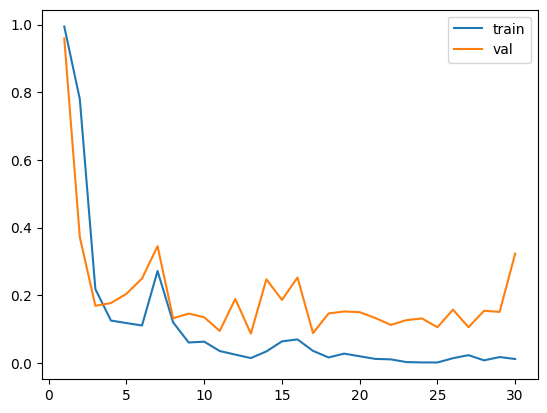

100%|██████████| 125/125 [00:01<00:00, 90.07it/s]


accuracy:0.688, precision:1.0, recall:0.064, f1:0.12030075187969924
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 93.38it/s]


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 98.24it/s] 


accuracy:0.6906666666666667, precision:1.0, recall:0.072, f1:0.1343283582089552
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


accuracy:0.696, precision:1.0, recall:0.088, f1:0.16176470588235292
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.696, precision:1.0, recall:0.088, f1:0.16176470588235292
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.6933333333333334, precision:0.9166666666666666, recall:0.088, f1:0.16058394160583941
Current threshold:0.07, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.6933333333333334, precision:0.9166666666666666, recall:0.088, f1:0.16058394160583941
Current threshold:0.08, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 102.07it/s]


accuracy:0.6933333333333334, precision:0.9166666666666666, recall:0.088, f1:0.16058394160583941
Current threshold:0.09, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.6933333333333334, precision:0.9166666666666666, recall:0.088, f1:0.16058394160583941
Current threshold:0.09999999999999999, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 101.93it/s]


accuracy:0.696, precision:0.9230769230769231, recall:0.096, f1:0.17391304347826086
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 92.83it/s]


accuracy:0.6986666666666667, precision:0.9285714285714286, recall:0.104, f1:0.1870503597122302
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:01<00:00, 93.47it/s]


accuracy:0.6986666666666667, precision:0.9285714285714286, recall:0.104, f1:0.1870503597122302
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:01<00:00, 95.07it/s]


accuracy:0.6986666666666667, precision:0.9285714285714286, recall:0.104, f1:0.1870503597122302
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:01<00:00, 95.10it/s]


accuracy:0.7013333333333334, precision:0.9333333333333333, recall:0.112, f1:0.19999999999999998
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 99.75it/s]


accuracy:0.704, precision:0.9375, recall:0.12, f1:0.21276595744680846
Current threshold:0.16, Best threshold:0.1500


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.704, precision:0.9375, recall:0.12, f1:0.21276595744680846
Current threshold:0.17, Best threshold:0.1600


100%|██████████| 125/125 [00:01<00:00, 101.35it/s]


accuracy:0.7093333333333334, precision:0.9444444444444444, recall:0.136, f1:0.2377622377622378
Current threshold:0.18000000000000002, Best threshold:0.1700


100%|██████████| 125/125 [00:01<00:00, 101.10it/s]


accuracy:0.7093333333333334, precision:0.9444444444444444, recall:0.136, f1:0.2377622377622378
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 100.68it/s]


accuracy:0.7093333333333334, precision:0.9444444444444444, recall:0.136, f1:0.2377622377622378
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.712, precision:0.9473684210526315, recall:0.144, f1:0.25
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 101.20it/s]


accuracy:0.712, precision:0.9473684210526315, recall:0.144, f1:0.25
Current threshold:0.22000000000000006, Best threshold:0.2100


100%|██████████| 125/125 [00:01<00:00, 95.95it/s]


accuracy:0.7093333333333334, precision:0.9, recall:0.144, f1:0.24827586206896549
Current threshold:0.23000000000000007, Best threshold:0.2100


100%|██████████| 125/125 [00:01<00:00, 86.90it/s]


accuracy:0.7093333333333334, precision:0.9, recall:0.144, f1:0.24827586206896549
Current threshold:0.24000000000000007, Best threshold:0.2100


100%|██████████| 125/125 [00:01<00:00, 93.92it/s]


accuracy:0.712, precision:0.9047619047619048, recall:0.152, f1:0.2602739726027397
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 91.22it/s]


accuracy:0.712, precision:0.9047619047619048, recall:0.152, f1:0.2602739726027397
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:01<00:00, 99.88it/s] 


accuracy:0.712, precision:0.9047619047619048, recall:0.152, f1:0.2602739726027397
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:01<00:00, 101.39it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.2800000000000001, Best threshold:0.2700


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:01<00:00, 100.69it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:01<00:00, 101.66it/s]


accuracy:0.7146666666666667, precision:0.9090909090909091, recall:0.16, f1:0.27210884353741494
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:01<00:00, 98.92it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:01<00:00, 89.00it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:01<00:00, 90.18it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:01<00:00, 89.39it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.7173333333333334, precision:0.9130434782608695, recall:0.168, f1:0.28378378378378377
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:01<00:00, 100.91it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:01<00:00, 99.52it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:01<00:00, 100.78it/s]


accuracy:0.72, precision:0.9166666666666666, recall:0.176, f1:0.29530201342281875
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 101.97it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.4400000000000002, Best threshold:0.4300


100%|██████████| 125/125 [00:01<00:00, 100.70it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.45000000000000023, Best threshold:0.4400


100%|██████████| 125/125 [00:01<00:00, 92.02it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:01<00:00, 88.55it/s]


accuracy:0.7226666666666667, precision:0.92, recall:0.184, f1:0.30666666666666664
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:01<00:00, 89.97it/s]


accuracy:0.7253333333333334, precision:0.9230769230769231, recall:0.192, f1:0.31788079470198677
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:01<00:00, 100.23it/s]


accuracy:0.7253333333333334, precision:0.9230769230769231, recall:0.192, f1:0.31788079470198677
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:01<00:00, 101.89it/s]


accuracy:0.7253333333333334, precision:0.9230769230769231, recall:0.192, f1:0.31788079470198677
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:01<00:00, 101.69it/s]


accuracy:0.728, precision:0.896551724137931, recall:0.208, f1:0.33766233766233766
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 101.10it/s]


accuracy:0.7306666666666667, precision:0.9, recall:0.216, f1:0.3483870967741935
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:01<00:00, 100.82it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:01<00:00, 91.07it/s]


accuracy:0.7333333333333333, precision:0.9032258064516129, recall:0.224, f1:0.358974358974359
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:01<00:00, 91.37it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 94.24it/s]


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 97.26it/s] 


accuracy:0.736, precision:0.90625, recall:0.232, f1:0.3694267515923567
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:01<00:00, 100.94it/s]


accuracy:0.7306666666666667, precision:0.8529411764705882, recall:0.232, f1:0.36477987421383645
Current threshold:0.6100000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.7333333333333333, precision:0.8571428571428571, recall:0.24, f1:0.375
Current threshold:0.6200000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:01<00:00, 101.50it/s]


accuracy:0.736, precision:0.8611111111111112, recall:0.248, f1:0.38509316770186336
Current threshold:0.6300000000000003, Best threshold:0.6200


100%|██████████| 125/125 [00:01<00:00, 101.06it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:01<00:00, 100.74it/s]


accuracy:0.7413333333333333, precision:0.868421052631579, recall:0.264, f1:0.4049079754601227
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:01<00:00, 100.79it/s]


accuracy:0.7386666666666667, precision:0.8461538461538461, recall:0.264, f1:0.402439024390244
Current threshold:0.6600000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:01<00:00, 101.04it/s]


accuracy:0.7413333333333333, precision:0.85, recall:0.272, f1:0.41212121212121217
Current threshold:0.6700000000000004, Best threshold:0.6600


100%|██████████| 125/125 [00:01<00:00, 94.52it/s]


accuracy:0.7413333333333333, precision:0.85, recall:0.272, f1:0.41212121212121217
Current threshold:0.6800000000000004, Best threshold:0.6700


100%|██████████| 125/125 [00:01<00:00, 92.08it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:01<00:00, 95.83it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:01<00:00, 95.52it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:01<00:00, 100.02it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7200000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:01<00:00, 101.19it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7300000000000004, Best threshold:0.7200


100%|██████████| 125/125 [00:01<00:00, 101.12it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:01<00:00, 100.65it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.744, precision:0.8536585365853658, recall:0.28, f1:0.4216867469879518
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:01<00:00, 101.59it/s]


accuracy:0.7413333333333333, precision:0.8333333333333334, recall:0.28, f1:0.41916167664670667
Current threshold:0.7700000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:01<00:00, 101.85it/s]


accuracy:0.744, precision:0.8372093023255814, recall:0.288, f1:0.42857142857142855
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:01<00:00, 96.18it/s]


accuracy:0.744, precision:0.8372093023255814, recall:0.288, f1:0.42857142857142855
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:01<00:00, 90.83it/s]


accuracy:0.744, precision:0.8372093023255814, recall:0.288, f1:0.42857142857142855
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 85.71it/s]


accuracy:0.744, precision:0.8372093023255814, recall:0.288, f1:0.42857142857142855
Current threshold:0.8100000000000005, Best threshold:0.8000


100%|██████████| 125/125 [00:01<00:00, 91.62it/s]


accuracy:0.7466666666666667, precision:0.8409090909090909, recall:0.296, f1:0.4378698224852071
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 102.07it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.8300000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.8400000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 101.76it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.8500000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 101.68it/s]


accuracy:0.744, precision:0.8222222222222222, recall:0.296, f1:0.4352941176470588
Current threshold:0.8600000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 100.55it/s]


accuracy:0.744, precision:0.8085106382978723, recall:0.304, f1:0.4418604651162791
Current threshold:0.8700000000000006, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 100.42it/s]


accuracy:0.744, precision:0.8085106382978723, recall:0.304, f1:0.4418604651162791
Current threshold:0.8800000000000006, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 98.68it/s]


accuracy:0.7466666666666667, precision:0.8125, recall:0.312, f1:0.4508670520231214
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 95.57it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.9000000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 89.63it/s]


accuracy:0.744, precision:0.7959183673469388, recall:0.312, f1:0.44827586206896547
Current threshold:0.9100000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 88.62it/s]


accuracy:0.7466666666666667, precision:0.8, recall:0.32, f1:0.45714285714285713
Current threshold:0.9200000000000006, Best threshold:0.9100


100%|██████████| 125/125 [00:01<00:00, 95.77it/s]


accuracy:0.7466666666666667, precision:0.8, recall:0.32, f1:0.45714285714285713
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.7466666666666667, precision:0.8, recall:0.32, f1:0.45714285714285713
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:01<00:00, 100.36it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:01<00:00, 101.62it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:01<00:00, 101.72it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:01<00:00, 102.31it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 97.72it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:01<00:00, 91.33it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:1.0200000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:01<00:00, 94.27it/s]


accuracy:0.7493333333333333, precision:0.803921568627451, recall:0.328, f1:0.4659090909090909
Current threshold:1.0300000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 89.66it/s]


accuracy:0.7466666666666667, precision:0.7884615384615384, recall:0.328, f1:0.46327683615819215
Current threshold:1.0400000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 100.94it/s]


accuracy:0.7466666666666667, precision:0.7884615384615384, recall:0.328, f1:0.46327683615819215
Current threshold:1.0500000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.7466666666666667, precision:0.7884615384615384, recall:0.328, f1:0.46327683615819215
Current threshold:1.0600000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 100.59it/s]


accuracy:0.744, precision:0.7735849056603774, recall:0.328, f1:0.46067415730337075
Current threshold:1.0700000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 100.43it/s]


accuracy:0.744, precision:0.7735849056603774, recall:0.328, f1:0.46067415730337075
Current threshold:1.0800000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 101.01it/s]


accuracy:0.7466666666666667, precision:0.7777777777777778, recall:0.336, f1:0.46927374301675984
Current threshold:1.0900000000000007, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.7466666666666667, precision:0.7777777777777778, recall:0.336, f1:0.46927374301675984
Current threshold:1.1000000000000008, Best threshold:1.0200


100%|██████████| 125/125 [00:01<00:00, 100.60it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1100000000000008, Best threshold:1.1000


100%|██████████| 125/125 [00:01<00:00, 99.63it/s] 


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1200000000000008, Best threshold:1.1100


100%|██████████| 125/125 [00:01<00:00, 89.17it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1300000000000008, Best threshold:1.1200


100%|██████████| 125/125 [00:01<00:00, 92.61it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1400000000000008, Best threshold:1.1300


100%|██████████| 125/125 [00:01<00:00, 89.33it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:01<00:00, 96.16it/s] 


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 101.51it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1700000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 99.85it/s] 


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1800000000000008, Best threshold:1.1700


100%|██████████| 125/125 [00:01<00:00, 101.63it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.1900000000000008, Best threshold:1.1800


100%|██████████| 125/125 [00:01<00:00, 101.62it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.2000000000000008, Best threshold:1.1900


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.2100000000000009, Best threshold:1.2000


100%|██████████| 125/125 [00:01<00:00, 100.55it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.2200000000000009, Best threshold:1.2100


100%|██████████| 125/125 [00:01<00:00, 102.56it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:01<00:00, 87.72it/s]


accuracy:0.7493333333333333, precision:0.7719298245614035, recall:0.352, f1:0.48351648351648346
Current threshold:1.2400000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 90.82it/s]


accuracy:0.7466666666666667, precision:0.7586206896551724, recall:0.352, f1:0.4808743169398907
Current threshold:1.2500000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 89.11it/s]


accuracy:0.744, precision:0.7457627118644068, recall:0.352, f1:0.47826086956521735
Current threshold:1.260000000000001, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 99.00it/s] 


accuracy:0.7466666666666667, precision:0.75, recall:0.36, f1:0.48648648648648657
Current threshold:1.270000000000001, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.7493333333333333, precision:0.7540983606557377, recall:0.368, f1:0.4946236559139785
Current threshold:1.280000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.7493333333333333, precision:0.7540983606557377, recall:0.368, f1:0.4946236559139785
Current threshold:1.290000000000001, Best threshold:1.2800


100%|██████████| 125/125 [00:01<00:00, 99.87it/s]


accuracy:0.752, precision:0.7580645161290323, recall:0.376, f1:0.5026737967914439
Current threshold:1.300000000000001, Best threshold:1.2900


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.752, precision:0.7580645161290323, recall:0.376, f1:0.5026737967914439
Current threshold:1.310000000000001, Best threshold:1.3000


100%|██████████| 125/125 [00:01<00:00, 101.09it/s]


accuracy:0.752, precision:0.7580645161290323, recall:0.376, f1:0.5026737967914439
Current threshold:1.320000000000001, Best threshold:1.3100


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.752, precision:0.7580645161290323, recall:0.376, f1:0.5026737967914439
Current threshold:1.330000000000001, Best threshold:1.3200


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.752, precision:0.7580645161290323, recall:0.376, f1:0.5026737967914439
Current threshold:1.340000000000001, Best threshold:1.3300


100%|██████████| 125/125 [00:01<00:00, 94.22it/s]


accuracy:0.752, precision:0.7580645161290323, recall:0.376, f1:0.5026737967914439
Current threshold:1.350000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 87.41it/s]


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:1.360000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 91.66it/s]


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:1.370000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 95.92it/s] 


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:1.380000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:1.390000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:1.400000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 100.36it/s]


accuracy:0.7493333333333333, precision:0.746031746031746, recall:0.376, f1:0.5000000000000001
Current threshold:1.410000000000001, Best threshold:1.3400


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.752, precision:0.75, recall:0.384, f1:0.507936507936508
Current threshold:1.420000000000001, Best threshold:1.4100


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.752, precision:0.75, recall:0.384, f1:0.507936507936508
Current threshold:1.430000000000001, Best threshold:1.4200


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.7573333333333333, precision:0.7575757575757576, recall:0.4, f1:0.5235602094240838
Current threshold:1.440000000000001, Best threshold:1.4300


100%|██████████| 125/125 [00:01<00:00, 101.07it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.450000000000001, Best threshold:1.4400


100%|██████████| 125/125 [00:01<00:00, 91.80it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.460000000000001, Best threshold:1.4500


100%|██████████| 125/125 [00:01<00:00, 90.65it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.470000000000001, Best threshold:1.4600


100%|██████████| 125/125 [00:01<00:00, 94.20it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.480000000000001, Best threshold:1.4700


100%|██████████| 125/125 [00:01<00:00, 94.43it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.490000000000001, Best threshold:1.4800


100%|██████████| 125/125 [00:01<00:00, 102.27it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.500000000000001, Best threshold:1.4900


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.5100000000000011, Best threshold:1.5000


100%|██████████| 125/125 [00:01<00:00, 101.25it/s]


accuracy:0.76, precision:0.7611940298507462, recall:0.408, f1:0.53125
Current threshold:1.5200000000000011, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 100.55it/s]


accuracy:0.7573333333333333, precision:0.75, recall:0.408, f1:0.5284974093264249
Current threshold:1.5300000000000011, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 100.35it/s]


accuracy:0.7573333333333333, precision:0.75, recall:0.408, f1:0.5284974093264249
Current threshold:1.5400000000000011, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 100.72it/s]


accuracy:0.7573333333333333, precision:0.75, recall:0.408, f1:0.5284974093264249
Current threshold:1.5500000000000012, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 100.15it/s]


accuracy:0.7573333333333333, precision:0.75, recall:0.408, f1:0.5284974093264249
Current threshold:1.5600000000000012, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 98.38it/s]


accuracy:0.7573333333333333, precision:0.75, recall:0.408, f1:0.5284974093264249
Current threshold:1.5700000000000012, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 92.03it/s]


accuracy:0.7573333333333333, precision:0.75, recall:0.408, f1:0.5284974093264249
Current threshold:1.5800000000000012, Best threshold:1.5100


100%|██████████| 125/125 [00:01<00:00, 92.83it/s]


accuracy:0.76, precision:0.7536231884057971, recall:0.416, f1:0.5360824742268041
Current threshold:1.5900000000000012, Best threshold:1.5800


100%|██████████| 125/125 [00:01<00:00, 91.93it/s]


accuracy:0.76, precision:0.7536231884057971, recall:0.416, f1:0.5360824742268041
Current threshold:1.6000000000000012, Best threshold:1.5900


100%|██████████| 125/125 [00:01<00:00, 94.73it/s]


accuracy:0.7626666666666667, precision:0.7571428571428571, recall:0.424, f1:0.5435897435897435
Current threshold:1.6100000000000012, Best threshold:1.6000


100%|██████████| 125/125 [00:01<00:00, 101.05it/s]


accuracy:0.7626666666666667, precision:0.7571428571428571, recall:0.424, f1:0.5435897435897435
Current threshold:1.6200000000000012, Best threshold:1.6100


100%|██████████| 125/125 [00:01<00:00, 100.18it/s]


accuracy:0.76, precision:0.7464788732394366, recall:0.424, f1:0.5408163265306122
Current threshold:1.6300000000000012, Best threshold:1.6100


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.7626666666666667, precision:0.75, recall:0.432, f1:0.5482233502538072
Current threshold:1.6400000000000012, Best threshold:1.6300


100%|██████████| 125/125 [00:01<00:00, 101.26it/s]


accuracy:0.7626666666666667, precision:0.75, recall:0.432, f1:0.5482233502538072
Current threshold:1.6500000000000012, Best threshold:1.6400


100%|██████████| 125/125 [00:01<00:00, 100.95it/s]


accuracy:0.7626666666666667, precision:0.75, recall:0.432, f1:0.5482233502538072
Current threshold:1.6600000000000013, Best threshold:1.6500


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.7626666666666667, precision:0.75, recall:0.432, f1:0.5482233502538072
Current threshold:1.6700000000000013, Best threshold:1.6600


100%|██████████| 125/125 [00:01<00:00, 100.58it/s]


accuracy:0.7626666666666667, precision:0.75, recall:0.432, f1:0.5482233502538072
Current threshold:1.6800000000000013, Best threshold:1.6700


100%|██████████| 125/125 [00:01<00:00, 93.26it/s]


accuracy:0.768, precision:0.7567567567567568, recall:0.448, f1:0.5628140703517588
Current threshold:1.6900000000000013, Best threshold:1.6800


100%|██████████| 125/125 [00:01<00:00, 94.76it/s]


accuracy:0.7706666666666667, precision:0.76, recall:0.456, f1:0.5700000000000001
Current threshold:1.7000000000000013, Best threshold:1.6900


100%|██████████| 125/125 [00:01<00:00, 95.72it/s]


accuracy:0.7706666666666667, precision:0.76, recall:0.456, f1:0.5700000000000001
Current threshold:1.7100000000000013, Best threshold:1.7000


100%|██████████| 125/125 [00:01<00:00, 94.71it/s]


accuracy:0.7706666666666667, precision:0.76, recall:0.456, f1:0.5700000000000001
Current threshold:1.7200000000000013, Best threshold:1.7100


100%|██████████| 125/125 [00:01<00:00, 100.73it/s]


accuracy:0.7733333333333333, precision:0.7631578947368421, recall:0.464, f1:0.5771144278606964
Current threshold:1.7300000000000013, Best threshold:1.7200


100%|██████████| 125/125 [00:01<00:00, 101.32it/s]


accuracy:0.7733333333333333, precision:0.7631578947368421, recall:0.464, f1:0.5771144278606964
Current threshold:1.7400000000000013, Best threshold:1.7300


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.7733333333333333, precision:0.7631578947368421, recall:0.464, f1:0.5771144278606964
Current threshold:1.7500000000000013, Best threshold:1.7400


100%|██████████| 125/125 [00:01<00:00, 101.16it/s]


accuracy:0.7733333333333333, precision:0.7631578947368421, recall:0.464, f1:0.5771144278606964
Current threshold:1.7600000000000013, Best threshold:1.7500


100%|██████████| 125/125 [00:01<00:00, 99.74it/s] 


accuracy:0.7733333333333333, precision:0.7631578947368421, recall:0.464, f1:0.5771144278606964
Current threshold:1.7700000000000014, Best threshold:1.7600


100%|██████████| 125/125 [00:01<00:00, 101.47it/s]


accuracy:0.7733333333333333, precision:0.7631578947368421, recall:0.464, f1:0.5771144278606964
Current threshold:1.7800000000000014, Best threshold:1.7700


100%|██████████| 125/125 [00:01<00:00, 101.98it/s]


accuracy:0.776, precision:0.7662337662337663, recall:0.472, f1:0.5841584158415841
Current threshold:1.7900000000000014, Best threshold:1.7800


100%|██████████| 125/125 [00:01<00:00, 97.25it/s]


accuracy:0.776, precision:0.7662337662337663, recall:0.472, f1:0.5841584158415841
Current threshold:1.8000000000000014, Best threshold:1.7900


100%|██████████| 125/125 [00:01<00:00, 88.05it/s]


accuracy:0.7786666666666666, precision:0.7692307692307693, recall:0.48, f1:0.5911330049261084
Current threshold:1.8100000000000014, Best threshold:1.8000


100%|██████████| 125/125 [00:01<00:00, 90.13it/s]


accuracy:0.7813333333333333, precision:0.7721518987341772, recall:0.488, f1:0.5980392156862745
Current threshold:1.8200000000000014, Best threshold:1.8100


100%|██████████| 125/125 [00:01<00:00, 91.25it/s]


accuracy:0.7813333333333333, precision:0.7721518987341772, recall:0.488, f1:0.5980392156862745
Current threshold:1.8300000000000014, Best threshold:1.8200


100%|██████████| 125/125 [00:01<00:00, 101.36it/s]


accuracy:0.7813333333333333, precision:0.7654320987654321, recall:0.496, f1:0.6019417475728156
Current threshold:1.8400000000000014, Best threshold:1.8300


100%|██████████| 125/125 [00:01<00:00, 99.85it/s] 


accuracy:0.7813333333333333, precision:0.7654320987654321, recall:0.496, f1:0.6019417475728156
Current threshold:1.8500000000000014, Best threshold:1.8400


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.784, precision:0.7682926829268293, recall:0.504, f1:0.6086956521739131
Current threshold:1.8600000000000014, Best threshold:1.8500


100%|██████████| 125/125 [00:01<00:00, 100.05it/s]


accuracy:0.784, precision:0.7682926829268293, recall:0.504, f1:0.6086956521739131
Current threshold:1.8700000000000014, Best threshold:1.8600


100%|██████████| 125/125 [00:01<00:00, 101.01it/s]


accuracy:0.784, precision:0.7682926829268293, recall:0.504, f1:0.6086956521739131
Current threshold:1.8800000000000014, Best threshold:1.8700


100%|██████████| 125/125 [00:01<00:00, 101.61it/s]


accuracy:0.784, precision:0.7682926829268293, recall:0.504, f1:0.6086956521739131
Current threshold:1.8900000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 101.93it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9000000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 98.00it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9100000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 89.15it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9200000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 87.59it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9300000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 92.45it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9400000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 101.31it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9500000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 101.42it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9600000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 101.50it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9700000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9800000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 100.09it/s]


accuracy:0.7813333333333333, precision:0.7590361445783133, recall:0.504, f1:0.6057692307692307
Current threshold:1.9900000000000015, Best threshold:1.8800


100%|██████████| 125/125 [00:01<00:00, 99.86it/s] 


accuracy:0.784, precision:0.7619047619047619, recall:0.512, f1:0.6124401913875599
Current threshold:2.0000000000000013, Best threshold:1.9900


100%|██████████| 125/125 [00:01<00:00, 101.16it/s]


accuracy:0.7866666666666666, precision:0.7647058823529411, recall:0.52, f1:0.6190476190476191
Current threshold:2.010000000000001, Best threshold:2.0000


100%|██████████| 125/125 [00:01<00:00, 99.34it/s]


accuracy:0.784, precision:0.7558139534883721, recall:0.52, f1:0.6161137440758294
Current threshold:2.020000000000001, Best threshold:2.0000


100%|██████████| 125/125 [00:01<00:00, 88.12it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.0300000000000007, Best threshold:2.0200


100%|██████████| 125/125 [00:01<00:00, 92.87it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.0400000000000005, Best threshold:2.0300


100%|██████████| 125/125 [00:01<00:00, 91.19it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.0500000000000003, Best threshold:2.0400


100%|██████████| 125/125 [00:01<00:00, 98.00it/s] 


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.06, Best threshold:2.0500


100%|██████████| 125/125 [00:01<00:00, 101.42it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.07, Best threshold:2.0600


100%|██████████| 125/125 [00:01<00:00, 101.60it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.0799999999999996, Best threshold:2.0700


100%|██████████| 125/125 [00:01<00:00, 102.18it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.0899999999999994, Best threshold:2.0800


100%|██████████| 125/125 [00:01<00:00, 100.75it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.099999999999999, Best threshold:2.0900


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.109999999999999, Best threshold:2.1000


100%|██████████| 125/125 [00:01<00:00, 101.83it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.1199999999999988, Best threshold:2.1100


100%|██████████| 125/125 [00:01<00:00, 101.00it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.1299999999999986, Best threshold:2.1200


100%|██████████| 125/125 [00:01<00:00, 92.15it/s]


accuracy:0.7866666666666666, precision:0.7586206896551724, recall:0.528, f1:0.6226415094339623
Current threshold:2.1399999999999983, Best threshold:2.1300


100%|██████████| 125/125 [00:01<00:00, 90.40it/s]


accuracy:0.7893333333333333, precision:0.7613636363636364, recall:0.536, f1:0.6291079812206574
Current threshold:2.149999999999998, Best threshold:2.1400


100%|██████████| 125/125 [00:01<00:00, 90.69it/s]


accuracy:0.7893333333333333, precision:0.7613636363636364, recall:0.536, f1:0.6291079812206574
Current threshold:2.159999999999998, Best threshold:2.1500


100%|██████████| 125/125 [00:01<00:00, 95.48it/s] 


accuracy:0.792, precision:0.7640449438202247, recall:0.544, f1:0.6355140186915887
Current threshold:2.1699999999999977, Best threshold:2.1600


100%|██████████| 125/125 [00:01<00:00, 101.10it/s]


accuracy:0.792, precision:0.7640449438202247, recall:0.544, f1:0.6355140186915887
Current threshold:2.1799999999999975, Best threshold:2.1700


100%|██████████| 125/125 [00:01<00:00, 102.00it/s]


accuracy:0.792, precision:0.7640449438202247, recall:0.544, f1:0.6355140186915887
Current threshold:2.1899999999999973, Best threshold:2.1800


100%|██████████| 125/125 [00:01<00:00, 100.94it/s]


accuracy:0.792, precision:0.7640449438202247, recall:0.544, f1:0.6355140186915887
Current threshold:2.199999999999997, Best threshold:2.1900


100%|██████████| 125/125 [00:01<00:00, 101.06it/s]


accuracy:0.7946666666666666, precision:0.7666666666666667, recall:0.552, f1:0.6418604651162791
Current threshold:2.209999999999997, Best threshold:2.2000


100%|██████████| 125/125 [00:01<00:00, 101.89it/s]


accuracy:0.7946666666666666, precision:0.7666666666666667, recall:0.552, f1:0.6418604651162791
Current threshold:2.2199999999999966, Best threshold:2.2100


100%|██████████| 125/125 [00:01<00:00, 99.35it/s]


accuracy:0.792, precision:0.7582417582417582, recall:0.552, f1:0.638888888888889
Current threshold:2.2299999999999964, Best threshold:2.2100


100%|██████████| 125/125 [00:01<00:00, 101.65it/s]


accuracy:0.7946666666666666, precision:0.7608695652173914, recall:0.56, f1:0.6451612903225807
Current threshold:2.239999999999996, Best threshold:2.2300


100%|██████████| 125/125 [00:01<00:00, 95.57it/s]


accuracy:0.7946666666666666, precision:0.7608695652173914, recall:0.56, f1:0.6451612903225807
Current threshold:2.249999999999996, Best threshold:2.2400


100%|██████████| 125/125 [00:01<00:00, 89.85it/s]


accuracy:0.7946666666666666, precision:0.7608695652173914, recall:0.56, f1:0.6451612903225807
Current threshold:2.259999999999996, Best threshold:2.2500


100%|██████████| 125/125 [00:01<00:00, 90.84it/s]


accuracy:0.7946666666666666, precision:0.7608695652173914, recall:0.56, f1:0.6451612903225807
Current threshold:2.2699999999999956, Best threshold:2.2600


100%|██████████| 125/125 [00:01<00:00, 92.28it/s]


accuracy:0.7946666666666666, precision:0.7608695652173914, recall:0.56, f1:0.6451612903225807
Current threshold:2.2799999999999954, Best threshold:2.2700


100%|██████████| 125/125 [00:01<00:00, 101.34it/s]


accuracy:0.7946666666666666, precision:0.7608695652173914, recall:0.56, f1:0.6451612903225807
Current threshold:2.289999999999995, Best threshold:2.2800


100%|██████████| 125/125 [00:01<00:00, 99.62it/s] 


accuracy:0.7973333333333333, precision:0.7634408602150538, recall:0.568, f1:0.6513761467889908
Current threshold:2.299999999999995, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.63it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.3099999999999947, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.22it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.3199999999999945, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 100.93it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.3299999999999943, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.53it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.339999999999994, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.82it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.349999999999994, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 95.94it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.3599999999999937, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 95.22it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.3699999999999934, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 89.75it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.3799999999999932, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 92.11it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.389999999999993, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 100.56it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.399999999999993, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.50it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.4099999999999926, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 100.01it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.4199999999999924, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.429999999999992, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.66it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.439999999999992, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.79it/s]


accuracy:0.7946666666666666, precision:0.7553191489361702, recall:0.568, f1:0.6484018264840182
Current threshold:2.4499999999999917, Best threshold:2.2900


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.4599999999999915, Best threshold:2.4500


100%|██████████| 125/125 [00:01<00:00, 99.31it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.4699999999999913, Best threshold:2.4600


100%|██████████| 125/125 [00:01<00:00, 90.93it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.479999999999991, Best threshold:2.4700


100%|██████████| 125/125 [00:01<00:00, 91.98it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.489999999999991, Best threshold:2.4800


100%|██████████| 125/125 [00:01<00:00, 90.58it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.4999999999999907, Best threshold:2.4900


100%|██████████| 125/125 [00:01<00:00, 95.64it/s] 


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.5099999999999905, Best threshold:2.5000


100%|██████████| 125/125 [00:01<00:00, 100.74it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.5199999999999902, Best threshold:2.5100


100%|██████████| 125/125 [00:01<00:00, 99.70it/s] 


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.52999999999999, Best threshold:2.5200


100%|██████████| 125/125 [00:01<00:00, 101.48it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.53999999999999, Best threshold:2.5300


100%|██████████| 125/125 [00:01<00:00, 101.27it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.5499999999999896, Best threshold:2.5400


100%|██████████| 125/125 [00:01<00:00, 100.52it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.5599999999999894, Best threshold:2.5500


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.7973333333333333, precision:0.7578947368421053, recall:0.576, f1:0.6545454545454545
Current threshold:2.569999999999989, Best threshold:2.5600


100%|██████████| 125/125 [00:01<00:00, 101.47it/s]


accuracy:0.8, precision:0.7604166666666666, recall:0.584, f1:0.6606334841628959
Current threshold:2.579999999999989, Best threshold:2.5700


100%|██████████| 125/125 [00:01<00:00, 88.17it/s]


accuracy:0.8026666666666666, precision:0.7628865979381443, recall:0.592, f1:0.6666666666666666
Current threshold:2.5899999999999888, Best threshold:2.5800


100%|██████████| 125/125 [00:01<00:00, 90.45it/s]


accuracy:0.8026666666666666, precision:0.7628865979381443, recall:0.592, f1:0.6666666666666666
Current threshold:2.5999999999999885, Best threshold:2.5900


100%|██████████| 125/125 [00:01<00:00, 96.48it/s]


accuracy:0.808, precision:0.7676767676767676, recall:0.608, f1:0.6785714285714285
Current threshold:2.6099999999999883, Best threshold:2.6000


100%|██████████| 125/125 [00:01<00:00, 94.66it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.619999999999988, Best threshold:2.6100


100%|██████████| 125/125 [00:01<00:00, 101.09it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.629999999999988, Best threshold:2.6200


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.6399999999999877, Best threshold:2.6300


100%|██████████| 125/125 [00:01<00:00, 101.26it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.6499999999999875, Best threshold:2.6400


100%|██████████| 125/125 [00:01<00:00, 100.59it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.6599999999999873, Best threshold:2.6500


100%|██████████| 125/125 [00:01<00:00, 100.20it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.669999999999987, Best threshold:2.6600


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.679999999999987, Best threshold:2.6700


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.8106666666666666, precision:0.77, recall:0.616, f1:0.6844444444444444
Current threshold:2.6899999999999866, Best threshold:2.6800


100%|██████████| 125/125 [00:01<00:00, 97.13it/s]


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.6999999999999864, Best threshold:2.6900


100%|██████████| 125/125 [00:01<00:00, 93.64it/s]


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.709999999999986, Best threshold:2.7000


100%|██████████| 125/125 [00:01<00:00, 92.27it/s]


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.719999999999986, Best threshold:2.7100


100%|██████████| 125/125 [00:01<00:00, 88.97it/s]


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.7299999999999858, Best threshold:2.7200


100%|██████████| 125/125 [00:01<00:00, 100.92it/s]


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.7399999999999856, Best threshold:2.7300


100%|██████████| 125/125 [00:01<00:00, 99.92it/s] 


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.7499999999999853, Best threshold:2.7400


100%|██████████| 125/125 [00:01<00:00, 100.18it/s]


accuracy:0.8133333333333334, precision:0.7722772277227723, recall:0.624, f1:0.6902654867256638
Current threshold:2.759999999999985, Best threshold:2.7500


100%|██████████| 125/125 [00:01<00:00, 99.99it/s] 


accuracy:0.816, precision:0.7745098039215687, recall:0.632, f1:0.696035242290749
Current threshold:2.769999999999985, Best threshold:2.7600


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.816, precision:0.7745098039215687, recall:0.632, f1:0.696035242290749
Current threshold:2.7799999999999847, Best threshold:2.7700


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.8213333333333334, precision:0.7788461538461539, recall:0.648, f1:0.7074235807860262
Current threshold:2.7899999999999845, Best threshold:2.7800


100%|██████████| 125/125 [00:01<00:00, 100.76it/s]


accuracy:0.8213333333333334, precision:0.7788461538461539, recall:0.648, f1:0.7074235807860262
Current threshold:2.7999999999999843, Best threshold:2.7900


100%|██████████| 125/125 [00:01<00:00, 100.69it/s]


accuracy:0.8213333333333334, precision:0.7788461538461539, recall:0.648, f1:0.7074235807860262
Current threshold:2.809999999999984, Best threshold:2.8000


100%|██████████| 125/125 [00:01<00:00, 89.39it/s]


accuracy:0.824, precision:0.780952380952381, recall:0.656, f1:0.7130434782608696
Current threshold:2.819999999999984, Best threshold:2.8100


100%|██████████| 125/125 [00:01<00:00, 87.81it/s]


accuracy:0.824, precision:0.780952380952381, recall:0.656, f1:0.7130434782608696
Current threshold:2.8299999999999836, Best threshold:2.8200


100%|██████████| 125/125 [00:01<00:00, 91.21it/s]


accuracy:0.824, precision:0.780952380952381, recall:0.656, f1:0.7130434782608696
Current threshold:2.8399999999999834, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 98.41it/s] 


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:2.849999999999983, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.34it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:2.859999999999983, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:2.869999999999983, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:2.8799999999999826, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 100.36it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:2.8899999999999824, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.8213333333333334, precision:0.7735849056603774, recall:0.656, f1:0.7099567099567099
Current threshold:2.899999999999982, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 100.71it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:2.909999999999982, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.66it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:2.9199999999999817, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 90.87it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:2.9299999999999815, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 94.01it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:2.9399999999999813, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 88.83it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:2.949999999999981, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 91.55it/s]


accuracy:0.8186666666666667, precision:0.7663551401869159, recall:0.656, f1:0.7068965517241379
Current threshold:2.959999999999981, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 100.73it/s]


accuracy:0.8213333333333334, precision:0.7685185185185185, recall:0.664, f1:0.7124463519313305
Current threshold:2.9699999999999807, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.38it/s]


accuracy:0.8213333333333334, precision:0.7685185185185185, recall:0.664, f1:0.7124463519313305
Current threshold:2.9799999999999804, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 99.73it/s] 


accuracy:0.8213333333333334, precision:0.7685185185185185, recall:0.664, f1:0.7124463519313305
Current threshold:2.9899999999999802, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 99.57it/s]


accuracy:0.8213333333333334, precision:0.7685185185185185, recall:0.664, f1:0.7124463519313305
Current threshold:2.99999999999998, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.8213333333333334, precision:0.7685185185185185, recall:0.664, f1:0.7124463519313305
Current threshold:3.00999999999998, Best threshold:2.8300


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


lr=0.0001 and bc=32 results: [0.824, 0.780952380952381, 0.656, 0.7130434782608696]
Epoch 1/30, Train Loss: 0.9997176170349121, Val Loss: 0.9991129159927368
Epoch 2/30, Train Loss: 0.9983367145061492, Val Loss: 0.9968438386917114
Epoch 3/30, Train Loss: 0.9943143427371979, Val Loss: 0.9892767071723938
Epoch 4/30, Train Loss: 0.9813776612281799, Val Loss: 0.9663872838020324
Epoch 5/30, Train Loss: 0.9445258975028992, Val Loss: 0.9092702507972718
Epoch 6/30, Train Loss: 0.8609735250473023, Val Loss: 0.8011323690414429
Epoch 7/30, Train Loss: 0.7083110272884369, Val Loss: 0.6208119511604309
Epoch 8/30, Train Loss: 0.48398337960243226, Val Loss: 0.42359176874160764
Epoch 9/30, Train Loss: 0.3463239923119545, Val Loss: 0.3351225912570953
Epoch 10/30, Train Loss: 0.27545556277036665, Val Loss: 0.25845860242843627
Epoch 11/30, Train Loss: 0.21999903097748758, Val Loss: 0.22082564234733582
Epoch 12/30, Train Loss: 0.20641693621873855, Val Loss: 0.2128523036837578
Epoch 13/30, Train Loss: 0.1840

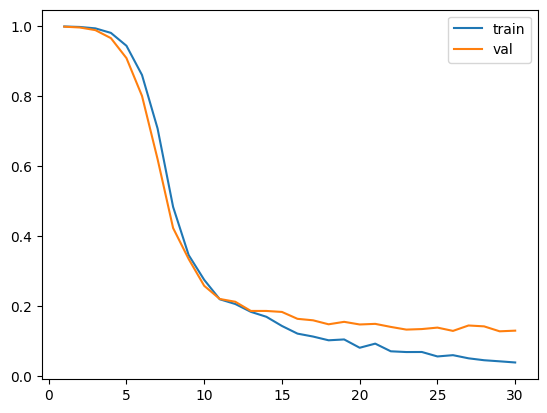

100%|██████████| 125/125 [00:01<00:00, 94.48it/s]


accuracy:0.696, precision:1.0, recall:0.088, f1:0.16176470588235292
Current threshold:0.02, Best threshold:0.0100


100%|██████████| 125/125 [00:01<00:00, 94.15it/s]


accuracy:0.6986666666666667, precision:1.0, recall:0.096, f1:0.1751824817518248
Current threshold:0.03, Best threshold:0.0200


100%|██████████| 125/125 [00:01<00:00, 101.02it/s]


accuracy:0.704, precision:1.0, recall:0.112, f1:0.2014388489208633
Current threshold:0.04, Best threshold:0.0300


100%|██████████| 125/125 [00:01<00:00, 101.92it/s]


accuracy:0.7146666666666667, precision:1.0, recall:0.144, f1:0.2517482517482518
Current threshold:0.05, Best threshold:0.0400


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.7173333333333334, precision:1.0, recall:0.152, f1:0.2638888888888889
Current threshold:0.060000000000000005, Best threshold:0.0500


100%|██████████| 125/125 [00:01<00:00, 101.81it/s]


accuracy:0.7173333333333334, precision:1.0, recall:0.152, f1:0.2638888888888889
Current threshold:0.07, Best threshold:0.0600


100%|██████████| 125/125 [00:01<00:00, 100.07it/s]


accuracy:0.7226666666666667, precision:1.0, recall:0.168, f1:0.28767123287671237
Current threshold:0.08, Best threshold:0.0700


100%|██████████| 125/125 [00:01<00:00, 99.92it/s] 


accuracy:0.7226666666666667, precision:1.0, recall:0.168, f1:0.28767123287671237
Current threshold:0.09, Best threshold:0.0800


100%|██████████| 125/125 [00:01<00:00, 101.31it/s]


accuracy:0.7253333333333334, precision:1.0, recall:0.176, f1:0.29931972789115646
Current threshold:0.09999999999999999, Best threshold:0.0900


100%|██████████| 125/125 [00:01<00:00, 94.11it/s]


accuracy:0.728, precision:1.0, recall:0.184, f1:0.3108108108108108
Current threshold:0.10999999999999999, Best threshold:0.1000


100%|██████████| 125/125 [00:01<00:00, 83.34it/s]


accuracy:0.7333333333333333, precision:0.9629629629629629, recall:0.208, f1:0.3421052631578947
Current threshold:0.11999999999999998, Best threshold:0.1100


100%|██████████| 125/125 [00:01<00:00, 91.77it/s]


accuracy:0.736, precision:0.9642857142857143, recall:0.216, f1:0.3529411764705882
Current threshold:0.12999999999999998, Best threshold:0.1200


100%|██████████| 125/125 [00:01<00:00, 94.92it/s]


accuracy:0.7386666666666667, precision:0.9655172413793104, recall:0.224, f1:0.36363636363636365
Current threshold:0.13999999999999999, Best threshold:0.1300


100%|██████████| 125/125 [00:01<00:00, 101.17it/s]


accuracy:0.744, precision:0.967741935483871, recall:0.24, f1:0.38461538461538464
Current threshold:0.15, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 100.46it/s]


accuracy:0.7413333333333333, precision:0.9117647058823529, recall:0.248, f1:0.38993710691823896
Current threshold:0.16, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.7413333333333333, precision:0.9117647058823529, recall:0.248, f1:0.38993710691823896
Current threshold:0.17, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 100.81it/s]


accuracy:0.7386666666666667, precision:0.8857142857142857, recall:0.248, f1:0.3875
Current threshold:0.18000000000000002, Best threshold:0.1400


100%|██████████| 125/125 [00:01<00:00, 101.34it/s]


accuracy:0.7466666666666667, precision:0.8947368421052632, recall:0.272, f1:0.4171779141104295
Current threshold:0.19000000000000003, Best threshold:0.1800


100%|██████████| 125/125 [00:01<00:00, 100.62it/s]


accuracy:0.752, precision:0.9, recall:0.288, f1:0.43636363636363634
Current threshold:0.20000000000000004, Best threshold:0.1900


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.752, precision:0.9, recall:0.288, f1:0.43636363636363634
Current threshold:0.21000000000000005, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 93.35it/s]


accuracy:0.7466666666666667, precision:0.8571428571428571, recall:0.288, f1:0.4311377245508982
Current threshold:0.22000000000000006, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 88.16it/s]


accuracy:0.7466666666666667, precision:0.8409090909090909, recall:0.296, f1:0.4378698224852071
Current threshold:0.23000000000000007, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 87.75it/s]


accuracy:0.7466666666666667, precision:0.8409090909090909, recall:0.296, f1:0.4378698224852071
Current threshold:0.24000000000000007, Best threshold:0.2000


100%|██████████| 125/125 [00:01<00:00, 90.95it/s]


accuracy:0.752, precision:0.8478260869565217, recall:0.312, f1:0.4561403508771929
Current threshold:0.25000000000000006, Best threshold:0.2400


100%|██████████| 125/125 [00:01<00:00, 101.02it/s]


accuracy:0.752, precision:0.8333333333333334, recall:0.32, f1:0.4624277456647399
Current threshold:0.26000000000000006, Best threshold:0.2500


100%|██████████| 125/125 [00:01<00:00, 99.47it/s] 


accuracy:0.752, precision:0.8333333333333334, recall:0.32, f1:0.4624277456647399
Current threshold:0.2700000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.7466666666666667, precision:0.8, recall:0.32, f1:0.45714285714285713
Current threshold:0.2800000000000001, Best threshold:0.2600


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.752, precision:0.8076923076923077, recall:0.336, f1:0.47457627118644063
Current threshold:0.2900000000000001, Best threshold:0.2800


100%|██████████| 125/125 [00:01<00:00, 101.46it/s]


accuracy:0.752, precision:0.8076923076923077, recall:0.336, f1:0.47457627118644063
Current threshold:0.3000000000000001, Best threshold:0.2900


100%|██████████| 125/125 [00:01<00:00, 100.68it/s]


accuracy:0.752, precision:0.7962962962962963, recall:0.344, f1:0.4804469273743017
Current threshold:0.3100000000000001, Best threshold:0.3000


100%|██████████| 125/125 [00:01<00:00, 99.03it/s] 


accuracy:0.76, precision:0.8070175438596491, recall:0.368, f1:0.5054945054945055
Current threshold:0.3200000000000001, Best threshold:0.3100


100%|██████████| 125/125 [00:01<00:00, 97.62it/s]


accuracy:0.7626666666666667, precision:0.8103448275862069, recall:0.376, f1:0.5136612021857924
Current threshold:0.3300000000000001, Best threshold:0.3200


100%|██████████| 125/125 [00:01<00:00, 89.17it/s]


accuracy:0.7626666666666667, precision:0.8103448275862069, recall:0.376, f1:0.5136612021857924
Current threshold:0.34000000000000014, Best threshold:0.3300


100%|██████████| 125/125 [00:01<00:00, 93.23it/s]


accuracy:0.7626666666666667, precision:0.8, recall:0.384, f1:0.518918918918919
Current threshold:0.35000000000000014, Best threshold:0.3400


100%|██████████| 125/125 [00:01<00:00, 96.42it/s]


accuracy:0.7653333333333333, precision:0.8032786885245902, recall:0.392, f1:0.5268817204301075
Current threshold:0.36000000000000015, Best threshold:0.3500


100%|██████████| 125/125 [00:01<00:00, 96.41it/s] 


accuracy:0.7653333333333333, precision:0.8032786885245902, recall:0.392, f1:0.5268817204301075
Current threshold:0.37000000000000016, Best threshold:0.3600


100%|██████████| 125/125 [00:01<00:00, 101.29it/s]


accuracy:0.768, precision:0.8064516129032258, recall:0.4, f1:0.53475935828877
Current threshold:0.38000000000000017, Best threshold:0.3700


100%|██████████| 125/125 [00:01<00:00, 100.24it/s]


accuracy:0.7733333333333333, precision:0.8125, recall:0.416, f1:0.5502645502645502
Current threshold:0.3900000000000002, Best threshold:0.3800


100%|██████████| 125/125 [00:01<00:00, 101.02it/s]


accuracy:0.7733333333333333, precision:0.8125, recall:0.416, f1:0.5502645502645502
Current threshold:0.4000000000000002, Best threshold:0.3900


100%|██████████| 125/125 [00:01<00:00, 101.96it/s]


accuracy:0.7733333333333333, precision:0.8125, recall:0.416, f1:0.5502645502645502
Current threshold:0.4100000000000002, Best threshold:0.4000


100%|██████████| 125/125 [00:01<00:00, 102.44it/s]


accuracy:0.7733333333333333, precision:0.8125, recall:0.416, f1:0.5502645502645502
Current threshold:0.4200000000000002, Best threshold:0.4100


100%|██████████| 125/125 [00:01<00:00, 101.31it/s]


accuracy:0.776, precision:0.8153846153846154, recall:0.424, f1:0.5578947368421053
Current threshold:0.4300000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 100.46it/s]


accuracy:0.7706666666666667, precision:0.7910447761194029, recall:0.424, f1:0.5520833333333333
Current threshold:0.4400000000000002, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 89.07it/s]


accuracy:0.7706666666666667, precision:0.782608695652174, recall:0.432, f1:0.5567010309278351
Current threshold:0.45000000000000023, Best threshold:0.4200


100%|██████████| 125/125 [00:01<00:00, 91.67it/s]


accuracy:0.776, precision:0.7887323943661971, recall:0.448, f1:0.5714285714285714
Current threshold:0.46000000000000024, Best threshold:0.4500


100%|██████████| 125/125 [00:01<00:00, 90.48it/s]


accuracy:0.776, precision:0.7887323943661971, recall:0.448, f1:0.5714285714285714
Current threshold:0.47000000000000025, Best threshold:0.4600


100%|██████████| 125/125 [00:01<00:00, 91.93it/s]


accuracy:0.776, precision:0.7887323943661971, recall:0.448, f1:0.5714285714285714
Current threshold:0.48000000000000026, Best threshold:0.4700


100%|██████████| 125/125 [00:01<00:00, 100.52it/s]


accuracy:0.7786666666666666, precision:0.7916666666666666, recall:0.456, f1:0.5786802030456852
Current threshold:0.49000000000000027, Best threshold:0.4800


100%|██████████| 125/125 [00:01<00:00, 100.57it/s]


accuracy:0.7786666666666666, precision:0.7916666666666666, recall:0.456, f1:0.5786802030456852
Current threshold:0.5000000000000002, Best threshold:0.4900


100%|██████████| 125/125 [00:01<00:00, 100.86it/s]


accuracy:0.7813333333333333, precision:0.7945205479452054, recall:0.464, f1:0.5858585858585859
Current threshold:0.5100000000000002, Best threshold:0.5000


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.7813333333333333, precision:0.7945205479452054, recall:0.464, f1:0.5858585858585859
Current threshold:0.5200000000000002, Best threshold:0.5100


100%|██████████| 125/125 [00:01<00:00, 101.34it/s]


accuracy:0.784, precision:0.7972972972972973, recall:0.472, f1:0.5929648241206029
Current threshold:0.5300000000000002, Best threshold:0.5200


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


accuracy:0.7946666666666666, precision:0.8076923076923077, recall:0.504, f1:0.6206896551724138
Current threshold:0.5400000000000003, Best threshold:0.5300


100%|██████████| 125/125 [00:01<00:00, 100.29it/s]


accuracy:0.7946666666666666, precision:0.8, recall:0.512, f1:0.624390243902439
Current threshold:0.5500000000000003, Best threshold:0.5400


100%|██████████| 125/125 [00:01<00:00, 90.12it/s]


accuracy:0.7946666666666666, precision:0.8, recall:0.512, f1:0.624390243902439
Current threshold:0.5600000000000003, Best threshold:0.5500


100%|██████████| 125/125 [00:01<00:00, 86.87it/s]


accuracy:0.7946666666666666, precision:0.8, recall:0.512, f1:0.624390243902439
Current threshold:0.5700000000000003, Best threshold:0.5600


100%|██████████| 125/125 [00:01<00:00, 88.57it/s]


accuracy:0.7946666666666666, precision:0.8, recall:0.512, f1:0.624390243902439
Current threshold:0.5800000000000003, Best threshold:0.5700


100%|██████████| 125/125 [00:01<00:00, 93.02it/s]


accuracy:0.8, precision:0.8048780487804879, recall:0.528, f1:0.6376811594202899
Current threshold:0.5900000000000003, Best threshold:0.5800


100%|██████████| 125/125 [00:01<00:00, 100.99it/s]


accuracy:0.8, precision:0.8048780487804879, recall:0.528, f1:0.6376811594202899
Current threshold:0.6000000000000003, Best threshold:0.5900


100%|██████████| 125/125 [00:01<00:00, 101.31it/s]


accuracy:0.8, precision:0.8048780487804879, recall:0.528, f1:0.6376811594202899
Current threshold:0.6100000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.7973333333333333, precision:0.7951807228915663, recall:0.528, f1:0.6346153846153846
Current threshold:0.6200000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:01<00:00, 101.40it/s]


accuracy:0.7973333333333333, precision:0.7951807228915663, recall:0.528, f1:0.6346153846153846
Current threshold:0.6300000000000003, Best threshold:0.6000


100%|██████████| 125/125 [00:01<00:00, 101.64it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:0.6400000000000003, Best threshold:0.6300


100%|██████████| 125/125 [00:01<00:00, 101.13it/s]


accuracy:0.8, precision:0.7976190476190477, recall:0.536, f1:0.6411483253588517
Current threshold:0.6500000000000004, Best threshold:0.6400


100%|██████████| 125/125 [00:01<00:00, 100.28it/s]


accuracy:0.8026666666666666, precision:0.8, recall:0.544, f1:0.6476190476190476
Current threshold:0.6600000000000004, Best threshold:0.6500


100%|██████████| 125/125 [00:01<00:00, 92.83it/s]


accuracy:0.8026666666666666, precision:0.8, recall:0.544, f1:0.6476190476190476
Current threshold:0.6700000000000004, Best threshold:0.6600


100%|██████████| 125/125 [00:01<00:00, 87.42it/s]


accuracy:0.8026666666666666, precision:0.8, recall:0.544, f1:0.6476190476190476
Current threshold:0.6800000000000004, Best threshold:0.6700


100%|██████████| 125/125 [00:01<00:00, 92.08it/s]


accuracy:0.8053333333333333, precision:0.7954545454545454, recall:0.56, f1:0.6572769953051644
Current threshold:0.6900000000000004, Best threshold:0.6800


100%|██████████| 125/125 [00:01<00:00, 91.17it/s]


accuracy:0.8053333333333333, precision:0.7954545454545454, recall:0.56, f1:0.6572769953051644
Current threshold:0.7000000000000004, Best threshold:0.6900


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.7100000000000004, Best threshold:0.7000


100%|██████████| 125/125 [00:01<00:00, 99.26it/s] 


accuracy:0.808, precision:0.797752808988764, recall:0.568, f1:0.6635514018691588
Current threshold:0.7200000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:01<00:00, 99.68it/s]


accuracy:0.8053333333333333, precision:0.7888888888888889, recall:0.568, f1:0.6604651162790697
Current threshold:0.7300000000000004, Best threshold:0.7100


100%|██████████| 125/125 [00:01<00:00, 100.04it/s]


accuracy:0.808, precision:0.7849462365591398, recall:0.584, f1:0.6697247706422018
Current threshold:0.7400000000000004, Best threshold:0.7300


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.808, precision:0.7849462365591398, recall:0.584, f1:0.6697247706422018
Current threshold:0.7500000000000004, Best threshold:0.7400


100%|██████████| 125/125 [00:01<00:00, 100.61it/s]


accuracy:0.8133333333333334, precision:0.7894736842105263, recall:0.6, f1:0.6818181818181819
Current threshold:0.7600000000000005, Best threshold:0.7500


100%|██████████| 125/125 [00:01<00:00, 100.54it/s]


accuracy:0.8213333333333334, precision:0.7959183673469388, recall:0.624, f1:0.6995515695067265
Current threshold:0.7700000000000005, Best threshold:0.7600


100%|██████████| 125/125 [00:01<00:00, 97.35it/s]


accuracy:0.824, precision:0.797979797979798, recall:0.632, f1:0.7053571428571429
Current threshold:0.7800000000000005, Best threshold:0.7700


100%|██████████| 125/125 [00:01<00:00, 94.25it/s]


accuracy:0.824, precision:0.797979797979798, recall:0.632, f1:0.7053571428571429
Current threshold:0.7900000000000005, Best threshold:0.7800


100%|██████████| 125/125 [00:01<00:00, 82.97it/s]


accuracy:0.8266666666666667, precision:0.8, recall:0.64, f1:0.7111111111111111
Current threshold:0.8000000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 91.85it/s]


accuracy:0.824, precision:0.7920792079207921, recall:0.64, f1:0.7079646017699115
Current threshold:0.8100000000000005, Best threshold:0.7900


100%|██████████| 125/125 [00:01<00:00, 96.41it/s] 


accuracy:0.8266666666666667, precision:0.7941176470588235, recall:0.648, f1:0.7136563876651983
Current threshold:0.8200000000000005, Best threshold:0.8100


100%|██████████| 125/125 [00:01<00:00, 100.84it/s]


accuracy:0.8266666666666667, precision:0.7941176470588235, recall:0.648, f1:0.7136563876651983
Current threshold:0.8300000000000005, Best threshold:0.8200


100%|██████████| 125/125 [00:01<00:00, 100.27it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:0.8400000000000005, Best threshold:0.8300


100%|██████████| 125/125 [00:01<00:00, 100.66it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:0.8500000000000005, Best threshold:0.8400


100%|██████████| 125/125 [00:01<00:00, 100.29it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:0.8600000000000005, Best threshold:0.8500


100%|██████████| 125/125 [00:01<00:00, 100.92it/s]


accuracy:0.8293333333333334, precision:0.7961165048543689, recall:0.656, f1:0.7192982456140351
Current threshold:0.8700000000000006, Best threshold:0.8600


100%|██████████| 125/125 [00:01<00:00, 100.88it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:0.8800000000000006, Best threshold:0.8700


100%|██████████| 125/125 [00:01<00:00, 100.07it/s]


accuracy:0.832, precision:0.7980769230769231, recall:0.664, f1:0.7248908296943232
Current threshold:0.8900000000000006, Best threshold:0.8800


100%|██████████| 125/125 [00:01<00:00, 93.72it/s]


accuracy:0.8373333333333334, precision:0.8018867924528302, recall:0.68, f1:0.735930735930736
Current threshold:0.9000000000000006, Best threshold:0.8900


100%|██████████| 125/125 [00:01<00:00, 95.07it/s]


accuracy:0.84, precision:0.8037383177570093, recall:0.688, f1:0.7413793103448275
Current threshold:0.9100000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:01<00:00, 95.90it/s]


accuracy:0.8373333333333334, precision:0.7962962962962963, recall:0.688, f1:0.7381974248927038
Current threshold:0.9200000000000006, Best threshold:0.9000


100%|██████████| 125/125 [00:01<00:00, 89.95it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:0.9300000000000006, Best threshold:0.9200


100%|██████████| 125/125 [00:01<00:00, 100.42it/s]


accuracy:0.84, precision:0.7981651376146789, recall:0.696, f1:0.7435897435897435
Current threshold:0.9400000000000006, Best threshold:0.9300


100%|██████████| 125/125 [00:01<00:00, 100.71it/s]


accuracy:0.8453333333333334, precision:0.8018018018018018, recall:0.712, f1:0.7542372881355933
Current threshold:0.9500000000000006, Best threshold:0.9400


100%|██████████| 125/125 [00:01<00:00, 100.59it/s]


accuracy:0.8453333333333334, precision:0.8018018018018018, recall:0.712, f1:0.7542372881355933
Current threshold:0.9600000000000006, Best threshold:0.9500


100%|██████████| 125/125 [00:01<00:00, 100.37it/s]


accuracy:0.8453333333333334, precision:0.8018018018018018, recall:0.712, f1:0.7542372881355933
Current threshold:0.9700000000000006, Best threshold:0.9600


100%|██████████| 125/125 [00:01<00:00, 100.06it/s]


accuracy:0.848, precision:0.8035714285714286, recall:0.72, f1:0.759493670886076
Current threshold:0.9800000000000006, Best threshold:0.9700


100%|██████████| 125/125 [00:01<00:00, 100.94it/s]


accuracy:0.848, precision:0.7982456140350878, recall:0.728, f1:0.7615062761506276
Current threshold:0.9900000000000007, Best threshold:0.9800


100%|██████████| 125/125 [00:01<00:00, 100.62it/s]


accuracy:0.8506666666666667, precision:0.8, recall:0.736, f1:0.7666666666666666
Current threshold:1.0000000000000007, Best threshold:0.9900


100%|██████████| 125/125 [00:01<00:00, 96.53it/s]


accuracy:0.8506666666666667, precision:0.8, recall:0.736, f1:0.7666666666666666
Current threshold:1.0100000000000007, Best threshold:1.0000


100%|██████████| 125/125 [00:01<00:00, 91.05it/s]


accuracy:0.8506666666666667, precision:0.8, recall:0.736, f1:0.7666666666666666
Current threshold:1.0200000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:01<00:00, 86.42it/s]


accuracy:0.848, precision:0.7931034482758621, recall:0.736, f1:0.7634854771784233
Current threshold:1.0300000000000007, Best threshold:1.0100


100%|██████████| 125/125 [00:01<00:00, 89.51it/s]


accuracy:0.8506666666666667, precision:0.7948717948717948, recall:0.744, f1:0.768595041322314
Current threshold:1.0400000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 98.43it/s] 


accuracy:0.848, precision:0.788135593220339, recall:0.744, f1:0.7654320987654322
Current threshold:1.0500000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 101.47it/s]


accuracy:0.8453333333333334, precision:0.7815126050420168, recall:0.744, f1:0.7622950819672131
Current threshold:1.0600000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 101.62it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:1.0700000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 100.33it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:1.0800000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 100.15it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:1.0900000000000007, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


accuracy:0.848, precision:0.7786885245901639, recall:0.76, f1:0.7692307692307693
Current threshold:1.1000000000000008, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 101.23it/s]


accuracy:0.8453333333333334, precision:0.7723577235772358, recall:0.76, f1:0.7661290322580646
Current threshold:1.1100000000000008, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 100.45it/s]


accuracy:0.8426666666666667, precision:0.7661290322580645, recall:0.76, f1:0.7630522088353414
Current threshold:1.1200000000000008, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 85.38it/s]


accuracy:0.848, precision:0.7698412698412699, recall:0.776, f1:0.7729083665338645
Current threshold:1.1300000000000008, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 91.84it/s]


accuracy:0.848, precision:0.7698412698412699, recall:0.776, f1:0.7729083665338645
Current threshold:1.1400000000000008, Best threshold:1.0300


100%|██████████| 125/125 [00:01<00:00, 91.04it/s]


accuracy:0.8506666666666667, precision:0.7716535433070866, recall:0.784, f1:0.7777777777777778
Current threshold:1.1500000000000008, Best threshold:1.1400


100%|██████████| 125/125 [00:01<00:00, 97.03it/s] 


accuracy:0.8533333333333334, precision:0.7734375, recall:0.792, f1:0.782608695652174
Current threshold:1.1600000000000008, Best threshold:1.1500


100%|██████████| 125/125 [00:01<00:00, 101.35it/s]


accuracy:0.8533333333333334, precision:0.7692307692307693, recall:0.8, f1:0.7843137254901961
Current threshold:1.1700000000000008, Best threshold:1.1600


100%|██████████| 125/125 [00:01<00:00, 101.15it/s]


accuracy:0.8533333333333334, precision:0.7692307692307693, recall:0.8, f1:0.7843137254901961
Current threshold:1.1800000000000008, Best threshold:1.1700


100%|██████████| 125/125 [00:01<00:00, 101.41it/s]


accuracy:0.8506666666666667, precision:0.7633587786259542, recall:0.8, f1:0.7812500000000001
Current threshold:1.1900000000000008, Best threshold:1.1700


100%|██████████| 125/125 [00:01<00:00, 100.96it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:1.2000000000000008, Best threshold:1.1900


100%|██████████| 125/125 [00:01<00:00, 101.34it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:1.2100000000000009, Best threshold:1.2000


100%|██████████| 125/125 [00:01<00:00, 101.17it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:1.2200000000000009, Best threshold:1.2100


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:1.2300000000000009, Best threshold:1.2200


100%|██████████| 125/125 [00:01<00:00, 93.35it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:1.2400000000000009, Best threshold:1.2300


100%|██████████| 125/125 [00:01<00:00, 87.52it/s]


accuracy:0.856, precision:0.7669172932330827, recall:0.816, f1:0.7906976744186045
Current threshold:1.2500000000000009, Best threshold:1.2400


100%|██████████| 125/125 [00:01<00:00, 93.72it/s]


accuracy:0.8586666666666667, precision:0.7686567164179104, recall:0.824, f1:0.7953667953667953
Current threshold:1.260000000000001, Best threshold:1.2500


100%|██████████| 125/125 [00:01<00:00, 90.21it/s]


accuracy:0.8586666666666667, precision:0.7686567164179104, recall:0.824, f1:0.7953667953667953
Current threshold:1.270000000000001, Best threshold:1.2600


100%|██████████| 125/125 [00:01<00:00, 99.61it/s] 


accuracy:0.8586666666666667, precision:0.7686567164179104, recall:0.824, f1:0.7953667953667953
Current threshold:1.280000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 100.74it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:1.290000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 101.54it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:1.300000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.856, precision:0.762962962962963, recall:0.824, f1:0.7923076923076923
Current threshold:1.310000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 100.86it/s]


accuracy:0.8506666666666667, precision:0.7518248175182481, recall:0.824, f1:0.7862595419847328
Current threshold:1.320000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 100.16it/s]


accuracy:0.8533333333333334, precision:0.75, recall:0.84, f1:0.7924528301886793
Current threshold:1.330000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.856, precision:0.75177304964539, recall:0.848, f1:0.7969924812030075
Current threshold:1.340000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 99.38it/s] 


accuracy:0.856, precision:0.75177304964539, recall:0.848, f1:0.7969924812030075
Current threshold:1.350000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 91.13it/s]


accuracy:0.856, precision:0.75177304964539, recall:0.848, f1:0.7969924812030075
Current threshold:1.360000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 91.66it/s]


accuracy:0.856, precision:0.7482517482517482, recall:0.856, f1:0.7985074626865671
Current threshold:1.370000000000001, Best threshold:1.2700


100%|██████████| 125/125 [00:01<00:00, 94.73it/s]


accuracy:0.8586666666666667, precision:0.75, recall:0.864, f1:0.8029739776951673
Current threshold:1.380000000000001, Best threshold:1.3700


100%|██████████| 125/125 [00:01<00:00, 91.48it/s]


accuracy:0.8586666666666667, precision:0.75, recall:0.864, f1:0.8029739776951673
Current threshold:1.390000000000001, Best threshold:1.3800


100%|██████████| 125/125 [00:01<00:00, 100.95it/s]


accuracy:0.8586666666666667, precision:0.75, recall:0.864, f1:0.8029739776951673
Current threshold:1.400000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.56it/s]


accuracy:0.856, precision:0.7448275862068966, recall:0.864, f1:0.7999999999999999
Current threshold:1.410000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.37it/s]


accuracy:0.856, precision:0.7448275862068966, recall:0.864, f1:0.7999999999999999
Current threshold:1.420000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.21it/s]


accuracy:0.8506666666666667, precision:0.7346938775510204, recall:0.864, f1:0.7941176470588235
Current threshold:1.430000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.21it/s]


accuracy:0.8506666666666667, precision:0.7346938775510204, recall:0.864, f1:0.7941176470588235
Current threshold:1.440000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.53it/s]


accuracy:0.848, precision:0.7297297297297297, recall:0.864, f1:0.7912087912087912
Current threshold:1.450000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.84it/s]


accuracy:0.848, precision:0.7297297297297297, recall:0.864, f1:0.7912087912087912
Current threshold:1.460000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 96.42it/s]


accuracy:0.848, precision:0.7297297297297297, recall:0.864, f1:0.7912087912087912
Current threshold:1.470000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 95.19it/s]


accuracy:0.8506666666666667, precision:0.7315436241610739, recall:0.872, f1:0.7956204379562044
Current threshold:1.480000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 93.19it/s]


accuracy:0.8506666666666667, precision:0.7315436241610739, recall:0.872, f1:0.7956204379562044
Current threshold:1.490000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.48it/s]


accuracy:0.8506666666666667, precision:0.7315436241610739, recall:0.872, f1:0.7956204379562044
Current threshold:1.500000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 94.48it/s]


accuracy:0.8426666666666667, precision:0.7171052631578947, recall:0.872, f1:0.7870036101083032
Current threshold:1.5100000000000011, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.81it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5200000000000011, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.15it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5300000000000011, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.78it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5400000000000011, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.33it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5500000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.62it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5600000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5700000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.33it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5800000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 95.97it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.5900000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 90.25it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.6000000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 92.38it/s]


accuracy:0.8373333333333334, precision:0.7077922077922078, recall:0.872, f1:0.7813620071684588
Current threshold:1.6100000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.93it/s]


accuracy:0.8346666666666667, precision:0.7032258064516129, recall:0.872, f1:0.7785714285714286
Current threshold:1.6200000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.56it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:1.6300000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.51it/s] 


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:1.6400000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.15it/s]


accuracy:0.8293333333333334, precision:0.6942675159235668, recall:0.872, f1:0.7730496453900708
Current threshold:1.6500000000000012, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.76it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.6600000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.75it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.6700000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.70it/s] 


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.6800000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.84it/s] 


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.6900000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 98.96it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7000000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.93it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7100000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.67it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7200000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.81it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7300000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.05it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7400000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.53it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7500000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 98.45it/s] 


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7600000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.50it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7700000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.74it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7800000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


accuracy:0.8346666666666667, precision:0.6981132075471698, recall:0.888, f1:0.7816901408450704
Current threshold:1.7900000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.26it/s]


accuracy:0.84, precision:0.7018633540372671, recall:0.904, f1:0.7902097902097903
Current threshold:1.8000000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.42it/s]


accuracy:0.84, precision:0.6993865030674846, recall:0.912, f1:0.7916666666666667
Current threshold:1.8100000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 92.99it/s]


accuracy:0.84, precision:0.6993865030674846, recall:0.912, f1:0.7916666666666667
Current threshold:1.8200000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 87.61it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8300000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.69it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8400000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.52it/s] 


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8500000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.65it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8600000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.74it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8700000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.21it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8800000000000014, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.8900000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.30it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.9000000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.16it/s]


accuracy:0.8373333333333334, precision:0.6951219512195121, recall:0.912, f1:0.7889273356401384
Current threshold:1.9100000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.00it/s]


accuracy:0.8346666666666667, precision:0.6909090909090909, recall:0.912, f1:0.7862068965517243
Current threshold:1.9200000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 94.62it/s]


accuracy:0.8346666666666667, precision:0.6909090909090909, recall:0.912, f1:0.7862068965517243
Current threshold:1.9300000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.17it/s]


accuracy:0.8346666666666667, precision:0.6909090909090909, recall:0.912, f1:0.7862068965517243
Current threshold:1.9400000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 94.32it/s]


accuracy:0.8373333333333334, precision:0.6927710843373494, recall:0.92, f1:0.7903780068728522
Current threshold:1.9500000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 94.63it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:1.9600000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 96.17it/s] 


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:1.9700000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.05it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:1.9800000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.37it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:1.9900000000000015, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.71it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:2.0000000000000013, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.52it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:2.010000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.80it/s]


accuracy:0.832, precision:0.6845238095238095, recall:0.92, f1:0.7849829351535835
Current threshold:2.020000000000001, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.18it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.0300000000000007, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.51it/s]


accuracy:0.8293333333333334, precision:0.6804733727810651, recall:0.92, f1:0.782312925170068
Current threshold:2.0400000000000005, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 95.00it/s]


accuracy:0.8346666666666667, precision:0.6842105263157895, recall:0.936, f1:0.7905405405405406
Current threshold:2.0500000000000003, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.53it/s]


accuracy:0.8373333333333334, precision:0.686046511627907, recall:0.944, f1:0.7946127946127945
Current threshold:2.06, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 92.68it/s]


accuracy:0.8373333333333334, precision:0.686046511627907, recall:0.944, f1:0.7946127946127945
Current threshold:2.07, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 92.30it/s]


accuracy:0.8346666666666667, precision:0.6820809248554913, recall:0.944, f1:0.7919463087248322
Current threshold:2.0799999999999996, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.94it/s]


accuracy:0.8346666666666667, precision:0.6820809248554913, recall:0.944, f1:0.7919463087248322
Current threshold:2.0899999999999994, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.14it/s]


accuracy:0.8346666666666667, precision:0.6820809248554913, recall:0.944, f1:0.7919463087248322
Current threshold:2.099999999999999, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.17it/s]


accuracy:0.8346666666666667, precision:0.6820809248554913, recall:0.944, f1:0.7919463087248322
Current threshold:2.109999999999999, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.86it/s]


accuracy:0.832, precision:0.6781609195402298, recall:0.944, f1:0.7892976588628762
Current threshold:2.1199999999999988, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.64it/s]


accuracy:0.832, precision:0.6781609195402298, recall:0.944, f1:0.7892976588628762
Current threshold:2.1299999999999986, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 102.02it/s]


accuracy:0.8293333333333334, precision:0.6742857142857143, recall:0.944, f1:0.7866666666666666
Current threshold:2.1399999999999983, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.18it/s]


accuracy:0.832, precision:0.6761363636363636, recall:0.952, f1:0.7906976744186045
Current threshold:2.149999999999998, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 96.32it/s]


accuracy:0.832, precision:0.6761363636363636, recall:0.952, f1:0.7906976744186045
Current threshold:2.159999999999998, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.09it/s]


accuracy:0.832, precision:0.6761363636363636, recall:0.952, f1:0.7906976744186045
Current threshold:2.1699999999999977, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 83.70it/s]


accuracy:0.832, precision:0.6761363636363636, recall:0.952, f1:0.7906976744186045
Current threshold:2.1799999999999975, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 93.48it/s]


accuracy:0.8293333333333334, precision:0.672316384180791, recall:0.952, f1:0.7880794701986755
Current threshold:2.1899999999999973, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.89it/s] 


accuracy:0.8293333333333334, precision:0.672316384180791, recall:0.952, f1:0.7880794701986755
Current threshold:2.199999999999997, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.23it/s]


accuracy:0.832, precision:0.6741573033707865, recall:0.96, f1:0.7920792079207921
Current threshold:2.209999999999997, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.40it/s]


accuracy:0.832, precision:0.6741573033707865, recall:0.96, f1:0.7920792079207921
Current threshold:2.2199999999999966, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.67it/s]


accuracy:0.832, precision:0.6741573033707865, recall:0.96, f1:0.7920792079207921
Current threshold:2.2299999999999964, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.03it/s]


accuracy:0.832, precision:0.6722222222222223, recall:0.968, f1:0.7934426229508197
Current threshold:2.239999999999996, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.89it/s] 


accuracy:0.832, precision:0.6722222222222223, recall:0.968, f1:0.7934426229508197
Current threshold:2.249999999999996, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.69it/s]


accuracy:0.8293333333333334, precision:0.6685082872928176, recall:0.968, f1:0.7908496732026142
Current threshold:2.259999999999996, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 98.76it/s]


accuracy:0.8293333333333334, precision:0.6685082872928176, recall:0.968, f1:0.7908496732026142
Current threshold:2.2699999999999956, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.85it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.2799999999999954, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 94.48it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.289999999999995, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 93.62it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.299999999999995, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.41it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.3099999999999947, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.36it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.3199999999999945, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.62it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.3299999999999943, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.86it/s] 


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.339999999999994, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.42it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.349999999999994, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.81it/s]


accuracy:0.832, precision:0.6703296703296703, recall:0.976, f1:0.7947882736156352
Current threshold:2.3599999999999937, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.62it/s]


accuracy:0.8293333333333334, precision:0.6666666666666666, recall:0.976, f1:0.7922077922077922
Current threshold:2.3699999999999934, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.24it/s]


accuracy:0.8293333333333334, precision:0.6666666666666666, recall:0.976, f1:0.7922077922077922
Current threshold:2.3799999999999932, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 95.48it/s]


accuracy:0.8266666666666667, precision:0.6630434782608695, recall:0.976, f1:0.7896440129449838
Current threshold:2.389999999999993, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 85.41it/s]


accuracy:0.824, precision:0.6594594594594595, recall:0.976, f1:0.7870967741935484
Current threshold:2.399999999999993, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.65it/s]


accuracy:0.824, precision:0.6594594594594595, recall:0.976, f1:0.7870967741935484
Current threshold:2.4099999999999926, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 92.73it/s]


accuracy:0.8266666666666667, precision:0.6612903225806451, recall:0.984, f1:0.7909967845659165
Current threshold:2.4199999999999924, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.32it/s] 


accuracy:0.824, precision:0.6577540106951871, recall:0.984, f1:0.7884615384615385
Current threshold:2.429999999999992, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.35it/s]


accuracy:0.8266666666666667, precision:0.6595744680851063, recall:0.992, f1:0.792332268370607
Current threshold:2.439999999999992, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.42it/s]


accuracy:0.824, precision:0.656084656084656, recall:0.992, f1:0.7898089171974522
Current threshold:2.4499999999999917, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.91it/s]


accuracy:0.824, precision:0.656084656084656, recall:0.992, f1:0.7898089171974522
Current threshold:2.4599999999999915, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.06it/s]


accuracy:0.8213333333333334, precision:0.6526315789473685, recall:0.992, f1:0.7873015873015874
Current threshold:2.4699999999999913, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.33it/s]


accuracy:0.8213333333333334, precision:0.6526315789473685, recall:0.992, f1:0.7873015873015874
Current threshold:2.479999999999991, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.28it/s]


accuracy:0.8213333333333334, precision:0.6526315789473685, recall:0.992, f1:0.7873015873015874
Current threshold:2.489999999999991, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 96.36it/s]


accuracy:0.8186666666666667, precision:0.6492146596858639, recall:0.992, f1:0.7848101265822784
Current threshold:2.4999999999999907, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 86.03it/s]


accuracy:0.8186666666666667, precision:0.6492146596858639, recall:0.992, f1:0.7848101265822784
Current threshold:2.5099999999999905, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 88.30it/s]


accuracy:0.8186666666666667, precision:0.6492146596858639, recall:0.992, f1:0.7848101265822784
Current threshold:2.5199999999999902, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 90.70it/s]


accuracy:0.8186666666666667, precision:0.6492146596858639, recall:0.992, f1:0.7848101265822784
Current threshold:2.52999999999999, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.74it/s] 


accuracy:0.8186666666666667, precision:0.6492146596858639, recall:0.992, f1:0.7848101265822784
Current threshold:2.53999999999999, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.46it/s]


accuracy:0.8186666666666667, precision:0.6476683937823834, recall:1.0, f1:0.7861635220125786
Current threshold:2.5499999999999896, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.11it/s]


accuracy:0.816, precision:0.6443298969072165, recall:1.0, f1:0.7836990595611286
Current threshold:2.5599999999999894, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.99it/s] 


accuracy:0.816, precision:0.6443298969072165, recall:1.0, f1:0.7836990595611286
Current threshold:2.569999999999989, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.30it/s] 


accuracy:0.8133333333333334, precision:0.6410256410256411, recall:1.0, f1:0.7812500000000001
Current threshold:2.579999999999989, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.57it/s] 


accuracy:0.8133333333333334, precision:0.6410256410256411, recall:1.0, f1:0.7812500000000001
Current threshold:2.5899999999999888, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.36it/s]


accuracy:0.8133333333333334, precision:0.6410256410256411, recall:1.0, f1:0.7812500000000001
Current threshold:2.5999999999999885, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.29it/s]


accuracy:0.8106666666666666, precision:0.6377551020408163, recall:1.0, f1:0.778816199376947
Current threshold:2.6099999999999883, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 92.76it/s]


accuracy:0.8106666666666666, precision:0.6377551020408163, recall:1.0, f1:0.778816199376947
Current threshold:2.619999999999988, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 87.35it/s]


accuracy:0.8106666666666666, precision:0.6377551020408163, recall:1.0, f1:0.778816199376947
Current threshold:2.629999999999988, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.66it/s]


accuracy:0.808, precision:0.6345177664974619, recall:1.0, f1:0.7763975155279503
Current threshold:2.6399999999999877, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 94.01it/s] 


accuracy:0.808, precision:0.6345177664974619, recall:1.0, f1:0.7763975155279503
Current threshold:2.6499999999999875, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.53it/s]


accuracy:0.808, precision:0.6345177664974619, recall:1.0, f1:0.7763975155279503
Current threshold:2.6599999999999873, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.02it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.669999999999987, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.10it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.679999999999987, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.04it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.6899999999999866, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.52it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.6999999999999864, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.97it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.709999999999986, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.18it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.719999999999986, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 93.02it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.7299999999999858, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 85.76it/s]


accuracy:0.8053333333333333, precision:0.6313131313131313, recall:1.0, f1:0.7739938080495355
Current threshold:2.7399999999999856, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 90.02it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.7499999999999853, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 90.90it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.759999999999985, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.39it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.769999999999985, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.06it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.7799999999999847, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.58it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.7899999999999845, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.78it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.7999999999999843, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.54it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.809999999999984, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.63it/s] 


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.819999999999984, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.17it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.8299999999999836, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 97.09it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.8399999999999834, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 89.43it/s]


accuracy:0.8026666666666666, precision:0.628140703517588, recall:1.0, f1:0.771604938271605
Current threshold:2.849999999999983, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 91.50it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:2.859999999999983, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 87.28it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:2.869999999999983, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.61it/s] 


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:2.8799999999999826, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.06it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:2.8899999999999824, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 98.89it/s] 


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:2.899999999999982, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.69it/s]


accuracy:0.8, precision:0.625, recall:1.0, f1:0.7692307692307693
Current threshold:2.909999999999982, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 99.53it/s] 


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.9199999999999817, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.31it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.9299999999999815, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.9399999999999813, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.82it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.949999999999981, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 90.57it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.959999999999981, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 88.58it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.9699999999999807, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 86.05it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.9799999999999804, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 95.74it/s] 


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.9899999999999802, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.56it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:2.99999999999998, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 100.25it/s]


accuracy:0.7973333333333333, precision:0.6218905472636815, recall:1.0, f1:0.7668711656441717
Current threshold:3.00999999999998, Best threshold:1.3900


100%|██████████| 125/125 [00:01<00:00, 101.39it/s]

lr=1e-05 and bc=32 results: [0.8586666666666667, 0.75, 0.864, 0.8029739776951673]


In [ ]:
alex_tune_results_triplet = gridsearch_alexnet_triplet(train_siamese_triplet_dataset, val_siamese_triplet_dataset, num_epochs=30, learning_rates=lr, batch_sizes=bc)

In [ ]:
alex_tune_results_triplet

{'lr=0.001 and bc=8': [0.7546666666666667,
  0.7704918032786885,
  0.376,
  0.5053763440860214],
 'lr=0.0001 and bc=8': [0.856, 0.7669172932330827, 0.816, 0.7906976744186045],
 'lr=1e-05 and bc=8': [0.8693333333333333,
  0.796875,
  0.816,
  0.8063241106719369],
 'lr=0.001 and bc=32': [0.8453333333333334, 0.8130841121495327, 0.696, 0.75],
 'lr=0.0001 and bc=32': [0.824, 0.780952380952381, 0.656, 0.7130434782608696],
 'lr=1e-05 and bc=32': [0.8586666666666667, 0.75, 0.864, 0.8029739776951673]}